In [1]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
import fsspec, os
import scipy as sp
import PIL
from PIL import Image
import random
import os
import glob
import re

In [2]:
# Parameters
state = None
selected_data_type = None
RESERVED_SHOT = None
EPOCH_NUM = None
VALIDATION_SPLIT = None
ACTIVATION_FUNC = None
LOSS_FUNC = None
OPTIMIZER_FUNC = None
OUTLIER_CUTOFF = None
NUM_CONV2D_LAYERS = None
NUM_DENSE_LAYERS = None
CONV2D_NEURONS = None
CONV2D_SIZE = None
DENSE_LAYER_NEURONS = None
MAX_POOLING_SIZE = None

In [3]:
# Parameters
state = 3
selected_data_type = "ma2"
RESERVED_SHOT = 119671
EPOCH_NUM = 50
VALIDATION_SPLIT = 0.15
ACTIVATION_FUNC = "relu"
LOSS_FUNC = "mse"
OPTIMIZER_FUNC = "sgd"
OUTLIER_CUTOFF = 80.0
NUM_CONV2D_LAYERS = 2
NUM_DENSE_LAYERS = 1
CONV2D_NEURONS = [64, 64]
CONV2D_SIZE = ["(7, 7)", "(4, 4)"]
DENSE_LAYER_NEURONS = [8]
MAX_POOLING_SIZE = "(4, 4)"


In [4]:
# Manual override logic
manual = False  # Toggle this to True to use manual values, False to skip

if manual:
    state = 3  # state 1, 2, or 3
    selected_data_type = 'ma2'  # ma2 basically always
    if state == 1:
        RESERVED_SHOT = 119671  # for state 1
    elif state == 2:
        RESERVED_SHOT = 114458  # for state 2
    else:
        RESERVED_SHOT = 119671  # Default for state 3 (choosing one from RESERVED_SHOTS[3])
    EPOCH_NUM = 15  # 15
    VALIDATION_SPLIT = 0.2  # 0.2
    ACTIVATION_FUNC = 'relu'  # 'relu'
    LOSS_FUNC = 'mae'  # 'mae'
    OPTIMIZER_FUNC = 'adam'  # 'adam'
    OUTLIER_CUTOFF = 99  # 99
    NUM_CONV2D_LAYERS = 2  # 2 Conv2D layers
    NUM_DENSE_LAYERS = 1  # 1 dense layer
    CONV2D_NEURONS = [16, 16]  # Neurons per Conv2D layer
    CONV2D_SIZE = [(8, 8), (8, 8)]  # Kernel sizes for Conv2D layers
    DENSE_LAYER_NEURONS = [10]  # Neurons for dense layer
    MAX_POOLING_SIZE = (4, 4)  # Max pooling size

    # Update parameters dictionary for Papermill
    parameters = {
        'state': state,
        'selected_data_type': selected_data_type,
        'RESERVED_SHOT': RESERVED_SHOT,
        'EPOCH_NUM': EPOCH_NUM,
        'VALIDATION_SPLIT': VALIDATION_SPLIT,
        'ACTIVATION_FUNC': ACTIVATION_FUNC,
        'LOSS_FUNC': LOSS_FUNC,
        'OPTIMIZER_FUNC': OPTIMIZER_FUNC,
        'OUTLIER_CUTOFF': OUTLIER_CUTOFF,
        'NUM_CONV2D_LAYERS': NUM_CONV2D_LAYERS,
        'NUM_DENSE_LAYERS': NUM_DENSE_LAYERS,
        'CONV2D_NEURONS': CONV2D_NEURONS,
        'CONV2D_SIZE': CONV2D_SIZE,
        'DENSE_LAYER_NEURONS': DENSE_LAYER_NEURONS,
        'MAX_POOLING_SIZE': MAX_POOLING_SIZE
    }

In [5]:
# Define shot lists and file paths
#state = 1  # state 1 -> javier, state 2 -> william, state 3 -> combined
if state == 1:
    shot_list = [119591, 119599, 119601, 119646, 119648, 119653, 119654, 119658, 119659,
             119661, 119662, 119663, 119665, 119666, 119667, 119669, 119670, 119671,
             119673, 119675, 119748, 119750, 119751, 119752, 119754, 119755, 119756,
             119757, 119760, 119761, 119762, 119763, 119764, 119766, 119767, 119768, 119769]
    file_path = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Shots/' 
    file_path_hbt = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/python_hbteplib_data/'
elif state == 2:
    shot_list = [114407,114408,114411,114412,114413,114415,114416,114417,114418,114419,114420,114422,114424,114425,114428,114429,114431,114432,114433,
                 114434,114435,114436,114438,114439,114441,114443,114444,114445,114448,114450,114451,114453,114454,114455,114456,114457,114458,114460,
                 114462,114464,114467,114468,114472,114473]
    file_path = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Old Shots/' 
    file_path_hbt = '//Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/oldshot_python_hbteplib_data/' 
elif state == 3:
    shot_list = [119591, 119599, 119601, 119646, 119648, 119653, 119654, 119658, 119659,
             119661, 119662, 119663, 119665, 119666, 119667, 119669, 119670, 119671,
             119673, 119675, 119748, 119750, 119751, 119752, 119754, 119755, 119756,
             119757, 119760, 119761, 119762, 119763, 119764, 119766, 119767, 119768, 119769,
             114407,114408,114411,114412,114413,114415,114416,114417,114418,114419,114420,114422,114424,114425,114428,114429,114431,114432,114433,
             114434,114435,114436,114438,114439,114441,114443,114444,114445,114448,114450,114451,114453,114454,114455,114456,114457,114458,114460,
             114462,114464,114467,114468,114472,114473]
    # For shots >= 119000, use Javier's paths
    # For shots < 119000, use William's paths
def get_paths_for_shot(shot_num):
        if shot_num >= 119000:
            return ('/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Shots/',
                   '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/python_hbteplib_data/')
        else:
            return ('/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Old Shots/',
                   '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/oldshot_python_hbteplib_data/')
 
#selected_data_type = 'ma4'  # Options: 'ma1', 'ma2', 'ma3', 'ma4', 'mp1', 'mp2', 'mp3', 'mp4'
# Notebook type definition
notebook_type = 'untrimmed'  # Set to 'trimmed' or 'untrimmed' based on the notebook
TARGET_FRAME_COUNT = 800
CAMERA_DEPTH = 65535.0 # 2^16
#RESERVED_SHOT = 119671  # Set to a specific shot number or None for random selection

In [6]:
# Helper functions for data processing
def determine_frame_ratio(num_frames, target_frames=TARGET_FRAME_COUNT):
    """
    Determines the frame ratio needed to downsample the data to target_frames.
    Returns the ratio and the actual number of frames after downsampling.
    """
    ratio = max(1, num_frames // target_frames)
    actual_frames = num_frames // ratio
    return ratio, actual_frames

def process_shot_data(folder_path, target_frame_count, max_pixel_value, state, shot_num=None):
    """
    Process a single shot's data with automatic frame rate handling.
    Returns: 2D data (32x32), cut 2D data (32x32), and flat data for the shot
    """
    tiff_files = sorted(glob.glob(os.path.join(folder_path, "*.tiff")))
    num_frames = len(tiff_files)
    
    if num_frames == 0:
        raise ValueError(f"No TIFF files found in {folder_path}")
    
    frame_ratio, actual_frames = determine_frame_ratio(num_frames, target_frame_count)
    
    # Initialize shot lists
    flat_shot = []
    shot_2d = []
    cut_shot = []
    
    # Process TIFF files with dynamic frame ratio
    for j, tiff_file in enumerate(tiff_files):
        if j % frame_ratio == 0 and len(shot_2d) < target_frame_count:
            try:
                im = Image.open(tiff_file)
                im = np.array(im, dtype=np.float32)
                im = im / max_pixel_value
                
                # Automatically crop the center 32x32 region of the image
                h, w = im.shape
                if h < 32 or w < 32:
                    raise ValueError(f"Image too small to crop to 32x32: got {h}x{w}")

                start_h = (h - 32) // 2
                start_w = (w - 32) // 2
                cropped_im = im[start_h:start_h + 32, start_w:start_w + 32]

                
                flat_im = cropped_im.reshape(-1)  # Flatten the cropped image (32*32 = 1024)
                cut_2d = cropped_im  # cut_2d is the same as cropped_im (32x32)
                
                shot_2d.append(cropped_im)  # Store cropped image (32x32)
                flat_shot.append(flat_im)
                cut_shot.append(cut_2d)
                
            except Exception as e:
                print(f"Error loading {tiff_file}: {e}")
                continue
    
    return np.array(shot_2d), np.array(cut_shot), np.array(flat_shot)
    
def process_all_shots(shot_list, base_path, max_pixel_value, target_frame_count, state):
    """
    Process multiple shots with automatic frame rate handling
    """
    training_data_2D = []
    cut_training_data_2D = []
    flat_training_data = []
    valid_shots = []
    
    for shot in shot_list:
        if shot == RESERVED_SHOT:
            continue
        if state == 3:
            file_path, _ = get_paths_for_shot(shot)
            folder_path = os.path.join(file_path, str(shot), 'CAM-26731/tiff/')
        else:
            folder_path = os.path.join(base_path, str(shot), 'CAM-26731/tiff/')
        
        try:
            shot_2d, cut_2d, flat_data = process_shot_data(folder_path, target_frame_count, max_pixel_value, state, shot_num=shot)
            
            if len(shot_2d) == target_frame_count:
                training_data_2D.append(shot_2d)
                cut_training_data_2D.append(cut_2d)
                flat_training_data.append(flat_data)
                valid_shots.append(shot)
            else:
                print(f"Shot {shot} produced {len(shot_2d)} frames, expected {target_frame_count}. Skipping.")
                
        except Exception as e:
            print(f"Error processing shot {shot}: {e}")
            continue
    
    return (np.array(training_data_2D), 
            np.array(cut_training_data_2D), 
            np.array(flat_training_data), valid_shots)

In [7]:
# Load and format HBT data
def format_hbt_data(data, mode_num):
    # Determine frame ratio
    original_length = data[0][0].shape[0] # 5000
    target_length = TARGET_FRAME_COUNT
    frame_ratio = original_length // target_length  # generally 5 (5000/TARGET_FRAME_COUNT)
    
    data = np.asarray(data, dtype=float)
    data = np.reshape(data[:,mode_num-1,:], (len(data), original_length, 1))
    data = data[:,::frame_ratio,:]
    data = data[:,:target_length,:]
    return data

# Load HBT data
hbt_ma_data = []
hbt_mp_data = []
hbt_time_data = []
valid_shots_hbt = []
for i in range(len(shot_list)):
    shot = shot_list[i]
    if state == 3:
        _, file_path_hbt = get_paths_for_shot(shot)
    else:
        file_path_hbt = file_path_hbt
        
    try:
        ma_list = []
        mp_list = []
        for j in range(1,5):
            ma_data = np.load(os.path.join(file_path_hbt, f'{shot}m{j}Amp.npy'))
            mp_data = np.load(os.path.join(file_path_hbt, f'{shot}m{j}Phase.npy'))
            ma_list.append(ma_data)
            mp_list.append(mp_data)
        
        hbt_ma_data.append(ma_list)
        hbt_mp_data.append(mp_list)
        time_data = np.load(os.path.join(file_path_hbt, f'{shot}time.npy'))
        hbt_time_data.append(time_data)
        valid_shots_hbt.append(shot)
    except Exception as e:
        print(f"Error loading HBT data for shot {shot}: {e}")
        continue

# Format HBT data
hbt_ma1_data = format_hbt_data(hbt_ma_data, 1)
hbt_ma2_data = format_hbt_data(hbt_ma_data, 2)
hbt_ma3_data = format_hbt_data(hbt_ma_data, 3)
hbt_ma4_data = format_hbt_data(hbt_ma_data, 4)

hbt_mp1_data = format_hbt_data(hbt_mp_data, 1)
hbt_mp2_data = format_hbt_data(hbt_mp_data, 2)
hbt_mp3_data = format_hbt_data(hbt_mp_data, 3)
hbt_mp4_data = format_hbt_data(hbt_mp_data, 4)

# Format time data
hbt_time_data = np.asarray(hbt_time_data, dtype=float)
hbt_time_data = np.reshape(hbt_time_data, (len(hbt_time_data), hbt_ma_data[0][0].shape[0]))
original_length = hbt_time_data.shape[1]
frame_ratio = original_length // TARGET_FRAME_COUNT
hbt_time_data = hbt_time_data[:,::frame_ratio]
hbt_time_data = hbt_time_data[:,:TARGET_FRAME_COUNT]

# Assign hbt_dataType based on selected_data_type
data_type_mapping = {
    'ma1': hbt_ma1_data,
    'ma2': hbt_ma2_data,
    'ma3': hbt_ma3_data,
    'ma4': hbt_ma4_data,
    'mp1': hbt_mp1_data,
    'mp2': hbt_mp2_data,
    'mp3': hbt_mp3_data,
    'mp4': hbt_mp4_data
}
if selected_data_type not in data_type_mapping:
    raise ValueError(f"Invalid selected_data_type: {selected_data_type}. Choose from {list(data_type_mapping.keys())}")
hbt_dataType = data_type_mapping[selected_data_type]

print("HBT data shapes:")
print(f"Mode amplitude 1: {hbt_ma1_data.shape}")
print(f"Mode phase 1: {hbt_mp1_data.shape}")
print(f"Time data: {hbt_time_data.shape}")


# Process shot list
if state == 3:
    training_data_2D, cut_training_data_2D, flat_training_data, valid_shots = process_all_shots(shot_list, None, CAMERA_DEPTH, TARGET_FRAME_COUNT, 3)
else:
    training_data_2D, cut_training_data_2D, flat_training_data, valid_shots = process_all_shots(shot_list, file_path, CAMERA_DEPTH, TARGET_FRAME_COUNT, state)   
print(f"training_data_2D shape: {training_data_2D.shape}")
print(f"cut_training_data_2D shape: {cut_training_data_2D.shape}")

# Process RESERVED_SHOT separately for testing
reserved_shot_data_2d = None
reserved_shot_cut_2d = None
reserved_shot_flat = None
if RESERVED_SHOT is not None:
    if state == 3:
        file_path, _ = get_paths_for_shot(RESERVED_SHOT)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    else:
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    
    try:
        shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
        if len(shot_2d) == TARGET_FRAME_COUNT:
            reserved_shot_data_2d = shot_2d
            reserved_shot_cut_2d = cut_2d
            reserved_shot_flat = flat_data
            print(f"Successfully processed RESERVED_SHOT {RESERVED_SHOT} with {len(shot_2d)} frames")
        else:
            print(f"RESERVED_SHOT {RESERVED_SHOT} produced {len(shot_2d)} frames, expected {TARGET_FRAME_COUNT}. Falling back to random shot.")
            RESERVED_SHOT = random.choice(valid_shots)
            folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
            shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
            reserved_shot_data_2d = shot_2d
            reserved_shot_cut_2d = cut_2d
            reserved_shot_flat = flat_data
    except Exception as e:
        print(f"Error processing RESERVED_SHOT {RESERVED_SHOT}: {e}. Falling back to random shot.")
        RESERVED_SHOT = random.choice(valid_shots)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
        shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
        reserved_shot_data_2d = shot_2d
        reserved_shot_cut_2d = cut_2d
        reserved_shot_flat = flat_data

# Set RESERVED_SHOT if None
if RESERVED_SHOT is None:
    RESERVED_SHOT = random.choice(valid_shots)
    print(f"Randomly selected reserved shot: {RESERVED_SHOT}")
    if state == 3:
        file_path, _ = get_paths_for_shot(RESERVED_SHOT)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    else:
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
    reserved_shot_data_2d = shot_2d
    reserved_shot_cut_2d = cut_2d
    reserved_shot_flat = flat_data

HBT data shapes:
Mode amplitude 1: (81, 800, 1)
Mode phase 1: (81, 800, 1)
Time data: (81, 800)


training_data_2D shape: (80, 800, 32, 32)
cut_training_data_2D shape: (80, 800, 32, 32)


Successfully processed RESERVED_SHOT 119671 with 800 frames


Normalization factor (80.0 percentile): 2.76
Number of outliers (|value| > 8.29): 1833
Saved normalization info to normalization_untrimmed_state_3.npz
Training shape: (63800, 32, 32, 1) Target shape: (63800,)
Testing shape: (200, 32, 32, 1) Testing label shape: (200,)


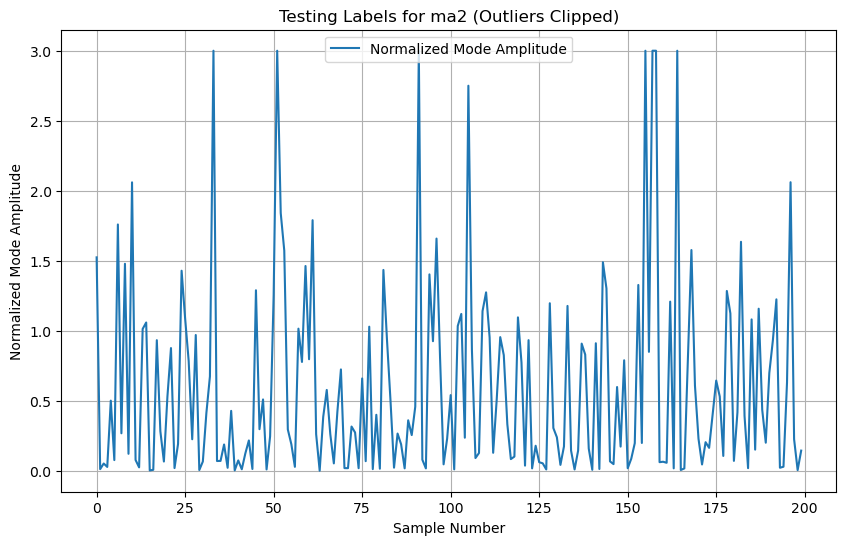

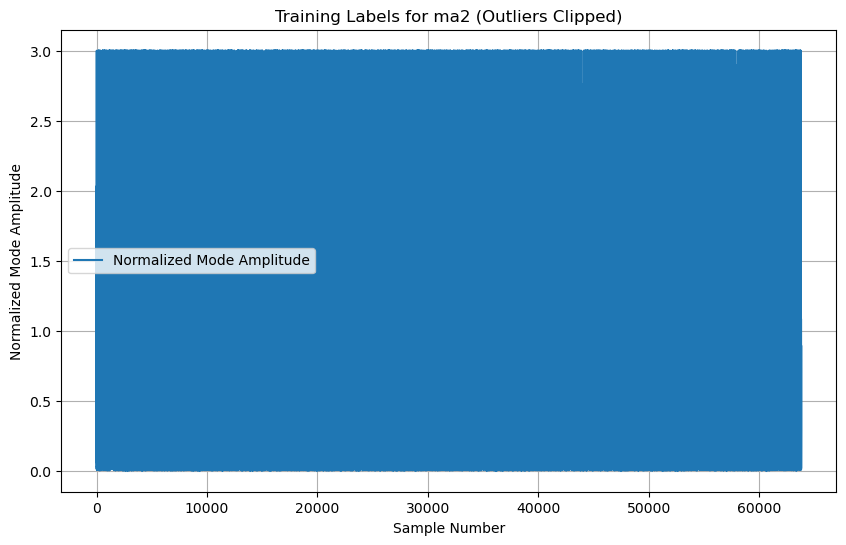

In [8]:
# Prepare data for HBT prediction model
target_data = hbt_dataType  # Using mode 2 amplitude as target
training_data = cut_training_data_2D

# Normalization factors
camera_norm = 1  # Camera data already normalized by max_pixel_value
# Compute ma_norm using 90th percentile to handle outliers
raw_target_vector = []
for i in range(len(valid_shots)):
    shot = valid_shots[i]
    if shot == RESERVED_SHOT:
        continue
    for j in range(len(target_data[i])):
        raw_target_vector.append(target_data[i][j])

raw_target_vector = np.asarray(raw_target_vector, dtype=np.float32)[:, 0]
percentile_cutoff = np.percentile(np.abs(raw_target_vector), OUTLIER_CUTOFF) #99%
ma_norm = percentile_cutoff if percentile_cutoff > 0 else 1.0  # Use 99th percentile for normalization
outlier_threshold = 3 * ma_norm  # Define outliers as values > 3 * normalization factor
outliers = np.abs(raw_target_vector) > outlier_threshold
print(f"Normalization factor ({OUTLIER_CUTOFF} percentile): {ma_norm:.2f}")
print(f"Number of outliers (|value| > {outlier_threshold:.2f}): {np.sum(outliers)}")

# Clip outliers for normalization
raw_target_vector = np.clip(raw_target_vector, -outlier_threshold, outlier_threshold)

# Reshape the training data and labels, excluding RESERVED_SHOT
target_vector = []
training_vector = []
for i in range(len(valid_shots)):
    shot = valid_shots[i]
    if shot == RESERVED_SHOT:
        continue
    for j in range(len(target_data[i])):
        target_vector.append(target_data[i][j])
        training_vector.append(training_data[i][j])

# Shuffle the data
random.seed(123)
zip_list = list(zip(target_vector, training_vector))
random.shuffle(zip_list)
target_vector, training_vector = zip(*zip_list)

# Convert to numpy arrays and normalize with clipping
target_vector = np.asarray(target_vector, dtype=np.float32)[:, 0]
target_vector = np.clip(target_vector, -outlier_threshold, outlier_threshold) / ma_norm
training_vector = np.asarray(training_vector, dtype=np.float32).reshape(-1, 32, 32, 1)

# Split into training and testing sets
test_size = 200
testing_inputs = training_vector[-test_size:]
testing_labels = target_vector[-test_size:]
training_vector = training_vector[:-test_size]
target_vector = target_vector[:-test_size]

# Save normalization info to a per-run file
normalization_filename = f"normalization_{notebook_type}_state_{state}.npz"
np.savez(normalization_filename,
         ma_norm=ma_norm,
         outlier_threshold=outlier_threshold,
         selected_data_type=selected_data_type)
print(f"Saved normalization info to {normalization_filename}")

print('Training shape:', training_vector.shape, 'Target shape:', target_vector.shape)
print('Testing shape:', testing_inputs.shape, 'Testing label shape:', testing_labels.shape)

# Plot testing labels
plt.figure(figsize=(10, 6))
plt.plot(testing_labels, label='Normalized Mode Amplitude')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'Testing Labels for {selected_data_type} (Outliers Clipped)')
plt.grid(True)
plt.legend()
plt.show()

# Plot training labels
plt.figure(figsize=(10, 6))
plt.plot(target_vector, label='Normalized Mode Amplitude')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'Training Labels for {selected_data_type} (Outliers Clipped)')
plt.grid(True)
plt.legend()
plt.show()

In [9]:
import ast

# Define model architecture
num_conv2d_layers = NUM_CONV2D_LAYERS #2
num_dense_layers = NUM_DENSE_LAYERS #1

conv2d_neurons = CONV2D_NEURONS #[16, 16]
conv2d_size = CONV2D_SIZE #[(8, 8), (8, 8)]
dense_layer_neurons = DENSE_LAYER_NEURONS #[10]
max_pooling_size = MAX_POOLING_SIZE #(4, 4)
activation_func = ACTIVATION_FUNC # 'relu'
loss_func = LOSS_FUNC #'mean_squared_error'
optimizer_func = OPTIMIZER_FUNC #'adam'

# Reinterpret conv2d_size to handle various input formats
conv2d_size = [
    tuple(int(x) for x in ast.literal_eval(size) if isinstance(x, (int, float)))
    if isinstance(size, str) else tuple(int(x) for x in size)
    for size in conv2d_size
]
# Reinterpret max_pooling_size to handle various input formats
max_pooling_size = (
    tuple(int(x) for x in ast.literal_eval(max_pooling_size) if isinstance(x, (int, float)))
    if isinstance(max_pooling_size, str) else tuple(int(x) for x in max_pooling_size)
)
# Create the model
william_model = tf.keras.models.Sequential()

# Add input layer
william_model.add(tf.keras.layers.InputLayer(shape=(32, 32, 1)))

# Add Conv2D layers
for i in range(num_conv2d_layers):
    william_model.add(tf.keras.layers.Conv2D(conv2d_neurons[i], conv2d_size[i], 1, activation=activation_func))
    william_model.add(tf.keras.layers.MaxPooling2D(max_pooling_size, 1))

# Flatten the output
william_model.add(tf.keras.layers.Flatten())

# Add dense layers
for i in range(num_dense_layers):
    william_model.add(tf.keras.layers.Dense(dense_layer_neurons[i], activation=activation_func))

# Output layer
william_model.add(tf.keras.layers.Dense(1))

# Compile the model
william_model.compile(optimizer=optimizer_func, loss=loss_func)

# Display model summary
william_model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 26, 26, 64)     │         3,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 23, 23, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 20, 20, 64)     │        65,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 17, 17, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 18496)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 8)              │       147,976 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │             9 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 216,785 (846.82 KB)

 Trainable params: 216,785 (846.82 KB)

 Non-trainable params: 0 (0.00 B)

In [10]:
# Train the model
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=20)
Model = william_model
history = Model.fit(training_vector, target_vector,
                       epochs=EPOCH_NUM,
                       validation_split=VALIDATION_SPLIT,
                       verbose=1,
                       callbacks=[early_stop])

Epoch 1/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 2:39 94ms/step - loss: 1.2084

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.8859 

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.7661

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.7148

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.6825

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.6618

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.6453

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.6308

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.6193

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.6098

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.6018

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.5945

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.5878

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.5814

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.5752

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.5701

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.5650

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.5606

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.5568

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.5532

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.5498

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.5465

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.5436

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.5408

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.5382

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.5359

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.5336

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.5313

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.5292

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.5271

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.5252

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.5233

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.5213

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.5196

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.5180

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.5164

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.5150

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.5138

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.5125

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.5113

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.5101

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.5090

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.5079

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.5068

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.5058

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.5047

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.5037

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.5026

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.5016

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.5006

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.4997

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.4988

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.4979

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.4970

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.4962

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.4954

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.4947

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.4940

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.4933

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.4926

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.4920

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.4915

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.4909

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.4904

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.4899

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.4894

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.4889

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.4884

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.4879

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.4875

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.4871

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.4868

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.4864

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.4861

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.4858

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.4855

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.4853

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.4850

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.4847

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.4845

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.4843

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.4842

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.4840

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.4837

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.4835

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.4833

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.4831

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.4829

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.4827

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.4826

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.4824

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.4822

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.4819

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.4818

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.4816

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.4814

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.4812

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.4810

 294/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.4809

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.4807

 300/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.4806

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.4804

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.4802

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.4801

 312/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.4799

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.4797

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.4795

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.4794

 324/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.4792

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.4790

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.4788

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.4786

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.4784

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.4783

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.4781

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.4779

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.4777

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.4775

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4774

 356/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4773

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4771

 362/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4769

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4767

 368/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4765

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4764

 374/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4762

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4760

 380/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4759

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4758

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4756

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4754

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4753

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4751

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4750

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4748

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4746

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4745

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4743

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4742

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4740

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4739

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4737

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4736

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4735

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4733

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4732

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4730

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4728

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4727

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4725

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4724

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4722

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4721

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4719

 458/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4718

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4717

 464/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4715

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4714

 470/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.4712

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.4711

 476/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.4709

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.4708

 482/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.4706

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.4705

 488/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.4703

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.4701

 494/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.4700

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.4698

 500/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.4696

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.4694

 506/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.4693

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.4691

 512/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.4689

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.4688

 518/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.4686

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.4684

 524/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.4683

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.4681

 530/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.4679

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.4677

 536/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.4676

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.4674

 542/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.4672

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.4671

 548/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.4669

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.4667

 554/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.4665

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.4663

 560/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.4662

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.4660

 566/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.4658

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.4656

 572/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.4655

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.4653

 578/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.4651

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.4649

 584/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.4648

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.4646

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.4644

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.4643

 596/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.4641

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.4639

 602/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.4638

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.4636

 608/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.4635

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.4633

 614/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.4632

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.4630

 620/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.4629

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.4627

 626/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.4626

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.4624

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.4623

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.4621

 638/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.4620

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.4618

 644/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.4617

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.4615

 650/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.4614

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.4613

 656/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.4611

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.4610

 662/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.4608

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.4607

 668/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.4605

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.4604

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.4603

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.4601

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.4600

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.4599

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.4598

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.4596

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.4595

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.4594

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.4593

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.4592

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.4590

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.4589

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.4588

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.4586

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.4585

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.4584

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.4582

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.4581

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.4580

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.4579

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.4577

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.4576

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.4575

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.4573

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.4572

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.4571

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.4570

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.4568

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.4567

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.4566

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.4565

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.4563

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.4562

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.4561

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.4560

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.4559

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.4558

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.4556

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.4555

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.4554

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.4553

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.4552

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.4550

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.4549

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.4548

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.4547

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.4546

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.4544

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.4543

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.4542

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.4541

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.4540

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.4538

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.4537

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.4536

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.4535

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.4534

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.4533

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.4531

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.4530

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.4529

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.4528

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.4527

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.4526

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.4525

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.4524

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.4523

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.4522

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.4520

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.4519

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.4518

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.4517

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.4516

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.4515

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.4514

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.4513

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.4512

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.4511

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.4510

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.4509

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.4508

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.4506

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.4505

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.4504

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.4503

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.4502

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.4501

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.4500

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.4499

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.4498

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.4497

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.4496

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.4494

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.4493

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.4492

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.4491

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.4490

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.4489

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.4488

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.4487

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.4486

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.4485

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.4484

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.4483

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.4481

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.4480

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.4479

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.4478

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.4477

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.4476

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.4475

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.4474

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.4473

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.4472

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.4471

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.4469

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.4468

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.4467

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.4466

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.4465

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.4464

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.4463

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.4462

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.4461

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.4460

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.4459

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.4458

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.4457

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.4455

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.4454

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.4453

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.4452

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.4451

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.4450

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.4449

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.4448

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.4447

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.4446

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.4445

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.4444

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.4443

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.4442

1098/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.4441

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.4440

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.4439

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.4438

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.4437

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.4436

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.4435

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.4434

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.4432

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.4431

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.4430

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.4429

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.4428

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.4427

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.4426

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.4425

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.4424

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.4423

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.4422

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.4421

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.4420

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.4419

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.4418

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.4417

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.4416

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.4415

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.4414

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.4413

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.4412

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.4411

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.4410

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.4409

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.4408

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.4407

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.4406

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.4405

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.4404

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.4403

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.4402

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.4401

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.4400

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.4399

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.4398

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.4397

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.4396

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.4395 

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.4394

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.4393

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.4392

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.4391

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.4390

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.4389

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.4388

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.4387

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.4386

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.4385

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.4384

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.4383

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.4382

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.4382

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.4381

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.4380

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.4379

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.4378

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.4377

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.4376

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.4375

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.4374

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.4373

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.4372

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.4371

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.4370

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.4369

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.4368

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.4367

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.4366

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.4365

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.4365

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.4364

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.4363

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.4362

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.4361

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.4360

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.4359

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.4358

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.4357

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.4356

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.4355

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.4355

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.4354

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.4353

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.4352

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.4351

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.4350

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.4349

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.4348

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.4347

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.4346

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.4346

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.4345

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.4344

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.4343

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.4342

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.4341

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.4340

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.4340

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.4339

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.4338

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.4337

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.4336

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.4335

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.4335

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.4334

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.4333

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.4332

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.4331

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.4330

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.4330

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.4329

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.4328

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.4327

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.4326

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.4325

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.4325

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.4324

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.4323

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.4322

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.4321

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.4320

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.4320

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.4319

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.4318

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.4317

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.4316

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.4316

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.4315

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.4314

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.4313

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.4312

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.4312

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.4311

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.4310

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.4309

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.4308

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.4307

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.4307

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.4306

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.4305

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.4304

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.4303

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.4303

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.4302

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.4301

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.4300

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.4299

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.4299

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.4298

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.4297

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.4296

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.4296

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.4295

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.4294

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.4293

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.4292

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.4292

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.4291

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.4290

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.4290

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.4289

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.4288

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.4287

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.4286

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.4286

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.4285

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.4284

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.4283

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.4283

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.4282

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.4281

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.4280

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.4279

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.4279

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.4278

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.4277

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.4276

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.4276

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.4275

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.4274

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.4273

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.4273

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.4272

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.4271

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.4270

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.4270

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.4269

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.4268

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.4267

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.4267

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.4266

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.4265

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4265 - val_loss: 0.3110


Epoch 2/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.2563

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2570

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2851

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2991

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.3078

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.3184

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.3248

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.3320

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3366

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3393

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3399

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3399

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3399

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3399

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3401

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3401

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3397

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3398

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3399

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3398

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3398

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3395

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3390

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.3384

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.3378

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.3372

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.3365

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.3358

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.3351

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.3343

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.3337

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.3331

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.3325

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.3321

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.3316

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.3311

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.3307

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.3303

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.3302

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.3302

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.3302

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.3303

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.3304

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.3305

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.3305

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.3305

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.3304

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.3304

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.3303

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.3303

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.3302

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.3300

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.3299

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.3298

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.3297

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.3296

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.3296

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.3296

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.3295

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.3295

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.3294

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.3293

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.3293

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.3292

 192/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.3291

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.3290

 198/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.3289

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.3288

 204/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.3287

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.3287

 210/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.3286

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.3286

 216/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.3286

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.3286

 222/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.3285

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.3285

 228/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.3284

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.3283

 234/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.3283

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.3283

 240/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.3282

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.3282

 246/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.3282

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.3282

 252/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.3282

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.3281

 258/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.3281

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.3281

 264/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.3282

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.3282

 270/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.3282

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.3282

 276/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.3282

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.3281

 282/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.3281

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.3281

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.3281

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.3280

 294/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.3280

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.3280

 300/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.3280

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.3279

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.3279

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.3279

 312/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.3278

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.3278

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.3278

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.3278

 324/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.3278

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.3278

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.3278

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.3278

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.3278

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.3278

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.3278

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.3279

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.3279

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.3279

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.3280

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.3280

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.3281

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.3281

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.3282

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.3282

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.3283

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.3283

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.3284

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.3284

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.3284

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.3285

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.3285

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.3285

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.3286

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.3286

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.3286

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.3287

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.3287

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.3288

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.3288

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.3289

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.3289

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.3289

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.3290

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.3290

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.3290

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.3290

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.3290

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.3290

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.3290

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.3291

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.3291

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.3291

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.3291

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.3291

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.3292

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.3292

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.3292

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.3292

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.3292

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.3292

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.3293

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.3293

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.3293

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.3293

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.3293

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.3293

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.3293

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.3293

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.3293

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.3293

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.3293

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.3292

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.3292

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.3292

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.3292

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.3292

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.3292

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.3292

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.3292

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.3291

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.3291

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.3291

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.3291

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.3291

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.3291

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.3291

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.3291

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.3291

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.3291

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.3291

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.3291

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.3290

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.3290

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.3290

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.3290

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.3290

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.3290

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.3289

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.3289

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.3289

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.3289

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.3288

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.3288

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.3288

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.3288

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.3288

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.3287

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.3287

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.3287

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.3287

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.3287

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.3286

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.3286

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.3286

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.3286

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.3285

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.3285

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.3285

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.3285

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.3284

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.3284

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.3284

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.3283

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.3283

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.3283

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.3283

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.3283

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.3282

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.3282

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.3282

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.3282

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.3281

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.3281

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.3281

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.3281

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.3280

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.3280

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.3280

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.3280

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.3280

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.3279

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.3279

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.3279

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.3279

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.3278

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.3278

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.3278

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.3278

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.3278

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.3277

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.3277

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.3277

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.3277

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.3277

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.3276

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.3276

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.3276

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.3276

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.3276

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.3275

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.3275

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.3275

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.3275

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.3275

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.3275

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.3274

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.3274

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.3274

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.3274

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.3273

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.3273

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.3273

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.3273

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.3273

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.3272

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.3272

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.3272

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.3272

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.3271

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.3271

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.3271

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.3271

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.3271

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.3270

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.3270

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.3270

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.3270

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.3269

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.3269

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.3269

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.3269

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.3268

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.3268

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.3268

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.3268

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.3267

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.3267

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.3267

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.3267

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.3266

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.3266

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.3266

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.3266

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.3265

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.3265

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.3265

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.3264

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.3264

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.3264

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.3264

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.3263

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.3263

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.3263

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.3262

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.3262

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.3262

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.3262

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.3261

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.3261

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.3261

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.3261

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.3260

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.3260

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.3260

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.3259

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.3259

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.3259

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.3259

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.3258

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.3258

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.3258

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.3257

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.3257

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.3257

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.3256

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.3256

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.3256

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.3256

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.3255

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.3255

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.3255

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.3254

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.3254

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.3254

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.3254

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.3253

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.3253

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.3253

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.3253

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.3252

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.3252

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.3252

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.3251

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.3251

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.3251

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.3250

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.3250

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.3250

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.3250

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.3249

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.3249

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.3249

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.3248

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.3248

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.3248

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.3248

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.3247

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.3247

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.3247

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.3247

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.3246

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.3246

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.3246

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.3245

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.3245

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.3245

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.3244

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.3244

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.3244

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.3244

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.3243

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.3243

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.3243

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.3243

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.3242

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.3242

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.3242

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.3242

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.3241

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.3241

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.3241

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.3241

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.3240

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.3240

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.3240

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.3240

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.3239

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.3239

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.3239

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.3239

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.3239

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.3238

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.3238

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.3238

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.3238

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.3237

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.3237

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.3237

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.3237

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.3237 

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.3236

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.3236

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.3236

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.3236

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.3235

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.3235

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.3235

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.3235

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.3235

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.3234

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.3234

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.3234

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.3234

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.3233

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.3233

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.3233

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.3233

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.3232

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.3232

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.3232

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.3232

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.3232

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.3231

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.3231

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.3231

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.3231

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.3230

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.3230

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.3230

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.3230

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.3229

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.3229

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.3229

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.3229

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.3229

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.3228

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.3228

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.3228

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.3228

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.3228

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.3227

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.3227

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.3227

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.3227

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.3227

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.3226

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.3226

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.3226

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.3226

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.3226

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.3225

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.3225

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.3225

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.3225

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.3225

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.3225

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.3224

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.3224

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.3224

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.3224

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.3224

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.3223

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.3223

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.3223

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.3223

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.3223

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.3223

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.3222

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.3222

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.3222

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.3222

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.3222

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.3221

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.3221

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.3221

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.3221

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.3221

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.3221

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.3220

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.3220

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.3220

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.3220

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.3220

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.3219

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.3219

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.3219

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.3219

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.3219

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.3219

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.3218

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.3218

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.3218

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.3218

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.3218

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.3218

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.3217

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.3217

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.3217

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.3217

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.3217

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.3217

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.3216

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.3216

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.3216

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.3216

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.3216

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.3216

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.3215

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.3215

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.3215

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.3215

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.3215

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.3215

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.3214

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.3214

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.3214

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.3214

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.3214

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.3214

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.3213

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.3213

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.3213

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.3213

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.3213

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.3213

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3212

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3212

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3212

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3212

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3212

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3212

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3211

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3211

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3211

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3211

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3211

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3211

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3210

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3210

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3210

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3210

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3210

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3210

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3210

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3209

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3209

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3209

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3209

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3209

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3209

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3209

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3208

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3208

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3208

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3208

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3208

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3208

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3208 - val_loss: 0.2962


Epoch 3/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1392

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1761

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2217

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2371

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2425

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2531

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2631

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2716

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2775

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2810

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2840

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2862

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2875

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2887

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2895

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2905

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2911

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2914

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2917

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2919

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2922

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2925

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2929

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2932

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2934

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2936

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2937

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2938

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2939

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2938

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2937

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2936

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2934

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2933

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2932

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2931

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2931

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2931

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2931

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2931

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2932

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2932

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2933

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2933

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2934

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2934

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2935

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2934

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2934

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2934

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2933

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2934

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2933

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2933

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2933

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2933

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2932

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2932

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2931

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2931

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2931

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2932

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2932

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2933

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2934

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2934

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2935

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2935

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2936

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2936

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2937

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2937

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2937

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2938

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2938

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2938

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2939

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2939

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2940

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2940

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2941

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2942

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2942

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2943

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2944

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2944

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2945

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2945

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2946

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2946

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2946

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2947

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2947

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2947

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2947

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2948

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2948

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2948

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2949

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2949

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2949

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2949

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2950

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2950

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2951

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2951

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2951

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2952

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2952

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2953

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2953

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2953

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2954

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2954

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2954

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2955

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2955

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2955

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2956

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2956

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2956

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2956

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2957

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2957

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2957

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2958

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2958

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2958

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2958

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2958

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2959

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2959

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2959

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2959

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2959

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2959

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2959

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2959

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2959

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2959

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2959

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2959

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2959

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2959

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2959

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2959

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2959

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2959

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2959

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2959

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2959

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2958

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2958

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2958

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2958

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2958

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2958

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2958

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2958

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2957

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2957

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2957

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2957

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2957

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2957

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2957

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2957

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2957

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2957

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2957

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2957

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2957

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2957

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2957

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2957

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2957

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2957

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2957

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2957

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2957

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2957

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2957

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2957

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2957

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2957

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2957

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2957

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2957

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2957

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2958

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2958

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2958

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2958

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2958

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2958

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2958

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2958

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2958

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2958

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2958

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2958

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2958

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2958

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2958

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2958

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2958

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2958

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2958

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2958

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2958

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2958

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2958

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2958

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2958

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2958

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2958

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2957

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2957

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2957

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2957

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2957

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2957

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2957

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2957

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2957

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2957

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2957

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2957

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2957

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2957

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2957

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2957

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2957

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2957

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2957

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2957

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2957

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2957

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2957

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2957

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2957

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2957

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2957

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2957

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2957

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2957

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2957

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2957

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2957

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2957

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2957

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2957

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2957

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2957

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2957

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2957

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2957

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2957

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2957

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2957

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2957

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2957

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2957

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2957

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2957

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2957

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2957

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2957

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2957

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2957

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2957

 812/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2957

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2957

 818/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2957

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2958

 824/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2958

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2958

 830/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2958

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2958

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2958

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2958

 842/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2958

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2958

 848/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2958

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2958

 854/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2958

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2958

 860/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2958

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2958

 866/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2958

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2958

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2958

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2958

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2958

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2958

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2958

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2958

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2958

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2958

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2958

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2958

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2958

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2958

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2958

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2958

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2958

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2958

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2958

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2958

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2958

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2958

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2958

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2958

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2958

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2958

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2958

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2958

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2958

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2958

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2958

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2958

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2958

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2958

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2958

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2958

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2958

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2958

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2958

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2958

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2958

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2958

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2958

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2958

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2958

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2958

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2958

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2958

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2958

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2958

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2958

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2958

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2958

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2958

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2958

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2958

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2958

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2958

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2958

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2958

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2958

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2958

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2958

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2958

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2958

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2958

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2958

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2958

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2958

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2958

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2958

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2958

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2958

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2958

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2958

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2958

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2958

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2958

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2958

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2958

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2958

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2958

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2958

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2958

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2958

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2958

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2958

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2958

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2958

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2957

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2957

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2957

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2957

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2957

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2957

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2957

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2957

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2957

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2957

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2957

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2957

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2957

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2957

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2957

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2957

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2957

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2957

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2957

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2957

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2957

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2957

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2957

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2957

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2957

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2957

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2957

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2957

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2956

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2956

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2956

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2956 

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2956

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2956

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2956

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2956

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2956

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2956

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2956

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2956

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2956

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2956

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2955

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2955

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2955

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2955

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2955

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2955

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2955

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2955

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2955

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2955

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2955

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2955

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2955

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2955

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2955

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2955

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2955

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2955

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2955

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2955

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2955

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2954

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2954

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2954

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2954

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2954

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2954

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2954

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2954

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2954

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2954

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2954

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2954

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2954

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2954

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2954

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2954

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2954

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2954

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2954

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2954

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2954

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2954

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2954

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2954

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2954

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2954

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2954

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2954

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2954

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2954

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2954

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2954

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2953

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2953

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2953

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2953

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2953

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2953

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2953

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2953

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2953

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2953

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2953

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2953

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2953

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2953

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2953

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2953

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2953

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2953

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2953

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2953

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2953

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2953

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2953

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2953

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2953

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2953

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2953

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2953

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2953

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2952

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2952

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2952

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2952

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2952

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2952

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2952

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2952

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2952

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2952

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2952

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2952

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2952

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2952

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2952

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2952

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2952

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2952

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2952

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2952

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2952

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2952

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2952

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2952

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2952

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2952

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2952

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2952

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2952

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2952

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2952

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2951

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2951

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2951

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2951

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2951

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2951

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2951

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2951

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2951

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2951

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2951

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2951

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2951

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2951

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2951

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2951

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2951

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2951

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2951

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2951

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2951

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2951

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2951

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2950

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2950

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2950

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2950

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2950

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2950

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2950

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2950

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2950

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2950

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.2950 - val_loss: 0.2707


Epoch 4/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2694

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2605

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2576

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2732

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2817

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2906

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2965

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2996

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.3015

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.3022

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.3026

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.3025

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.3017

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.3007

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.3003

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2996

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2987

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2978

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2971

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2963

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2956

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2947

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2943

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2938

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2932

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2929

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2929

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2929

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2930

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2931

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2932

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2931

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2930

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2928

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2927

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2925

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2924

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2922

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2921

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2919

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2918

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2916

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2914

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2913

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2912

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2910

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2908

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2906

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2905

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2902

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2901

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2899

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2898

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2897

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2896

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2894

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2893

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2891

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2890

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2888

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2887

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2886

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2885

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2883

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2881

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2880

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2878

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2876

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2875

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2873

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2872

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2870

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2869

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2867

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2865

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2864

 228/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2862

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2861

 234/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2859

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2858

 240/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2856

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2855

 246/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2854

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2853

 252/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2852

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2851

 258/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2850

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2849

 264/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2848

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2848

 270/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2847

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2847

 276/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2846

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2846

 282/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2845

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2844

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2844

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2843

 294/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2843

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2842

 300/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2842

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2841

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2841

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2840

 312/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2840

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2839

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2838

 320/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2838

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2838

 326/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2838

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2837

 332/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2837

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2837

 338/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2837

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2837

 344/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2837

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2837

 350/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2837

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2837

 356/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2837

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2836

 362/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2836

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2836

 368/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2836

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2836

 374/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2836

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2836

 380/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2836

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2835

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2835

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2835

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2835

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2835

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2834

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2834

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2834

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2834

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2834

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2833

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2833

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2833

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2833

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2833

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2833

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2833

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2833

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2833

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2833

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2833

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2833

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2832

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2832

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2832

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2832

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2832

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2832

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2832

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2832

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2832

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2832

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2832

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2832

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2832

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2832

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2832

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2832

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2832

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2832

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2832

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2832

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2832

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2832

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2831

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2831

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2831

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2831

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2831

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2831

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2831

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2830

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2830

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2830

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2830

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2830

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2830

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2830

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2830

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2830

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2830

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2830

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2830

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2829

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2829

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2829

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2829

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2829

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2829

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2829

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2829

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2829

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2829

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2829

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2829

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2829

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2829

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2829

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2829

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2829

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2829

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2829

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2829

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2829

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2829

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2829

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2829

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2829

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2829

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2829

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2829

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2829

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2829

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2829

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2829

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2829

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2829

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2829

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2829

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2829

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2829

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2829

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2829

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2829

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2829

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2829

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2829

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2829

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2829

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2829

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2829

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2829

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2829

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2829

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2829

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2829

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2829

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2828

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2828

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2828

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2828

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2828

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2828

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2828

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2828

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2828

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2828

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2828

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2828

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2827

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2827

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2827

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2827

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2827

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2827

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2827

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2827

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2827

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2827

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2827

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2827

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2827

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2827

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2827

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2826

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2826

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2826

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2826

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2826

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2826

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2826

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2826

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2826

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2825

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2825

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2825

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2825

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2825

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2825

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2825

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2825

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2824

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2824

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2824

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2824

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2824

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2824

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2823

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2823

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2823

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2823

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2823

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2823

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2822

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2822

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2822

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2822

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2822

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2822

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2821

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2821

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2821

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2821

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2821

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2821

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2821

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2820

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2820

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2820

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2820

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2820

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2820

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2820

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2820

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2820

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2820

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2820

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2819

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2819

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2819

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2819

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2819

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2819

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2819

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2819

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2819

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2819

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2819

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2819

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2819

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2819

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2819

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2819

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2818

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2818

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2818

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2818

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2818

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2818

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2818

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2818

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2818

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2818

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2818

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2818

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2818

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2818

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2818

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2818

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2818

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2818

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2818

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2818

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2818

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2817

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2817

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2817

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2817

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2817

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2817

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2817

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2817

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2817

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2817

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2817

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2817

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2817

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2817

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2817

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2817

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2817

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2816

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2816

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2816

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2816

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2816

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2816

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2816

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2816

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2816

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2816

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2816

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2816

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2816

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2816

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2816

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2816

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2816

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2816

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2816

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2816

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2816

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2815

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2815

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2815

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2815

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2815

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2815

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2815

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2815

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2815

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2815 

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2815

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2815

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2815

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2815

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2815

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2815

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2815

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2815

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2815

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2815

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2815

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2815

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2815

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2815

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2815

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2815

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2815

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2815

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2815

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2815

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2815

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2815

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2815

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2815

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2815

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2815

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2815

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2815

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2815

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2815

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2815

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2815

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2815

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2815

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2815

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2815

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2815

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2815

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2815

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2815

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2815

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2815

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2815

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2815

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2815

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2815

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2815

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2815

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2815

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2814

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2814

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2814

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2814

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2814

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2814

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2814

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2814

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2814

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2814

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2814

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2814

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2814

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2814

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2814

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2814

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2814

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2814

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2814

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2814

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2814

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2814

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2814

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2814

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2814

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2814

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2814

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2814

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2814

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2814

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2814

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2814

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2814

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2814

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2814

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2814

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2814

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2814

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2814

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2814

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2814

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2814

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2814

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2814

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2814

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2814

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2814

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2813

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2813

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2813

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2813

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2813

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2813

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2813

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2813

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2813

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2813

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2813

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2813

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2813

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2813

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2813

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2813

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2813

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2813

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2813

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2813

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2813

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2813

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2813

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2813

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2813

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2813

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2813

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2813

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2813

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2813

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2813

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2813

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2813

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2813

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2813

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2813

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2813

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2813

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2813

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2813

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2813

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2813

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2813

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2813

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2813

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2812

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2812

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2812

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2812

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2812

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2812

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2812

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2812

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2812

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2812

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2812

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2812

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2812

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2812

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2812

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2812

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.2812 - val_loss: 0.2665


Epoch 5/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1848

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.2909

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.2903

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.3010

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.3085

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.3117

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.3112

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.3090

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.3068

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.3043

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.3028

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.3017

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.3004

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2989

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2972

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2959

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2947

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2934

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2920

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2906

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2895

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2886

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2877

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2870

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2864

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2860

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2856

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2852

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2848

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2843

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2839

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2837

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2836

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2835

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2833

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2830

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2827

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.2824

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.2821

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.2817

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.2814

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.2810

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.2807

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.2803

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.2800

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.2796

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.2793

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.2791

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.2788

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.2786

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.2783

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2781

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2778

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2776

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2773

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2771

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2769

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2767

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2765

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2763

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2761

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2759

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2757

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2755

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2753

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2751

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2749

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2748

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2746

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2745

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2744

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2743

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2742

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2741

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2740

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2739

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2738

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2738

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2737

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2736

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2736

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2736

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2735

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2735

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2735

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2734

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2734

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2734

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2733

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2733

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2733

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2732

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2732

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2731

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2730

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2730

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2729

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2729

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2728

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2728

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2727

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2727

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2726

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2726

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2725

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2725

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2724

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2724

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2724

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2723

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2723

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2723

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2723

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2722

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2722

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2721

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2721

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2721

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2721

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2720

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2720

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2720

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2720

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2720

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2719

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2719

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2719

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2718

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2718

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2718

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2718

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2718

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2718

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2718

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2717

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2717

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2717

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2717

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2717

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2717

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2717

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2717

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2717

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2717

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2717

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2717

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2717

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2717

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2717

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2717

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2717

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2717

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2717

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2717

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2717

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2717

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2717

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2718

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2718

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2718

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2718

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2718

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2719

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2719

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2719

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2719

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2720

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2720

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2720

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2721

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2721

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2721

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2721

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2722

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2722

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2722

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2722

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2723

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2723

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2723

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2723

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2724

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2724

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2724

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2724

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2724

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2725

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2725

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2725

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2725

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2726

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2726

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2726

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2726

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2726

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2726

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2727

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2727

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2727

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2727

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2727

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2727

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2728

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2728

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2728

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2728

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2728

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2728

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2729

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2729

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2729

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2729

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2729

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2729

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2730

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2730

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2730

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2730

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2730

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2730

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2731

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2731

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2731

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2731

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2731

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2731

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2732

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2732

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2732

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2732

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2732

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2732

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2732

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2732

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2732

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2733

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2733

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2733

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2733

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2733

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2733

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2733

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2733

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2733

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2733

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2734

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2734

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2734

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2734

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2734

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2734

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2734

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2735

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2735

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2735

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2735

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2735

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2735

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2735

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2735

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2736

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2736

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2736

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2736

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2736

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2736

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2737

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2737

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2737

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2737

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2737

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2737

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2737

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2737

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2737

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2738

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2738

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2738

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2738

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2738

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2738

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2738

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2738

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2738

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2738

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2739

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2739

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2739

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2739

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2739

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2739

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2739

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2739

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2739

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2740

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2740

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2740

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2740

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2740

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2740

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2740

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2740

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2740

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2740

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2740

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2740

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2740

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2740

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2740

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2740

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2740

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2740

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2741

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2741

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2741

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2741

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2741

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2741

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2741

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2741

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2741

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2741

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2741

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2741

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2741

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2741

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2741

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2741

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2741

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2741

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2741

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2741

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2741

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2741

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2741

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2741

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2741

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2741

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2741

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2742

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2742

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2742

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2742

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2742

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2742

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2742

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2742

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2742

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2742

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2742

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2742

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2742

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2742

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2742

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2742

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2742

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2742

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2742

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2742

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2743

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2743

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2743

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2743

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2743

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2743

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2743

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2743

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2743

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2743

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2743

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2743

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2743

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2743

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2743

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2743

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2743

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2744

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2744

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2744

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2744

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2744

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2744

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2744

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2744

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2744

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2744

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2744

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2744

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2744

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2744

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2744

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2745

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2745

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2745

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2745

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2745

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2745

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2745

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2745

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2745

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2745

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2745

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2745

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2745

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2746

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2746 

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2746

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2746

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2746

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2746

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2746

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2746

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2746

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2746

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2746

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2746

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2747

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2747

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2747

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2747

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2747

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2747

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2747

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2747

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2747

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2747

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2747

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2747

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2747

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2748

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2748

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2748

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2748

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2748

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2748

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2748

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2748

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2748

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2748

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2748

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2748

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2748

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2748

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2748

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2748

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2748

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2748

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2748

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2748

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2748

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2748

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2749

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2749

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2749

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2749

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2749

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2749

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2749

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2749

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2749

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2749

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2749

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2749

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2749

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2749

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2749

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2749

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2749

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2749

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2749

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2749

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2749

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2749

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2749

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2749

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2749

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2749

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2749

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2749

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2749

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2749

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2749

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2749

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2749

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2749

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2749

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2749

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2749

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2749

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2749

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2749

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2749

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2749

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2749

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2749

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2749

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2749

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2749

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2749

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2749

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2749

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2749

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2749

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2749

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2749

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2749

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2749

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2749

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2749

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2749

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2749

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2749

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2749

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2749

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2749

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2749

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2749

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2749

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2749

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2749

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2749

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2749

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2749

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2749

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2749

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2749

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2749

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2749

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2749

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2749

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2749

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2749

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2749

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2749

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2749

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2749

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2749

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2749

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2750

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2750

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2750

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2750

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2750

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2750

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2750

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2750

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2750

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2750

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2750

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2750

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2750

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2750

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2750

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2750

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2750

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2750

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2750

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2750

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2750

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2750

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2750

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2750

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2750

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2750

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2750

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.2750 - val_loss: 0.2595


Epoch 6/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1622

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.2917

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.3038

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.3038

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.2953

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.2899

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2898

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2883

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2874

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2855

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2838

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2833

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2824

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2814

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2808

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2803

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2796

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2788

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2779

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2772

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2767

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2764

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2764

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2764

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2765

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2768

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2770

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2771

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2773

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2777

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2781

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2785

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2790

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2793

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2797

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2800

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2802

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2805

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2807

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2809

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2811

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2812

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2813

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2813

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2814

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2814

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2815

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2816

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2817

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2817

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2818

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2818

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2818

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2819

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2819

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2820

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2820

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2820

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2820

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2821

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2821

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2822

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2822

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2822

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2822

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2821

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2821

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2821

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2821

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2821

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2822

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2822

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2822

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2822

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2822

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2822

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2822

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2822

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2822

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2822

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2822

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2822

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2823

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2823

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2823

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2823

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2823

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2823

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2823

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2823

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2823

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2824

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2824

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2824

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2825

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2825

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2825

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2825

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2826

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2826

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2826

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2826

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2826

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2826

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2826

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2826

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2826

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2826

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2826

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2826

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2826

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2826

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2826

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2826

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2826

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2826

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2827

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2827

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2827

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2827

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2827

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2827

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2827

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2827

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2827

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2827

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2827

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2827

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2827

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2827

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2827

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2827

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2827

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2827

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2827

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2827

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2827

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2827

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2827

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2827

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2826

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2826

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2826

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2826

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2826

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2826

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2825

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2825

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2825

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2825

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2825

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2825

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2825

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2824

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2824

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2824

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2824

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2824

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2824

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2824

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2824

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2824

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2824

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2824

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2823

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2823

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2823

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2823

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2823

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2823

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2822

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2822

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2822

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2822

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2822

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2822

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2821

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2821

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2821

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2821

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2821

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2820

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2820

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2820

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2820

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2820

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2820

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2819

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2819

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2819

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2819

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2819

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2819

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2818

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2818

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2818

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2818

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2818

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2818

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2817

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2817

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2817

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2817

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2817

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2816

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2816

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2816

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2816

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2816

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2815

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2815

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2815

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2815

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2814

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2814

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2814

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2814

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2814

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2813

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2813

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2813

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2813

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2813

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2813

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2812

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2812

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2812

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2812

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2812

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2811

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2811

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2811

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2811

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2811

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2811

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2811

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2811

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2810

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2810

 716/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2810

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2810

 722/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2810

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2810

 728/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2809

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2809

 734/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2809

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2809

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2809

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2809

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2808

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2808

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2808

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2808

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2808

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2808

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2807

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2807

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2807

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2807

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2807

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2806

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2806

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2806

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2806

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2806

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2805

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2805

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2805

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2805

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2805

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2805

 812/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2804

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2804

 818/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2804

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2804

 824/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2804

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2803

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2803

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2803

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2803

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2802

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2802

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2802

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2802

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2801

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2801

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2801

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2801

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2800

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2800

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2800

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2800

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2799

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2799

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2799

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2799

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2798

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2798

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2798

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2798

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2798

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2797

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2797

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2797

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2797

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2796

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2796

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2796

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2796

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2796

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2795

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2795

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2795

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2795

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2795

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2794

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2794

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2794

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2794

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2794

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2793

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2793

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2793

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2793

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2792

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2792

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2792

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2792

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2792

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2791

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2791

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2791

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2791

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2790

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2790

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2790

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2790

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2790

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2789

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2789

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2789

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2789

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2789

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2788

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2788

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2788

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2788

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2788

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2787

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2787

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2787

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2787

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2787

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2787

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2786

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2786

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2786

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2786

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2786

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2785

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2785

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2785

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2785

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2785

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2785

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2784

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2784

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2784

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2784

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2784

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2784

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2783

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2783

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2783

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2783

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2783

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2783

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2783

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2782

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2782

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2782

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2782

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2782

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2782

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2782

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2781

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2781

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2781

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2781

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2781

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2781

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2781

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2781

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2780

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2780

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2780

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2780

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2780

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2780

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2780

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2780

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2780

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2779

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2779

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2779

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2779

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2779

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2779

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2779

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2778 

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2778

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2778

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2778

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2778

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2778

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2778

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2777

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2777

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2777

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2777

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2777

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2777

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2776

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2776

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2776

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2776

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2776

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2775

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2775

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2775

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2775

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2775

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2775

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2774

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2774

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2774

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2774

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2774

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2773

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2773

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2773

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2773

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2773

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2773

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2772

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2772

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2772

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2772

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2772

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2771

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2771

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2771

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2771

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2771

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2771

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2770

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2770

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2770

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2770

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2770

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2770

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2770

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2769

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2769

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2769

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2769

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2769

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2769

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2768

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2768

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2768

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2768

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2768

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2768

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2768

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2767

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2767

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2767

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2767

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2767

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2767

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2767

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2766

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2766

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2766

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2766

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2766

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2766

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2766

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2766

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2765

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2765

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2765

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2765

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2765

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2765

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2765

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2765

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2764

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2764

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2764

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2764

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2764

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2764

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2764

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2764

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2763

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2763

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2763

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2763

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2763

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2763

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2763

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2763

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2762

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2762

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2762

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2762

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2762

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2762

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2762

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2762

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2762

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2761

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2761

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2761

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2761

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2761

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2761

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2761

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2761

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2760

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2760

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2760

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2760

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2760

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2760

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2760

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2760

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2759

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2759

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2759

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2759

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2759

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2759

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2759

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2758

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2758

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2758

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2758

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2758

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2758

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2758

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2757

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2757

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2757

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2757

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2757

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2757

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2757

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2757

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2756

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2756

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2756

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2756

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2756

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2756

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.2756 - val_loss: 0.2567


Epoch 7/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2581

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2844

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2944

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2866

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2802

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2781

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2761

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2758

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2756

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2765

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2763

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2765

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2759

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2750

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2744

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2738

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2733

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2730

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2727

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2727

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2728

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2728

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2727

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2727

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2726

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2726

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2726

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2726

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2726

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2726

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2726

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2725

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2724

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2722

 102/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2721

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2719

 108/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2716

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2713

 114/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2710

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2709

 120/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2708

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2707

 126/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2706

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2704

 132/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2703

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2701

 138/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2699

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2698

 144/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2696

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2694

 150/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2692

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2689

 156/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2687

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2685

 162/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2683

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2681

 168/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2679

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2677

 174/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2676

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2674

 180/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2673

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2672

 186/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2671

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2670

 192/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2669

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2669

 198/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2669

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2668

 204/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2668

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2668

 210/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2668

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2667

 216/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2667

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2667

 222/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2666

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2666

 228/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2666

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2666

 234/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2666

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2666

 240/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2666

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2665

 246/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2665

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2665

 252/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2665

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2666

 258/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2666

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2666

 264/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2666

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2666

 270/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2666

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2667

 276/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2667

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2667

 282/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2667

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2667

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2667

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2667

 294/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2667

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2667

 300/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2667

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2667

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2667

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2667

 312/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2667

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2668

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2668

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2668

 324/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2668

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2668

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2668

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2668

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2668

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2669

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2669

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2669

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2669

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2669

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2669

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2669

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2669

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2670

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2670

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2670

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2670

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2670

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2670

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2670

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2671

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2671

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2671

 392/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2671

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2671

 398/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2671

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2672

 404/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2672

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2672

 410/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2672

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2673

 416/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2673

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2673

 422/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2673

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2674

 428/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2674

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2674

 434/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2674

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2675

 440/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2675

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2675

 446/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2676

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2676

 452/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2676

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2676

 458/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2676

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2677

 464/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2677

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2677

 470/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2678

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2678

 476/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2678

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2678

 482/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2679

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2679

 488/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2679

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2679

 494/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2679

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2679

 500/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2679

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2680

 506/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2680

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2680

 512/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2680

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2680

 518/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2680

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2680

 524/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2680

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2680

 530/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2680

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2680

 536/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2680

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2680

 542/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2680

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2679

 548/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2679

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2679

 554/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2679

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2679

 560/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2679

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2679

 566/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2679

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2679

 572/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2679

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2679

 578/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2679

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2679

 584/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2679

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2679

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2679

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2678

 596/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2678

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2678

 602/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2678

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2678

 608/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2678

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2678

 614/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2677

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2677

 620/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2677

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2677

 626/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2677

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2677

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2677

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2676

 638/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2676

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2676

 644/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2676

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2676

 650/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2675

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2675

 656/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2675

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2675

 662/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2675

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2674

 668/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2674

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2674

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2674

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2673

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2673

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2673

 686/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2673

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2672

 692/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2672

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2672

 698/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2672

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2671

 704/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2671

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2671

 710/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2671

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2670

 716/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2670

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2670

 722/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2670

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2670

 728/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2669

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2669

 734/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2669

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2669

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2669

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2669

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2668

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2668

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2668

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2668

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2668

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2667

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2667

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2667

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2667

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2667

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2666

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2666

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2666

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2666

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2665

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2665

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2665

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2665

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2664

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2664

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2664

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2664

 812/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2664

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2663

 818/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2663

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2663

 824/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2663

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2662

 830/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2662

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2662

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2662

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2662

 842/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2661

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2661

 848/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2661

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2661

 854/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2660

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2660

 860/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2660

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2660

 866/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2660

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2659

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2659

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2659

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2659

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2659

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2658

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2658

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2658

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2658

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2658

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2658

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2657

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2657

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2657

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2657

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2657

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2656

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2656

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2656

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2656

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2656

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2656

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2656

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2655

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2655

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2655

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2655

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2655

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2655

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2655

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2654

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2654

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2654

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2654

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2654

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2654

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2654

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2654

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2654

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2653

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2653

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2653

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2653

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2653

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2653

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2653

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2653

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2653

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2653

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2653

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2653

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2653

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2652

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2652

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2652

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2652

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2652

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2652

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2652

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2652

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2652

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2652

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2652

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2652

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2652

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2652

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2652

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2652

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2652

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2652

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2652

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2652

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2652

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2652

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2652

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2652

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2652

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2652

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2652

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2652

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2652

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2652

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2652

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2652

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2652

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2652

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2652

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2652

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2652

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2652

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2652

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2652

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2652

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2652

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2652

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2652

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2652

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2652

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2652

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2652

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2652

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2652

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2652

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2652

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2652

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2652

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2652

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2652

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2652

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2652

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2652

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2652

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2652

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2652

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2652

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2652

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2652

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2652

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2652

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2652 

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2652

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2652

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2652

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2652

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2652

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2652

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2651

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2651

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2651

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2651

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2651

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2651

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2651

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2651

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2651

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2651

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2651

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2651

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2651

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2651

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2651

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2651

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2651

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2651

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2651

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2651

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2651

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2651

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2651

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2651

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2651

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2651

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2651

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2651

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2650

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2650

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2650

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2650

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2650

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2650

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2650

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2650

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2650

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2650

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2650

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2650

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2650

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2650

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2650

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2650

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2650

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2650

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2650

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2650

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2650

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2650

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2650

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2650

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2650

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2650

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2650

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2650

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2650

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2650

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2650

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2650

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2650

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2650

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2650

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2650

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2650

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2650

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2650

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2650

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2650

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2649

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2649

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2649

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2649

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2649

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2649

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2649

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2649

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2649

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2649

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2649

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2649

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2649

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2649

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2649

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2649

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2649

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2649

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2649

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2649

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2649

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2649

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2649

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2649

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2649

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2649

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2648

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2648

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2648

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2648

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2648

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2648

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2648

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2648

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2648

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2648

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2648

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2648

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2648

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2648

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2648

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2648

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2648

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2648

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2648

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2648

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2648

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2648

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2648

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2648

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2648

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2648

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2648

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2648

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2648

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2648

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2648

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2648

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2648

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2648

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2648

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2648

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2648

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2648

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2647

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2647

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2647

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2647

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2647

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2647

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2647

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2647

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2647

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2647

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2647

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2647

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2647

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2647

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2647

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2647

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2647

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.2647 - val_loss: 0.2464


Epoch 8/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.2086

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2719

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2933

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2905

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2856

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2876

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2893

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2907

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2903

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2901

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2902

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2908

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2912

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2919

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2921

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2916

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2907

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2895

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2886

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2879

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2871

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2862

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2855

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2850

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2846

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2844

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2842

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2842

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2842

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2840

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2838

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2836

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2833

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2830

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2828

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2825

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2822

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2819

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2815

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2812

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2808

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2804

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2800

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2797

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2794

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2791

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2788

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2785

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2783

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2780

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2778

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2776

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2774

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2772

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2770

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2768

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2766

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2764

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2763

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2761

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2760

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2758

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2757

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2756

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2755

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2753

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2752

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2751

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2750

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2749

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2748

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2747

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2746

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2745

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2745

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2745

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2744

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2744

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2744

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2744

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2744

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2743

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2743

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2743

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2742

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2742

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2742

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2741

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2741

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2740

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2740

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2739

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2738

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2738

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2737

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2736

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2736

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2735

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2735

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2734

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2733

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2733

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2732

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2732

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2732

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2731

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2731

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2731

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2730

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2730

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2730

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2729

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2728

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2728

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2727

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2727

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2726

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2726

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2725

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2725

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2724

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2724

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2723

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2723

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2723

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2722

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2722

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2721

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2721

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2720

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2720

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2719

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2719

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2719

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2718

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2718

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2718

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2717

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2717

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2717

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2716

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2716

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2716

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2715

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2715

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2715

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2714

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2714

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2714

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2713

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2713

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2713

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2712

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2712

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2712

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2711

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2711

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2710

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2710

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2710

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2709

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2709

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2709

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2708

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2708

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2708

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2707

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2707

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2706

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2706

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2706

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2706

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2705

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2705

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2705

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2704

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2704

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2703

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2703

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2703

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2702

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2702

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2702

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2701

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2701

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2701

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2700

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2700

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2700

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2700

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2699

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2699

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2699

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2698

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2698

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2698

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2698

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2697

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2697

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2697

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2697

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2696

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2696

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2696

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2696

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2695

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2695

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2695

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2695

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2694

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2694

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2694

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2694

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2693

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2693

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2693

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2692

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2692

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2692

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2691

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2691

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2691

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2690

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2690

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2689

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2689

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2689

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2688

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2688

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2688

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2687

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2687

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2686

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2686

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2686

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2685

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2685

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2685

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2684

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2684

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2684

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2683

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2683

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2683

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2682

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2682

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2682

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2681

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2681

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2681

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2681

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2680

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2680

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2680

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2679

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2679

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2678

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2678

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2678

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2678

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2677

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2677

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2677

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2676

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2676

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2676

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2676

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2675

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2675

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2675

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2675

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2674

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2674

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2674

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2674

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2674

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2673

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2673

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2673

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2673

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2673

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2672

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2672

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2672

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2672

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2672

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2671

 854/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2671

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2671

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2671

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2671

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2671

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2670

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2670

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2670

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2670

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2670

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2670

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2669

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2669

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2669

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2669

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2669

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2669

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2669

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2669

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2668

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2668

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2668

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2668

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2668

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2668

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2668

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2667

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2667

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2667

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2667

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2667

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2667

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2667

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2666

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2666

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2666

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2666

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2666

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2666

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2665

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2665

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2665

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2665

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2665

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2665

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2664

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2664

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2664

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2664

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2664

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2663

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2663

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2663

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2663

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2663

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2663

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2662

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2662

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2662

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2662

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2662

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2661

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2661

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2661

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2661

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2661

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2660

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2660

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2660

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2660

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2660

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2659

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2659

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2659

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2659

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2659

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2659

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2658

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2658

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2658

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2658

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2658

1098/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2657

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2657

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2657

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2657

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2657

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2657

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2656

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2656

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2656

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2656

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2656

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2656

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2655

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2655

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2655

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2655

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2655

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2655

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2654

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2654

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2654

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2654

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2654

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2654

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2653

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2653

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2653

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2653

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2653

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2653

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2652

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2652

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2652

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2652

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2652

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2652

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2651

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2651

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2651

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2651

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2651

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2651

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2651

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2650

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2650

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2650 

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2650

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2650

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2650

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2649

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2649

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2649

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2649

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2649

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2649

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2648

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2648

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2648

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2648

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2648

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2648

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2648

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2647

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2647

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2647

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2647

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2647

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2647

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2647

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2647

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2646

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2646

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2646

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2646

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2646

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2646

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2646

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2645

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2645

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2645

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2645

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2645

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2645

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2645

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2645

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2644

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2644

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2644

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2644

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2644

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2644

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2644

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2644

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2644

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2643

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2643

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2643

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2643

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2643

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2643

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2643

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2643

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2643

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2642

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2642

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2642

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2642

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2642

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2642

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2642

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2642

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2642

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2642

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2641

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2641

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2641

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2641

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2641

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2641

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2641

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2641

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2641

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2640

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2640

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2640

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2640

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2640

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2640

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2640

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2640

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2640

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2640

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2639

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2639

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2639

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2639

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2639

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2639

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2639

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2639

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2639

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2639

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2638

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2638

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2638

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2638

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2638

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2638

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2638

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2638

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2638

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2638

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2637

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2637

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2637

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2637

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2637

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2637

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2637

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2637

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2637

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2637

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2636

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2636

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2636

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2636

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2636

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2636

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2636

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2636

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2636

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2635

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2635

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2635

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2635

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2635

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2635

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2635

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2635

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2635

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2635

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2634

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2634

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2634

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2634

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2634

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2634

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2634

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2634

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2634

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2634

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2634

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2634

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2633

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2633

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2633

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2633

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2633

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2633

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2633

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.2633 - val_loss: 0.2520


Epoch 9/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1523

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1931

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.2188

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2252

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2292

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2314

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2332

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2340

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2338

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2341

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2348

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2351

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2355

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2358

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2355

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2353

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2351

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2352

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2355

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2359

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2364

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2370

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2378

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2384

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2390

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2395

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2399

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2404

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2409

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2416

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2423

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2431

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2438

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2444

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2449

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2454

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2459

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2464

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2469

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2473

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2477

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2480

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2483

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2486

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2488

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2490

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2492

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2495

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2498

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2501

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2503

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2506

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2509

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2511

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2514

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2517

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2519

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2521

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2523

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2525

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2527

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2529

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2531

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2533

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2535

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2537

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2538

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2540

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2542

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2543

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2545

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2546

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2548

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2549

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2550

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2551

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2552

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2553

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2553

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2554

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2554

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2555

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2556

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2556

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2556

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2556

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2557

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2558

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2558

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2559

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2560

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2561

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2561

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2562

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2562

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2563

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2563

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2563

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2563

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2563

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2563

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2563

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2564

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2564

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2563

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2563

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2563

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2563

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2564

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2564

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2564

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2564

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2564

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2564

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2564

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2564

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2564

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2564

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2564

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2564

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2565

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2565

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2565

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2565

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2565

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2565

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2565

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2565

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2565

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2565

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2565

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2565

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2565

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2565

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2564

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2564

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2564

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2564

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2564

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2564

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2564

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2564

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2564

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2564

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2564

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2564

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2564

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2563

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2563

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2563

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2563

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2563

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2563

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2563

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2563

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2563

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2563

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2563

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2563

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2563

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2563

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2563

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2563

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2563

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2563

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2563

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2563

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2563

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2563

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2563

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2562

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2562

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2562

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2562

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2562

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2562

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2562

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2562

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2562

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2561

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2561

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2561

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2561

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2561

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2561

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2561

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2561

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2561

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2561

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2561

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2561

 572/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2561

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2561

 578/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2561

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2561

 584/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2561

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2561

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2561

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2561

 596/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2561

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2562

 602/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2562

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2562

 608/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2562

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2562

 614/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2562

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2562

 620/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2562

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2562

 626/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2562

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2563

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2563

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2563

 638/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2563

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2563

 644/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2563

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2563

 650/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2563

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2563

 656/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2563

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2563

 662/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2563

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2563

 668/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2563

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2563

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2563

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2563

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2563

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2563

 686/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2563

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2563

 692/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2563

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2563

 698/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2563

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2564

 704/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2564

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2564

 710/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2564

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2564

 716/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2564

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2564

 722/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2564

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2565

 728/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2565

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2565

 734/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2565

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2565

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2565

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2565

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2565

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2566

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2566

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2566

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2566

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2566

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2566

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2566

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2566

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2567

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2567

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2567

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2567

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2567

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2567

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2567

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2567

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2568

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2568

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2568

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2568

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2568

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2568

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2569

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2569

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2569

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2569

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2569

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2569

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2569

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2570

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2570

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2570

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2570

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2570

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2570

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2570

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2570

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2571

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2571

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2571

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2571

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2571

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2571

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2571

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2571

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2571

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2572

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2572

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2572

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2572

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2572

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2572

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2572

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2572

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2573

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2573

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2573

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2573

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2573

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2573

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2573

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2573

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2573

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2573

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2573

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2573

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2573

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2573

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2573

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2573

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2573

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2574

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2574

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2574

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2574

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2574

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2574

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2574

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2574

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2574

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2574

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2574

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2574

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2574

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2574

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2574

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2574

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2574

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2574

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2574

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2574

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2574

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2574

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2574

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2574

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2574

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2575

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2575

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2575

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2575

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2575

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2575

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2575

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2575

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2575

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2575

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2575

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2575

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2575

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2575

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2574

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2574

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2574

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2574

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2574

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2574

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2574

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2574

1098/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2574

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2574

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2574

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2574

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2574

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2574

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2574

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2574

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2574

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2574

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2574

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2574

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2574

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2574

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2574

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2574

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2574

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2574

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2574

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2574

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2574

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2574

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2574

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2574

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2574

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2574

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2574

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2574

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2574

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2574

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2574

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2574

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2574

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2574

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2574

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2574

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2574

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2574

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2574

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2574

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2574

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2574

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2574

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2574

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2574

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2574

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2574

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2574 

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2574

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2574

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2574

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2574

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2574

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2574

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2574

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2574

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2574

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2574

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2574

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2574

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2574

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2574

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2574

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2574

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2574

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2574

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2574

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2574

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2574

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2574

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2574

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2574

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2574

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2574

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2574

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2574

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2574

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2574

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2574

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2574

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2574

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2574

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2574

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2574

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2574

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2574

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2574

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2574

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2574

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2574

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2574

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2574

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2574

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2574

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2574

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2574

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2574

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2573

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2573

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2573

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2573

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2573

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2573

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2573

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2573

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2573

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2573

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2573

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2573

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2573

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2573

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2573

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2573

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2573

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2573

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2573

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2573

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2573

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2573

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2573

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2573

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2573

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2573

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2573

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2573

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2573

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2573

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2573

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2573

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2573

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2573

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2573

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2573

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2573

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2573

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2572

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2572

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2572

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2572

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2572

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2572

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2572

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2572

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2572

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2572

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2572

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2572

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2572

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2572

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2572

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2572

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2572

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2572

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2572

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2572

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2572

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2572

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2572

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2572

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2572

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2572

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2572

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2572

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2572

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2572

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2572

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2572

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2572

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2572

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2572

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2572

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2572

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2572

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2572

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2572

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2571

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2571

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2571

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2571

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2571

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2571

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2571

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2571

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2571

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2571

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2571

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2571

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2571

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2571

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2571

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2571

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2571

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2571

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2571

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2571

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2571

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2571

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2571

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2571

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2571

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2571

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2571

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.2571 - val_loss: 0.2392


Epoch 10/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.0933

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1777

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1996

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2148

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2285

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2357

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2392

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2421

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2450

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2471

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2491

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2508

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2525

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2541

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2555

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2574

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2591

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2601

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2612

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2620

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2628

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2634

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2638

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2639

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2640

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2641

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2640

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2639

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2638

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2637

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2636

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2637

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2637

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2637

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2639

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2640

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2641

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2643

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2644

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2644

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2644

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2644

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2644

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2643

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2643

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2643

 138/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2642

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2642

 144/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2643

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2643

 150/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2644

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2644

 156/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2645

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2645

 162/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2645

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2645

 168/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2644

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2644

 174/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2644

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2643

 180/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2643

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2642

 186/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2642

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2641

 192/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2641

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2641

 198/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2640

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2640

 204/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2639

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2638

 210/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2638

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2637

 216/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2636

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2636

 222/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2635

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2634

 228/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2633

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2632

 234/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2632

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2631

 240/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2631

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2631

 246/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2631

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2630

 252/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2630

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2630

 258/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2629

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2629

 264/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2629

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2629

 270/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2628

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2628

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2628

 278/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2628

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2627

 284/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2627

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2627

 290/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2626

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2626

 296/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2625

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2625

 302/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2624

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2624

 308/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2623

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2622

 314/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2622

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2621

 320/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2621

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2620

 326/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2620

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2619

 332/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2618

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2617

 338/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2617

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2616

 344/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2616

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2615

 350/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2615

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2614

 356/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2614

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2613

 362/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2613

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2613

 368/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2612

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2612

 374/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2612

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2611

 380/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2611

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2611

 386/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2611

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2610

 392/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2610

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2610

 398/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2609

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2609

 404/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2609

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2609

 410/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2608

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2608

 416/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2608

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2608

 422/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2608

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2607

 428/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2607

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2607

 434/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2607

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2606

 440/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2606

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2606

 446/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2605

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2605

 452/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2605

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2604

 458/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2604

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2604

 464/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2603

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2603

 470/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2603

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2602

 476/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2602

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2602

 482/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2601

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2601

 488/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2601

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2600

 494/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2600

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2599

 500/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2599

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2599

 506/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2598

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2598

 512/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2598

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2597

 518/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2597

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2597

 524/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2596

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2596

 530/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2596

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2595

 536/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2595

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2595

 542/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2595

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2594

 548/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2594

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2594

 554/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2594

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2593

 560/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2593

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2593

 566/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2593

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2592

 572/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2592

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2592

 578/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2591

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2591

 584/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2591

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2591

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2590

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2590

 596/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2590

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2589

 602/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2589

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2589

 608/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2589

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2588

 614/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2588

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2588

 620/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2587

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2587

 626/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2587

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2586

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2586

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2586

 638/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2585

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2585

 644/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2585

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2584

 650/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2584

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2584

 656/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2583

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2583

 662/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2583

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2582

 668/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2582

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2582

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2581

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2581

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2581

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2580

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2580

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2580

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2579

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2579

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2579

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2578

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2578

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2577

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2577

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2577

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2576

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2576

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2576

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2576

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2576

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2575

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2575

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2575

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2574

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2574

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2574

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2574

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2573

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2573

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2573

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2572

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2572

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2572

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2572

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2571

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2571

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2571

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2571

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2570

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2570

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2570

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2570

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2570

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2569

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2569

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2569

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2568

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2568

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2568

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2568

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2567

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2567

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2567

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2567

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2566

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2566

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2566

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2565

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2565

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2565

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2565

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2565

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2564

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2564

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2564

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2564

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2564

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2563

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2563

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2563

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2563

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2563

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2563

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2562

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2562

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2562

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2562

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2562

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2562

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2561

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2561

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2561

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2561

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2561

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2560

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2560

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2560

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2560

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2560

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2560

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2559

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2559

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2559

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2559

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2559

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2559

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2558

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2558

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2558

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2558

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2558

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2557

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2557

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2557

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2557

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2557

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2556

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2556

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2556

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2556

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2556

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2555

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2555

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2555

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2555

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2555

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2554

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2554

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2554

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2554

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2554

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2553

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2553

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2553

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2553

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2553

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2553

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2552

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2552

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2552

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2552

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2552

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2552

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2552

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2551

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2551

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2551

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2551

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2551

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2551

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2551

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2550

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2550

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2550

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2550

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2550

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2550

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2550

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2550

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2550

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2549

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2549

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2549

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2549

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2549

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2549

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2549

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2549

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2549

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2548

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2548

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2548

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2548

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2548

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2548

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2548

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2548

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2548

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2548

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2547

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2547

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2547

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2547

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2547

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2547

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2547

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2547

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2547

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2547

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2546

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2546

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2546

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2546

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2546

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2546

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2546

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2546

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2546

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2546

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2545 

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2545

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2545

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2545

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2545

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2545

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2545

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2545

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2545

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2545

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2544

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2544

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2544

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2544

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2544

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2544

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2544

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2544

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2544

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2543

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2543

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2543

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2543

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2543

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2543

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2543

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2543

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2542

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2542

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2542

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2542

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2542

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2542

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2542

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2542

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2542

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2541

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2541

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2541

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2541

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2541

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2541

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2541

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2541

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2541

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2540

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2540

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2540

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2540

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2540

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2540

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2540

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2540

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2540

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2539

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2539

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2539

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2539

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2539

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2539

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2539

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2539

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2539

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2539

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2538

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2538

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2538

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2538

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2538

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2538

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2538

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2538

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2538

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2538

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2537

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2537

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2537

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2537

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2537

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2537

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2537

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2537

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2537

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2537

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2537

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2537

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2536

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2536

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2536

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2536

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2536

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2536

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2536

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2536

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2536

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2536

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2536

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2536

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2535

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2535

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2535

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2535

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2535

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2535

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2535

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2535

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2535

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2535

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2535

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2535

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2535

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2534

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2534

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2534

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2534

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2534

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2534

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2534

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2534

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2534

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2534

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2534

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2534

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2533

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2533

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2533

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2533

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2533

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2533

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2533

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2533

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2533

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2533

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2533

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2533

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2533

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2533

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2533

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2532

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2532

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2532

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2532

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2532

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2532

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2532

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2532

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2532

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2532

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2532

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2532

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2532

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2532

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2532

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2532

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.2532 - val_loss: 0.2474


Epoch 11/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.1616

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1866

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2022

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2111

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2123

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2131

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2148

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2169

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2177

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2183

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2195

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2210

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2233

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2258

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2285

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2307

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2327

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2344

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2362

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2379

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2391

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2402

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2411

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2423

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2436

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2448

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2461

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2472

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2481

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2490

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2498

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2503

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2508

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2512

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2515

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2517

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2519

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2521

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2523

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2524

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2525

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2525

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2526

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2526

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2527

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2527

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2526

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2526

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2525

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2525

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2525

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2524

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2523

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2523

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2522

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2522

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2522

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2522

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2522

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2522

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2522

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2522

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2523

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2523

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2524

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2525

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2526

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2526

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2527

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2527

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2527

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2528

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2528

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2528

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2527

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2527

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2527

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2527

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2526

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2526

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2526

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2525

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2525

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2524

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2524

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2524

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2524

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2524

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2524

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2524

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2524

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2524

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2524

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2523

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2523

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2523

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2523

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2522

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2522

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2522

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2521

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2521

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2521

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2521

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2521

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2521

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2520

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2520

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2520

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2520

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2520

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2519

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2519

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2520

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2520

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2520

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2520

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2519

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2519

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2519

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2519

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2519

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2519

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2519

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2519

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2519

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2519

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2519

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2519

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2519

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2519

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2519

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2519

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2519

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2519

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2519

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2519

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2519

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2518

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2518

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2518

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2518

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2518

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2518

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2517

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2517

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2517

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2517

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2517

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2516

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2516

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2516

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2516

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2515

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2515

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2515

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2515

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2515

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2514

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2514

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2514

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2514

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2514

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2513

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2513

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2513

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2513

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2512

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2512

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2512

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2512

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2512

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2511

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2511

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2511

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2511

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2511

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2510

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2510

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2510

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2510

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2510

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2510

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2509

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2509

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2509

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2509

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2508

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2508

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2508

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2508

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2508

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2507

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2507

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2507

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2507

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2506

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2506

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2506

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2506

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2506

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2505

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2505

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2505

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2505

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2505

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2504

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2504

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2504

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2504

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2504

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2503

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2503

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2503

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2503

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2503

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2502

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2502

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2502

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2502

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2502

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2502

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2502

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2501

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2501

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2501

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2501

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2501

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2501

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2501

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2501

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2500

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2500

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2500

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2500

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2500

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2500

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2500

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2500

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2499

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2499

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2499

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2499

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2499

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2499

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2499

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2499

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2499

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2498

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2498

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2498

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2498

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2498

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2498

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2498

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2497

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2497

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2497

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2497

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2497

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2497

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2497

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2497

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2496

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2496

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2496

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2496

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2496

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2496

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2496

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2495

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2495

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2495

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2495

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2495

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2495

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2495

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2494

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2494

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2494

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2494

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2494

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2494

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2494

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2494

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2493

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2493

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2493

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2493

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2493

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2493

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2493

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2492

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2492

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2492

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2492

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2492

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2492

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2492

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2492

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2492

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2491

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2491

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2491

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2491

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2491

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2491

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2491

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2491

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2490

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2490

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2490

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2490

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2490

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2490

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2490

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2490

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2490

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2489

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2489

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2489

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2489

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2489

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2489

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2489

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2489

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2488

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2488

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2488

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2488

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2488

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2488

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2488

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2488

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2487

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2487

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2487

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2487

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2487

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2487

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2487

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2486

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2486

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2486

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2486

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2486

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2486

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2486

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2485

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2485

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2485

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2485

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2485

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2485

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2485

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2485

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2485

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2485

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2484

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2484

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2484

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2484

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2484

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2484

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2484

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2484

1098/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2484

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2484

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2484

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2484

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2484

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2484

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2484

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2484

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2483

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2483

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2483

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2483

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2483

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2483

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2483

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2483

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2483

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2483

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2483

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2483

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2483

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2483

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2483

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2483

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2483

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2483

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2483

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2483

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2483

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2483

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2483

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2483

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2483

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2483

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2483

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2482

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2482

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2482

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2482

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2482

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2482

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2482

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2482

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2482 

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2482

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2482

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2482

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2482

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2482

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2482

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2482

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2482

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2482

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2482

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2482

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2482

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2482

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2482

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2482

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2482

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2482

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2482

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2482

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2482

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2482

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2482

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2482

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2482

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2482

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2482

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2482

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2482

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2482

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2482

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2482

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2482

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2482

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2482

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2482

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2482

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2482

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2482

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2482

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2482

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2482

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2482

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2482

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2482

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2482

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2482

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2482

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2482

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2482

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2482

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2482

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2482

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2482

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2482

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2482

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2482

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2482

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2482

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2482

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2482

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2482

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2482

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2482

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2482

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2482

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2482

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2482

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2482

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2482

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2482

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2482

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2482

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2482

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2482

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2482

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2482

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2482

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2482

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2482

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2482

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2482

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2482

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2482

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2482

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2482

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2482

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2482

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2482

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2482

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2482

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2482

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2482

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2482

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2482

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2482

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2482

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2482

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2482

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2482

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2482

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2482

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2482

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2482

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2482

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2483

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2483

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2483

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2483

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2483

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2483

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2483

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2483

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2483

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2483

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2483

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2483

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2483

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2483

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2483

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2483

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2483

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2483

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2483

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2483

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2483

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2483

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2483

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2483

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2483

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2483

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2483

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2483

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2483

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2483

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2483

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2483

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2483

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2483

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2483

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2483

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2483

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2483

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2483

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2483

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2483

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2483

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2483

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2483

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2483

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2483

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2483

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2483

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2483

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2483

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2483

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2483

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2483

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.2483 - val_loss: 0.2532


Epoch 12/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.0663

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1917

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2143

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2284

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2379

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2421

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2437

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2426

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2412

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2410

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2416

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2424

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2436

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2444

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2452

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2461

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2472

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2481

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2487

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2491

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2493

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2495

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2497

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2498

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2497

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2495

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2494

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2492

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2491

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2492

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2494

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2496

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2497

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2497

 102/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2496

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2498

 108/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2498

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2499

 114/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2500

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2499

 120/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2499

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2498

 126/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2497

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2495

 132/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2494

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2492

 138/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2491

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2489

 144/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2488

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2487

 150/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2485

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2484

 156/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2483

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2482

 162/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2480

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2480

 168/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2480

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2480

 174/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2480

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2479

 180/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2479

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2479

 186/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2479

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2478

 192/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2478

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2477

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2477

 200/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2477

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2477

 206/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2477

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2477

 212/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2478

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2478

 218/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2478

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2478

 224/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2478

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2478

 230/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2478

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2478

 236/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2478

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2477

 242/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2477

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2477

 248/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2477

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2477

 254/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2477

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2477

 260/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2477

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2477

 266/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2477

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2476

 272/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2476

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2476

 278/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2475

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2475

 284/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2475

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2474

 290/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2474

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2474

 296/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2474

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2473

 302/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2473

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2473

 308/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2473

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2473

 314/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2473

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2473

 320/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2473

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2473

 326/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2473

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2473

 332/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2474

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2474

 338/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2474

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2474

 344/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2475

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2475

 350/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2475

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2475

 356/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2476

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2476

 362/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2476

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2477

 368/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2477

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2477

 374/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2478

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2478

 380/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2478

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2478

 386/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2479

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2479

 392/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2479

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2480

 398/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2480

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2480

 404/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2481

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2481

 410/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2482

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2482

 416/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2482

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2483

 422/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2483

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2483

 428/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2484

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2484

 434/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2484

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2484

 440/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2484

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2485

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2485

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2485

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2485

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2485

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2485

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2485

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2485

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2485

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2485

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2485

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2485

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2485

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2485

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2485

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2485

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2485

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2485

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2485

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2485

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2485

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2485

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2485

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2485

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2485

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2485

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2486

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2486

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2486

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2486

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2486

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2486

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2486

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2486

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2486

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2486

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2486

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2486

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2486

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2486

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2486

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2486

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2486

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2486

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2486

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2487

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2487

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2487

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2487

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2487

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2487

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2487

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2487

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2487

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2487

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2487

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2487

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2487

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2487

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2487

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2487

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2487

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2487

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2487

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2487

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2487

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2487

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2487

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2487

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2487

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2487

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2487

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2487

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2487

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2487

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2487

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2487

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2487

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2487

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2487

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2487

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2487

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2486

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2486

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2486

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2486

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2486

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2486

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2486

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2486

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2486

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2486

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2486

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2486

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2485

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2485

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2485

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2485

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2485

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2485

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2485

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2485

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2484

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2484

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2484

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2484

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2484

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2484

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2484

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2484

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2484

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2483

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2483

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2483

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2483

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2483

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2483

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2483

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2483

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2483

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2483

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2482

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2482

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2482

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2482

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2482

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2482

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2482

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2482

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2482

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2481

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2481

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2481

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2481

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2481

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2481

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2481

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2480

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2480

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2480

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2480

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2480

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2480

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2479

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2479

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2479

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2479

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2479

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2479

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2478

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2478

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2478

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2478

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2478

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2478

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2478

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2477

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2477

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2477

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2477

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2477

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2477

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2477

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2477

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2476

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2476

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2476

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2476

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2476

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2476

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2476

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2475

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2475

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2475

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2475

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2475

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2475

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2475

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2475

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2475

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2474

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2474

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2474

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2474

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2474

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2474

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2474

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2474

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2474

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2474

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2473

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2473

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2473

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2473

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2473

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2473

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2473

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2473

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2473

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2472

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2472

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2472

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2472

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2472

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2472

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2472

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2472

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2472

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2472

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2472

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2472

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2471

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2471

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2471

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2471

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2471

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2471

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2471

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2471

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2471

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2471

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2471

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2470

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2470

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2470

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2470

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2470

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2470

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2470

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2470

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2470

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2470

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2469

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2469

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2469

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2469

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2469

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2469

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2469

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2469

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2469

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2469

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2469

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2468

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2468

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2468

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2468

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2468

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2468

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2468

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2468

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2468

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2468

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2468

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2468

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2468

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2468

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2467

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2467

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2467

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2467

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2467

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2467

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2467

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2467

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2467 

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2467

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2467

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2467

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2466

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2466

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2466

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2466

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2466

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2466

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2466

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2466

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2466

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2466

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2466

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2466

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2466

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2466

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2466

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2466

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2465

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2465

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2465

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2465

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2465

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2465

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2465

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2465

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2465

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2465

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2465

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2465

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2465

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2465

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2465

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2465

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2465

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2465

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2465

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2465

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2464

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2464

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2464

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2464

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2464

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2464

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2464

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2464

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2464

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2464

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2464

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2464

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2464

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2464

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2464

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2463

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2463

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2463

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2463

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2463

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2463

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2463

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2463

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2463

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2463

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2463

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2463

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2463

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2463

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2463

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2462

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2462

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2462

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2462

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2462

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2462

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2462

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2462

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2462

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2462

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2462

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2462

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2462

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2462

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2462

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2462

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2462

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2461

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2461

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2461

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2461

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2461

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2461

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2461

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2461

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2461

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2461

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2461

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2461

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2461

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2461

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2461

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2461

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2461

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2461

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2461

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2461

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2461

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2460

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2460

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2460

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2460

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2460

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2460

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2460

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2460

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2460

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2460

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2460

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2460

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2460

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2460

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2460

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2460

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2460

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2460

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2460

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2460

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2460

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2460

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2460

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2460

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2460

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2460

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2460

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2460

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2460

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2460

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2460

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2460

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2459

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2459

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2459

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2459

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2459

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2459

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2459

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2459

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2459

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2459

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2459

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2459

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2459

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2459

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2459

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2459

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2459

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2459

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2459

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2459

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.2459 - val_loss: 0.2531


Epoch 13/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3084

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2517

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2486

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.2511

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.2594

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.2626

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.2646

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2646

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2628

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2621

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2618

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2608

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2593

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2585

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2578

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2576

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2577

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2578

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2581

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2584

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2587

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2591

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2595

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2597

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2601

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2603

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2605

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2606

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2607

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2607

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2607

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2607

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2607

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2607

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2607

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2607

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2607

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2606

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2605

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2604

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2603

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2602

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2601

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2600

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2599

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2598

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2597

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2596

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2595

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2595

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2595

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2594

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2594

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2593

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2593

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2592

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2591

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2590

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2588

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2587

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2586

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2585

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2584

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2582

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2581

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2579

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2578

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2577

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2576

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2575

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2574

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2573

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2572

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2571

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2571

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2570

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2569

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2568

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2568

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2567

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2566

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2565

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2564

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2563

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2562

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2562

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2561

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2560

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2559

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2559

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2558

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2557

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2556

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2556

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2555

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2553

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2552

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2551

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2550

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2549

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2549

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2548

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2547

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2546

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2545

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2544

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2543

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2542

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2542

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2541

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2540

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2539

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2539

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2538

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2537

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2537

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2536

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2535

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2535

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2534

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2533

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2533

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2532

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2532

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2531

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2530

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2530

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2529

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2529

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2529

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2528

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2528

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2528

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2527

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2527

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2527

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2527

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2526

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2526

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2526

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2526

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2526

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2526

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2525

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2525

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2525

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2525

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2525

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2525

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2524

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2524

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2524

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2524

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2523

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2523

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2523

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2523

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2523

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2523

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2523

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2522

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2522

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2522

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2522

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2522

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2522

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2521

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2521

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2521

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2521

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2521

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2520

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2520

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2520

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2520

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2520

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2520

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2520

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2520

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2520

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2519

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2519

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2519

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2519

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2519

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2519

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2519

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2519

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2518

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2518

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2518

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2518

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2518

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2518

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2518

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2517

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2517

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2517

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2517

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2517

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2517

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2516

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2516

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2516

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2516

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2516

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2516

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2515

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2515

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2515

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2515

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2515

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2514

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2514

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2514

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2514

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2514

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2514

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2513

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2513

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2513

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2513

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2513

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2513

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2513

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2512

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2512

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2512

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2512

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2512

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2512

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2511

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2511

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2511

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2511

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2511

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2511

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2511

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2510

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2510

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2510

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2510

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2510

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2509

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2509

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2509

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2509

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2508

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2508

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2508

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2508

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2507

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2507

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2507

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2507

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2506

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2506

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2506

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2506

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2506

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2505

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2505

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2505

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2505

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2505

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2504

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2504

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2504

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2504

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2503

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2503

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2503

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2503

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2503

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2502

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2502

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2502

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2502

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2502

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2501

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2501

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2501

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2501

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2501

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2500

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2500

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2500

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2500

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2500

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2500

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2499

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2499

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2499

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2499

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2499

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2499

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2498

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2498

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2498

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2498

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2498

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2498

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2497

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2497

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2497

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2497

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2497

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2497

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2497

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2497

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2496

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2496

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2496

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2496

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2496

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2496

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2496

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2496

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2495

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2495

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2495

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2495

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2495

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2495

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2495

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2494

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2494

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2494

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2494

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2494

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2494

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2494

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2494

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2493

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2493

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2493

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2493

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2493

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2493

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2493

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2493

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2492

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2492

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2492

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2492

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2492

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2492

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2491

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2491

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2491

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2491

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2491

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2491

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2491

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2490

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2490

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2490

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2490

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2490

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2490

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2489

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2489

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2489

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2489

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2489

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2488

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2488

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2488

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2488

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2488

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2488

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2487

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2487

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2487

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2487

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2487

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2487

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2486

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2486

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2486

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2486

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2486

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2486

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2485

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2485

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2485

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2485

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2485

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2485

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2484

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2484

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2484

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2484

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2484

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2484

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2484

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2483

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2483

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2483

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2483

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2483

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2483

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2482

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2482

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2482

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2482

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2482

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2482 

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2482

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2481

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2481

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2481

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2481

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2481

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2481

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2480

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2480

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2480

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2480

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2480

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2480

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2480

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2479

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2479

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2479

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2479

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2479

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2479

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2479

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2479

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2478

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2478

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2478

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2478

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2478

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2478

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2478

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2478

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2478

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2477

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2477

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2477

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2477

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2477

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2477

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2477

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2477

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2477

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2476

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2476

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2476

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2476

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2476

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2476

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2476

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2476

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2476

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2475

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2475

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2475

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2475

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2475

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2475

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2475

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2475

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2475

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2475

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2474

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2474

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2474

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2474

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2474

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2474

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2474

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2474

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2474

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2473

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2473

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2473

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2473

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2473

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2473

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2473

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2473

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2473

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2473

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2472

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2472

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2472

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2472

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2472

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2472

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2472

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2472

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2472

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2472

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2472

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2471

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2471

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2471

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2471

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2471

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2471

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2471

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2471

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2471

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2471

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2471

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2470

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2470

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2470

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2470

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2470

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2470

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2470

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2470

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2470

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2470

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2470

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2469

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2469

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2469

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2469

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2469

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2469

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2469

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2469

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2469

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2469

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2468

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2468

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2468

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2468

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2468

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2468

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2468

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2468

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2468

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2468

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2467

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2467

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2467

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2467

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2467

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2467

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2467

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2467

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2467

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2467

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2467

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2467

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2466

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2466

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2466

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2466

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2466

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2466

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2466

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2466

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2466

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2466

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2466

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2466

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2465

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2465

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2465

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.2465 - val_loss: 0.2500


Epoch 14/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2031

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.1849

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.2021

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1980

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1932

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1917

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1908

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1921

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1940

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1961

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1975

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1989

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1997

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2001

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2003

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2009

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2016

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2027

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2038

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2050

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2062

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2072

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2081

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2089

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2095

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2101

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2107

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2112

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2117

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2120

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2124

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2127

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2131

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2134

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2138

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2141

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2144

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2147

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2150

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2153

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2156

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2159

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2163

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2167

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2171

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2174

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2177

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2180

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2183

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2186

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2188

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2191

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2195

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2198

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2200

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2202

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2204

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2207

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2209

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2211

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2213

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2214

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2216

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2218

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2220

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2221

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2223

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2225

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2226

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2228

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2229

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2230

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2232

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2233

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2234

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2235

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2237

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2238

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2239

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2240

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2242

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2243

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2244

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2246

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2247

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2248

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2249

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2250

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2251

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2253

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2254

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2255

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2256

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2257

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2258

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2259

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2260

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2261

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2262

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2263

 300/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2264

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2265

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2266

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2267

 312/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2268

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2269

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2270

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2271

 324/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2272

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2273

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2273

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2274

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2275

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2276

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2277

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2278

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2278

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2279

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2280

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2281

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2282

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2282

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2283

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2284

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2285

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2285

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2286

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2286

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2287

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2288

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2288

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2289

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2289

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2290

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2290

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2290

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2291

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2291

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2291

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2292

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2292

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2292

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2293

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2293

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2294

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2294

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2295

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2295

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2296

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2296

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2297

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2297

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2298

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2298

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2299

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2299

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2300

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2300

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2301

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2301

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2302

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2302

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2303

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2303

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2303

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2304

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2305

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2305

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2306

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2306

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2307

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2307

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2308

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2308

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2309

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2309

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2310

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2310

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2311

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2311

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2312

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2312

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2313

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2313

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2314

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2314

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2315

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2315

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2315

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2316

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2316

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2317

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2317

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2318

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2318

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2319

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2319

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2319

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2320

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2320

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2321

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2321

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2322

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2322

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2323

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2323

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2324

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2324

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2324

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2325

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2325

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2326

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2326

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2327

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2327

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2328

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2328

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2329

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2329

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2330

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2330

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2330

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2331

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2331

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2332

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2332

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2332

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2333

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2333

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2334

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2334

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2334

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2335

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2335

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2335

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2336

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2336

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2337

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2337

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2337

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2338

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2338

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2338

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2339

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2339

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2340

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2340

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2340

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2341

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2341

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2341

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2342

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2342

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2342

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2343

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2343

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2343

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2343

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2344

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2344

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2344

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2344

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2345

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2345

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2345

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2345

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2346

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2346

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2346

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2346

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2347

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2347

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2347

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2347

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2348

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2348

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2348

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2348

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2349

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2349

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2349

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2349

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2350

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2350

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2350

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2351

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2351

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2351

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2351

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2351

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2352

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2352

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2352

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2352

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2353

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2353

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2353

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2353

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2353

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2354

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2354

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2354

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2354

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2355

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2355

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2355

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2355

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2356

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2356

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2356

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2356

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2356

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2357

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2357

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2357

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2357

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2358

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2358

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2358

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2358

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2358

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2359

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2359

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2359

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2359

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2359

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2360

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2360

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2360

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2360

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2360

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2361

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2361

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2361

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2361

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2361

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2362

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2362

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2362

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2362

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2362

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2363

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2363

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2363

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2363

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2363

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2363

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2363

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2364

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2364

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2364

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2364

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2364

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2364

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2364

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2364

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2365

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2365

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2365

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2365

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2365

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2365

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2365

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2365

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2365

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2366

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2366

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2366

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2366

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2366

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2366

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2366

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2366

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2366

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2367

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2367

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2367

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2367

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2367

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2367

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2367

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2367

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2368

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2368

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2368

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2368

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2368

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2368

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2368

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2368

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2368

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2369

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2369

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2369

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2369

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2369

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2369

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2369

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2369

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2370

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2370

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2370

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2370

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2370

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2370

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2370

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2371

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2371

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2371

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2371

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2371

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2371

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2371

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2371 

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2371

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2372

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2372

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2372

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2372

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2372

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2372

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2372

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2372

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2372

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2372

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2373

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2373

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2373

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2373

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2373

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2373

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2373

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2373

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2373

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2373

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2374

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2374

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2374

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2374

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2374

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2374

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2374

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2374

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2374

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2374

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2375

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2375

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2375

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2375

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2375

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2375

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2375

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2375

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2375

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2376

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2376

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2376

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2376

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2376

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2376

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2376

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2376

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2376

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2376

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2377

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2377

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2377

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2377

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2377

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2377

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2377

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2377

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2377

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2377

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2377

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2377

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2378

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2378

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2378

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2378

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2378

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2378

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2378

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2378

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2378

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2378

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2378

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2378

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2378

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2379

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2379

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2379

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2379

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2379

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2379

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2379

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2379

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2379

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2379

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2379

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2379

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2379

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2379

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2380

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2380

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2380

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2380

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2380

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2380

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2380

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2380

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2380

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2380

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2380

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2380

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2380

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2380

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2380

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2380

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2380

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2381

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2381

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2381

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2381

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2381

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2381

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2381

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2381

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2381

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2381

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2381

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2381

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2381

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2381

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2381

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2381

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2381

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2381

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2381

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2381

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2381

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2381

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2381

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2381

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2381

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2381

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2382

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2382

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2382

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2382

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2382

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2382

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2382

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2382

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2382

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2382

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2382

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2382

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2382

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2382

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2382

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2382

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2382

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2382

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2382

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2382

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2382

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2382

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2382

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2382

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.2382 - val_loss: 0.2260


Epoch 15/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1231

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 19ms/step - loss: 0.1861

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2247

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2346

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2356

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2339

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2330

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2336

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2348

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.2355

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2356

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2355

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2359

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2360

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2362

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2360

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2358

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2358

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2358

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2361

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2363

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2361

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2359

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2358

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2357

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2358

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2360

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2363

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2366

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2369

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2373

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2376

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2377

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2379

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2381

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2383

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2384

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2385

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2385

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2385

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2385

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2384

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2384

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2383

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2382

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2381

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2380

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2379

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2378

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2377

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2376

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2374

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2373

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2372

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2372

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2371

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2371

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2371

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2371

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2371

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2371

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2371

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2371

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2372

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2372

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2373

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2374

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2374

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2375

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2376

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2377

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2377

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2378

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2379

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2380

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2381

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2382

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2382

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2383

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2384

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2384

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2385

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2386

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2386

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2387

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2387

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2388

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2388

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2388

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2389

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2389

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2390

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2390

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2390

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2391

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2391

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2391

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2392

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2392

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2392

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2392

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2392

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2393

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2393

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2393

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2393

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2393

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2393

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2393

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2393

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2393

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2393

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2393

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2393

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2393

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2393

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2392

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2392

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2392

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2392

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2392

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2392

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2392

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2392

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2392

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2392

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2391

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2391

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2391

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2391

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2391

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2391

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2391

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2391

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2391

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2391

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2391

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2391

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2391

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2391

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2391

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2391

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2391

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2391

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2391

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2391

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2391

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2391

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2391

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2391

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2391

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2391

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2391

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2391

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2391

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2391

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2391

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2391

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2391

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2391

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2391

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2391

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2391

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2391

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2391

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2391

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2391

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2391

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2391

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2391

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2391

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2391

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2391

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2391

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2391

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2391

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2391

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2392

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2392

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2392

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2392

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2392

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2392

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2392

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2393

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2393

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2393

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2393

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2393

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2393

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2393

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2394

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2394

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2394

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2394

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2394

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2394

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2394

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2394

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2394

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2394

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2394

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2394

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2394

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2394

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2394

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2394

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2394

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2394

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2395

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2395

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2395

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2395

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2395

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2395

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2395

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2395

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2395

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2395

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2395

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2395

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2395

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2395

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2395

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2395

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2395

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2395

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2395

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2395

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2395

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2395

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2395

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2395

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2395

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2395

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2395

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2395

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2395

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2395

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2395

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2395

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2395

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2395

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2395

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2395

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2395

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2395

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2395

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2394

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2394

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2394

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2394

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2394

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2394

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2394

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2394

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2394

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2394

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2394

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2394

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2394

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2394

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2394

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2394

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2394

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2394

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2394

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2394

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2394

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2394

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2394

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2394

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2394

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2394

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2394

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2394

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2394

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2394

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2394

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2394

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2394

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2394

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2394

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2394

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2394

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2394

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2394

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2394

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2394

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2394

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2394

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2394

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2394

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2394

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2394

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2394

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2394

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2394

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2394

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2394

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2394

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2394

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2394

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2394

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2394

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2394

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2394

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2394

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2394

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2394

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2393

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2393

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2393

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2393

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2393

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2393

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2393

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2393

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2393

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2393

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2393

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2393

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2392

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2392

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2392

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2392

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2392

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2392

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2392

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2392

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2392

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2392

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2391

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2391

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2391

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2391

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2391

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2391

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2391

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2391

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2391

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2391

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2391

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2390

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2390

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2390

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2390

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2390

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2390

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2390

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2390

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2390

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2389

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2389

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2389

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2389

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2389

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2389

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2389

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2389

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2389

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2389

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2389

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2389

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2388

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2388

1098/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2388

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2388

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2388

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2388

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2388

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2388

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2388

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2388

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2388

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2388

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2388

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2388

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2387

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2387

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2387

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2387

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2387

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2387

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2387

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2387

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2387

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2387

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2387

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2387

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2387

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2386

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2386

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2386

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2386

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2386

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2386

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2386

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2386

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2386

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2386

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2386

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2386

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2386

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2385

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2385

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2385 

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2385

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2385

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2385

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2385

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2385

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2385

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2385

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2385

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2385

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2385

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2384

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2384

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2384

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2384

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2384

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2384

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2384

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2384

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2384

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2384

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2384

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2384

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2384

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2384

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2384

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2384

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2383

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2383

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2383

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2383

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2383

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2383

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2383

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2383

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2383

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2383

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2383

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2383

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2383

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2383

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2383

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2383

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2383

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2383

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2382

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2382

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2382

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2382

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2382

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2382

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2382

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2382

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2382

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2382

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2382

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2382

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2382

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2382

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2382

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2382

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2382

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2382

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2382

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2382

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2382

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2382

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2382

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2382

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2382

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2382

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2382

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2381

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2381

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2381

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2381

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2381

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2381

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2381

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2381

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2381

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2381

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2381

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2381

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2381

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2381

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2381

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2381

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2381

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2381

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2381

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2381

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2381

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2381

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2381

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2381

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2381

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2381

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2381

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2381

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2381

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2381

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2381

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2381

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2381

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2381

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2381

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2381

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2381

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2381

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2381

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2381

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2381

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2381

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2381

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2381

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2381

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2381

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2381

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2381

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2381

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2381

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2381

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2381

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2380

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2380

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2380

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2380

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2380

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2380

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2380

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2380

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2380

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2380

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2380

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2380

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2380

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2380

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2380

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2380

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2380

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2380

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2380

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2380

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2380

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2380

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2380

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2380

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2380

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2380

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2380

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2380

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2380

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2380

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2380

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2380

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2381

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2381

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2381

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2381

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.2381 - val_loss: 0.2239


Epoch 16/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1899

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.2783

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.2904

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2918

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2944

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2962

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.2946

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2917

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2891

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2875

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2867

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2856

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2845

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2837

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2828

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2816

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2803

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2790

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2778

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2765

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2753

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2742

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2731

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2720

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2710

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2701

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2694

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2688

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2682

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2677

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2672

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2667

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2662

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2657

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2651

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2645

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2640

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2636

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2631

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2627

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2622

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2618

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2615

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2611

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2607

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2604

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2601

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2597

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2594

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2590

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2587

 144/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2582

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2577

 150/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2572

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2568

 156/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2563

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2558

 162/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2554

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2549

 168/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2545

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2542

 174/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2538

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2534

 180/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2531

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2527

 186/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2523

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2519

 192/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2516

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2512

 198/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2510

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2507

 204/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2504

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2502

 210/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2499

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2497

 216/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2495

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2492

 222/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2490

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2488

 228/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2486

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2483

 234/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2481

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2479

 240/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2477

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2475

 246/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2473

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2471

 252/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2470

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2468

 258/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2466

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2465

 264/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2463

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2462

 270/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2460

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2459

 276/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2457

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2456

 282/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2454

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2453

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2452

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2450

 294/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2449

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2448

 300/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2447

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2446

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2445

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2444

 312/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2442

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2441

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2441

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2440

 324/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2439

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2438

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2437

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2436

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2436

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2435

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2434

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2434

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2433

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2432

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2432

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2431

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2430

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2430

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2429

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2429

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2428

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2428

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2427

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2427

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2426

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2425

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2425

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2424

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2423

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2423

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2422

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2422

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2421

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2421

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2421

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2420

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2420

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2419

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2419

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2419

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2418

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2418

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2418

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2417

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2417

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2417

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2417

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2416

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2416

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2416

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2415

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2415

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2415

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2414

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2414

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2414

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2414

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2414

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2414

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2413

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2413

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2413

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2413

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2413

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2413

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2413

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2412

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2412

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2412

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2412

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2412

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2412

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2412

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2412

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2412

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2411

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2411

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2411

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2411

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2411

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2411

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2411

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2411

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2411

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2410

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2410

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2410

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2410

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2410

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2410

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2410

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2410

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2410

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2410

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2410

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2410

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2410

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2410

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2409

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2409

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2409

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2409

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2409

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2409

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2409

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2409

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2409

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2409

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2409

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2409

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2409

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2409

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2409

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2409

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2409

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2409

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2409

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2409

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2408

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2408

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2408

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2408

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2408

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2408

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2408

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2408

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2408

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2408

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2408

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2408

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2408

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2408

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2408

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2408

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2408

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2408

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2408

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2408

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2408

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2408

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2408

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2408

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2408

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2408

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2408

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2408

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2408

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2408

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2408

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2408

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2408

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2408

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2407

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2407

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2407

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2407

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2407

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2407

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2407

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2407

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2407

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2407

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2407

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2407

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2407

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2407

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2407

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2407

 812/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2407

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2407

 818/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2407

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2407

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2407

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2407

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2407

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2407

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2407

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2407

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2407

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2407

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2407

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2407

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2407

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2407

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2407

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2407

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2407

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2407

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2407

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2407

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2407

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2407

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2407

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2407

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2407

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2407

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2407

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2407

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2407

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2407

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2407

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2407

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2407

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2407

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2407

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2406

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2406

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2406

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2406

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2406

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2406

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2406

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2406

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2406

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2406

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2406

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2406

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2406

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2406

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2406

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2406

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2406

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2406

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2406

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2406

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2405

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2405

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2405

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2405

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2405

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2405

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2405

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2405

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2405

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2405

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2405

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2405

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2405

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2404

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2404

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2404

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2404

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2404

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2404

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2404

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2404

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2404

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2404

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2404

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2403

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2403

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2403

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2403

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2403

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2403

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2403

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2403

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2403

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2403

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2402

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2402

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2402

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2402

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2402

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2402

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2402

1098/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2402

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2402

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2401

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2401

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2401

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2401

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2401

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2401

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2401

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2401

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2401

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2401

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2400

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2400

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2400

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2400

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2400

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2400

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2400

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2400

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2400

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2399

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2399

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2399

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2399

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2399

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2399

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2399

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2399

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2399

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2398

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2398

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2398

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2398

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2398

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2398

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2398

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2398

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2398

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2398

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2397

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2397

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2397

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2397

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2397 

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2397

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2397

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2397

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2397

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2397

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2397

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2397

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2396

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2396

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2396

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2396

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2396

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2396

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2396

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2396

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2396

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2396

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2396

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2396

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2395

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2395

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2395

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2395

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2395

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2395

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2395

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2395

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2395

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2395

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2395

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2395

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2394

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2394

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2394

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2394

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2394

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2394

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2394

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2394

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2394

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2394

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2394

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2394

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2394

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2393

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2393

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2393

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2393

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2393

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2393

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2393

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2393

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2393

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2393

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2393

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2393

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2393

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2392

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2392

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2392

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2392

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2392

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2392

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2392

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2392

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2392

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2392

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2392

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2392

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2392

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2392

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2392

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2391

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2391

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2391

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2391

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2391

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2391

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2391

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2391

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2391

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2391

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2391

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2391

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2391

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2391

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2391

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2391

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2391

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2390

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2390

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2390

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2390

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2390

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2390

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2390

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2390

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2390

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2390

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2390

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2390

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2390

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2390

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2390

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2390

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2389

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2389

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2389

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2389

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2389

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2389

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2389

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2389

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2389

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2389

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2389

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2389

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2389

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2389

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2389

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2389

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2389

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2388

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2388

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2388

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2388

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2388

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2388

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2388

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2388

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2388

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2388

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2388

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2388

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2388

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2388

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2388

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2388

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2388

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2388

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2387

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2387

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2387

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2387

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2387

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2387

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2387

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2387

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2387

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2387

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2387

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2387

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2387

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2387

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2387

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.2387 - val_loss: 0.2469


Epoch 17/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2372

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.2493

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.2435

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.2346

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2313

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2334

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2329

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2301

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2292

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2290

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2283

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2274

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2260

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2248

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2237

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2228

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2218

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2208

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2200

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2192

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2185

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2181

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2177

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2174

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2172

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2171

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2171

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2173

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2175

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2177

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2179

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2181

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2185

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2189

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2192

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2195

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2199

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2203

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2207

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2211

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2215

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2219

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2222

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2226

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2230

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2234

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2238

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2241

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2245

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2248

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2251

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2254

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2257

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2259

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2262

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2264

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2266

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2268

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2270

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2271

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2273

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2274

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2275

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2277

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2278

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2280

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2281

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2282

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2284

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2285

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2286

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2287

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2288

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2288

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2289

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2290

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2290

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2291

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2291

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2292

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2292

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2293

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2293

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2294

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2294

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2295

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2296

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2296

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2297

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2298

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2299

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2300

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2301

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2302

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2302

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2303

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2304

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2304

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2305

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2305

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2306

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2306

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2307

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2307

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2308

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2308

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2308

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2309

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2309

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2309

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2309

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2310

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2310

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2310

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2310

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2310

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2311

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2311

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2311

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2311

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2311

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2311

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2311

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2311

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2311

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2311

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2311

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2311

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2311

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2311

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2311

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2311

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2311

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2311

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2311

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2311

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2311

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2311

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2311

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2311

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2311

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2311

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2311

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2311

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2311

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2311

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2311

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2311

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2311

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2311

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2311

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2310

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2310

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2310

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2310

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2310

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2310

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2310

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2310

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2309

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2309

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2309

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2309

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2310

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2310

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2310

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2310

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2310

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2310

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2310

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2310

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2310

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2310

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2310

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2310

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2310

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2310

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2310

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2310

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2310

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2309

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2309

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2309

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2309

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2309

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2309

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2309

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2309

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2309

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2309

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2309

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2309

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2309

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2309

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2309

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2309

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2309

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2309

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2310

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2310

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2310

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2310

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2310

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2310

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2310

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2310

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2310

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2310

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2311

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2311

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2311

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2311

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2311

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2311

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2311

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2312

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2312

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2312

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2312

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2312

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2312

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2312

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2313

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2313

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2313

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2313

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2313

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2313

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2314

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2314

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2314

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2314

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2314

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2315

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2315

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2315

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2315

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2316

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2316

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2316

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2316

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2316

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2317

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2317

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2317

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2317

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2317

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2318

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2318

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2318

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2318

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2318

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2318

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2318

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2318

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2318

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2318

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2318

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2318

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2319

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2319

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2319

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2319

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2319

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2319

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2319

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2319

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2319

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2319

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2319

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2319

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2319

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2319

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2319

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2319

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2319

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2319

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2319

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2319

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2319

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2319

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2319

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2319

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2319

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2319

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2319

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2319

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2319

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2319

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2319

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2319

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2319

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2319

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2319

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2319

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2319

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2319

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2319

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2319

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2319

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2319

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2319

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2319

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2319

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2319

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2319

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2319

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2319

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2319

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2319

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2319

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2319

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2319

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2319

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2319

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2319

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2319

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2319

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2319

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2319

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2319

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2319

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2319

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2319

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2319

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2319

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2319

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2319

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2319

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2319

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2319

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2319

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2319

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2319

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2319

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2319

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2319

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2319

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2319

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2318

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2318

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2318

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2318

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2318

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2318

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2318

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2318

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2318

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2318

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2318

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2318

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2318

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2318

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2318

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2318

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2318

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2318

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2318

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2318

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2318

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2318

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2318

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2318

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2318

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2318

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2318

1098/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2318

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2318

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2318

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2318

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2318

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2318

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2318

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2318

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2318

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2318

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2317

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2317

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2317

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2317

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2317

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2317

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2317

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2317

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2317

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2317

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2317

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2317

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2317

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2317

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2317

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2317

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2317

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2317

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2317

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2317

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2317

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2317

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2317

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2317

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2317

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2317

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2317

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2317

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2317

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2317

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2317 

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2317

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2317

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2317

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2317

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2317

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2317

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2317

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2317

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2317

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2317

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2317

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2317

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2317

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2317

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2318

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2318

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2318

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2318

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2318

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2318

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2318

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2318

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2318

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2318

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2318

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2318

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2318

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2318

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2318

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2318

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2318

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2318

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2318

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2318

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2318

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2318

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2318

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2318

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2318

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2319

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2319

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2319

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2319

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2319

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2319

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2319

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2319

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2319

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2319

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2319

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2319

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2319

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2319

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2319

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2319

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2320

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2320

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2320

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2320

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2320

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2320

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2320

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2320

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2320

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2320

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2320

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2320

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2320

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2320

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2320

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2320

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2321

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2321

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2321

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2321

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2321

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2321

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2321

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2321

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2321

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2321

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2321

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2321

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2321

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2321

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2321

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2321

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2321

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2321

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2321

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2321

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2322

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2322

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2322

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2322

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2322

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2322

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2322

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2322

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2322

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2322

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2322

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2322

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2322

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2322

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2322

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2322

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2322

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2322

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2322

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2322

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2322

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2322

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2322

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2322

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2322

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2322

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2322

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2322

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2322

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2322

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2323

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2323

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2323

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2323

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2323

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2323

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2323

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2323

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2323

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2323

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2323

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2323

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2323

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2323

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2323

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2323

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2323

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2323

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2323

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2323

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2323

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2323

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2323

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2323

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2323

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2323

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2323

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2323

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2323

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2323

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2323

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2323

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2323

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2323

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2323

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2323

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2323

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2323

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.2323 - val_loss: 0.2401


Epoch 18/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2084

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.2965

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.2922

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.2816

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.2708

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.2613

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.2561

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2520

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2508

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2497

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2488

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2476

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2466

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2461

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2457

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2446

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2440

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2437

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2435

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2431

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2428

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2426

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2424

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2423

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2421

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2422

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2423

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2422

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2422

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2422

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2421

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2420

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2418

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2416

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2414

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2411

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2408

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2405

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2402

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2399

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2396

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2393

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2390

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2386

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2383

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2380

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2378

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2375

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2373

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2371

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2369

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2366

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2364

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2362

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2361

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2359

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2357

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2356

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2355

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2354

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2353

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2352

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2351

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2350

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2349

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2348

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2347

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2346

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2345

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2344

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2343

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2342

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2341

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2340

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2339

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2338

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2338

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2337

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2336

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2335

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2334

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2333

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2332

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2331

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2330

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2329

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2328

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2327

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2327

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2326

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2325

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2324

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2324

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2323

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2323

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2323

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2322

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2322

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2322

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2322

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2321

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2321

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2320

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2320

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2319

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2319

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2318

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2318

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2317

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2317

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2316

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2316

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2316

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2315

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2315

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2315

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2315

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2315

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2315

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2315

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2315

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2314

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2314

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2314

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2314

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2314

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2314

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2314

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2314

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2314

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2314

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2314

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2314

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2314

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2314

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2314

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2314

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2314

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2314

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2314

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2314

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2314

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2314

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2314

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2314

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2314

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2314

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2314

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2314

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2314

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2314

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2314

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2314

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2314

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2313

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2313

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2313

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2313

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2313

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2313

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2313

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2312

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2312

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2312

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2312

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2312

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2312

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2312

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2311

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2311

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2311

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2311

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2311

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2311

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2310

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2310

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2310

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2310

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2310

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2309

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2309

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2309

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2309

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2309

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2308

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2308

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2308

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2308

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2307

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2307

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2307

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2307

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2307

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2306

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2306

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2306

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2306

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2306

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2306

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2306

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2305

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2305

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2305

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2305

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2305

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2305

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2305

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2305

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2304

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2304

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2304

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2304

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2304

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2304

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2304

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2304

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2304

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2304

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2304

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2304

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2304

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2304

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2304

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2304

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2304

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2304

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2304

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2304

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2304

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2304

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2304

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2304

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2304

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2304

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2304

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2304

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2304

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2304

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2304

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2304

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2304

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2304

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2304

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2304

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2304

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2304

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2304

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2304

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2304

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2304

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2304

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2304

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2304

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2304

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2304

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2304

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2304

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2304

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2304

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2304

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2304

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2304

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2304

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2305

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2305

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2305

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2305

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2305

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2305

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2305

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2305

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2305

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2305

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2305

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2305

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2305

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2305

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2305

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2305

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2305

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2305

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2305

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2305

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2305

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2305

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2305

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2306

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2306

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2306

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2306

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2306

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2306

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2306

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2306

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2306

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2306

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2306

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2306

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2306

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2306

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2306

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2306

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2306

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2306

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2306

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2306

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2306

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2306

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2307

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2307

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2307

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2307

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2307

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2307

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2307

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2307

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2307

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2307

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2307

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2307

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2307

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2307

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2307

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2307

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2307

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2307

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2307

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2307

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2307

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2307

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2308

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2308

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2308

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2308

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2308

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2308

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2308

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2308

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2308

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2308

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2308

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2308

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2308

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2308

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2308

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2308

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2308

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2308

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2308

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2308

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2308

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2308

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2308

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2308

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2308

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2308

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2308

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2308

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2308

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2308

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2308

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2308

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2308

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2308

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2308

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2308

1098/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2308

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2308

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2308

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2308

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2309

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2309

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2309

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2309

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2309

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2309

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2309

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2309

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2309

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2309

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2309

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2309

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2309

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2309

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2309

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2309

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2309

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2309

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2309

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2309

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2309

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2310

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2310

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2310

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2310

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2310

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2310

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2310

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2310

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2310

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2310

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2310

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2310

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2310

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2310

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2310 

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2310

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2310

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2310

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2310

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2310

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2310

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2310

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2310

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2310

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2310

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2310

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2310

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2310

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2310

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2310

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2310

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2310

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2310

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2310

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2310

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2310

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2310

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2310

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2310

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2310

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2310

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2310

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2310

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2310

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2310

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2310

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2310

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2310

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2310

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2310

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2310

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2310

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2310

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2310

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2310

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2310

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2310

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2310

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2310

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2310

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2310

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2310

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2310

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2310

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2310

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2310

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2310

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2310

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2311

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2311

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2311

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2311

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2311

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2311

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2311

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2311

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2311

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2311

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2311

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2311

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2311

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2311

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2311

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2311

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2311

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2311

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2311

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2311

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2311

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2311

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2311

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2311

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2311

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2311

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2311

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2311

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2311

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2311

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2311

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2311

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2311

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2311

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2311

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2312

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2312

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2312

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2312

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2312

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2312

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2312

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2312

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2312

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2312

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2312

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2312

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2312

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2312

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2312

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2312

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2312

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2312

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2312

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2312

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2312

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2312

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2312

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2312

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2312

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2312

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2312

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2312

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2312

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2312

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2312

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2312

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2312

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2312

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2312

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2312

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2312

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2312

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2312

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2312

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2312

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2312

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2312

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2312

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2312

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2312

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2312

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2312

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2312

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2312

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2312

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2312

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2312

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2312

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2312

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2312

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2312

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2312

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2312

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2312

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2312

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2312

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2312

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2312

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2312

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2312

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2312

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2312

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2312

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2312

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2312

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2312

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.2312 - val_loss: 0.2435


Epoch 19/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.0934

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1914

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1959

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1913

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1916

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1975

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.2035

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.2078

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.2110

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2134

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2155

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2168

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2187

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2205

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2224

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2242

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2258

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2272

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2284

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2294

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.2304

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2312

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2319

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2324

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2329

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2334

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2337

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2339

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2341

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.2341

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2341

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2341

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2342

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2343

 102/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2344

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2344

 108/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2344

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2344

 114/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2343

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2342

 120/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2341

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2341

 126/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2341

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2341

 132/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2341

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2340

 138/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2339

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2338

 144/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2337

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2336

 150/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2334

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2332

 156/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2331

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2330

 162/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2329

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2328

 168/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2326

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2325

 174/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2324

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2323

 180/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2323

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2322

 186/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2322

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2322

 192/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2321

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2321

 198/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2321

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2321

 204/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2320

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2320

 210/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2320

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2320

 216/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2320

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2320

 222/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2320

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2320

 228/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2320

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2320

 234/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2320

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2320

 240/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2320

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2320

 246/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2319

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2319

 252/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2320

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2320

 258/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2320

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2320

 264/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2320

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2321

 270/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2321

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2321

 276/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2322

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2322

 282/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2323

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2323

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2324

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2324

 294/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2324

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2325

 300/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2325

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2326

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2326

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2326

 312/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2327

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2327

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2327

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2328

 324/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2328

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2328

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2328

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2329

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2329

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2329

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2330

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2330

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2330

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2330

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2331

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2331

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2331

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2331

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2332

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2332

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2332

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2333

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2333

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2333

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2334

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2334

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2335

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2335

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2335

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2336

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2336

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2337

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2337

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2338

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2338

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2339

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2339

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2339

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2340

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2340

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2341

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2341

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2341

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2342

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2342

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2343

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2343

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2344

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2344

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2345

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2345

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2346

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2346

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2346

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2347

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2347

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2348

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2348

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2348

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2349

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2349

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2349

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2349

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2349

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2350

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2350

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2350

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2350

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2351

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2351

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2351

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2351

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2351

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2352

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2352

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2352

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2352

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2352

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2352

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2353

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2353

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2353

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2353

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2353

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2353

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2353

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2354

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2354

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2354

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2354

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2354

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2354

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2354

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2354

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2354

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2354

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2354

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2355

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2355

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2355

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2355

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2355

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2355

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2355

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2355

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2355

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2355

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2355

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2355

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2355

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2355

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2355

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2355

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2355

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2355

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2355

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2355

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2355

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2355

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2355

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2355

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2355

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2355

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2355

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2355

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2355

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2355

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2355

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2354

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2354

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2354

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2354

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2354

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2354

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2354

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2354

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2354

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2354

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2354

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2354

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2353

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2353

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2353

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2353

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2353

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2353

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2352

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2352

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2352

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2352

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2352

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2351

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2351

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2351

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2351

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2351

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2350

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2350

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2350

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2350

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2350

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2349

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2349

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2349

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2349

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2349

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2348

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2348

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2348

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2348

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2348

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2347

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2347

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2347

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2347

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2347

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2346

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2346

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2346

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2346

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2346

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2345

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2345

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2345

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2345

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2345

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2344

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2344

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2344

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2344

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2344

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2343

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2343

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2343

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2343

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2343

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2342

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2342

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2342

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2342

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2342

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2342

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2341

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2341

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2341

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2341

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2341

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2341

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2340

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2340

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2340

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2340

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2340

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2339

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2339

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2339

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2339

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2339

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2339

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2338

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2338

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2338

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2338

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2338

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2338

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2338

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2337

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2337

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2337

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2337

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2337

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2337

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2337

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2336

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2336

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2336

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2336

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2336

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2336

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2336

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2336

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2335

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2335

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2335

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2335

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2335

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2335

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2335

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2335

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2335

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2335

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2334

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2334

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2334

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2334

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2334

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2334

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2334

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2334

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2334

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2334

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2334

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2333

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2333

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2333

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2333

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2333

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2333

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2333

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2333

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2333

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2333

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2332

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2332

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2332

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2332

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2332

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2332

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2332

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2332

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2332

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2331

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2331

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2331

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2331

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2331

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2331

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2331

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2331

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2331

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2330

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2330

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2330

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2330

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2330

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2330

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2330

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2330

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2330

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2330

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2330

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2330

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2330

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2329

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2329

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2329

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2329

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2329

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2329

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2329

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2329

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2329

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2329 

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2329

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2329

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2329

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2329

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2329

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2329

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2328

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2328

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2328

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2328

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2328

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2328

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2328

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2328

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2328

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2328

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2328

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2328

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2328

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2328

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2328

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2328

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2328

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2327

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2327

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2327

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2327

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2327

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2327

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2327

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2327

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2327

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2327

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2327

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2327

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2327

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2327

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2327

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2327

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2327

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2327

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2327

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2327

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2327

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2326

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2326

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2326

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2326

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2326

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2326

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2326

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2326

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2326

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2326

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2326

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2326

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2326

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2326

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2326

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2326

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2326

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2326

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2326

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2325

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2325

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2325

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2325

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2325

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2325

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2325

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2325

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2325

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2325

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2325

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2325

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2325

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2325

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2325

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2325

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2325

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2325

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2325

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2324

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2324

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2324

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2324

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2324

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2324

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2324

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2324

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2324

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2324

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2324

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2324

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2324

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2324

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2324

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2324

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2324

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2324

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2324

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2324

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2323

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2323

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2323

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2323

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2323

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2323

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2323

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2323

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2323

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2323

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2323

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2323

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2323

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2323

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2323

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2323

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2323

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2323

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2322

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2322

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2322

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2322

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2322

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2322

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2322

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2322

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2322

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2322

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2322

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2322

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2322

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2322

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2322

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2322

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2322

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2322

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2322

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2322

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2322

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2322

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2322

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2322

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2322

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2321

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2321

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2321

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2321

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2321

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2321

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2321

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2321

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2321

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2321

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2321

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.2321 - val_loss: 0.2219


Epoch 20/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.3660

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.3089

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.2972

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2907

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2846

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2796

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2745

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2715

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2693

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2674

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2665

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2665

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2663

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2659

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2652

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2642

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2631

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2621

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2613

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2608

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2605

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2605

  66/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2606

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2607

  72/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2607

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2607

  78/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2605

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2604

  84/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2603

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2602

  90/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2601

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2599

  96/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2597

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2595

 102/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2592

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2589

 108/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2586

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2583

 114/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2580

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2576

 120/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2573

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2569

 126/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2565

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2562

 132/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2559

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2558

 138/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2556

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2555

 144/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2554

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2553

 150/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2552

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2551

 156/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2549

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2548

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2547

 164/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2546

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2545

 170/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2543

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2543

 176/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2542

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2541

 182/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2540

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2539

 188/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2538

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2537

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2536

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2534

 198/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2533

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2532

 204/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2531

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2530

 210/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2529

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2529

 216/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2528

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2527

 222/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2526

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2525

 228/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2524

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2524

 234/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2523

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2522

 240/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2521

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2520

 246/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2519

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2518

 252/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2517

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2516

 258/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2515

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2514

 264/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2513

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2512

 270/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2511

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2510

 276/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2510

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2509

 282/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2508

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2507

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2506

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2505

 294/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2505

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2504

 300/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2503

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2502

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2502

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2501

 312/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2500

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2500

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2499

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2498

 324/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2497

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2496

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2495

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2495

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2494

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2493

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2492

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2491

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2490

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2489

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2489

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2488

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2487

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2486

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2485

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2484

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2483

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2482

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2481

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2480

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2479

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2478

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2477

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2475

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2474

 398/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2474

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2473

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2472

 404/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2472

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2471

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2470

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2469

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2467

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2466

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2465

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2464

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2463

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2462

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2461

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2461

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2460

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2459

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2458

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2457

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2456

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2455

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2454

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2453

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2453

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2452

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2451

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2450

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2449

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2448

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2447

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2446

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2446

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2445

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2444

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2443

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2442

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2441

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2440

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2440

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2439

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2438

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2437

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2437

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2436

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2435

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2434

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2434

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2433

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2432

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2432

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2431

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2430

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2429

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2429

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2428

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2428

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2427

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2426

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2426

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2425

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2425

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2425

 578/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2424

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2423

 584/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2423

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2422

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2422

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2421

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2421

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2420

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2419

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2419

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2418

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2417

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2417

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2416

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2415

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2415

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2414

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2413

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2413

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2412

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2412

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2411

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2410

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2410

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2409

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2409

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2408

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2408

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2407

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2406

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2406

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2405

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2405

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2405

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2404

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2404

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2403

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2403

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2402

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2402

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2401

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2401

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2400

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2400

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2400

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2399

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2399

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2398

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2398

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2397

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2397

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2397

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2396

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2396

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2395

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2395

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2395

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2394

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2394

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2393

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2393

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2393

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2393

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2392

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2392

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2392

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2391

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2391

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2391

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2390

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2390

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2390

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2389

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2389

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2389

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2388

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2388

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2387

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2387

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2387

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2386

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2386

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2386

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2385

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2385

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2385

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2384

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2384

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2384

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2383

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2383

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2383

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2382

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2382

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2382

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2382

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2381

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2381

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2381

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2380

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2380

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2380

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2380

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2379

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2379

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2379

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2378

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2378

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2378

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2377

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2377

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2377

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2377

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2376

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2376

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2376

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2376

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2375

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2375

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2375

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2375

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2374

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2374

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2374

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2374

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2373

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2373

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2373

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2373

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2372

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2372

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2372

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2372

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2372

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2371

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2371

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2371

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2371

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2371

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2370

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2370

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2370

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2370

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2370

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2370

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2369

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2369

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2369

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2369

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2369

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2369

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2369

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2368

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2368

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2368

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2368

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2368

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2368

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2367

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2367

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2367

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2367

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2367

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2367

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2367

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2367

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2366

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2366

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2366

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2366

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2366

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2366

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2366

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2366

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2365

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2365

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2365

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2365

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2365

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2365

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2365

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2365

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2364

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2364

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2364

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2364

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2364

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2364

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2364

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2363

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2363

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2363

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2363

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2363

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2363

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2363

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2363

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2362

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2362

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2362

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2362

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2362

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2362

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2362

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2361

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2361

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2361

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2361

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2361

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2360

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2360

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2360

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2360

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2360

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2360

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2359

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2359

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2359 

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2359

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2359

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2359

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2358

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2358

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2358

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2358

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2358

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2358

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2357

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2357

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2357

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2357

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2357

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2357

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2357

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2356

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2356

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2356

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2356

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2356

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2356

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2356

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2355

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2355

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2355

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2355

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2355

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2355

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2355

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2355

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2354

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2354

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2354

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2354

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2354

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2354

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2354

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2354

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2354

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2353

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2353

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2353

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2353

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2353

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2353

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2353

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2353

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2353

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2352

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2352

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2352

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2352

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2352

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2352

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2352

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2352

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2351

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2351

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2351

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2351

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2351

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2351

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2351

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2351

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2350

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2350

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2350

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2350

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2350

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2350

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2350

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2349

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2349

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2349

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2349

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2349

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2349

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2349

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2349

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2348

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2348

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2348

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2348

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2348

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2348

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2348

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2348

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2348

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2347

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2347

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2347

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2347

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2347

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2347

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2347

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2347

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2347

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2346

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2346

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2346

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2346

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2346

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2346

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2346

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2346

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2346

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2346

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2345

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2345

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2345

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2345

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2345

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2345

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2345

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2345

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2345

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2344

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2344

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2344

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2344

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2344

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2344

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2344

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2344

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2344

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2344

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2344

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2343

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2343

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2343

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2343

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2343

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2343

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2343

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2343

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2343

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2343

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2343

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2342

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2342

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2342

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2342

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2342

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2342

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2342

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2342

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2342

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2342

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2342

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2341

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2341

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2341

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2341

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2341

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2341

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2341

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2341

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.2341 - val_loss: 0.2197


Epoch 21/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.2044

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.1973

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2026

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2003

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1973

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1939

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1930

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1932

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1929

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1926

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1923

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1921

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1930

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1946

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1960

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1970

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1982

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1992

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2000

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2009

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2021

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2030

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2037

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2042

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2047

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2054

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2060

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2065

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2070

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2074

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2077

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2081

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2084

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2087

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2091

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2095

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2099

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2102

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2106

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2109

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2113

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2117

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2122

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2126

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2129

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2132

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2135

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2137

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2139

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2141

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2143

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2145

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2147

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2149

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2150

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2152

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2154

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2156

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2158

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2160

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2161

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2164

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2166

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2168

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2170

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2172

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2173

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2175

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2176

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2178

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2180

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2182

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2183

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2185

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2186

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2187

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2188

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2189

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2189

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2190

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2191

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2191

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2192

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2193

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2193

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2194

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2194

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2195

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2195

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2196

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2196

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2196

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2197

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2197

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2197

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2197

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2198

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2198

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2198

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2198

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2198

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2198

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2198

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2198

 312/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2198

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2198

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2198

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2198

 324/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2198

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2199

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2199

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2199

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2199

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2199

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2199

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2199

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2199

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2199

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2199

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2199

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2199

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2200

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2200

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2200

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2200

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2201

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2201

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2201

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2201

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2202

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2202

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2202

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2203

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2203

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2203

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2203

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2204

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2204

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2204

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2205

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2205

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2205

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2206

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2206

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2206

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2206

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2207

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2207

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2207

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2207

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2208

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2208

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2208

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2209

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2209

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2210

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2210

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2210

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2210

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2211

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2211

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2211

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2211

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2212

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2212

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2212

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2212

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2213

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2213

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2214

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2214

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2214

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2215

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2215

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2215

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2215

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2216

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2216

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2216

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2217

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2217

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2217

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2218

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2218

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2218

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2218

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2219

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2219

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2219

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2219

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2220

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2220

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2220

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2220

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2220

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2221

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2221

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2221

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2221

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2221

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2221

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2222

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2222

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2222

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2222

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2222

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2222

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2222

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2222

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2222

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2222

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2222

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2223

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2223

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2223

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2223

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2223

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2223

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2223

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2223

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2223

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2223

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2223

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2224

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2224

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2224

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2224

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2224

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2224

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2224

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2224

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2225

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2225

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2225

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2225

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2225

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2225

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2225

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2226

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2226

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2226

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2226

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2226

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2226

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2227

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2227

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2227

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2227

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2227

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2227

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2227

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2228

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2228

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2228

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2228

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2228

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2228

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2228

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2229

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2229

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2229

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2229

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2229

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2229

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2230

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2230

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2230

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2230

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2230

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2230

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2231

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2231

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2231

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2231

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2231

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2232

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2232

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2232

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2232

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2232

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2233

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2233

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2233

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2233

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2233

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2233

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2234

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2234

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2234

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2234

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2234

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2234

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2234

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2235

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2235

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2235

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2235

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2235

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2235

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2236

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2236

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2236

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2236

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2236

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2236

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2236

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2237

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2237

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2237

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2237

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2237

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2237

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2238

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2238

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2238

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2238

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2238

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2238

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2238

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2238

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2239

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2239

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2239

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2239

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2239

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2239

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2239

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2240

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2240

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2240

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2240

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2240

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2240

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2240

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2240

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2240

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2240

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2241

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2241

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2241

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2241

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2241

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2241

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2241

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2241

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2241

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2241

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2241

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2241

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2241

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2241

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2241

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2241

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2241

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2241

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2242

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2242

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2242

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2242

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2242

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2242

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2242

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2242

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2242

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2242

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2242

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2242

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2242

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2242

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2242

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2242

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2242

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2242

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2243

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2243

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2243

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2243

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2243

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2243

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2243

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2243

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2243

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2243

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2243

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2243

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2243

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2243

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2243

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2243

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2243

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2243

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2243

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2243

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2244

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2244

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2244

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2244

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2244

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2244

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2244

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2244

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2244

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2244

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2244

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2244

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2244

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2244

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2245

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2245

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2245

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2245 

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2245

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2245

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2245

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2245

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2245

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2245

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2245

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2245

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2245

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2245

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2246

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2246

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2246

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2246

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2246

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2246

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2246

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2246

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2246

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2246

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2246

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2246

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2246

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2246

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2247

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2247

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2247

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2247

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2247

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2247

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2247

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2247

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2247

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2247

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2247

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2247

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2247

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2247

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2247

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2247

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2247

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2248

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2248

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2248

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2248

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2248

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2248

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2248

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2248

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2248

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2248

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2248

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2248

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2248

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2248

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2248

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2248

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2248

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2248

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2248

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2248

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2248

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2248

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2248

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2248

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2248

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2249

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2249

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2249

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2249

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2249

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2249

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2249

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2249

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2249

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2249

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2249

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2249

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2249

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2249

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2249

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2249

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2249

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2249

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2249

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2249

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2249

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2249

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2249

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2249

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2250

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2250

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2250

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2250

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2250

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2250

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2250

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2250

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2250

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2250

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2250

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2250

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2250

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2250

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2250

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2250

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2250

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2250

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2251

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2251

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2251

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2251

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2251

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2251

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2251

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2251

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2251

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2251

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2251

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2251

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2251

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2251

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2251

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2251

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2251

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2251

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2251

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2251

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2251

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2251

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2252

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2252

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2252

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2252

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2252

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2252

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2252

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2252

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2252

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2252

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2252

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2252

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2252

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2252

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2252

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2252

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2252

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2252

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2252

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2252

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2252

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2252

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2252

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2252

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2252

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2252

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2252

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.2252 - val_loss: 0.2174


Epoch 22/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.0729

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1174

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1272

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1318

  12/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1350

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1406

  18/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1463

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1507

  24/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1544

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1583

  30/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1619

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1652

  36/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1679

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1702

  42/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1728

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1754

  48/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1776

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1794

  54/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1810

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1824

  60/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1837

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1850

  66/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1862

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1874

  72/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1884

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1893

  78/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1901

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1908

  84/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1914

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1922

  90/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1929

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1936

  96/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1942

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1948

 102/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1953

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1958

 108/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1962

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1966

 114/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1969

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1972

 120/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1976

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1979

 126/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1982

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1985

 132/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1987

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1989

 138/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1991

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1994

 144/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1996

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1999

 150/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2001

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2003

 156/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2005

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2008

 162/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2010

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2012

 168/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2015

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2017

 174/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2020

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2023

 180/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2025

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2028

 186/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2031

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2033

 192/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2036

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2039

 198/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2042

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2044

 204/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2047

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2049

 210/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2052

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2054

 216/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2057

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2059

 222/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2061

 224/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2062

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2064

 230/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2066

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2068

 236/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2069

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2071

 242/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2072

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2074

 248/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2076

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2077

 254/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2079

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2080

 260/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2082

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2083

 266/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2084

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2086

 272/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2087

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2088

 278/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2089

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2090

 284/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2091

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2093

 290/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2094

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2095

 296/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2096

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2097

 302/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2098

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2099

 308/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2100

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2101

 314/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2102

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2103

 320/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2104

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2105

 326/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2105

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2106

 332/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2107

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2108

 338/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2109

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2109

 344/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2110

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2111

 350/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2111

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2112

 356/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2113

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2113

 362/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2114

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2114

 368/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2115

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2115

 374/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2115

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2116

 380/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2116

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2117

 386/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2117

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2117

 392/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2117

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2118

 398/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2118

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2119

 404/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2119

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2120

 410/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2120

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2121

 416/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2121

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2122

 422/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2122

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2123

 428/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2123

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2123

 434/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2124

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2124

 440/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2124

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2125

 446/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2125

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2125

 452/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2126

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2126

 458/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2126

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2127

 464/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2127

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2127

 470/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2127

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2128

 476/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2128

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2128

 482/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2129

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2129

 488/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2129

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2129

 494/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2130

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2130

 500/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2130

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2131

 506/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2131

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2131

 512/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2132

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2132

 518/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2133

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2133

 524/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2133

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2134

 530/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2134

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2134

 536/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2135

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2135

 542/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2135

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2136

 548/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2136

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2136

 554/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2137

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2137

 560/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2137

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2138

 566/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2138

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2139

 572/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2139

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2140

 578/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2140

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2140

 584/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2141

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2141

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2141

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2142

 596/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2142

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2143

 602/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2143

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2144

 608/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2144

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2145

 614/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2145

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2146

 620/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2146

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2146

 626/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2147

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2147

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2148

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2148

 638/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2149

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2149

 644/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2149

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2150

 650/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2150

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2150

 656/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2151

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2151

 662/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2151

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2152

 668/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2152

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2152

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2153

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2153

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2153

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2153

 686/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2154

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2154

 692/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2154

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2154

 698/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2154

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2155

 704/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2155

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2155

 710/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2155

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2155

 716/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2156

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2156

 722/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2156

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2156

 728/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2156

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2157

 734/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2157

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2157

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2157

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2157

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2157

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2157

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2157

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2158

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2158

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2158

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2158

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2158

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2158

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2158

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2159

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2159

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2159

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2159

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2159

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2159

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2160

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2160

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2160

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2160

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2160

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2161

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2161

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2161

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2161

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2161

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2161

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2162

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2162

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2162

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2162

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2162

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2162

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2163

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2163

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2163

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2163

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2163

 854/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2163

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2163

 860/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2164

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2164

 866/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2164

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2164

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2164

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2164

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2165

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2165

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2165

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2165

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2165

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2165

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2166

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2166

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2166

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2166

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2166

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2166

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2166

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2167

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2167

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2167

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2167

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2167

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2167

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2168

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2168

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2168

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2168

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2168

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2168

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2168

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2169

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2169

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2169

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2169

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2169

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2169

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2170

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2170

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2170

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2170

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2170

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2170

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2171

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2171

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2171

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2171

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2171

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2171

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2172

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2172

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2172

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2172

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2172

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2172

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2172

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2173

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2173

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2173

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2173

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2173

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2173

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2173

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2173

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2174

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2174

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2174

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2174

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2174

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2174

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2174

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2174

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2175

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2175

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2175

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2175

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2175

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2175

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2175

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2175

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2175

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2176

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2176

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2176

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2176

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2176

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2176

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2176

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2176

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2176

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2177

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2177

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2177

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2177

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2177

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2177

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2177

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2177

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2178

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2178

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2178

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2178

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2178

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2178

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2178

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2178

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2178

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2178

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2179

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2179

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2179

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2179

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2179

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2179

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2179

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2179

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2179

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2179

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2180

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2180

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2180

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2180

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2180

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2180

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2180

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2180

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2180

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2180

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2180

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2180

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2181

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2181

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2181

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2181

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2181

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2181

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2181

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2181

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2181

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2181

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2182

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2182

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2182 

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2182

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2182

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2182

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2182

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2182

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2183

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2183

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2183

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2183

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2183

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2183

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2183

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2183

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2183

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2183

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2184

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2184

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2184

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2184

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2184

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2184

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2184

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2184

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2184

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2185

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2185

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2185

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2185

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2185

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2185

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2185

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2185

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2185

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2186

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2186

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2186

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2186

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2186

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2186

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2186

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2186

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2186

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2187

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2187

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2187

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2187

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2187

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2187

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2187

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2187

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2187

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2188

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2188

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2188

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2188

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2188

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2188

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2188

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2188

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2188

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2188

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2188

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2189

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2189

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2189

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2189

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2189

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2189

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2189

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2189

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2189

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2189

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2189

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2190

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2190

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2190

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2190

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2190

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2190

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2190

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2190

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2190

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2190

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2190

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2191

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2191

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2191

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2191

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2191

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2191

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2191

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2191

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2191

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2192

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2192

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2192

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2192

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2192

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2192

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2192

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2192

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2192

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2193

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2193

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2193

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2193

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2193

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2193

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2193

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2193

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2193

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2193

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2194

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2194

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2194

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2194

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2194

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2194

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2194

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2194

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2194

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2194

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2195

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2195

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2195

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2195

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2195

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2195

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2195

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2195

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2195

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2196

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2196

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2196

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2196

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2196

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2196

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2196

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2196

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2196

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2196

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2197

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2197

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2197

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2197

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2197

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2197

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2197

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2197

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2197

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.2197 - val_loss: 0.2280


Epoch 23/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2017

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.2199

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2232

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2286

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2308

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2336

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2359

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2372

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2383

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2382

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2383

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2384

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2387

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2389

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2391

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2390

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2386

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2383

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2380

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2377

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2373

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2369

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2363

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2357

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2350

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2347

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2344

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2342

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2341

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2342

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2343

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2344

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2344

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2344

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2344

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2344

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2343

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2343

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2344

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2344

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2345

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2345

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2346

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2347

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2348

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2349

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2350

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2352

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2353

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2354

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2355

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2356

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2356

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2357

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2357

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2357

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2357

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2357

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2357

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2357

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2357

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2357

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2357

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2356

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2356

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2356

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2355

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2355

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2354

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2353

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2353

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2353

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2352

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2352

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2352

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2351

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2351

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2350

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2350

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2349

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2349

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2349

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2348

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2348

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2347

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2347

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2347

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2346

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2346

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2345

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2345

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2344

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2344

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2344

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2343

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2343

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2343

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2343

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2343

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2343

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2342

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2342

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2342

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2342

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2342

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2342

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2341

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2341

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2341

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2340

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2340

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2339

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2339

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2339

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2338

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2338

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2337

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2337

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2337

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2336

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2336

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2336

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2335

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2335

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2335

 374/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2335

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2334

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2334

 380/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2334

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2334

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2333

 386/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2333

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2333

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2333

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2332

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2332

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2331

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2331

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2330

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2330

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2329

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2329

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2329

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2328

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2328

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2328

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2327

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2327

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2327

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2326

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2326

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2326

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2325

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2325

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2324

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2324

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2323

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2323

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2323

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2322

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2322

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2321

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2321

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2321

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2320

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2320

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2320

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2319

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2319

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2319

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2318

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2318

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2318

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2318

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2317

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2317

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2317

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2317

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2316

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2316

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2316

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2315

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2315

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2315

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2315

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2314

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2314

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2314

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2314

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2313

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2313

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2313

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2312

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2312

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2312

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2311

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2311

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2311

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2310

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2310

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2310

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2310

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2309

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2309

 602/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2309

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2309

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2308

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2308

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2308

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2307

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2307

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2307

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2307

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2307

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2306

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2306

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2306

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2306

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2305

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2305

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2305

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2305

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2304

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2304

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2304

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2304

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2303

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2303

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2303

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2303

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2302

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2302

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2302

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2302

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2301

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2301

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2301

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2301

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2300

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2300

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2300

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2299

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2299

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2299

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2298

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2298

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2298

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2298

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2297

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2297

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2297

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2297

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2296

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2296

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2296

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2295

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2295

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2295

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2294

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2294

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2294

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2294

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2293

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2293

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2293

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2292

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2292

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2292

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2292

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2291

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2291

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2291

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2291

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2290

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2290

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2290

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2290

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2290

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2289

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2289

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2289

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2289

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2288

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2288

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2288

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2288

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2288

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2287

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2287

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2287

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2287

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2287

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2287

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2286

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2286

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2286

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2286

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2286

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2286

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2285

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2285

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2285

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2285

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2285

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2284

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2284

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2284

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2284

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2283

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2283

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2283

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2283

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2283

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2282

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2282

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2282

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2282

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2282

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2281

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2281

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2281

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2281

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2280

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2280

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2280

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2280

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2280

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2279

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2279

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2279

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2279

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2279

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2278

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2278

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2278

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2278

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2277

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2277

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2277

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2277

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2277

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2277

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2276

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2276

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2276

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2276

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2276

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2276

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2275

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2275

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2275

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2275

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2275

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2275

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2274

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2274

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2274

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2274

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2274

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2274

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2274

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2273

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2273

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2273

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2273

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2273

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2273

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2273

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2272

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2272

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2272

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2272

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2272

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2272

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2272

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2272

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2272

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2271

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2271

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2271

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2271

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2271

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2271

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2271

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2271

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2271

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2270

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2270

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2270

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2270

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2270

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2270

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2270

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2270

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2269

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2269

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2269

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2269

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2269

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2269

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2269

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2269

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2269

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2268

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2268

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2268

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2268

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2268

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2268

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2268

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2268

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2268

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2267

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2267

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2267

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2267

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2267

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2267

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2267

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2267

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2267

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2267

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2267

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2267

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2266

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2266

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2266

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2266 

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2266

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2266

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2266

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2266

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2266

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2266

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2266

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2266

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2266

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2266

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2266

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2266

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2265

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2265

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2265

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2265

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2265

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2265

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2265

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2265

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2265

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2265

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2265

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2265

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2265

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2265

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2265

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2265

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2265

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2265

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2265

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2265

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2265

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2265

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2265

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2264

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2264

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2264

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2264

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2264

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2264

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2264

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2264

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2264

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2264

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2264

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2264

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2264

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2264

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2264

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2264

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2264

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2264

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2264

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2264

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2263

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2263

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2263

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2263

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2263

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2263

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2263

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2263

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2263

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2263

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2263

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2263

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2263

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2263

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2263

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2263

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2263

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2263

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2263

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2263

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2263

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2263

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2263

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2263

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2262

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2262

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2262

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2262

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2262

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2262

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2262

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2262

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2262

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2262

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2262

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2262

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2262

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2262

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2262

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2262

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2262

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2262

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2262

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2262

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2262

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2262

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2262

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2262

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2262

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2262

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2261

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2261

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2261

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2261

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2261

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2261

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2261

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2261

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2261

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2261

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2261

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2261

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2261

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2261

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2261

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2261

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2261

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2261

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2261

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2261

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2261

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2261

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2261

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2261

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2261

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2261

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2261

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2261

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2261

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2261

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2261

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2261

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2261

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2261

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2261

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2260

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2260

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2260

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2260

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2260

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2260

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2260 - val_loss: 0.2201


Epoch 24/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.2852

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.2785

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.2758

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.2709

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2642

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2574

  14/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.2585

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.2589

  20/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.2572

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.2554

  26/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.2537

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.2515

  32/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.2494

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2473

  38/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2456

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2446

  44/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2445

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2444

  50/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2446

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2448

  56/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2448

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2447

  62/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2446

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2444

  68/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2442

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2440

  74/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2436

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2434

  80/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2430

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2427

  86/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.2426

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.2425

  92/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.2425

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.2425

  98/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.2423

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.2423

 102/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.2422

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2420

 108/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2418

 110/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2418

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2417

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2417

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2416

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2417

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2417

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2417

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2416

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.2416

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.2416

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2416

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2416

 144/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2415

 146/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2414

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2413

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2412

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2410

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2407

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2405

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2403

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2401

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2399

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2398

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2396

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2394

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2393

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2392

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2391

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2390

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2389

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2388

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2387

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2386

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2385

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.2384

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2384

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2383

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2383

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2382

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2381

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2381

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2381

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2380

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2380

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2379

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2379

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2378

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2377

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2376

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2375

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2374

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2372

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2371

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2370

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2369

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2367

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2366

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2365

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2364

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2363

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2362

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2361

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2361

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2360

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2359

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2358

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2358

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2357

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2356

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2355

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2354

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2353

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2352

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2351

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2350

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2349

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2348

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2348

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2347

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2346

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2345

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2344

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2343

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2343

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2342

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2341

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2341

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2340

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2340

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2339

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2338

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2338

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2337

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2336

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2336

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2335

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2334

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2333

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2333

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2332

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2331

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2331

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2330

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2329

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2329

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2328

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2327

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2326

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2326

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2325

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2324

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2324

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2323

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2322

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2322

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2321

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2321

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2320

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2319

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2319

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2319

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2318

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2318

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2317

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2317

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2316

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2316

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2315

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2315

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2314

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2314

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2314

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2313

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2313

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2312

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2312

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2311

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2311

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2311

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2310

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2310

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2309

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2309

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2308

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2308

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2307

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2307

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2307

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2306

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2306

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2306

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2305

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2305

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2305

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2304

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2304

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2304

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2304

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2303

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2303

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2303

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2302

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2302

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2302

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2302

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2301

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2301

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2301

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2300

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2300

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2300

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2300

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2299

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2299

 626/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2299

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2298

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2298

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2298

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2298

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2297

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2297

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2297

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2296

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2296

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2296

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2296

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2296

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2295

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2295

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2295

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2295

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2294

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2294

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2294

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2294

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2294

 686/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2293

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2293

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2293

 692/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2293

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2293

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2293

 698/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2292

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2292

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2292

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2292

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2292

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2291

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2291

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2291

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2291

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2291

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2291

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2290

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2290

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2290

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2290

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2290

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2290

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2289

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2289

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2289

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2289

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2289

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2289

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2288

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2288

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2288

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2288

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2288

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2288

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2287

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2287

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2287

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2287

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2287

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2286

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2286

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2286

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2286

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2286

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2285

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2285

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2285

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2285

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2285

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2285

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2284

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2284

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2284

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2284

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2284

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2283

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2283

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2283

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2283

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2283

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2282

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2282

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2282

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2282

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2282

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2282

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2282

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2282

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2282

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2281

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2281

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2281

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2281

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2281

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2281

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2281

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2281

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2281

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2280

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2280

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2280

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2280

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2280

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2280

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2280

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2280

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2280

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2279

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2279

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2279

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2279

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2279

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2279

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2279

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2279

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2279

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2279

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2279

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2278

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2278

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2278

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2278

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2278

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2278

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2278

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2278

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2278

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2278

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2277

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2277

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2277

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2277

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2277

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2277

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2277

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2277

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2277

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2277

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2277

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2277

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2277

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2277

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2277

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2277

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2277

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2276

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2276

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2276

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2276

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2276

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2276

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2276

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2276

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2276

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2276

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2276

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2276

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2276

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2276

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2276

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2276

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2276

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2276

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2276

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2276

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2276

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2276

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2276

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2276

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2276

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2276

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2276

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2276

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2276

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2276

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2276

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2276

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2276

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2276

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2276

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2276

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2276

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2276

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2276

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2276

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2276

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2276

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2276

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2276

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2276

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2275

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2275

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2275

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2275

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2275

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2275

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2275

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2275

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2275

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2275

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2275

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2275

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2275

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2275

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2275

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2275

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2275

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2275

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2275

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2275

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2275

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2275

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2275

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2275

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2275

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2275

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2275 

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2275

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2275

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2275

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2275

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2275

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2275

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2275

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2275

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2275

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2275

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2275

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2275

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2275

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2275

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2275

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2275

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2275

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2275

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2275

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2275

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2275

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2275

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2275

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2275

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2275

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2275

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2275

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2274

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2274

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2274

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2274

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2274

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2274

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2274

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2274

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2274

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2274

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2274

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2274

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2274

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2274

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2274

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2274

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2274

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2274

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2274

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2274

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2274

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2274

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2274

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2274

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2274

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2273

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2273

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2273

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2273

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2273

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2273

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2273

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2273

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2273

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2273

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2273

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2273

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2273

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2273

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2273

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2273

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2273

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2273

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2273

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2273

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2273

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2273

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2273

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2273

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2273

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2273

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2272

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2272

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2272

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2272

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2272

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2272

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2272

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2272

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2272

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2272

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2272

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2272

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2272

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2272

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2272

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2272

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2272

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2272

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2272

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2272

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2272

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2271

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2271

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2271

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2271

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2271

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2271

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2271

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2271

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2271

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2271

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2271

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2271

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2271

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2271

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2271

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2271

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2271

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2271

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2271

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2270

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2270

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2270

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2270

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2270

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2270

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2270

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2270

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2270

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2270

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2270

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2270

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2270

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2270

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2270

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2270

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2270

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2270

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2269

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2269

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2269

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2269

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2269

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2269

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2269

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2269

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2269

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2269

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2269

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2269

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2269

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2269

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.2269 - val_loss: 0.2163


Epoch 25/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2203

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1890

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.2007

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1992

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.2002

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1991

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1968

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1962

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1963

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1975

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1988

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2004

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2018

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2025

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2027

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2029

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2030

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2033

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2035

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2037

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2036

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2035

  66/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2034

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2037

  72/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2040

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2045

  78/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2048

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2053

  84/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2057

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2061

  90/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2065

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2070

  96/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2074

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2077

 102/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2081

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2085

 108/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2091

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2097

 114/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2103

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2109

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2113

 122/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2118

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2122

 126/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2126

 128/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2129

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2132

 132/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2135

 134/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2138

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2140

 138/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2143

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2147

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2150

 146/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2153

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2157

 152/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.2160

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.2164

 158/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.2167

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.2170

 164/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.2172

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.2175

 170/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.2177

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.2179

 176/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2181

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2182

 182/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2184

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2185

 188/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2187

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2188

 194/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2189

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2191

 200/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2192

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2193

 206/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2194

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2195

 212/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2195

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2196

 218/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2197

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2198

 224/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2198

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2199

 230/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2200

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2200

 236/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2201

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2201

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2201

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2202

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2202

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2202

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2203

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2203

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2203

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2203

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2203

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.2204

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.2204

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.2204

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.2204

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.2204

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.2204

 272/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.2204

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2204

 278/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2204

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2204

 284/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2204

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2204

 290/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2205

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2205

 296/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2205

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2205

 302/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2205

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2205

 308/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2205

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2206

 314/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2206

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2206

 320/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2206

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.2206

 326/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.2206

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.2206

 332/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.2206

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.2207

 338/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.2207

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.2207

 344/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.2207

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.2208

 350/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.2208

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.2208

 356/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.2208

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.2208

 362/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.2208

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.2208

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.2208

 368/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.2208

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2208

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2208

 374/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2208

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2208

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2208

 380/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2208

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2208

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2208

 386/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2208

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2208

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2208

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2208

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2208

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2208

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2208

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2208

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2208

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2208

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2207

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2207

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2207

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2207

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2207

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2207

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2207

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2207

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2207

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2207

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2207

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2207

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2207

 452/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2207

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2207

 458/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2207

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2207

 464/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2207

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2207

 470/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2207

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2207

 476/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2207

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2208

 482/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2208

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2208

 488/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.2208

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.2208

 494/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.2209

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.2209

 500/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.2209

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.2209

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.2210

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.2210

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.2210

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.2211

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.2211

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.2211

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.2211

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.2212

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.2212

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.2213

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.2213

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.2213

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.2214

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.2214

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.2214

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2215

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2215

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2215

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2216

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2216

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2216

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2217

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2217

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2217

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2218

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2218

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2218

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2219

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2219

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2219

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2219

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2220

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2220

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2220

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2220

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2221

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2221

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2221

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2221

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2222

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2222

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2222

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2222

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2222

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2223

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2223

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2223

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2223

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2224

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2224

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2224

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2224

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2224

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2224

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2225

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2225

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2225

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2225

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2225

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2225

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2225

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2226

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2226

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2226

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2226

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2226

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2226

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2226

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2227

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2227

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2227

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2227

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2227

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2227

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2227

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2228

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2228

 734/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2228

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2228

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2228

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2228

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2228

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2228

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2228

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2229

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2229

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2229

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2229

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2229

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2229

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2229

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2229

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2229

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2229

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2230

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2230

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2230

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2230

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2230

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2230

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2230

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2230

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2230

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2230

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2230

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2231

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2231

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2231

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2231

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2231

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2231

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2231

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2231

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2231

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2232

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2232

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2232

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2232

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2232

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2232

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2232

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2232

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2232

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2232

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2232

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2233

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2233

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2233

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2233

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2233

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2233

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2233

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2233

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2233

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2233

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2233

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2233

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2233

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2233

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2233

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2233

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2233

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2233

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2233

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2233

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2233

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2233

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2233

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2233

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2233

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2234

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2234

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2234

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2234

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2234

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2234

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2234

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2234

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2234

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2234

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.2234

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.2234

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.2234

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.2234

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.2234

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.2234

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.2234

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.2234

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.2234

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.2234

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.2234

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.2234

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.2234

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.2234

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.2235

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.2235

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.2235

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.2235

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.2235

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.2235

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.2235

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.2235

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.2235

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.2235

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.2235

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.2235

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.2235

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.2235

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.2235

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.2235

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.2235

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.2235

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.2235

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.2235

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.2235

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.2235

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.2235

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.2235

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.2235

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.2235

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.2235

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.2235

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.2235

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.2235

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.2235

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.2235

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.2235

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.2235

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.2235

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.2235

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.2235

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.2235

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.2235

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.2235

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.2235

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.2235

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.2235

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.2235

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.2235

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.2235

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.2235

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.2235

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.2235

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.2235

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.2235

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.2235

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.2235

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.2235

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.2235

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.2235

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.2235

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.2235

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.2235

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2235

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2235

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2235

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2235

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2235

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2235

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2235

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2235

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2235

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2235

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2235

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2235

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2235

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2235

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2235

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2235

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2235

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2235

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2235

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2235

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2235

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2235

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2235

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2235

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2235

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2235

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2235

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2235

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2235

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.2235

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.2235

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.2235

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.2235

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.2235

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.2234

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.2234

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.2234

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.2234

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.2234

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.2234

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.2234

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.2234

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.2234

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.2234

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.2234 

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.2234

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.2234

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.2234

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.2234

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.2234

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.2234

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.2234

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.2234

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.2234

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.2234

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.2233

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.2233

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.2233

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.2233

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.2233

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.2233

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.2233

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.2233

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.2233

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.2233

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.2233

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.2233

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.2233

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.2233

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.2233

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.2233

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.2233

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2233

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2233

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2233

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2233

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2233

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2233

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2233

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2233

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2233

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2233

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2233

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2233

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2233

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2233

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2233

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2233

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2233

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2233

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2233

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2233

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2233

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2233

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2233

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2233

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2233

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2233

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2233

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2233

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2233

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2233

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2233

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2233

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2233

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2233

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2233

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2233

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2233

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2233

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2233

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2233

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2233

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2233

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2233

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2233

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2233

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2233

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2233

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2233

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2233

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2233

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2233

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2233

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2233

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2233

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2233

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2233

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2233

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2233

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2233

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2233

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2233

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2233

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2233

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2233

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2233

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2233

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2233

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2233

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2233

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2233

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2233

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2233

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2233

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2233

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2233

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2233

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2233

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2233

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2233

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2233

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2233

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2233

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2233

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2233

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2233

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2233

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2233

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2233

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2233

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2233

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2233

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2233

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2233

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2233

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2233

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2233

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2233

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2233

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2233

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2233

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2233

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2233

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2233

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2233

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2233

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2233

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2233

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2233

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2233

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2233

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2233

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2233

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2233

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2233

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2233

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2233

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2233

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2233

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2233

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2233

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.2233 - val_loss: 0.2176


Epoch 26/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.4517

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3255

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.2895

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.2668

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.2516

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2411

  18/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2368

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2319

  24/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2296

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2274

  30/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2254

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2232

  36/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2210

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2195

  42/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2187

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2178

  48/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2170

  50/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2168

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2164

  56/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2163

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2165

  62/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2165

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2164

  68/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2163

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2164

  74/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2163

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2164

  80/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2164

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2164

  86/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2164

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2162

  92/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2161

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2160

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2159

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2158

 102/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2156

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2155

 108/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2153

 110/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2152

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2150

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2149

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2149

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2148

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2148

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2147

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2146

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2146

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2145

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2144

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2144

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2143

 146/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2142

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2141

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2141

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2140

 156/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2140

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2139

 162/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2138

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2138

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2137

 170/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2137

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2137

 176/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2136

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2136

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2136

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2136

 186/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2136

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2135

 192/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2135

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2135

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.2135

 200/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.2134

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.2134

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.2134

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.2134

 210/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.2134

 212/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.2134

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.2134

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.2134

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.2134

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.2134

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.2134

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.2134

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.2134

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.2134

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.2134

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.2134

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.2134

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.2134

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.2134

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.2134

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.2134

 252/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.2134

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.2134

 258/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.2135

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.2135

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.2135

 266/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.2136

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.2136

 272/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.2137

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2137

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2137

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2138

 282/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2138

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2139

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2139

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2140

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2140

 296/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2141

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2142

 302/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2142

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2143

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2143

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2144

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2144

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2145

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2145

 320/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2146

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2146

 326/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2147

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2147

 332/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2148

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2148

 338/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2149

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2149

 344/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2150

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2150

 350/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2151

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2151

 356/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2152

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2152

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2153

 362/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2153

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2153

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2154

 368/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2154

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2154

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2154

 374/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2155

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2155

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2155

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2156

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2156

 386/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2156

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2157

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2157

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2158

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2158

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2158

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2159

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2159

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2159

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2160

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2160

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2161

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2161

 416/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2162

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2162

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2162

 422/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2162

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2163

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2163

 428/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2163

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2164

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2164

 434/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2164

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2164

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2165

 440/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2165

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2165

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2165

 446/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2166

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2166

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2166

 452/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2166

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2167

 458/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2167

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2168

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2168

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2169

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2169

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2170

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2170

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2171

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2171

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2172

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2172

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2173

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2174

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2174

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2175

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2175

 500/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2176

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2176

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2176

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2177

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2178

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2178

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2178

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2179

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2179

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2180

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2180

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2181

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2181

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.2181

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.2182

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.2182

 542/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.2182

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.2183

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.2183

 548/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.2183

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.2184

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.2184

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.2185

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.2185

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.2185

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.2185

 566/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.2186

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.2186

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.2187

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.2187

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.2187

 578/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.2187

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.2188

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.2188

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.2188

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.2189

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.2189

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.2189

 596/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.2190

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.2190

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.2190

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.2190

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.2191

 608/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.2191

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.2191

 614/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.2191

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.2192

 620/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.2192

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.2192

 626/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.2192

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.2193

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.2193

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.2193

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.2194

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.2194

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.2194

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.2194

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.2195

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.2195

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.2195

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.2196

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.2196

 662/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.2196

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.2196

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.2197

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.2197

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.2197

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.2197

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.2198

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.2198

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.2198

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.2198

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.2199

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2199

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2199

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2199

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2199

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2200

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2200

 710/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2200

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2200

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2200

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2200

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2201

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2201

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2201

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2201

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2201

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.2202

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.2202

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.2202

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.2202

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.2203

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.2203

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.2203

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.2203

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.2203

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.2204

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.2204

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.2204

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.2204

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.2205

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.2205

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.2205

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.2205

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.2205

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.2205

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.2206

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.2206

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.2206

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.2206

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.2206

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.2207

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.2207

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.2207

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.2207

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.2207

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.2208

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.2208

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.2208

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.2208

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.2208

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.2208

 824/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.2208

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.2209

 830/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.2209

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.2209

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.2209

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.2209

 842/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.2209

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.2210

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.2210

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.2210

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.2210

 854/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.2210

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.2210

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.2210

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.2210

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.2210

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.2211

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.2211

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.2211

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.2211

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.2211

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.2211

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.2211

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.2211

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.2212

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.2212

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.2212

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.2212

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.2212

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.2212

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.2212

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.2212

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.2213

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.2213

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.2213

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.2213

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.2213

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.2213

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.2213

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.2214

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.2214

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.2214

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.2214

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.2214

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.2214

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.2214

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.2214

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.2214

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.2214

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.2214

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.2215

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.2215

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.2215

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.2215

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.2215

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.2215

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.2215

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.2215

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.2215

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.2215

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.2215

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.2215

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.2216

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.2216

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.2216

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.2216

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.2216

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.2216

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.2216

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.2216

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.2216

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.2216

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.2216

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.2216

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.2216

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.2216

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.2216

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.2216

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.2216

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.2216

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.2217

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.2217

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.2217

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.2217

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.2217

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.2217

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.2217

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.2217

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.2217

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.2217

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.2217

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.2217

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.2217

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.2217

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.2217

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.2217

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.2217

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.2217

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.2217

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.2217

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.2217

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.2217

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.2217

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.2217

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.2217

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.2217

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.2217

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.2217

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.2217

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.2217

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.2217

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.2218

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.2218

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.2218

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.2218

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.2218

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.2218

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.2218

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.2218

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.2218

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.2218

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.2218

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.2218

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.2218

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.2218

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.2218

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.2218

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.2218

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.2218

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.2219

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.2219

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.2219

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.2219

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.2219

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.2219

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.2219

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.2219

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.2219

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.2219

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.2219

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.2219

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.2219

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.2219

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.2219

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.2219

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.2219

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.2219

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.2219

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.2219

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.2220

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.2220

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.2220

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.2220

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.2220

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.2220

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.2220

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.2220

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.2220

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.2220

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.2220

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.2220

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.2220

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.2220

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.2220

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.2220

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.2220

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.2220

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.2220

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.2220

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.2220

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.2220

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.2220

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.2220

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.2220

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.2220

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.2220

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.2220

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.2220

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.2220

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.2221

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.2221

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.2221

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.2221

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.2221

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.2221

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.2221

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.2221

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.2221

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.2221

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.2221

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.2221

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.2221

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.2221

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.2221

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.2221

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.2221 

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.2221

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.2221

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.2221

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.2221

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.2221

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.2221

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.2221

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.2221

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.2221

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.2221

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.2221

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.2221

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.2221

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.2221

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.2221

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.2221

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.2221

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.2221

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.2221

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.2221

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.2221

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.2221

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.2221

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.2221

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.2221

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.2221

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.2221

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.2221

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.2221

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.2221

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.2221

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.2221

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.2221

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.2221

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.2221

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.2221

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.2221

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.2222

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.2222

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.2222

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.2222

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.2222

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.2222

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.2222

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.2222

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.2222

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.2222

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.2222

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.2222

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.2222

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.2222

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.2222

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.2222

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.2222

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.2222

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.2222

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.2222

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.2222

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.2222

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.2222

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.2222

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.2222

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.2222

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.2222

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.2222

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.2222

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.2222

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.2222

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.2222

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.2222

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.2222

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.2222

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.2222

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.2222

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.2222

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.2222

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.2222

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.2222

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.2222

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.2222

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.2222

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.2222

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.2222

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.2222

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.2222

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.2222

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.2222

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.2222

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.2222

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.2222

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.2222

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.2222

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.2222

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.2222

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.2222

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.2222

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.2222

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.2222

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.2222

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.2222

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.2222

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.2222

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.2222

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.2222

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.2222

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.2222

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.2222

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.2222

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.2222

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.2222

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.2222

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.2222

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.2222

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.2222

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.2222

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.2222

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.2222

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.2222

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.2222

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.2222

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.2222

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.2222

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.2223

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.2223

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.2223

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.2223

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.2223

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.2223

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.2223

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.2223

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.2223

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.2223

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.2223

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.2223

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.2223

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.2223

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.2223

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.2223

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.2223

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.2223

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.2223

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.2223

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.2223

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.2223

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.2223

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.2223

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.2223

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.2223

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.2223

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.2223

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.2223

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.2223

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.2223

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.2223

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.2223

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.2223

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.2223

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.2223

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.2223

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.2223

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.2223

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.2223

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.2223

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.2223

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.2223

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.2223

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.2223

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.2223

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.2223

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.2223

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.2223

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.2223

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.2223

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.2223

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.2223

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.2223

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.2223

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2223 - val_loss: 0.2307


Epoch 27/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.2751

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2084

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2195

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2239

  12/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.2251

  14/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.2251

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.2250

  18/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.2248

  20/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.2273

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.2297

  24/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.2322

  26/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.2340

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.2355

  30/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.2372

  32/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.2387

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.2401

  36/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.2411

  38/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2417

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2419

  42/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2423

  44/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2425

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2429

  48/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2431

  50/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2430

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2431

  54/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2431

  56/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2431

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2432

  60/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2432

  62/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2434

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2435

  66/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2436

  68/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2437

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2438

  72/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2438

  74/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2438

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2436

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2433

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2431

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2428

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.2425

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.2423

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.2421

  92/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.2418

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.2417

  96/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.2414

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.2411

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.2408

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.2406

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.2404

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.2403

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.2400

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.2398

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.2396

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.2394

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.2391

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.2389

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.2387

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.2384

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.2383

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.2381

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.2378

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.2376

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.2374

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.2371

 138/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.2370

 140/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.2368

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.2366

 144/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.2365

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.2362

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.2361

 152/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.2358

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.2356

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.2355

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2353

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2352

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2351

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2349

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2348

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2347

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2344

 174/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2343

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2340

 180/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2338

 182/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2336

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2335

 186/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2333

 188/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2331

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2330

 192/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2328

 194/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2327

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2326

 198/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2324

 200/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2323

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2322

 204/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2320

 206/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2319

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2317

 210/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2316

 212/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2315

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2314

 216/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2313

 218/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2311

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2310

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2309

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2307

 228/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2307

 230/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2306

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2305

 234/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2304

 236/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2304

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2303

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2302

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2301

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2301

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2301

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2300

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2300

 254/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2299

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2299

 258/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2298

 260/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2298

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2297

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2297

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2297

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2296

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2296

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2296

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2295

 278/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2295

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2295

 282/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2294

 284/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2294

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2294

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2294

 290/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2293

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2293

 294/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2293

 296/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2293

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2292

 300/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2292

 302/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2292

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2291

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2291

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2290

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2290

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2289

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2289

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2289

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2288

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2288

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2287

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2287

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2287

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2287

 332/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2286

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2286

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2286

 338/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2286

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2285

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2285

 344/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2285

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2284

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2284

 350/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2284

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2283

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2283

 356/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2282

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2282

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2282

 362/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2282

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2281

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2281

 368/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2281

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2280

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2280

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2279

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2279

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2279

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2278

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2278

 386/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2278

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2277

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2277

 392/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2277

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2276

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2276

 398/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2276

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2276

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2275

 404/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2275

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2275

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2274

 410/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2274

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2274

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2273

 416/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2273

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2273

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2273

 422/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2272

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2272

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2272

 428/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2271

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2271

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2271

 434/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2271

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2271

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2270

 440/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2270

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2270

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2270

 446/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2270

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2270

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2269

 452/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2269

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2269

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2269

 458/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2269

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2268

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2268

 464/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2268

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2268

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2268

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2267

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2267

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2267

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2267

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2267

 482/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2267

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2267

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2266

 488/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2266

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2266

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.2266

 494/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.2266

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.2266

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.2266

 500/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.2265

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.2265

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.2265

 506/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.2265

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.2265

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.2265

 512/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.2264

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.2264

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.2264

 518/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.2264

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.2264

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.2264

 524/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.2263

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.2263

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.2263

 530/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.2263

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.2263

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.2263

 536/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.2262

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.2262

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.2262

 542/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.2262

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.2262

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.2262

 548/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.2261

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.2261

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.2261

 554/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.2261

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.2261

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.2261

 560/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.2260

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.2260

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.2260

 566/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.2260

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.2260

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.2259

 572/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.2259

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.2259

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.2259

 578/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.2259

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.2258

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.2258

 584/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.2258

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.2258

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.2257

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.2257

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.2257

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.2257

 596/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.2256

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.2256

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.2256

 602/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.2256

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.2255

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.2255

 608/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.2255

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.2255

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.2254

 614/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.2254

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2254

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2254

 620/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2253

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2253

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2253

 626/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2253

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2253

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2252

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2252

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2252

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2252

 638/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2252

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2251

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2251

 644/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2251

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2251

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2251

 650/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2251

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2250

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2250

 656/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.2250

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.2250

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.2250

 662/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.2250

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.2249

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.2249

 668/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.2249

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.2249

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.2249

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.2249

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.2248

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.2248

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.2248

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.2248

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.2248

 686/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.2248

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.2248

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.2247

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.2247

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.2247

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.2247

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.2247

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.2247

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.2247

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.2246

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.2246

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.2246

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.2246

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.2246

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.2246

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.2246

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.2245

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.2245

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.2245

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.2245

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.2245

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.2245

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.2245

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.2244

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.2244

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.2244

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.2244

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.2244

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.2244

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.2244

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.2243

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.2243

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.2243

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.2243

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.2243

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.2243

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.2243

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.2242

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.2242

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.2242

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.2242

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.2242

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.2242

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.2242

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.2242

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.2241

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.2241

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.2241

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.2241

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.2241

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.2241

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.2241

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.2241

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.2241

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.2240

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.2240

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.2240

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.2240

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.2240

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.2240

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.2240

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.2240

 812/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.2240

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.2240

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.2239

 818/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.2239

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.2239

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.2239

 824/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.2239

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.2239

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.2239

 830/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.2239

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.2239

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.2238

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.2238

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.2238

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.2238

 842/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.2238

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.2238

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.2238

 848/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.2238

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.2238

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.2238

 854/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.2237

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.2237

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.2237

 860/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.2237

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.2237

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.2237

 866/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.2237

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.2237

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.2237

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.2237

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.2237

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.2237

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.2236

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.2236

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.2236

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.2236

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2236

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2236

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2236

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2236

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2236

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2236

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2236

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2235

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2235

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2235

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2235

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2235

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2235

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2235

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2235

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2235

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2235

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2234

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2234

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2234

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2234

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2234

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2234

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2234

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2234

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2234

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2233

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2233

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2233

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2233

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2233

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2233

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2233

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2233

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2232

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2232

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2232

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2232

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2232

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2232

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2232

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2232

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2231

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2231

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2231

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2231

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2231

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2231

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2231

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2231

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2231

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2230

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2230

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2230

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2230

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2230

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2230

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2230

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2230

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2230

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2229

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2229

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2229

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2229

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2229

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2229

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2229

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2229

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2229

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2229

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2228

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2228

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2228

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2228

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2228

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2228

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2228

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2228

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2228

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2228

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2228

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2228

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2228

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2228

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2228

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2227

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2227

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2227

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2227

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2227

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2227

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2227

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2227

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2227

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2227

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2227

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2227

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2227

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2227

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2227

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2227

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2227

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2226

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2226

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2226

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2226

1098/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2226

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2226

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2226

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2226

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2226

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2226

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2226

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2226

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2226

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2226

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2226

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2226

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2226

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2226

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2226

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2226

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2226

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2226

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2226

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2226

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2226

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2226

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2226

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2226

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2226

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2226

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2226

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2226

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2226

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2226

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2226

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2226

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2226

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2226

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2226

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2226

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2226

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2226

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2226

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2226

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2226

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2226

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2226

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2226

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2226

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2226

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2226

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2226

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2226

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2226

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2226

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2226

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2226

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2226

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2226

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2226

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2226

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2226

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2226

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2226

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2226

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2226

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2225

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2225

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2225

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2225

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2225

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2225

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2225

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2225

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2225

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2225

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2225

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2225

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2225

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2225

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2225

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2225

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2226

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2226

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2226

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2226

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2226

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2226

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2226

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2226

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2226

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2226

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2226

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2226

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2226

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2226

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2226

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2226

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2226

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2226

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2226

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2226

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2226

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2226

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2226

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2226

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2226

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2226

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2226

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2226

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2226

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2226

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2226 

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2226

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2226

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2226

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2226

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2226

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2226

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2226

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2226

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2226

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2226

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2226

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2226

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2226

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2226

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2226

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2226

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2226

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2226

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2226

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2226

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2226

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2226

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2226

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2226

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2226

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2225

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2225

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2225

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2225

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2225

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2225

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2225

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2225

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2225

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2225

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2225

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2225

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2225

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2225

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2225

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2225

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2225

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2225

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2225

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2225

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2225

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2225

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2225

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2225

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2225

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2225

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2225

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2225

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2225

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2225

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2225

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2225

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2225

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2225

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2225

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2225

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2225

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2225

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2225

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2225

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2225

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2225

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2225

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2225

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2225

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2225

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2225

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2225

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2225

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2225

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2225

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2225

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2225

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2225

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2225

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2225

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2225

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2225

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2225

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2225

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2225

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2225

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2225

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2225

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2225

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2225

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2225

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2225

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2225

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2225

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2225

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2225

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2225

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2225

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2225

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2225

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2225

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2225

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2225

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2225

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2225

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2225

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2225

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2225

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2225

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2225

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2225

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2225

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2225

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2225

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2225

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2225

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2225

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2225

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2225

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2224

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2224

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2224

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2224

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2224

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2224

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2224

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2224

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2224

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2224

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2224

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2224

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2224

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2224

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2224

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2224

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2224

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2224

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2224

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2224

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2224

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2224

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2224

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2224

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2224

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2224

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2224

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2224

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2224

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2224

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2224

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2224

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2224

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2224

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2224

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2224

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2224

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2224

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2224

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2224

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2224

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2224

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2224

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2224

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2224

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2224

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2224

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2224

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2224

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2224

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2224

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2224

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2224

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2224

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2224

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2224

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2224

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2223

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2223

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2223

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2223

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2223

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2223

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2223

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2223

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2223

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2223

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2223

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2223

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2223 - val_loss: 0.2207


Epoch 28/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 35ms/step - loss: 0.5254

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.4185

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3706

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.3563

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3436

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3357

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3277

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3238

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3202

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3165

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3131

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3099

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3071

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3043

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3018

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.2995

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.2973

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.2952

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.2933

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.2916

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.2901

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.2886

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.2871

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2857

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2843

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2830

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2818

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2805

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2792

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2781

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2771

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2763

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2755

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2747

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2739

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2732

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2724

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2717

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2709

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2701

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2693

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2685

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2676

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2667

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2658

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2650

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2641

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2632

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2623

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2614

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2606

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2599

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2592

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2585

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2578

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2572

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2566

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2560

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2554

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2549

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2544

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2540

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2536

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2531

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2527

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2523

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2518

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2514

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2510

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2506

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2501

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2497

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2493

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2489

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2484

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2480

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2476

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2472

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2468

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2465

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2461

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.2458

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2455

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2451

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2448

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2445

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2442

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2439

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2436

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2433

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2430

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2427

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2424

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2421

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2418

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.2415

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.2413

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.2410

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.2408

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.2406

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.2403

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.2401

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.2399

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.2397

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.2395

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.2392

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.2390

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.2388

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.2386

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.2384

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.2382

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.2380

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.2378

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2376

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2374

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2372

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2370

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2368

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2366

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2365

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2363

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2361

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2360

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2358

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2356

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2355

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2353

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2352

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2350

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2349

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2347

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2346

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2344

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2343

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2342

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2340

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2339

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2338

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2337

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2336

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2335

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2334

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2333

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2332

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2331

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2330

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2329

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2328

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2327

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2326

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2325

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2324

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2323

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2322

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2322

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2321

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2320

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2319

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2318

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2317

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2316

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2315

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2314

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2313

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2312

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2311

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2310

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2309

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2308

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2308

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2307

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2306

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2305

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2304

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2304

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2303

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2302

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2301

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2301

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2300

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2299

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2299

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2298

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2297

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2297

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2296

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2296

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2295

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2294

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2294

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2293

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2292

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2292

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2291

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2290

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2290

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2289

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2289

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2288

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2287

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2287

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2286

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2286

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2285

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2284

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2284

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2283

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2283

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2282

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2281

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2281

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2280

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2280

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2279

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2279

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2278

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2277

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2277

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2276

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2276

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2275

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2275

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2274

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2274

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2273

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2273

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2272

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2272

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2271

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2271

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2270

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2270

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2269

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2269

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2268

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2268

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2267

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2267

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2266

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2266

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2265

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2265

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2264

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2264

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2263

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2263

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2262

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2262

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2261

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2261

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2260

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2260

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2259

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2259

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2259

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2258

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2258

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2257

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2257

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2257

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2256

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2256

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2255

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2255

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2255

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2254

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2254

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2254

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2253

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2253

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2253

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2253

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2253

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2252

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2252

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2252

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2252

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2251

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2251

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2251

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2251

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2250

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2250

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2250

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2250

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2250

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2249

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2249

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2249

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2249

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2248

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2248

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2248

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2248

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2248

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2247

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2247

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2247

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2247

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2246

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2246

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2246

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2246

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2246

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2245

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2245

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2245

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2245

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2245

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2244

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2244

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2244

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2244

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2244

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2243

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2243

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2243

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2243

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2243

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2242

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2242

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2242

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2242

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2242

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2241

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2241

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2241

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2241

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2241

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2240

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2240

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2240

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2240

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2240

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2239

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2239

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2239

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2239

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2239

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2238

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2238

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2238

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2238

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2238

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2238

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2238

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2237

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2237

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2237

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2237

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2237

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2237

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2237

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2237

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2237

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2237

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2237

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2236

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2236

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2236

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2236

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2236

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2236

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2236

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2236

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2236

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2236

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2236

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2236

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2236

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2235

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2235

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2235

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2235

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2235

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2235

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2235

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2235

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2235

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2235

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2235

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2235

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2235

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2235

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2235

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2235

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2235

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2235

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2235

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2235

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2235

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2235

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2235

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2235

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2235

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2235

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2235

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2235

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2235

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2235

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2235

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2235

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2235

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2235

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2235

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2235

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2235

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2235

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2235

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2235

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2235

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2235

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2235

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2235

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2235

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2235

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2235

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2235

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2235

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2235

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2235

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2234

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2234

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2234

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2234

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2234

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2234

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2234

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2234

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2235

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2235

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2235

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2235

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2235

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2235

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2235

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2235

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2235

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2235

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2235

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2235

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2235

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2235

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2235

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2234

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2234

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2235

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2235

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2235

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2234

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2234

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2234

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2234

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2234

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2234

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2234

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2234

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2234

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2234

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2234

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2234

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2234

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2234

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2234

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2234

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2234

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2234

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2234

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2234

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2234

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2234

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2234

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2234

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2234

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2234

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2234

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2234

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2234

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2234

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2234

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2234

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2234

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2234

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2234

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2234

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2234

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2234

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2234

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2234

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2234

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2234

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2234

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2234

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2234

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2234

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2234

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2234

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2234

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2234

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2234

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2234

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2234

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2234

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2234

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2234

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2234

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2234

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2234

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2234

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2234

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2234

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2234

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2234

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2234

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2234

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2234

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2234

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2234

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2234

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2234

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2234

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2234

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2234

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2234

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2234

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2234

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2234

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2233

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2233

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2233

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2233

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2233

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2233

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2233

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2233

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2233

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2233

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2233

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2233

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2233

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2233

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2233

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2233

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2233

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2233

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2233

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2233

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2233

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2233

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2233

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2233

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2233

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2233

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2233

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2233

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2233

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2233

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2233

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2233

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2233

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2233

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2233

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2233

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2233

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2233

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2233

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2233

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2232

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2232

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2232

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2232

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2232

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2232

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2232

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2232

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2232

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2232

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2232

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2232

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2232

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2232

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2232

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2232

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2232

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2232

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2232

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2232

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2231

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2231

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2231

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2231

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2231

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2231

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2231

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2231

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2231

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2231

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2231

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2231

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2231

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2231

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2231

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2231

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2231

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2231

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2231

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2231

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2231

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2231

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2231

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2231

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2231

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2231

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2230

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2230

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2230

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2230

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2230

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2230

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2230

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2230

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2230

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2230

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2230

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2230

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2230

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2230

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2230

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2230

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2230

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2230

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2230

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2230

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2230

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2230

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2230

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2230

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2230

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2229

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2229

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2229

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2229

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2229

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2229

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2229

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2229

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2229

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2229

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2229

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2229

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2229

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2229

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2229

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2229

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2229

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2229

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2229

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2229

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2229

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2229

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2229

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2229

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2229

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2229

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2228

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2228

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2228

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2228 

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2228

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2228

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2228

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2228

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2228

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2228

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2228

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2228

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2228

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2228

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2228

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2228

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2228

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2228

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2228

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2228

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2228

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2227

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2227

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2227

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2227

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2227

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2227

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2227

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2227

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2227

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2227

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2227

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2227

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2227

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2227

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2227

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2227

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2227

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2227

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2227

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2227

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2226

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2226

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2226

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2226

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2226

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2226

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2226

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2226

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2226

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2226

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2226

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2226

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2226

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2226

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2226

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2226

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2226

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2226

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2226

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2225

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2225

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2225

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2225

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2225

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2225

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2225

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2225

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2225

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2225

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2225

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2225

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2225

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2225

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2225

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2225

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2225

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2225

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2225

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2224

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2224

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2224

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2224

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2224

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2224

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2224

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2224

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2224

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2224

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2224

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2224

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2224

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2224

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2224

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2224

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2224

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2224

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2224

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2223

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2223

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2223

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2223

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2223

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2223

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2223

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2223

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2223

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2223

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2223

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2223

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2223

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2223

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2223

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2223

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2223

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2223

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2223

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2223

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2223

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2223

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2222

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2222

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2222

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2222

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2222

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2222

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2222

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2222

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2222

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2222

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2222

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2222

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2222

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2222

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2222

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2222

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2222

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2222

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2222

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2222

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2222

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2222

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2222

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2222

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2222

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2222

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2222

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2222

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2222

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2222

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2222

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2222

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2222

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2221

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2221

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2221

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2221

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2221

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2221

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2221

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2221

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2221

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2221

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2221

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2221

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2221

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2221

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2221

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2221

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2221

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2221

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2221

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2221

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2221

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2221

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2221

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2221

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2221

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2221

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2221

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2221

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2221

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2221 - val_loss: 0.2211


Epoch 29/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 35ms/step - loss: 0.1976

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.2076

   6/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.2094

   8/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.2177

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.2202

  12/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2218

  14/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2240

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2242

  18/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2237

  20/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2236

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2234

  24/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2229

  26/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2231

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2232

  30/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2233

  32/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2232

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2231

  36/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2231

  38/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2228

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2225

  42/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2223

  44/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2222

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2222

  48/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2223

  50/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2224

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2225

  54/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2226

  56/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2226

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2227

  60/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2227

  62/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2226

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2227

  66/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2226

  68/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2227

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2229

  72/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2230

  74/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2232

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2234

  78/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2236

  80/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2238

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2240

  84/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2241

  86/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2244

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2246

  90/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2249

  92/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2251

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2253

  96/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2254

  98/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2256

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2257

 102/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2259

 104/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2261

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2263

 108/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2265

 110/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2266

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2268

 114/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2270

 116/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2272

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2274

 120/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2276

 122/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2277

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2279

 126/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2280

 128/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2282

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2283

 132/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2284

 134/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2286

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2287

 138/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2289

 140/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2290

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2292

 144/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2294

 146/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2296

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2298

 150/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2299

 152/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2301

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2303

 156/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2304

 158/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2306

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2308

 162/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2309

 164/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2311

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2312

 168/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2314

 170/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2315

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2316

 174/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2318

 176/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2319

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2320

 180/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2321

 182/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2322

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2323

 186/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2324

 188/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2325

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2326

 192/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2326

 194/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2327

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2328

 198/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2328

 200/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2329

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2329

 204/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2330

 206/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2330

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2331

 210/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2331

 212/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2331

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2332

 216/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2332

 218/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2332

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2333

 222/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2333

 224/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2334

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2334

 228/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2334

 230/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2335

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2335

 234/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2335

 236/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2335

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2335

 240/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2335

 242/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2335

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2335

 246/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2335

 248/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2335

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2335

 252/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2335

 254/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2335

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2335

 258/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2335

 260/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2335

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2334

 264/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2334

 266/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2334

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2334

 270/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2334

 272/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2334

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2334

 276/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2334

 278/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2334

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2334

 282/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2334

 284/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2334

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2334

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2334

 290/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2335

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2335

 294/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2335

 296/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2335

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2335

 300/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2336

 302/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2336

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2336

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2336

 308/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2336

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2337

 312/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2337

 314/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2337

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2337

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2337

 320/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2337

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2337

 324/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2337

 326/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2338

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2338

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2338

 332/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2338

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2338

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2338

 338/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2338

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2338

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2338

 344/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2338

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2338

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2338

 350/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2338

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2337

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2337

 356/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2337

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2337

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2337

 362/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2337

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2337

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2337

 368/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2337

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2337

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2336

 374/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2336

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2336

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2336

 380/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2336

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2335

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2335

 386/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2335

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2335

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2334

 392/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2334

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2334

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2334

 398/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2333

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2333

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2333

 404/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2333

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2332

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2332

 410/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2332

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2331

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2331

 416/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2331

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2331

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2330

 422/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2330

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2330

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2329

 428/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2329

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2329

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2329

 434/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2328

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2328

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2328

 440/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2327

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2327

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2327

 446/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2326

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2326

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2326

 452/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2325

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2325

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2325

 458/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2325

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2324

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2324

 464/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2324

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2323

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2323

 470/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2323

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2322

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2322

 476/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2322

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2321

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2321

 482/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2321

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2321

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2320

 488/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2320

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2320

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2320

 494/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2319

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2319

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2319

 500/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2319

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2318

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2318

 506/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2318

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2318

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2318

 512/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2317

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2317

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2317

 518/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2317

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2316

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2316

 524/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2316

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2316

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2315

 530/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2315

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2315

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2315

 536/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2314

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2314

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2314

 542/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2314

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2313

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2313

 548/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2313

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2313

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2312

 554/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2312

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2312

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2312

 560/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2311

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2311

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2311

 566/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2311

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2310

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2310

 572/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2310

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2310

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2309

 578/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2309

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2309

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2309

 584/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2308

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2308

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2308

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2308

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2307

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2307

 596/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2307

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2307

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2307

 602/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2306

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2306

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2306

 608/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2306

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2305

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2305

 614/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2305

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2304

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2304

 620/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2304

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2304

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2303

 626/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2303

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2303

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2303

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2302

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2302

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2302

 638/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2302

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2301

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2301

 644/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2301

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2301

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2300

 650/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2300

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2300

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2300

 656/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2300

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2299

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2299

 662/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2299

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2299

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2298

 668/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2298

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2298

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2298

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2298

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2297

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2297

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2297

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2297

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2296

 686/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2296

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2296

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2296

 692/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2296

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2295

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2295

 698/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2295

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2295

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2294

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2294

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2294

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2294

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2294

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2294

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2294

 710/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2293

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2293

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2293

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2293

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2293

 716/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2293

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2292

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2292

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2292

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2292

 722/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2292

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2292

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2292

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2292

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2291

 728/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2291

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2291

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2291

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2291

 734/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2290

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2290

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2290

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2290

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2289

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2289

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2289

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2289

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2288

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2288

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2288

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2287

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2287

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2287

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2287

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2286

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2286

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2286

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2286

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2285

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2285

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2285

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2285

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2284

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2284

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2284

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2284

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2283

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2283

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2283

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2282

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2282

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2282

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2282

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2281

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2281

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2281

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2281

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2280

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2280

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2280

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2280

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2279

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2279

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2279

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2279

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2278

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2278

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2278

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2278

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2278

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2277

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2277

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2277

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2277

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2276

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2276

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2276

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2276

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2276

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2275

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2275

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2275

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2275

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2274

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2274

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2274

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2274

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2274

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2273

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2273

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2273

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2273

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2273

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2273

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2272

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2272

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2272

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2272

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2272

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2272

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2271

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2271

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2271

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2271

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2271

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2271

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2271

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2270

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2270

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2270

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2270

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2270

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2270

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2270

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2269

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2269

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2269

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2269

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2269

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2269

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2269

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2268

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2268

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2268

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2268

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2268

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2268

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2268

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2268

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2267

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2267

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2267

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2267

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2267

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2267

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2267

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2267

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2266

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2266

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2266

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2266

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2266

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2266

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2266

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2266

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2266

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2266

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2265

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2265

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2265

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2265

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2265

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2265

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2265

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2265

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2265

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2265

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2265

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2265

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2264

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2264

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2264

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2264

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2264

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2264

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2264

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2264

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2264

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2264

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2264

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2263

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2263

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2263

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2263

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2263

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2263

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2263

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2263

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2263

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2263

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2262

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2262

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2262

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2262

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2262

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2262

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2262

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2262

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2262

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2262

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2262

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2261

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2261

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2261

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2261

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2261

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2261

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2261

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2261

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2261

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2261

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2260

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2260

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2260

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2260

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2260

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2260

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2260

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2260

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2260

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2260

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2259

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2259

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2259

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2259

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2259

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2259

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2259

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2259

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2259

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2258

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2258

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2258

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2258

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2258

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2258

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2258

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2258

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2258

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2257

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2257

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2257

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2257

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2257

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2257

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2257

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2257

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2257

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2257

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2256

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2256

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2256

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2256

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2256

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2256

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2256

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2256

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2256

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2256

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2256

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2256

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2255

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2255

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2255

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2255

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2255

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2255

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2255

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2255

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2255

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2255

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2255

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2254

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2254

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2254

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2254

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2254

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2254

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2254

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2254

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2254

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2254

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2254

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2254

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2253

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2253

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2253

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2253

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2253

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2253

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2253

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2253

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2253

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2253

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2253

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2253

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2253

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2252

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2252

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2252

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2252

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2252

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2252

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2252

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2252

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2252

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2252

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2252

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2252

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2251

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2251

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2251

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2251

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2251

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2251

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2251

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2251

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2251

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2251

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2251

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2251

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2250

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2250

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2250

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2250

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2250

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2250

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2250

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2250

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2250

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2250

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2250

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2249

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2249

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2249

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2249

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2249

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2249

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2249

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2249

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2249

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2249

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2249

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2249

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2249

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2248

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2248

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2248

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2248 

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2248

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2248

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2248

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2248

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2248

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2248

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2248

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2248

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2248

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2248

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2247

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2247

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2247

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2247

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2247

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2247

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2247

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2247

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2247

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2247

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2247

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2247

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2247

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2247

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2246

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2246

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2246

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2246

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2246

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2246

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2246

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2246

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2246

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2246

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2246

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2246

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2246

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2245

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2245

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2245

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2245

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2245

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2245

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2245

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2245

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2245

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2245

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2245

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2245

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2245

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2245

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2244

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2244

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2244

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2244

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2244

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2244

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2244

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2244

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2244

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2244

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2244

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2244

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2244

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2244

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2243

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2243

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2243

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2243

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2243

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2243

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2243

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2243

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2243

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2243

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2243

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2243

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2243

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2243

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2243

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2242

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2242

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2242

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2242

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2242

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2242

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2242

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2242

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2242

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2242

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2242

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2242

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2242

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2242

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2242

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2241

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2241

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2241

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2241

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2241

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2241

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2241

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2241

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2241

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2241

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2241

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2241

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2241

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2241

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2241

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2241

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2240

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2240

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2240

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2240

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2240

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2240

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2240

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2240

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2240

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2240

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2240

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2240

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2240

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2240

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2240

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2239

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2239

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2239

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2239

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2239

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2239

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2239

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2239

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2239

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2239

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2239

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2239

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2239

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2239

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2239

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2239

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2238

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2238

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2238

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2238

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2238

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2238

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2238

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2238

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2238

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2238

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2238

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2238

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2238

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2238

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2238

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2237

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2237

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2237

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2237

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2237

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.2237 - val_loss: 0.2122


Epoch 30/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 39ms/step - loss: 0.1494

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1656 

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1723

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1743

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1787

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1792

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 31ms/step - loss: 0.1789

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.1776

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.1770

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1776

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.1777

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.1779

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.1788

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1794

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1806

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1820

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.1836

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.1852

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.1866

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.1878

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.1889

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.1900

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.1909

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.1917

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.1923

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.1929

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.1936

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.1942

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.1950

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.1959

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.1966

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.1973

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.1979

  66/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.1981

  68/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.1987

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.1991

  72/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.1994

  74/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.1998

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2001

  78/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2003

  80/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2006

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2009

  84/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2011

  86/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2014

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2017

  90/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2020

  92/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2023

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2025

  96/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2028

  98/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2030

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2032

 102/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2034

 104/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2036

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2037

 108/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2038

 110/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2040

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2041

 114/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2043

 116/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2044

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2045

 120/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2046

 122/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2047

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2049

 126/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2050

 128/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2050

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2051

 132/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2052

 134/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2053

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2054

 138/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2054

 140/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2054

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2055

 144/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2055

 146/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2055

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2055

 150/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2056

 152/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2056

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2057

 156/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2057

 158/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2057

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2058

 162/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2058

 164/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2058

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2059

 168/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2059

 170/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2059

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2059

 174/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2059

 176/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2059

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2059

 180/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2058

 182/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2058

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2058

 186/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2059

 188/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2059

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2059

 192/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2059

 194/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2059

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2059

 198/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2059

 200/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2059

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2059

 204/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.2059

 206/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.2059

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.2059

 210/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.2059

 212/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.2060

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.2060

 216/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.2060

 218/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.2060

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.2061

 222/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.2061

 224/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.2061

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.2062

 228/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.2062

 230/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.2062

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.2063

 234/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.2063

 236/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.2064

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.2064

 240/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.2064

 242/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.2064

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.2065

 246/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.2065

 248/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.2065

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.2065

 252/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.2065

 254/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.2066

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.2066

 258/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.2066

 260/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.2066

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.2066

 264/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.2066

 266/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.2067

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.2067

 270/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.2067

 272/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.2067

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.2067

 276/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.2067

 278/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.2067

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.2068

 282/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.2068

 284/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.2068

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.2068

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.2068

 290/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.2068

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.2068

 294/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 32ms/step - loss: 0.2068

 296/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 32ms/step - loss: 0.2068

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 32ms/step - loss: 0.2069

 300/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 32ms/step - loss: 0.2069

 302/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 32ms/step - loss: 0.2069

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 32ms/step - loss: 0.2069

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 32ms/step - loss: 0.2069

 308/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 32ms/step - loss: 0.2070

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 32ms/step - loss: 0.2070

 312/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 32ms/step - loss: 0.2070

 314/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 32ms/step - loss: 0.2070

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 32ms/step - loss: 0.2070

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 32ms/step - loss: 0.2070

 320/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 32ms/step - loss: 0.2070

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 32ms/step - loss: 0.2071

 324/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2071

 326/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2071

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2071

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2071

 332/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2071

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2071

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2071

 338/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2072

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2072

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2072

 344/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2072

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2073

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2073

 350/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2073

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2074

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2074

 356/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2074

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2075

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2075

 362/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2075

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2075

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2076

 368/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2076

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2076

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2076

 374/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2077

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2077

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2077

 380/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2077

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2077

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2077

 386/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2078

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2078

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2078

 392/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2078

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2078

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2078

 398/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2078

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2078

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2079

 404/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2079

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2079

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2079

 410/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2079

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2079

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2079

 416/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2080

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2080

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2080

 422/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2080

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2080

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2081

 428/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2081

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2081

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2081

 434/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2081

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2081

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2082

 440/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2082

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2082

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2082

 446/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2082

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2082

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2083

 452/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2083

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2083

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2083

 458/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2083

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2083

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2084

 464/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2084

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2084

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2084

 470/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2084

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2084

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2084

 476/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2085

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2085

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2085

 482/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2085

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2085

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2085

 488/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2085

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2085

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2086

 494/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2086

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2086

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2086

 500/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2086

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2086

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2087

 506/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2087

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2087

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2087

 512/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2087

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2087

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2087

 518/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.2087

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.2087

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.2088

 524/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.2088

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.2088

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.2088

 530/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.2088

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.2088

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.2088

 536/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.2088

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.2088

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.2088

 542/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.2088

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.2088

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.2088

 548/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.2088

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.2089

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.2089

 554/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.2089

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.2089

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.2089

 560/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.2089

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.2089

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.2089

 566/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.2089

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.2089

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.2090

 572/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.2090

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.2090

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.2090

 578/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.2090

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.2090

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.2090

 584/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.2091

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.2091

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.2091

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.2091

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.2091

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.2091

 596/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.2092

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.2092

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.2092

 602/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.2092

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.2092

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.2092

 608/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.2093

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.2093

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.2093

 614/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.2093

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.2093

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.2094

 620/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.2094

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.2094

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.2094

 626/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.2095

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.2095

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.2095

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.2095

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.2095

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.2095

 638/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.2096

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.2096

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.2096

 644/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2096

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2096

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2097

 650/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2097

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2097

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2097

 656/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2097

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2098

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2098

 662/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2098

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2098

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2098

 668/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2099

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2099

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2099

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2099

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2099

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2100

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 32ms/step - loss: 0.2100

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 32ms/step - loss: 0.2100

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.2100

 686/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.2100

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.2101

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.2101

 692/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.2101

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.2101

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.2101

 698/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.2102

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.2102

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.2102

 704/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.2102

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.2102

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.2103

 710/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.2103

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.2103

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.2103

 716/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.2103

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.2103

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.2104

 722/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.2104

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.2104

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.2104

 728/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.2104

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.2105

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.2105

 734/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.2105

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.2105

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.2105

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.2105

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.2106

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.2106

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.2106

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.2106

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.2106

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.2106

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.2107

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.2107

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.2107

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.2107

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.2107

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.2108

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.2108

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.2108

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.2108

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.2108

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.2108

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.2108

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.2109

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.2109

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.2109

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.2109

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.2109

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.2109

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.2109

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.2110

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.2110

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.2110

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.2110

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.2110

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.2110

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.2110

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.2110

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.2111

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.2111

 812/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.2111

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.2111

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.2111

 818/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.2111

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.2111

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.2112

 824/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.2112

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.2112

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.2112

 830/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.2112

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.2112

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.2112

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.2113

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.2113

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.2113

 842/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.2113

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.2113

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.2113

 848/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.2113

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.2114

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.2114

 854/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.2114

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.2114

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.2114

 860/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.2114

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.2114

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.2114

 866/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.2114

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.2115

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.2115

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.2115

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.2115

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.2115

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.2115

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.2115

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.2115

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.2115

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.2116

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.2116

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.2116

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.2116

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.2116

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.2116

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.2116

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.2116

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.2117

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.2117

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.2117

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.2117

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.2117

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.2117

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.2117

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.2117

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.2117

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.2118

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.2118

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.2118

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.2118

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.2118

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.2118

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2118

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2118

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2118

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2118

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2119

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2119

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2119

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2119

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2119

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2119

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2119

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2119

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2119

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2119

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2120

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2120

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2120

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2120

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2120

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2120

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2120

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2120

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2120

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2120

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2120

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2121

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2121

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2121

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2121

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2121

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2121

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2121

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2121

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2121

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2121

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2122

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2122

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2122

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2122

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2122

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2122

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2122

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2122

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2122

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2122

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2123

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2123

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2123

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2123

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2123

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2123

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2123

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2123

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2124

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2124

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2124

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2124

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2124

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2124

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2124

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2124

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2124

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2124

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2125

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2125

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2125

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2125

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2125

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2125

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2125

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2125

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2125

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2126

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2126

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2126

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2126

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2126

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2126

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2126

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2126

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2126

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2126

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2127

1098/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2127

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2127

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2127

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2127

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2127

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2127

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2127

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2127

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2127

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2128

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2128

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2128

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2128

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2128

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2128

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2128

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2128

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2128

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2128

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2128

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2129

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2129

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2129

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2129

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2129

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2129

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2129

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2129

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2129

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2129

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2130

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2130

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2130

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2130

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2130

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2130

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2130

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2130

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2130

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2131

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2131

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2131

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2131

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2131

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2131

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2131

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2131

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2131

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2131

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2131

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2132

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2132

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2132

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2132

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2132

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2132

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2132

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2132

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2132

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2132

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2132

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2132

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2132

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2133

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2133

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2133

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2133

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2133

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2133

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2133

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2133

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2133

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2133

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2133

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2133

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2133

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2134

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2134

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2134

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2134

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2134

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2134

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2134

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2134

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2134

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2134

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2134

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.2134

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.2134

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.2135

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.2135

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.2135

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.2135

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.2135

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.2135

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.2135

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.2135

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.2135

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.2135

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.2135

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.2135

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.2135

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.2136

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.2136

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.2136

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.2136

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.2136

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.2136

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.2136

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.2136

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.2136

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.2136

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.2136

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.2137

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.2137

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.2137

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.2137

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.2137

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.2137

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.2137

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.2137

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.2137

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.2137

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.2137

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.2137

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.2138

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.2138

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.2138

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.2138

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.2138

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.2138

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.2138

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.2138

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.2138

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.2138

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.2138

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.2138

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.2138

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.2139

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.2139

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.2139

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.2139

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.2139

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.2139

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.2139

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.2139

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.2139

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.2139

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.2139 

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.2139

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.2139

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.2139

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.2140

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.2140

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.2140

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.2140

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.2140

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.2140

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.2140

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.2140

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.2140

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.2140

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.2140

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.2140

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.2140

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.2140

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.2140

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.2140

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.2141

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.2141

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.2141

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.2141

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.2141

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.2141

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.2141

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.2141

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.2141

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.2141

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.2141

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.2141

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.2141

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.2141

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.2141

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.2141

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.2141

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.2141

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.2141

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.2141

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.2142

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.2142

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.2142

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.2142

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.2142

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.2142

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.2142

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.2142

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.2142

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.2142

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.2142

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.2142

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.2142

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.2142

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.2142

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.2142

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.2142

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.2142

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.2142

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.2142

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.2142

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.2142

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.2142

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.2142

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.2142

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.2142

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.2142

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.2143

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.2143

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.2143

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.2143

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.2143

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.2143

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.2143

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.2143

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.2143

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.2143

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.2143

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.2143

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.2143

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.2143

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.2143

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.2143

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.2143

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.2143

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.2143

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.2143

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.2143

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.2143

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.2143

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.2143

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.2143

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.2143

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.2143

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.2144

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.2144

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.2144

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.2144

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.2144

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.2144

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.2144

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.2144

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.2144

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.2144

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.2144

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.2144

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.2144

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.2144

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.2144

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.2144

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.2144

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.2144

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.2144

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.2144

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.2144

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.2144

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.2144

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.2144

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.2144

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.2145

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.2145

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.2145

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.2145

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.2145

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.2145

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.2145

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.2145

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.2145

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.2145

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.2145

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.2145

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.2145

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.2145

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.2145

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.2145

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.2145

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2145

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2145

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2145

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2145

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2145

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2145

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2146

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2146

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2146

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2146

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2146

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2146

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2146

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2146

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2146

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.2146 - val_loss: 0.2203


Epoch 31/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 1:11 42ms/step - loss: 0.2214

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.3169 

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.3153

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.3153

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.3050

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.2927

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.2827

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.2745

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 34ms/step - loss: 0.2683

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 34ms/step - loss: 0.2622

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 34ms/step - loss: 0.2572

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.2533

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.2504

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.2488

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.2471

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.2459

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.2451

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.2444

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 35ms/step - loss: 0.2440

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.2436

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.2430

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.2422

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.2413

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 35ms/step - loss: 0.2407

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.2401

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.2396

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.2391

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.2389

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.2389

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.2389

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.2388

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.2386

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.2384

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.2381

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.2377

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.2374

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.2370

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.2367

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 35ms/step - loss: 0.2365

  78/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 35ms/step - loss: 0.2362

  80/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 35ms/step - loss: 0.2359

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.2356

  84/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.2353

  86/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.2349

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.2346

  90/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.2343

  92/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.2340

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.2338

  96/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.2335

  98/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.2332

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.2329

 102/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.2326

 104/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 35ms/step - loss: 0.2323

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.2320

 108/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.2317

 110/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.2314

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.2312

 114/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.2309

 116/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.2307

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.2304

 120/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.2301

 122/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.2298

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.2295

 126/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.2293

 128/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.2290

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.2288

 132/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.2285

 134/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.2283

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.2280

 138/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 35ms/step - loss: 0.2278

 140/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.2275

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.2273

 144/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.2270

 146/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.2268

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.2266

 150/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.2265

 152/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.2263

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.2261

 156/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.2260

 158/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.2258

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.2257

 162/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.2255

 164/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.2254

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.2253

 168/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.2252

 170/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.2251

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.2249

 174/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.2248

 176/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.2247

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.2246

 180/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.2245

 182/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.2244

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.2243

 186/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.2242

 188/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.2241

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.2240

 192/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.2239

 194/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.2239

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.2238

 198/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.2237

 200/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.2236

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.2236

 204/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.2235

 206/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.2234

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.2233

 210/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.2232

 212/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.2231

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.2231

 216/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.2230

 218/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.2229

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.2228

 222/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.2227

 224/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.2226

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.2225

 228/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.2224

 230/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.2224

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.2223

 234/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.2222

 236/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.2221

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.2220

 240/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.2219

 242/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.2218

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.2218

 246/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.2217

 248/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.2217

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.2216

 252/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.2215

 254/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.2215

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.2214

 258/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.2214

 260/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.2213

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.2213

 264/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.2212

 266/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.2212

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.2211

 270/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.2211

 272/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.2210

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.2210

 276/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.2209

 278/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.2209

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.2208

 282/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.2208

 284/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.2207

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.2206

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.2206

 290/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.2205

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.2205

 294/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.2204

 296/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.2204

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.2203

 300/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.2203

 302/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.2202

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.2202

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.2201

 308/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.2201

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.2200

 312/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.2200

 314/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.2199

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.2199

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.2199

 320/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.2198

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.2198

 324/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.2197

 326/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.2197

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.2196

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.2196

 332/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.2195

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.2195

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.2194

 338/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.2194

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.2193

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.2193

 344/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.2192

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.2192

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.2192

 350/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.2191

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.2191

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.2190

 356/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.2190

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.2189

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.2189

 362/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.2188

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.2188

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.2188

 368/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.2187

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.2187

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.2187

 374/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.2186

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.2186

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.2186

 380/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.2185

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.2185

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.2185

 386/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.2184

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.2184

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.2184

 392/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.2183

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.2183

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.2183

 398/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.2182

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.2182

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.2182

 404/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.2181

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.2181

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.2181

 410/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.2181

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.2181

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.2181

 416/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.2180

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.2180

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.2180

 422/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.2180

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.2180

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.2179

 428/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.2179

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2179

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2179

 434/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2179

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2179

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2178

 440/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2178

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2178

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2178

 446/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2178

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2178

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2177

 452/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2177

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2177

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2177

 458/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2177

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2176

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2176

 464/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2176

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2176

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2176

 470/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2176

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2176

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2175

 476/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2175

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2175

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2175

 482/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2175

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2175

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2175

 488/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2175

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2174

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2174

 494/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2174

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2174

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2174

 500/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2174

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2174

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2174

 506/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2174

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2173

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2173

 512/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2173

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2173

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2173

 518/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2173

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2173

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2172

 524/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2172

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2172

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2172

 530/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2172

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2172

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2172

 536/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2171

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2171

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2171

 542/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2171

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2171

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2171

 548/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2171

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2171

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2171

 554/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2171

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2171

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2171

 560/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2170

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2170

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2170

 566/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2170

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2170

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2170

 572/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2170

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2170

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2170

 578/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2170

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2170

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2170

 584/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2170

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2169

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2169

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2169

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2169

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2169

 596/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2169

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2169

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2169

 602/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2169

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2169

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2169

 608/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2169

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2169

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2169

 614/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2169

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2169

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2169

 620/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2169

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2169

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2169

 626/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2169

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2169

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2169

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2169

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2169

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2169

 638/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2169

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2169

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2169

 644/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2169

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2169

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2169

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2169

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2169

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2169

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2169

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2169

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2169

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2169

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2169

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2169

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.2169

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.2169

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.2169

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.2169

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.2169

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.2169

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.2169

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.2169

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.2169

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.2170

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.2170

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.2170

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.2170

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.2170

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.2170

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.2170

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.2170

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.2170

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.2170

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.2170

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.2170

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.2170

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.2171

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.2171

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.2171

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.2171

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.2171

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.2171

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.2171

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.2171

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.2171

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.2171

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.2171

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.2171

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.2171

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.2171

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.2171

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.2171

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.2171

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.2171

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.2171

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.2172

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.2172

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.2172

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.2172

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.2172

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.2172

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.2172

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.2172

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.2172

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.2172

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.2172

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.2172

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.2172

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.2172

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.2172

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.2172

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.2172

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.2173

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.2173

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2173

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2173

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2173

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2173

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2173

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2173

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2173

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2173

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2173

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2173

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2173

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2173

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2173

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2173

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2173

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2173

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2174

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2174

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2174

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2174

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2174

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2174

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2174

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2174

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2174

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2174

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2174

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2174

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2174

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2174

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2174

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2174

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2174

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2174

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2174

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2174

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2174

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2174

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2174

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2174

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2174

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2174

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2174

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2174

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2174

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2174

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2174

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2175

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2175

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2175

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2175

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2175

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2175

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2175

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2175

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2175

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2175

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2175

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2175

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2175

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2175

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2175

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2175

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2175

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2175

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2175

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2175

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2175

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2175

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2175

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2175

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2175

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2175

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2175

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2175

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2175

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2175

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2175

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2175

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2175

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2175

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2175

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2175

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2175

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2175

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2175

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2175

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2175

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2175

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2175

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2175

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2175

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2175

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2175

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2175

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2175

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2175

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2175

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2175

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2175

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2175

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2175

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2175

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2175

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2175

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2175

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2175

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2175

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2175

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2175

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2175

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2175

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2175

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2175

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2175

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2175

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2175

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2175

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2175

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2175

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2175

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2175

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2175

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2175

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2175

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2175

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2175

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2175

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2175

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2175

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2175

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2175

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2175

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2175

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2175

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2175

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2175

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2175

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2175

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2175

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2175

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2175

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2175

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2175

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2175

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2175

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2175

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2175

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2175

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2175

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2175

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2175

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2175

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.2175

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.2175

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.2175

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.2175

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.2175

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.2175

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.2175

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.2175

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.2175

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.2175

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.2175

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.2175

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.2175

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.2175

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.2175

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.2175

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.2175

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.2175

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.2175

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.2175

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.2175

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.2175

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.2175

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.2175

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.2175

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.2175

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.2175

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.2175

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.2175

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.2175

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.2175

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.2175

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.2175

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.2175

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.2175

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.2175

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.2175

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.2175

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.2175

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.2175

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.2175

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.2175

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.2175

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.2175

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.2175

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.2175

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.2175

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.2175

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.2175

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.2175

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.2175

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.2175

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.2175

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.2175

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.2175

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.2175

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.2175

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.2175

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.2175

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.2175

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.2175

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.2175

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.2175

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.2175

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.2175

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.2175

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.2175

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.2175

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.2175

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.2175

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2175

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2175

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2175

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2175

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2175

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2175

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2175

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2175

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2175

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2175

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2175

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2175

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2175

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.2175

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.2175

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.2175

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.2175

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.2175

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.2175

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.2175

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.2175

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.2175

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.2175

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.2175

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.2175

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.2175

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.2175

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.2175

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.2175

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.2175

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.2175

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.2175

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.2175

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.2175

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.2175

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.2175

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.2175

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.2175

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.2175

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.2175

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.2175

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.2175

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.2175

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.2175

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.2175

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.2175

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.2175

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.2175

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.2175

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.2175

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.2175

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.2175

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.2175

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.2175

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.2175

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.2175

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.2175

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.2175

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.2175

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.2175

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.2175

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.2175

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.2175

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.2175

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.2175

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.2175

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.2175

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.2175

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.2175

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.2175

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.2175

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.2175

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.2175

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.2175

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.2174

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.2174

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.2174

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.2174

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.2174

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.2174

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.2174

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.2174

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.2174

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.2174

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.2174

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.2174

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.2174

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.2174

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.2174

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.2174

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.2174

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.2174

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.2174

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.2174

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.2174

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.2174

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.2174 

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.2174

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.2174

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.2174

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.2174

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.2174

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.2174

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.2174

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.2174

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.2174

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.2174

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.2174

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.2174

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.2174

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2174

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2174

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2174

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2174

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2174

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2174

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2174

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2174

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2174

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2174

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2174

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2174

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2174

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.2174

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.2174

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.2174

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.2174

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.2174

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.2174

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.2174

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.2174

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.2174

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.2174

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.2174

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.2174

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.2174

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.2174

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.2174

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.2174

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.2174

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.2174

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.2174

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.2174

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.2174

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.2174

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.2174

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.2174

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.2174

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.2174

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.2174

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.2174

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.2174

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.2174

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.2174

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.2174

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.2174

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.2174

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.2174

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.2174

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.2173

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.2173

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.2173

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.2173

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.2173

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.2173

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.2173

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.2173

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.2173

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.2173

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.2173

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.2173

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.2173

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.2173

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.2173

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.2173

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.2173

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.2173

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.2173

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.2173

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.2173

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.2173

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.2173

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.2173

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.2173

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.2173

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.2173

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.2173

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.2173

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.2173

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.2173

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.2173

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.2173

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.2173

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.2173

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.2173

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.2173

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.2173

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.2173

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.2173

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.2173

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.2173

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.2173

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.2173

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.2173

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.2173

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.2173

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.2173

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.2173

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.2173

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.2173

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.2173

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.2173

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.2173

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.2173

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.2173

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.2173

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.2173

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.2173

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.2173

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.2172

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.2172

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.2172

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.2172

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.2172

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.2172

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.2172

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.2172

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.2172

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.2172

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.2172

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.2172

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.2172

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.2172

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 66s 39ms/step - loss: 0.2172 - val_loss: 0.2249


Epoch 32/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 44ms/step - loss: 0.2370

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.3353 

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.3200

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.3064

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.2914

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 35ms/step - loss: 0.2790

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.2728

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.2678

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 37ms/step - loss: 0.2634

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.2588

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.2548

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.2527

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.2506

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.2489

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.2468

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.2449

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.2432

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.2417

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.2399

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.2383

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.2368

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.2357

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.2348

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.2338

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.2334

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.2331

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.2329

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.2328

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.2325

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.2322

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.2319

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.2316

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.2315

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.2315

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.2315

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.2315

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.2315

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.2315

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.2315

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.2315

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.2314

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.2315

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.2315

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.2315

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.2316

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.2317

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.2317

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 39ms/step - loss: 0.2317

  96/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 39ms/step - loss: 0.2317

  98/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 39ms/step - loss: 0.2317

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 39ms/step - loss: 0.2316

 102/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 39ms/step - loss: 0.2316

 104/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 39ms/step - loss: 0.2315

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 39ms/step - loss: 0.2314

 108/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 39ms/step - loss: 0.2314

 110/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 39ms/step - loss: 0.2314

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 39ms/step - loss: 0.2313

 114/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 39ms/step - loss: 0.2313

 116/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 39ms/step - loss: 0.2313

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 39ms/step - loss: 0.2313

 120/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 39ms/step - loss: 0.2313

 122/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 39ms/step - loss: 0.2313

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 39ms/step - loss: 0.2313

 126/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 39ms/step - loss: 0.2313

 128/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 39ms/step - loss: 0.2313

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 39ms/step - loss: 0.2313

 132/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 39ms/step - loss: 0.2312

 134/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 39ms/step - loss: 0.2312

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 39ms/step - loss: 0.2312

 138/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 39ms/step - loss: 0.2311

 140/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 39ms/step - loss: 0.2311

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 39ms/step - loss: 0.2311

 144/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 39ms/step - loss: 0.2310

 146/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 39ms/step - loss: 0.2310

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 39ms/step - loss: 0.2310

 150/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 39ms/step - loss: 0.2310 

 152/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 39ms/step - loss: 0.2310

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 39ms/step - loss: 0.2309

 156/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 39ms/step - loss: 0.2309

 158/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 39ms/step - loss: 0.2309

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 39ms/step - loss: 0.2309

 162/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 39ms/step - loss: 0.2309

 164/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 39ms/step - loss: 0.2309

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 39ms/step - loss: 0.2309

 168/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 39ms/step - loss: 0.2309

 170/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 39ms/step - loss: 0.2308

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 39ms/step - loss: 0.2308

 174/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 39ms/step - loss: 0.2308

 176/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 39ms/step - loss: 0.2309

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 39ms/step - loss: 0.2309

 180/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 39ms/step - loss: 0.2309

 182/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 39ms/step - loss: 0.2308

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 39ms/step - loss: 0.2308

 186/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 39ms/step - loss: 0.2308

 188/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 39ms/step - loss: 0.2308

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 39ms/step - loss: 0.2308

 192/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 39ms/step - loss: 0.2307

 194/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 39ms/step - loss: 0.2307

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 39ms/step - loss: 0.2307

 198/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 39ms/step - loss: 0.2307

 200/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 39ms/step - loss: 0.2307

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 39ms/step - loss: 0.2307

 204/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 39ms/step - loss: 0.2307

 206/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 39ms/step - loss: 0.2307

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 39ms/step - loss: 0.2307

 210/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 39ms/step - loss: 0.2307

 212/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 39ms/step - loss: 0.2307

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 39ms/step - loss: 0.2306

 216/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 39ms/step - loss: 0.2306

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 39ms/step - loss: 0.2306

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 39ms/step - loss: 0.2306

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 39ms/step - loss: 0.2305

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 39ms/step - loss: 0.2305

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 39ms/step - loss: 0.2305

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 39ms/step - loss: 0.2304

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 40ms/step - loss: 0.2304

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 40ms/step - loss: 0.2303

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 40ms/step - loss: 0.2303

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 40ms/step - loss: 0.2302

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 40ms/step - loss: 0.2302

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 40ms/step - loss: 0.2301

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 40ms/step - loss: 0.2301

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 40ms/step - loss: 0.2300

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 40ms/step - loss: 0.2300

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 40ms/step - loss: 0.2300

 248/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 40ms/step - loss: 0.2300

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 40ms/step - loss: 0.2299

 252/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 40ms/step - loss: 0.2299

 254/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 40ms/step - loss: 0.2298

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 40ms/step - loss: 0.2298

 258/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 40ms/step - loss: 0.2297

 260/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 40ms/step - loss: 0.2297

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 40ms/step - loss: 0.2296

 264/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 40ms/step - loss: 0.2296

 266/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 40ms/step - loss: 0.2295

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 40ms/step - loss: 0.2295

 270/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 40ms/step - loss: 0.2294

 272/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 40ms/step - loss: 0.2294

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 40ms/step - loss: 0.2293

 276/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 40ms/step - loss: 0.2293

 278/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 40ms/step - loss: 0.2292

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 40ms/step - loss: 0.2292

 282/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 40ms/step - loss: 0.2291

 284/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 40ms/step - loss: 0.2291

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 40ms/step - loss: 0.2291

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 40ms/step - loss: 0.2290

 290/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 40ms/step - loss: 0.2290

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 40ms/step - loss: 0.2290

 294/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 40ms/step - loss: 0.2289

 296/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 40ms/step - loss: 0.2289

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 40ms/step - loss: 0.2289

 300/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 40ms/step - loss: 0.2288

 302/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 40ms/step - loss: 0.2288

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 40ms/step - loss: 0.2288

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 40ms/step - loss: 0.2287

 308/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 40ms/step - loss: 0.2287

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 40ms/step - loss: 0.2287

 312/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 40ms/step - loss: 0.2286

 314/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 40ms/step - loss: 0.2286

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 40ms/step - loss: 0.2286

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 40ms/step - loss: 0.2285

 320/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 40ms/step - loss: 0.2285

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 40ms/step - loss: 0.2285

 324/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 40ms/step - loss: 0.2284

 326/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 40ms/step - loss: 0.2284

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 40ms/step - loss: 0.2284

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 40ms/step - loss: 0.2283

 332/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 40ms/step - loss: 0.2283

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 40ms/step - loss: 0.2283

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 40ms/step - loss: 0.2283

 338/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 40ms/step - loss: 0.2282

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 40ms/step - loss: 0.2282

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 40ms/step - loss: 0.2282

 344/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 40ms/step - loss: 0.2282

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 40ms/step - loss: 0.2282

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 40ms/step - loss: 0.2281

 350/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 40ms/step - loss: 0.2281

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 40ms/step - loss: 0.2281

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 40ms/step - loss: 0.2281

 356/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 40ms/step - loss: 0.2280

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 40ms/step - loss: 0.2280

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 40ms/step - loss: 0.2280

 362/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 40ms/step - loss: 0.2280

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 40ms/step - loss: 0.2279

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 40ms/step - loss: 0.2279

 368/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 40ms/step - loss: 0.2279

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 40ms/step - loss: 0.2278

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 40ms/step - loss: 0.2278

 374/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 40ms/step - loss: 0.2278

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 40ms/step - loss: 0.2278

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 40ms/step - loss: 0.2277

 380/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 40ms/step - loss: 0.2277

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 40ms/step - loss: 0.2277

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 40ms/step - loss: 0.2276

 386/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 40ms/step - loss: 0.2276

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 40ms/step - loss: 0.2276

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 40ms/step - loss: 0.2275

 392/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 40ms/step - loss: 0.2275

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 40ms/step - loss: 0.2275

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 40ms/step - loss: 0.2274

 398/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 40ms/step - loss: 0.2274

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 40ms/step - loss: 0.2274

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 40ms/step - loss: 0.2273

 404/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 40ms/step - loss: 0.2273

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 40ms/step - loss: 0.2273

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 40ms/step - loss: 0.2272

 410/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 40ms/step - loss: 0.2272

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 40ms/step - loss: 0.2272

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 40ms/step - loss: 0.2271

 416/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 40ms/step - loss: 0.2271

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 40ms/step - loss: 0.2271

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 40ms/step - loss: 0.2270

 422/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 40ms/step - loss: 0.2270

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 40ms/step - loss: 0.2270

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 40ms/step - loss: 0.2269

 428/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 40ms/step - loss: 0.2269

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 40ms/step - loss: 0.2269

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 40ms/step - loss: 0.2268

 434/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 40ms/step - loss: 0.2268

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 40ms/step - loss: 0.2268

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 40ms/step - loss: 0.2267

 440/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 40ms/step - loss: 0.2267

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 40ms/step - loss: 0.2266

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 40ms/step - loss: 0.2266

 446/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 40ms/step - loss: 0.2266

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 40ms/step - loss: 0.2265

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 40ms/step - loss: 0.2265

 452/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 40ms/step - loss: 0.2265

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 40ms/step - loss: 0.2265

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 40ms/step - loss: 0.2264

 458/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 40ms/step - loss: 0.2264

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 40ms/step - loss: 0.2264

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 40ms/step - loss: 0.2263

 464/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 40ms/step - loss: 0.2263

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 40ms/step - loss: 0.2263

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 40ms/step - loss: 0.2263

 470/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 40ms/step - loss: 0.2262

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 40ms/step - loss: 0.2262

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 40ms/step - loss: 0.2262

 476/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 40ms/step - loss: 0.2261

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 40ms/step - loss: 0.2261

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 40ms/step - loss: 0.2261

 482/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 40ms/step - loss: 0.2260

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 40ms/step - loss: 0.2260

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 40ms/step - loss: 0.2260

 488/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 40ms/step - loss: 0.2260

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 40ms/step - loss: 0.2259

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 40ms/step - loss: 0.2259

 494/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 40ms/step - loss: 0.2259

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 40ms/step - loss: 0.2259

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 40ms/step - loss: 0.2258

 500/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 40ms/step - loss: 0.2258

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 40ms/step - loss: 0.2258

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 40ms/step - loss: 0.2258

 506/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 40ms/step - loss: 0.2257

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 40ms/step - loss: 0.2257

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 40ms/step - loss: 0.2257

 512/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 40ms/step - loss: 0.2257

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 40ms/step - loss: 0.2256

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 40ms/step - loss: 0.2256

 518/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 40ms/step - loss: 0.2256

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 40ms/step - loss: 0.2256

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 40ms/step - loss: 0.2255

 524/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 40ms/step - loss: 0.2255

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 40ms/step - loss: 0.2255

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 40ms/step - loss: 0.2255

 530/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 40ms/step - loss: 0.2254

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 40ms/step - loss: 0.2254

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 40ms/step - loss: 0.2254

 536/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 40ms/step - loss: 0.2253

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 40ms/step - loss: 0.2253

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 40ms/step - loss: 0.2253

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 40ms/step - loss: 0.2253

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 40ms/step - loss: 0.2253

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 40ms/step - loss: 0.2252

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 40ms/step - loss: 0.2252

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 40ms/step - loss: 0.2252

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 40ms/step - loss: 0.2252

 548/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 40ms/step - loss: 0.2252

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 40ms/step - loss: 0.2252

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 40ms/step - loss: 0.2251

 554/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 40ms/step - loss: 0.2251

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 40ms/step - loss: 0.2251

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 40ms/step - loss: 0.2251

 560/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 40ms/step - loss: 0.2250

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 40ms/step - loss: 0.2250

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 40ms/step - loss: 0.2250

 566/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 40ms/step - loss: 0.2249

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 40ms/step - loss: 0.2249

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 40ms/step - loss: 0.2249

 572/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 40ms/step - loss: 0.2249

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 40ms/step - loss: 0.2248

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 40ms/step - loss: 0.2248

 578/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 40ms/step - loss: 0.2248

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 40ms/step - loss: 0.2248

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 40ms/step - loss: 0.2248

 584/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 40ms/step - loss: 0.2247

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 40ms/step - loss: 0.2247

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 40ms/step - loss: 0.2247

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 40ms/step - loss: 0.2247

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 40ms/step - loss: 0.2247

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 40ms/step - loss: 0.2246

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 40ms/step - loss: 0.2246

 596/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 40ms/step - loss: 0.2246

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 40ms/step - loss: 0.2246

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 40ms/step - loss: 0.2246

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 40ms/step - loss: 0.2246

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 40ms/step - loss: 0.2246

 602/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 40ms/step - loss: 0.2245

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 40ms/step - loss: 0.2245

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 41ms/step - loss: 0.2245

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 41ms/step - loss: 0.2245

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 41ms/step - loss: 0.2245

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 41ms/step - loss: 0.2245

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 41ms/step - loss: 0.2244

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 41ms/step - loss: 0.2244

 614/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 41ms/step - loss: 0.2244

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 41ms/step - loss: 0.2244

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 41ms/step - loss: 0.2244

 620/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 41ms/step - loss: 0.2244

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 41ms/step - loss: 0.2244

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 41ms/step - loss: 0.2243

 626/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 41ms/step - loss: 0.2243

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 41ms/step - loss: 0.2243

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 41ms/step - loss: 0.2243

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 41ms/step - loss: 0.2243

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 41ms/step - loss: 0.2243

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 41ms/step - loss: 0.2242

 638/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 41ms/step - loss: 0.2242

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 41ms/step - loss: 0.2242

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 41ms/step - loss: 0.2242

 644/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 41ms/step - loss: 0.2242

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 41ms/step - loss: 0.2241

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 41ms/step - loss: 0.2241

 650/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 41ms/step - loss: 0.2241

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 41ms/step - loss: 0.2241

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 41ms/step - loss: 0.2241

 656/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 41ms/step - loss: 0.2240

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 41ms/step - loss: 0.2240

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 41ms/step - loss: 0.2240

 662/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 41ms/step - loss: 0.2240

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 41ms/step - loss: 0.2240

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - loss: 0.2239

 668/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - loss: 0.2239

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - loss: 0.2239

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - loss: 0.2239

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - loss: 0.2239

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - loss: 0.2238

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - loss: 0.2238

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - loss: 0.2238

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - loss: 0.2238

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - loss: 0.2238

 686/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - loss: 0.2237

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - loss: 0.2237

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 41ms/step - loss: 0.2237

 692/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 41ms/step - loss: 0.2237

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 41ms/step - loss: 0.2237

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 41ms/step - loss: 0.2237

 698/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 41ms/step - loss: 0.2236

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 41ms/step - loss: 0.2236

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 41ms/step - loss: 0.2236

 704/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 41ms/step - loss: 0.2236

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 41ms/step - loss: 0.2236

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 41ms/step - loss: 0.2236

 710/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 41ms/step - loss: 0.2235

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 41ms/step - loss: 0.2235

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 41ms/step - loss: 0.2235

 716/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 41ms/step - loss: 0.2235

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 41ms/step - loss: 0.2235

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 41ms/step - loss: 0.2235

 722/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 41ms/step - loss: 0.2235

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 41ms/step - loss: 0.2234

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 41ms/step - loss: 0.2234

 728/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 41ms/step - loss: 0.2234

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 41ms/step - loss: 0.2234

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 41ms/step - loss: 0.2234

 734/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 41ms/step - loss: 0.2234

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 41ms/step - loss: 0.2234

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 41ms/step - loss: 0.2233

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 41ms/step - loss: 0.2233

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 41ms/step - loss: 0.2233

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 41ms/step - loss: 0.2233

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 41ms/step - loss: 0.2233

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 41ms/step - loss: 0.2233

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 41ms/step - loss: 0.2233

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 41ms/step - loss: 0.2233

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 41ms/step - loss: 0.2232

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 41ms/step - loss: 0.2232

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 41ms/step - loss: 0.2232

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 41ms/step - loss: 0.2232

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 41ms/step - loss: 0.2232

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 41ms/step - loss: 0.2232

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.2232

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.2231

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.2231

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.2231

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.2231

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.2231

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.2231

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.2231

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.2230

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.2230

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.2230

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.2230

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.2230

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.2230

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.2229

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.2229

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.2229

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.2229

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.2229

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.2229

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.2229

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.2229

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.2228

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.2228

 812/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.2228

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.2228

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.2228

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.2228

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.2228

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.2227

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.2227

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.2227

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.2227

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.2227

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.2227

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.2226

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.2226

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.2226

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.2226

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.2226

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.2226

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.2225

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.2225

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.2225

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.2225

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.2225

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.2225

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.2224

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.2224

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.2224

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.2224

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.2224

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.2224

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.2223

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.2223

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.2223

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.2223

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.2223

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.2223

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.2223

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.2222

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.2222

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.2222

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.2222

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 41ms/step - loss: 0.2222

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 41ms/step - loss: 0.2222

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 41ms/step - loss: 0.2222

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 41ms/step - loss: 0.2221

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 41ms/step - loss: 0.2221

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 41ms/step - loss: 0.2221

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 41ms/step - loss: 0.2221

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 41ms/step - loss: 0.2221

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 41ms/step - loss: 0.2221

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 41ms/step - loss: 0.2221

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 41ms/step - loss: 0.2221

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 41ms/step - loss: 0.2221

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 41ms/step - loss: 0.2220

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 41ms/step - loss: 0.2220

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 41ms/step - loss: 0.2220

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 41ms/step - loss: 0.2220

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 41ms/step - loss: 0.2220

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 41ms/step - loss: 0.2220

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 41ms/step - loss: 0.2220

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 41ms/step - loss: 0.2219

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 41ms/step - loss: 0.2219

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 41ms/step - loss: 0.2219

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 41ms/step - loss: 0.2219

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 41ms/step - loss: 0.2219

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 41ms/step - loss: 0.2219

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 41ms/step - loss: 0.2219

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step - loss: 0.2219

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step - loss: 0.2218

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step - loss: 0.2218

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step - loss: 0.2218

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step - loss: 0.2218

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step - loss: 0.2218

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step - loss: 0.2218

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step - loss: 0.2218

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step - loss: 0.2218

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step - loss: 0.2218

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step - loss: 0.2218

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step - loss: 0.2217

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step - loss: 0.2217

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 41ms/step - loss: 0.2217

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 41ms/step - loss: 0.2217

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 41ms/step - loss: 0.2217

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 41ms/step - loss: 0.2217

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 41ms/step - loss: 0.2217

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 41ms/step - loss: 0.2217

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 41ms/step - loss: 0.2216

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 41ms/step - loss: 0.2216

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 41ms/step - loss: 0.2216

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 41ms/step - loss: 0.2216

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 41ms/step - loss: 0.2216

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 41ms/step - loss: 0.2216

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 41ms/step - loss: 0.2216

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 41ms/step - loss: 0.2216

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 41ms/step - loss: 0.2215

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 41ms/step - loss: 0.2215

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 41ms/step - loss: 0.2215

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 41ms/step - loss: 0.2215

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 41ms/step - loss: 0.2215

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 41ms/step - loss: 0.2215

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 41ms/step - loss: 0.2215

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 41ms/step - loss: 0.2215

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 41ms/step - loss: 0.2214

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 41ms/step - loss: 0.2214

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 41ms/step - loss: 0.2214

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 41ms/step - loss: 0.2214

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 41ms/step - loss: 0.2214

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 41ms/step - loss: 0.2214

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 41ms/step - loss: 0.2214

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 41ms/step - loss: 0.2214

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 41ms/step - loss: 0.2213

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 41ms/step - loss: 0.2213

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 41ms/step - loss: 0.2213

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 41ms/step - loss: 0.2213

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 41ms/step - loss: 0.2213

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 41ms/step - loss: 0.2213

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 41ms/step - loss: 0.2213

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 41ms/step - loss: 0.2213

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 41ms/step - loss: 0.2212

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 41ms/step - loss: 0.2212

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 41ms/step - loss: 0.2212

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 41ms/step - loss: 0.2212

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 41ms/step - loss: 0.2212

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 41ms/step - loss: 0.2212

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 41ms/step - loss: 0.2212

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 41ms/step - loss: 0.2212

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 41ms/step - loss: 0.2211

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 41ms/step - loss: 0.2211

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 41ms/step - loss: 0.2211

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 41ms/step - loss: 0.2211

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - loss: 0.2211

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - loss: 0.2211

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - loss: 0.2211

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - loss: 0.2211

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - loss: 0.2211

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - loss: 0.2210

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - loss: 0.2210

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - loss: 0.2210

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - loss: 0.2210

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - loss: 0.2210

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - loss: 0.2210

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - loss: 0.2210

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - loss: 0.2210

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step - loss: 0.2210

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step - loss: 0.2210

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step - loss: 0.2209

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step - loss: 0.2209

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step - loss: 0.2209

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step - loss: 0.2209

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step - loss: 0.2209

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step - loss: 0.2209

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step - loss: 0.2209

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step - loss: 0.2209

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step - loss: 0.2209

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step - loss: 0.2209

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step - loss: 0.2209

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step - loss: 0.2208

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step - loss: 0.2208

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step - loss: 0.2208

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step - loss: 0.2208

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step - loss: 0.2208

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step - loss: 0.2208

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step - loss: 0.2208

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step - loss: 0.2208

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step - loss: 0.2208

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step - loss: 0.2208

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step - loss: 0.2208

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step - loss: 0.2207

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step - loss: 0.2207

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step - loss: 0.2207

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step - loss: 0.2207

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step - loss: 0.2207

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step - loss: 0.2207

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step - loss: 0.2207

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step - loss: 0.2207

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step - loss: 0.2207

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step - loss: 0.2207

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step - loss: 0.2207

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step - loss: 0.2207

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - loss: 0.2207

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - loss: 0.2206

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - loss: 0.2206

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - loss: 0.2206

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - loss: 0.2206

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - loss: 0.2206

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - loss: 0.2206

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - loss: 0.2206

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - loss: 0.2206

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - loss: 0.2206

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - loss: 0.2206

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - loss: 0.2206

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - loss: 0.2206

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - loss: 0.2205

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - loss: 0.2205

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - loss: 0.2205

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - loss: 0.2205

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - loss: 0.2205

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - loss: 0.2205

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - loss: 0.2205

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - loss: 0.2205

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - loss: 0.2205

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - loss: 0.2205

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - loss: 0.2205

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - loss: 0.2205

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step - loss: 0.2205

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step - loss: 0.2205

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step - loss: 0.2204

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step - loss: 0.2204

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step - loss: 0.2204

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step - loss: 0.2204

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step - loss: 0.2204

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step - loss: 0.2204

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step - loss: 0.2204

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step - loss: 0.2204

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step - loss: 0.2204

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step - loss: 0.2204

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.2204

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.2204

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.2204

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.2204

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.2204

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.2204

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.2204

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.2203

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.2203

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.2203

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.2203

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.2203

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.2203

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.2203

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.2203

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.2203

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.2203

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.2203

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.2203

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.2203

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.2203

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.2203

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.2202

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.2202

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.2202

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.2202

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.2202

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.2202

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.2202

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.2202

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.2202

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.2202

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.2202

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.2202

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.2202

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.2202

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.2201

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.2201

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.2201

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.2201

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.2201

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.2201

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.2201

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.2201

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.2201

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 42ms/step - loss: 0.2201

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 42ms/step - loss: 0.2201

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 42ms/step - loss: 0.2201

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 42ms/step - loss: 0.2201

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 42ms/step - loss: 0.2201

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 42ms/step - loss: 0.2201

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 42ms/step - loss: 0.2201

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 42ms/step - loss: 0.2200

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 42ms/step - loss: 0.2200

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 42ms/step - loss: 0.2200

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 42ms/step - loss: 0.2200

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - loss: 0.2200

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - loss: 0.2200

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - loss: 0.2200

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - loss: 0.2200

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - loss: 0.2200

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - loss: 0.2200

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - loss: 0.2200

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - loss: 0.2200

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - loss: 0.2200

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - loss: 0.2200

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - loss: 0.2200

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - loss: 0.2200

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - loss: 0.2200

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - loss: 0.2200

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - loss: 0.2200

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - loss: 0.2199

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - loss: 0.2199

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - loss: 0.2199

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - loss: 0.2199

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - loss: 0.2199

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - loss: 0.2199

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - loss: 0.2199

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - loss: 0.2199

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - loss: 0.2199

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - loss: 0.2199

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - loss: 0.2199

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - loss: 0.2199

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - loss: 0.2199

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - loss: 0.2199

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - loss: 0.2199

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - loss: 0.2199

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - loss: 0.2199

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - loss: 0.2198

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - loss: 0.2198

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - loss: 0.2198

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - loss: 0.2198

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - loss: 0.2198

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - loss: 0.2198

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - loss: 0.2198

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - loss: 0.2198

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - loss: 0.2198

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - loss: 0.2198

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - loss: 0.2198

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - loss: 0.2198

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step - loss: 0.2197

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step - loss: 0.2197

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step - loss: 0.2197

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step - loss: 0.2197

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step - loss: 0.2197

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step - loss: 0.2197

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step - loss: 0.2197

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step - loss: 0.2197

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step - loss: 0.2197

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step - loss: 0.2197

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step - loss: 0.2197

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step - loss: 0.2197

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - loss: 0.2197

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - loss: 0.2197

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - loss: 0.2197

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - loss: 0.2196

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - loss: 0.2196

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - loss: 0.2196

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - loss: 0.2196

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - loss: 0.2196

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - loss: 0.2196

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - loss: 0.2196

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - loss: 0.2196

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - loss: 0.2196

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step - loss: 0.2196 

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step - loss: 0.2196

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step - loss: 0.2196

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step - loss: 0.2196

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step - loss: 0.2196

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step - loss: 0.2196

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step - loss: 0.2196

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step - loss: 0.2196

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step - loss: 0.2196

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step - loss: 0.2195

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step - loss: 0.2195

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step - loss: 0.2195

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step - loss: 0.2195

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.2195

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.2195

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.2195

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.2195

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.2195

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.2195

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.2195

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.2195

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.2195

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.2195

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.2195

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.2195

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step - loss: 0.2195

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step - loss: 0.2195

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step - loss: 0.2195

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step - loss: 0.2195

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step - loss: 0.2195

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step - loss: 0.2195

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step - loss: 0.2195

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step - loss: 0.2195

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step - loss: 0.2195

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step - loss: 0.2194

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step - loss: 0.2194

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step - loss: 0.2194

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.2194

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.2194

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.2194

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.2194

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.2194

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.2194

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.2194

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.2194

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.2194

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.2194

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.2194

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.2194

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.2194

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.2194

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.2194

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.2194

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.2194

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.2194

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.2194

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.2194

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.2194

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.2194

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.2194

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.2193

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.2193

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.2193

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.2193

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.2193

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.2193

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.2193

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.2193

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.2193

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.2193

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.2193

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.2193

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.2193

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 0.2193

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 0.2193

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 0.2193

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 0.2193

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 0.2193

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 0.2193

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 0.2193

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 0.2193

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 0.2193

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 0.2193

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 0.2193

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 0.2193

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 0.2192

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 0.2192

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.2192

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.2192

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.2192

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.2192

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.2192

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.2192

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.2192

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.2192

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.2192

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.2192

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.2192

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.2192

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.2192

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.2192

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.2192

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.2192

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.2192

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.2192

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.2192

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.2192

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.2192

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.2192

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.2192

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.2192

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.2191

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.2191

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.2191

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.2191

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.2191

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.2191

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.2191

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.2191

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.2191

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.2191

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.2191

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.2191

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.2191

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 75s 44ms/step - loss: 0.2191 - val_loss: 0.2102


Epoch 33/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 1:24 50ms/step - loss: 0.0719

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.1318 

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.1467

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.1545

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 40ms/step - loss: 0.1642

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 41ms/step - loss: 0.1690

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 42ms/step - loss: 0.1736

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 42ms/step - loss: 0.1780

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 42ms/step - loss: 0.1818

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 42ms/step - loss: 0.1846

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 42ms/step - loss: 0.1875

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 1:11 43ms/step - loss: 0.1898

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 1:11 43ms/step - loss: 0.1914

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 1:11 43ms/step - loss: 0.1925

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 1:11 43ms/step - loss: 0.1934

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 1:11 43ms/step - loss: 0.1941

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 43ms/step - loss: 0.1945

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 1:11 43ms/step - loss: 0.1948

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 1:11 43ms/step - loss: 0.1949

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 43ms/step - loss: 0.1949

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 1:11 43ms/step - loss: 0.1951

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 43ms/step - loss: 0.1953

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 43ms/step - loss: 0.1956

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 43ms/step - loss: 0.1961

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 43ms/step - loss: 0.1964

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 43ms/step - loss: 0.1967

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 43ms/step - loss: 0.1970

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 43ms/step - loss: 0.1972

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 43ms/step - loss: 0.1974

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 43ms/step - loss: 0.1976

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 43ms/step - loss: 0.1977

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 43ms/step - loss: 0.1978

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 43ms/step - loss: 0.1980

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 43ms/step - loss: 0.1982

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 43ms/step - loss: 0.1983

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 43ms/step - loss: 0.1985

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 43ms/step - loss: 0.1987

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 43ms/step - loss: 0.1991

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 43ms/step - loss: 0.1994

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 43ms/step - loss: 0.1998

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 43ms/step - loss: 0.2003

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 43ms/step - loss: 0.2007

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 43ms/step - loss: 0.2012

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 43ms/step - loss: 0.2016

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 43ms/step - loss: 0.2020

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 43ms/step - loss: 0.2026

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 43ms/step - loss: 0.2031

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 43ms/step - loss: 0.2036

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 44ms/step - loss: 0.2041

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 44ms/step - loss: 0.2045

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 44ms/step - loss: 0.2048

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 44ms/step - loss: 0.2052

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 44ms/step - loss: 0.2056

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 44ms/step - loss: 0.2059

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 44ms/step - loss: 0.2062

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 44ms/step - loss: 0.2065

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 44ms/step - loss: 0.2067

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 44ms/step - loss: 0.2069

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 44ms/step - loss: 0.2072

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 44ms/step - loss: 0.2073

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 44ms/step - loss: 0.2075

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 44ms/step - loss: 0.2077

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 44ms/step - loss: 0.2079

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 44ms/step - loss: 0.2081

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 44ms/step - loss: 0.2083

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 44ms/step - loss: 0.2085

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 44ms/step - loss: 0.2086

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 44ms/step - loss: 0.2087

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 44ms/step - loss: 0.2089

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 44ms/step - loss: 0.2090

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 44ms/step - loss: 0.2091

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 44ms/step - loss: 0.2093

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 44ms/step - loss: 0.2094

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 44ms/step - loss: 0.2095

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 1:07 44ms/step - loss: 0.2096

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 1:07 44ms/step - loss: 0.2097

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 1:07 44ms/step - loss: 0.2098

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 1:07 44ms/step - loss: 0.2099

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 1:07 44ms/step - loss: 0.2100

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 1:07 44ms/step - loss: 0.2101

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 1:07 44ms/step - loss: 0.2102

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 1:07 44ms/step - loss: 0.2103

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 1:07 44ms/step - loss: 0.2104

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 1:07 44ms/step - loss: 0.2105

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 1:06 44ms/step - loss: 0.2106

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 1:06 44ms/step - loss: 0.2106

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 1:06 44ms/step - loss: 0.2107

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 1:06 44ms/step - loss: 0.2107

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 1:06 44ms/step - loss: 0.2108

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 1:06 44ms/step - loss: 0.2108

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 1:06 44ms/step - loss: 0.2109

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 1:06 44ms/step - loss: 0.2109

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 1:06 44ms/step - loss: 0.2110

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 1:06 44ms/step - loss: 0.2111

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 1:06 44ms/step - loss: 0.2111

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 44ms/step - loss: 0.2112

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 44ms/step - loss: 0.2113

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 44ms/step - loss: 0.2113

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 44ms/step - loss: 0.2114

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 44ms/step - loss: 0.2115

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 44ms/step - loss: 0.2115

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 44ms/step - loss: 0.2116

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 44ms/step - loss: 0.2117

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 44ms/step - loss: 0.2118

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 44ms/step - loss: 0.2119

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 44ms/step - loss: 0.2120

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 44ms/step - loss: 0.2120

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 44ms/step - loss: 0.2121

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 44ms/step - loss: 0.2122

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 44ms/step - loss: 0.2123

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 44ms/step - loss: 0.2124

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 44ms/step - loss: 0.2124

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 44ms/step - loss: 0.2125

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 44ms/step - loss: 0.2126

 228/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 44ms/step - loss: 0.2126

 230/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 44ms/step - loss: 0.2127

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 44ms/step - loss: 0.2128

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 44ms/step - loss: 0.2128

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 44ms/step - loss: 0.2129

 234/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 44ms/step - loss: 0.2129

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 44ms/step - loss: 0.2129

 236/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 44ms/step - loss: 0.2130

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 44ms/step - loss: 0.2130

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 45ms/step - loss: 0.2131

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 45ms/step - loss: 0.2131

 240/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 45ms/step - loss: 0.2131

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 45ms/step - loss: 0.2132

 242/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 45ms/step - loss: 0.2132

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 45ms/step - loss: 0.2133

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 45ms/step - loss: 0.2133

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 45ms/step - loss: 0.2133

 246/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 46ms/step - loss: 0.2134

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 46ms/step - loss: 0.2134

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 46ms/step - loss: 0.2135

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 46ms/step - loss: 0.2136

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 46ms/step - loss: 0.2137

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 46ms/step - loss: 0.2138

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 46ms/step - loss: 0.2139

 258/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 46ms/step - loss: 0.2139

 260/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 46ms/step - loss: 0.2140

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 46ms/step - loss: 0.2141

 264/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 46ms/step - loss: 0.2142

 266/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 46ms/step - loss: 0.2143

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 46ms/step - loss: 0.2144

 270/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 46ms/step - loss: 0.2145

 272/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 45ms/step - loss: 0.2145

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 46ms/step - loss: 0.2146

 276/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 46ms/step - loss: 0.2147

 278/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 45ms/step - loss: 0.2148

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 46ms/step - loss: 0.2148

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 46ms/step - loss: 0.2149

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 45ms/step - loss: 0.2149

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 46ms/step - loss: 0.2150

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 46ms/step - loss: 0.2150

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 46ms/step - loss: 0.2151

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 46ms/step - loss: 0.2151

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 46ms/step - loss: 0.2151

 290/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 46ms/step - loss: 0.2151

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 46ms/step - loss: 0.2152

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 46ms/step - loss: 0.2152

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 46ms/step - loss: 0.2152

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 46ms/step - loss: 0.2153

 296/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 46ms/step - loss: 0.2154

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 46ms/step - loss: 0.2154

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 46ms/step - loss: 0.2154

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 46ms/step - loss: 0.2155

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 46ms/step - loss: 0.2155

 302/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 46ms/step - loss: 0.2156

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 46ms/step - loss: 0.2156

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 46ms/step - loss: 0.2157

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 46ms/step - loss: 0.2157

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 46ms/step - loss: 0.2158

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 46ms/step - loss: 0.2158

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 46ms/step - loss: 0.2159

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 46ms/step - loss: 0.2159

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 46ms/step - loss: 0.2159

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 46ms/step - loss: 0.2160

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 46ms/step - loss: 0.2161

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 46ms/step - loss: 0.2162

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 46ms/step - loss: 0.2162

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 46ms/step - loss: 0.2163

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 46ms/step - loss: 0.2164

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 46ms/step - loss: 0.2164

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 46ms/step - loss: 0.2165

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 46ms/step - loss: 0.2166

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 46ms/step - loss: 0.2166

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 46ms/step - loss: 0.2167

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 46ms/step - loss: 0.2167

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 46ms/step - loss: 0.2168

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 46ms/step - loss: 0.2168

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 46ms/step - loss: 0.2169

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 46ms/step - loss: 0.2170

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 46ms/step - loss: 0.2170

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 46ms/step - loss: 0.2171

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 46ms/step - loss: 0.2171

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 46ms/step - loss: 0.2172

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 46ms/step - loss: 0.2172

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 46ms/step - loss: 0.2172

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 46ms/step - loss: 0.2173

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 46ms/step - loss: 0.2173

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 46ms/step - loss: 0.2174

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 46ms/step - loss: 0.2174

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 46ms/step - loss: 0.2175

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 46ms/step - loss: 0.2175

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 46ms/step - loss: 0.2175

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 46ms/step - loss: 0.2176

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 46ms/step - loss: 0.2176

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 46ms/step - loss: 0.2176

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 46ms/step - loss: 0.2176

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 46ms/step - loss: 0.2177

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 46ms/step - loss: 0.2177

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 46ms/step - loss: 0.2177

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 46ms/step - loss: 0.2178

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 46ms/step - loss: 0.2178

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 46ms/step - loss: 0.2178

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 46ms/step - loss: 0.2179 

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 46ms/step - loss: 0.2179

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 46ms/step - loss: 0.2179

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 46ms/step - loss: 0.2179

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 46ms/step - loss: 0.2180

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 46ms/step - loss: 0.2180

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 46ms/step - loss: 0.2180

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 46ms/step - loss: 0.2180

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 46ms/step - loss: 0.2181

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 46ms/step - loss: 0.2181

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 46ms/step - loss: 0.2181

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 46ms/step - loss: 0.2181

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 46ms/step - loss: 0.2181

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 46ms/step - loss: 0.2181

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 46ms/step - loss: 0.2181

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 46ms/step - loss: 0.2182

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 46ms/step - loss: 0.2182

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 46ms/step - loss: 0.2182

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 46ms/step - loss: 0.2182

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 46ms/step - loss: 0.2182

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 46ms/step - loss: 0.2182

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 46ms/step - loss: 0.2182

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 46ms/step - loss: 0.2182

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 46ms/step - loss: 0.2182

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 46ms/step - loss: 0.2182

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 46ms/step - loss: 0.2182

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 46ms/step - loss: 0.2183

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 46ms/step - loss: 0.2183

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 46ms/step - loss: 0.2183

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 46ms/step - loss: 0.2183

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 46ms/step - loss: 0.2183

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 46ms/step - loss: 0.2183

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 46ms/step - loss: 0.2183

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 46ms/step - loss: 0.2183

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 46ms/step - loss: 0.2183

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 46ms/step - loss: 0.2183

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 46ms/step - loss: 0.2183

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 46ms/step - loss: 0.2183

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 46ms/step - loss: 0.2183

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 46ms/step - loss: 0.2183

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 46ms/step - loss: 0.2183

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 46ms/step - loss: 0.2183

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 46ms/step - loss: 0.2183

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 46ms/step - loss: 0.2183

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 46ms/step - loss: 0.2183

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 46ms/step - loss: 0.2183

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 46ms/step - loss: 0.2183

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 46ms/step - loss: 0.2183

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 46ms/step - loss: 0.2183

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 46ms/step - loss: 0.2184

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 46ms/step - loss: 0.2184

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 46ms/step - loss: 0.2184

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 46ms/step - loss: 0.2184

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 46ms/step - loss: 0.2184

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 46ms/step - loss: 0.2184

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 46ms/step - loss: 0.2184

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 46ms/step - loss: 0.2184

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 46ms/step - loss: 0.2184

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 46ms/step - loss: 0.2184

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 46ms/step - loss: 0.2184

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 46ms/step - loss: 0.2184

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 46ms/step - loss: 0.2184

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 46ms/step - loss: 0.2184

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 46ms/step - loss: 0.2184

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 46ms/step - loss: 0.2184

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 46ms/step - loss: 0.2183

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 46ms/step - loss: 0.2183

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 46ms/step - loss: 0.2183

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 46ms/step - loss: 0.2183

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 46ms/step - loss: 0.2183

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 46ms/step - loss: 0.2183

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 46ms/step - loss: 0.2183

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 46ms/step - loss: 0.2183

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 46ms/step - loss: 0.2183

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 46ms/step - loss: 0.2183

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 46ms/step - loss: 0.2183

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 46ms/step - loss: 0.2183

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 46ms/step - loss: 0.2183

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 46ms/step - loss: 0.2182

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 46ms/step - loss: 0.2182

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 46ms/step - loss: 0.2182

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 46ms/step - loss: 0.2182

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 46ms/step - loss: 0.2182

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 46ms/step - loss: 0.2182

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 46ms/step - loss: 0.2182

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 46ms/step - loss: 0.2182

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 46ms/step - loss: 0.2182

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 46ms/step - loss: 0.2182

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 46ms/step - loss: 0.2182

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 46ms/step - loss: 0.2182

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 46ms/step - loss: 0.2182

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 46ms/step - loss: 0.2182

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 46ms/step - loss: 0.2182

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 46ms/step - loss: 0.2182

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 46ms/step - loss: 0.2182

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 46ms/step - loss: 0.2182

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 46ms/step - loss: 0.2182

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 46ms/step - loss: 0.2182

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 46ms/step - loss: 0.2182

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 46ms/step - loss: 0.2182

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 46ms/step - loss: 0.2182

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 46ms/step - loss: 0.2182

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 46ms/step - loss: 0.2182

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 46ms/step - loss: 0.2181

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 46ms/step - loss: 0.2181

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 46ms/step - loss: 0.2181

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 46ms/step - loss: 0.2181

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 46ms/step - loss: 0.2181

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 46ms/step - loss: 0.2181

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 46ms/step - loss: 0.2181

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 46ms/step - loss: 0.2181

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 46ms/step - loss: 0.2181

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 46ms/step - loss: 0.2181

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 46ms/step - loss: 0.2181

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 46ms/step - loss: 0.2181

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 46ms/step - loss: 0.2181

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 46ms/step - loss: 0.2181

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 46ms/step - loss: 0.2181

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 46ms/step - loss: 0.2181

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 46ms/step - loss: 0.2181

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 46ms/step - loss: 0.2181

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 46ms/step - loss: 0.2181

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 46ms/step - loss: 0.2181

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 46ms/step - loss: 0.2181

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 46ms/step - loss: 0.2181

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 46ms/step - loss: 0.2181

 638/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 46ms/step - loss: 0.2181

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 46ms/step - loss: 0.2180

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 46ms/step - loss: 0.2180

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 46ms/step - loss: 0.2180

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 46ms/step - loss: 0.2180

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 46ms/step - loss: 0.2180

 644/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 46ms/step - loss: 0.2180

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 46ms/step - loss: 0.2180

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 46ms/step - loss: 0.2180

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 46ms/step - loss: 0.2180

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 46ms/step - loss: 0.2180

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 46ms/step - loss: 0.2180

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 46ms/step - loss: 0.2180

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 46ms/step - loss: 0.2180

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 46ms/step - loss: 0.2180

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 46ms/step - loss: 0.2180

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 46ms/step - loss: 0.2180

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 46ms/step - loss: 0.2180

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 46ms/step - loss: 0.2180

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 46ms/step - loss: 0.2180

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 46ms/step - loss: 0.2180

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 46ms/step - loss: 0.2180

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 46ms/step - loss: 0.2180

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 46ms/step - loss: 0.2179

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 46ms/step - loss: 0.2179

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 46ms/step - loss: 0.2179

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 46ms/step - loss: 0.2179

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 46ms/step - loss: 0.2179

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 46ms/step - loss: 0.2179

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 46ms/step - loss: 0.2179

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 46ms/step - loss: 0.2179

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 46ms/step - loss: 0.2179

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 46ms/step - loss: 0.2179

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 46ms/step - loss: 0.2179

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 46ms/step - loss: 0.2179

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 46ms/step - loss: 0.2179

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 46ms/step - loss: 0.2178

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 46ms/step - loss: 0.2178

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 46ms/step - loss: 0.2178

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 46ms/step - loss: 0.2178

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 46ms/step - loss: 0.2178

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 46ms/step - loss: 0.2178

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 46ms/step - loss: 0.2178

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 46ms/step - loss: 0.2178

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 46ms/step - loss: 0.2178

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 46ms/step - loss: 0.2178

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 46ms/step - loss: 0.2178

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 46ms/step - loss: 0.2178

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 46ms/step - loss: 0.2178

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 46ms/step - loss: 0.2178

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 46ms/step - loss: 0.2178

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 46ms/step - loss: 0.2178

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 46ms/step - loss: 0.2178

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 46ms/step - loss: 0.2178

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 46ms/step - loss: 0.2178

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 46ms/step - loss: 0.2178

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 46ms/step - loss: 0.2178

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 46ms/step - loss: 0.2178

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 46ms/step - loss: 0.2178

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 46ms/step - loss: 0.2178

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 46ms/step - loss: 0.2178

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 46ms/step - loss: 0.2177

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 46ms/step - loss: 0.2177

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 46ms/step - loss: 0.2177

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 46ms/step - loss: 0.2177

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 46ms/step - loss: 0.2177

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 46ms/step - loss: 0.2177

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 46ms/step - loss: 0.2177

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 46ms/step - loss: 0.2177

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 46ms/step - loss: 0.2177

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 46ms/step - loss: 0.2177

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 46ms/step - loss: 0.2177

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 46ms/step - loss: 0.2177

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 46ms/step - loss: 0.2177

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 46ms/step - loss: 0.2177

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 46ms/step - loss: 0.2177

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 46ms/step - loss: 0.2177

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 46ms/step - loss: 0.2177

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 46ms/step - loss: 0.2177

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 46ms/step - loss: 0.2177

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 46ms/step - loss: 0.2177

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 46ms/step - loss: 0.2177

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - loss: 0.2177

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - loss: 0.2177

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - loss: 0.2177

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - loss: 0.2177

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - loss: 0.2177

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - loss: 0.2177

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - loss: 0.2177

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - loss: 0.2177

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - loss: 0.2177

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - loss: 0.2177

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - loss: 0.2177

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - loss: 0.2177

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - loss: 0.2177

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - loss: 0.2177

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 46ms/step - loss: 0.2177

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 46ms/step - loss: 0.2177

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 46ms/step - loss: 0.2177

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 46ms/step - loss: 0.2177

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 46ms/step - loss: 0.2177

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 46ms/step - loss: 0.2177

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 46ms/step - loss: 0.2177

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 46ms/step - loss: 0.2177

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 46ms/step - loss: 0.2177

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 46ms/step - loss: 0.2177

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 46ms/step - loss: 0.2177

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 46ms/step - loss: 0.2177

 830/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 46ms/step - loss: 0.2177

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 46ms/step - loss: 0.2177

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 46ms/step - loss: 0.2177

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 46ms/step - loss: 0.2177

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 46ms/step - loss: 0.2177

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 46ms/step - loss: 0.2177

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 46ms/step - loss: 0.2177

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 46ms/step - loss: 0.2177

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 46ms/step - loss: 0.2177

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 46ms/step - loss: 0.2177

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 46ms/step - loss: 0.2177

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step - loss: 0.2177

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step - loss: 0.2177

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step - loss: 0.2177

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step - loss: 0.2177

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step - loss: 0.2177

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step - loss: 0.2177

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step - loss: 0.2177

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step - loss: 0.2177

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step - loss: 0.2177

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step - loss: 0.2177

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step - loss: 0.2177

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step - loss: 0.2177

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.2177

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.2177

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.2177

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.2177

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.2177

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.2177

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.2177

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.2176

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.2176

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.2176

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.2176

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.2176

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.2176

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.2176

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.2176

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.2176

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.2176

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.2176

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.2176

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.2176

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.2176

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.2176

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.2176

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.2176

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.2176

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.2176

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.2176

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.2176

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.2176

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.2176

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.2176

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.2176

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.2176

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.2176

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.2176

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.2176

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.2176

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.2176

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.2176

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.2176

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step - loss: 0.2176

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step - loss: 0.2176

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step - loss: 0.2176

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step - loss: 0.2176

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step - loss: 0.2176

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step - loss: 0.2176

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step - loss: 0.2176

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step - loss: 0.2176

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step - loss: 0.2176

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step - loss: 0.2176

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step - loss: 0.2175

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step - loss: 0.2175

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step - loss: 0.2175

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step - loss: 0.2175

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step - loss: 0.2175

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step - loss: 0.2175

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step - loss: 0.2175

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step - loss: 0.2175

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step - loss: 0.2175

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step - loss: 0.2175

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step - loss: 0.2175

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step - loss: 0.2175

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step - loss: 0.2175

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step - loss: 0.2175

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step - loss: 0.2175

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step - loss: 0.2175

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step - loss: 0.2175

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step - loss: 0.2175

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step - loss: 0.2175

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step - loss: 0.2175

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step - loss: 0.2175

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step - loss: 0.2175

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step - loss: 0.2175

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step - loss: 0.2175

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step - loss: 0.2175

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step - loss: 0.2175

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step - loss: 0.2175

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step - loss: 0.2175

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step - loss: 0.2175

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step - loss: 0.2175

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step - loss: 0.2175

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step - loss: 0.2175

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step - loss: 0.2175

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step - loss: 0.2175

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step - loss: 0.2175

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step - loss: 0.2175

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step - loss: 0.2175

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step - loss: 0.2175

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step - loss: 0.2175

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step - loss: 0.2175

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step - loss: 0.2175

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step - loss: 0.2175

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step - loss: 0.2175

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step - loss: 0.2175

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step - loss: 0.2175

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step - loss: 0.2174

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step - loss: 0.2174

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step - loss: 0.2174

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step - loss: 0.2174

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step - loss: 0.2174

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step - loss: 0.2174

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step - loss: 0.2174

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step - loss: 0.2174

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step - loss: 0.2174

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step - loss: 0.2174

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step - loss: 0.2174

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step - loss: 0.2174

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step - loss: 0.2174

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step - loss: 0.2174

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step - loss: 0.2174

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step - loss: 0.2174

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step - loss: 0.2174

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step - loss: 0.2174

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step - loss: 0.2174

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step - loss: 0.2174

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step - loss: 0.2174

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step - loss: 0.2174

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step - loss: 0.2173

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step - loss: 0.2173

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step - loss: 0.2173

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step - loss: 0.2173

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step - loss: 0.2173

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step - loss: 0.2173

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step - loss: 0.2173

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step - loss: 0.2173

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step - loss: 0.2173

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step - loss: 0.2173

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step - loss: 0.2173

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step - loss: 0.2173

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step - loss: 0.2173

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step - loss: 0.2173

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step - loss: 0.2173

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step - loss: 0.2173

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step - loss: 0.2173

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step - loss: 0.2173

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step - loss: 0.2173

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step - loss: 0.2172

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step - loss: 0.2172

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step - loss: 0.2172

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step - loss: 0.2172

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step - loss: 0.2172

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step - loss: 0.2172

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step - loss: 0.2172

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step - loss: 0.2172

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step - loss: 0.2172

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step - loss: 0.2172

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step - loss: 0.2172

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step - loss: 0.2172

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step - loss: 0.2172

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step - loss: 0.2172

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step - loss: 0.2172

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step - loss: 0.2172

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step - loss: 0.2172

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step - loss: 0.2172

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step - loss: 0.2172

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step - loss: 0.2172

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step - loss: 0.2172

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step - loss: 0.2172

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step - loss: 0.2171

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step - loss: 0.2171

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step - loss: 0.2171

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step - loss: 0.2171

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step - loss: 0.2171

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step - loss: 0.2171

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step - loss: 0.2171

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step - loss: 0.2171

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step - loss: 0.2171

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step - loss: 0.2171

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step - loss: 0.2171

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step - loss: 0.2171

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step - loss: 0.2171

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step - loss: 0.2171

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step - loss: 0.2171

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step - loss: 0.2171

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step - loss: 0.2171

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step - loss: 0.2171

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step - loss: 0.2171

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step - loss: 0.2171

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step - loss: 0.2171

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step - loss: 0.2171

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step - loss: 0.2171

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step - loss: 0.2171

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step - loss: 0.2171

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step - loss: 0.2171

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step - loss: 0.2171

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step - loss: 0.2171

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step - loss: 0.2170

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step - loss: 0.2170

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step - loss: 0.2170

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step - loss: 0.2170

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step - loss: 0.2170

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step - loss: 0.2170

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step - loss: 0.2170

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step - loss: 0.2170

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step - loss: 0.2170

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step - loss: 0.2170

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step - loss: 0.2170

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step - loss: 0.2170

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step - loss: 0.2170

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step - loss: 0.2170

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step - loss: 0.2170

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step - loss: 0.2170

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step - loss: 0.2170

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step - loss: 0.2170

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step - loss: 0.2170

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step - loss: 0.2170

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step - loss: 0.2170

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step - loss: 0.2170

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step - loss: 0.2170

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step - loss: 0.2170

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step - loss: 0.2170

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step - loss: 0.2170

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step - loss: 0.2170

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step - loss: 0.2170

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step - loss: 0.2170

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step - loss: 0.2170

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step - loss: 0.2170

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step - loss: 0.2170

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step - loss: 0.2170

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step - loss: 0.2170

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step - loss: 0.2170

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step - loss: 0.2170

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step - loss: 0.2170

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step - loss: 0.2170

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step - loss: 0.2170

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step - loss: 0.2170

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step - loss: 0.2170

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step - loss: 0.2170

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step - loss: 0.2170

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step - loss: 0.2170

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step - loss: 0.2170

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step - loss: 0.2170

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step - loss: 0.2170

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step - loss: 0.2170

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step - loss: 0.2170

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step - loss: 0.2170

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step - loss: 0.2170

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step - loss: 0.2170

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step - loss: 0.2170

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step - loss: 0.2170

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step - loss: 0.2170

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step - loss: 0.2170

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step - loss: 0.2170

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step - loss: 0.2170

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step - loss: 0.2169

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step - loss: 0.2169

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step - loss: 0.2169

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step - loss: 0.2169

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step - loss: 0.2169

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step - loss: 0.2169

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step - loss: 0.2169

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step - loss: 0.2169

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step - loss: 0.2169

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step - loss: 0.2169

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step - loss: 0.2169

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step - loss: 0.2169

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step - loss: 0.2169

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step - loss: 0.2169

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step - loss: 0.2169

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step - loss: 0.2169

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step - loss: 0.2169

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step - loss: 0.2169

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step - loss: 0.2169

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step - loss: 0.2169

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step - loss: 0.2169

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step - loss: 0.2169

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step - loss: 0.2169

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step - loss: 0.2169

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step - loss: 0.2169

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step - loss: 0.2169

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step - loss: 0.2169

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step - loss: 0.2169

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step - loss: 0.2169

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step - loss: 0.2169

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step - loss: 0.2169

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step - loss: 0.2169

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step - loss: 0.2169

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step - loss: 0.2169

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step - loss: 0.2169

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step - loss: 0.2169

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step - loss: 0.2169

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step - loss: 0.2169

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step - loss: 0.2169

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step - loss: 0.2169

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step - loss: 0.2169

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step - loss: 0.2169

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step - loss: 0.2169

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step - loss: 0.2169

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step - loss: 0.2169

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step - loss: 0.2169

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step - loss: 0.2169

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step - loss: 0.2169

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step - loss: 0.2169

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step - loss: 0.2169

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step - loss: 0.2169

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step - loss: 0.2169

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step - loss: 0.2169

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step - loss: 0.2169

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step - loss: 0.2169

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step - loss: 0.2169

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step - loss: 0.2169

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step - loss: 0.2169

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step - loss: 0.2169

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step - loss: 0.2169

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step - loss: 0.2169

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step - loss: 0.2169

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step - loss: 0.2169

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step - loss: 0.2169

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step - loss: 0.2169

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step - loss: 0.2169

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step - loss: 0.2169

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step - loss: 0.2169

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step - loss: 0.2169

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step - loss: 0.2169

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step - loss: 0.2169

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step - loss: 0.2169

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step - loss: 0.2169

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step - loss: 0.2169

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step - loss: 0.2169

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step - loss: 0.2169

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step - loss: 0.2169

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step - loss: 0.2169

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step - loss: 0.2169

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step - loss: 0.2169

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step - loss: 0.2169

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step - loss: 0.2169

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step - loss: 0.2169

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step - loss: 0.2169

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step - loss: 0.2168

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step - loss: 0.2168

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step - loss: 0.2168

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step - loss: 0.2168

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step - loss: 0.2168

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step - loss: 0.2168

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step - loss: 0.2168

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step - loss: 0.2168

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step - loss: 0.2168

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step - loss: 0.2168

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step - loss: 0.2168

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step - loss: 0.2168

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step - loss: 0.2168

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step - loss: 0.2168

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step - loss: 0.2168

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step - loss: 0.2168

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step - loss: 0.2168

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step - loss: 0.2168

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step - loss: 0.2168

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step - loss: 0.2168

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step - loss: 0.2168

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step - loss: 0.2168

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step - loss: 0.2168

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step - loss: 0.2168

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step - loss: 0.2168

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step - loss: 0.2168

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step - loss: 0.2168

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step - loss: 0.2168

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step - loss: 0.2168

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step - loss: 0.2168

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step - loss: 0.2168

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step - loss: 0.2168

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step - loss: 0.2168

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step - loss: 0.2168

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step - loss: 0.2168

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step - loss: 0.2168

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step - loss: 0.2168

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step - loss: 0.2168

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step - loss: 0.2168

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step - loss: 0.2168

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step - loss: 0.2168

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step - loss: 0.2168

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step - loss: 0.2168

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step - loss: 0.2168

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step - loss: 0.2168

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step - loss: 0.2168

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step - loss: 0.2168

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step - loss: 0.2168

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step - loss: 0.2168

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step - loss: 0.2168

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step - loss: 0.2168

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step - loss: 0.2168

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step - loss: 0.2168

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step - loss: 0.2168

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step - loss: 0.2168

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step - loss: 0.2168

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step - loss: 0.2168

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step - loss: 0.2168

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step - loss: 0.2168

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step - loss: 0.2168

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step - loss: 0.2168

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step - loss: 0.2168

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step - loss: 0.2168

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step - loss: 0.2168

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step - loss: 0.2168

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step - loss: 0.2168

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step - loss: 0.2168

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step - loss: 0.2168

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step - loss: 0.2168

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step - loss: 0.2168

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step - loss: 0.2168

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step - loss: 0.2168

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step - loss: 0.2168

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step - loss: 0.2168

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step - loss: 0.2168

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step - loss: 0.2168

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step - loss: 0.2168

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step - loss: 0.2168

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step - loss: 0.2168

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step - loss: 0.2168

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step - loss: 0.2168

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step - loss: 0.2168

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step - loss: 0.2168

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step - loss: 0.2168

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step - loss: 0.2168

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step - loss: 0.2168

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step - loss: 0.2168

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step - loss: 0.2168

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step - loss: 0.2168

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step - loss: 0.2168

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step - loss: 0.2168

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step - loss: 0.2168

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step - loss: 0.2168

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step - loss: 0.2168

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step - loss: 0.2168

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step - loss: 0.2168

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step - loss: 0.2168

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step - loss: 0.2168

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step - loss: 0.2168

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step - loss: 0.2168

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step - loss: 0.2168

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step - loss: 0.2168

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step - loss: 0.2168

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step - loss: 0.2168

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step - loss: 0.2168

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step - loss: 0.2168

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step - loss: 0.2168

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step - loss: 0.2168

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step - loss: 0.2168

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step - loss: 0.2168

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step - loss: 0.2168

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step - loss: 0.2168

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step - loss: 0.2168

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step - loss: 0.2168

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step - loss: 0.2168

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step - loss: 0.2168

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step - loss: 0.2168

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step - loss: 0.2168

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step - loss: 0.2168 

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step - loss: 0.2168

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step - loss: 0.2168

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step - loss: 0.2168

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step - loss: 0.2168

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step - loss: 0.2168

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step - loss: 0.2168

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step - loss: 0.2168

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step - loss: 0.2168

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step - loss: 0.2168

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step - loss: 0.2168

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step - loss: 0.2168

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step - loss: 0.2168

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step - loss: 0.2168

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step - loss: 0.2168

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step - loss: 0.2168

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step - loss: 0.2168

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step - loss: 0.2168

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step - loss: 0.2168

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step - loss: 0.2168

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step - loss: 0.2168

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step - loss: 0.2168

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step - loss: 0.2168

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step - loss: 0.2168

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step - loss: 0.2168

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step - loss: 0.2168

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step - loss: 0.2168

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step - loss: 0.2168

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step - loss: 0.2168

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step - loss: 0.2168

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step - loss: 0.2168

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step - loss: 0.2168

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - loss: 0.2168

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - loss: 0.2168

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - loss: 0.2168

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - loss: 0.2168

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - loss: 0.2168

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - loss: 0.2168

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - loss: 0.2168

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - loss: 0.2168

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - loss: 0.2168

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - loss: 0.2168

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - loss: 0.2168

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - loss: 0.2168

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - loss: 0.2168

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - loss: 0.2168

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - loss: 0.2168

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - loss: 0.2168

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - loss: 0.2168

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - loss: 0.2168

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - loss: 0.2168

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - loss: 0.2168

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - loss: 0.2168

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - loss: 0.2168

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - loss: 0.2167

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - loss: 0.2167

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - loss: 0.2167

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - loss: 0.2167

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - loss: 0.2167

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - loss: 0.2167

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - loss: 0.2167

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - loss: 0.2167

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - loss: 0.2167

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - loss: 0.2167

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - loss: 0.2167

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - loss: 0.2167

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - loss: 0.2167

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - loss: 0.2167

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - loss: 0.2167

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - loss: 0.2167

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - loss: 0.2167

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - loss: 0.2167

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - loss: 0.2167

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - loss: 0.2167

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - loss: 0.2167

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - loss: 0.2167

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - loss: 0.2167

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - loss: 0.2167

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step - loss: 0.2167

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step - loss: 0.2167

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step - loss: 0.2167

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step - loss: 0.2167

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step - loss: 0.2167

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step - loss: 0.2167

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step - loss: 0.2167

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step - loss: 0.2167

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step - loss: 0.2167

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step - loss: 0.2167

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step - loss: 0.2167

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step - loss: 0.2167

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step - loss: 0.2167

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step - loss: 0.2167

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step - loss: 0.2167

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step - loss: 0.2167

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step - loss: 0.2167

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step - loss: 0.2167

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step - loss: 0.2167

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step - loss: 0.2167

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step - loss: 0.2167

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step - loss: 0.2167

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step - loss: 0.2167

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - loss: 0.2167

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - loss: 0.2167

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - loss: 0.2167

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - loss: 0.2167

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - loss: 0.2167

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - loss: 0.2167

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - loss: 0.2167

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - loss: 0.2167

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - loss: 0.2167

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - loss: 0.2167

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - loss: 0.2167

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - loss: 0.2167

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - loss: 0.2167

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - loss: 0.2167

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - loss: 0.2167

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - loss: 0.2167

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - loss: 0.2167

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - loss: 0.2167

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - loss: 0.2167

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - loss: 0.2167

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - loss: 0.2167

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - loss: 0.2167

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - loss: 0.2167

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - loss: 0.2167

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - loss: 0.2167

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - loss: 0.2167

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - loss: 0.2167

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - loss: 0.2167

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.2167

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.2167

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.2167

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.2167

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.2167

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.2167

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.2167

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.2167

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.2167

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.2167

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.2167

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.2167

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.2167

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.2167

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.2167

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.2167

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.2167

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.2167

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.2167

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.2167

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.2167

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.2167

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.2167

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.2167

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.2167

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.2167

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 88s 52ms/step - loss: 0.2167 - val_loss: 0.2061


Epoch 34/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 1:32 55ms/step - loss: 0.1250

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.1528

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 1:13 44ms/step - loss: 0.1606

   6/1695 ━━━━━━━━━━━━━━━━━━━━ 1:16 45ms/step - loss: 0.1601

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 1:19 47ms/step - loss: 0.1608

   8/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 49ms/step - loss: 0.1605

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 49ms/step - loss: 0.1605

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 49ms/step - loss: 0.1617

  12/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 50ms/step - loss: 0.1629

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 50ms/step - loss: 0.1639

  14/1695 ━━━━━━━━━━━━━━━━━━━━ 1:24 50ms/step - loss: 0.1657

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 1:24 50ms/step - loss: 0.1672

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 1:24 50ms/step - loss: 0.1684

  18/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 50ms/step - loss: 0.1718

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 50ms/step - loss: 0.1736

  20/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 50ms/step - loss: 0.1751

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 1:24 50ms/step - loss: 0.1765

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 1:24 51ms/step - loss: 0.1777

  24/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 50ms/step - loss: 0.1800

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 50ms/step - loss: 0.1814

  26/1695 ━━━━━━━━━━━━━━━━━━━━ 1:24 50ms/step - loss: 0.1826

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 1:24 51ms/step - loss: 0.1841

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 1:24 51ms/step - loss: 0.1856

  30/1695 ━━━━━━━━━━━━━━━━━━━━ 1:24 51ms/step - loss: 0.1882

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 1:24 51ms/step - loss: 0.1893

  32/1695 ━━━━━━━━━━━━━━━━━━━━ 1:24 51ms/step - loss: 0.1905

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 1:24 51ms/step - loss: 0.1917

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 50ms/step - loss: 0.1936

  36/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 51ms/step - loss: 0.1944

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 51ms/step - loss: 0.1952

  38/1695 ━━━━━━━━━━━━━━━━━━━━ 1:24 51ms/step - loss: 0.1960

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 1:24 51ms/step - loss: 0.1966

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 51ms/step - loss: 0.1979

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 51ms/step - loss: 0.1992

  44/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 51ms/step - loss: 0.1998

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 1:24 51ms/step - loss: 0.2004

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 51ms/step - loss: 0.2013

  48/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 51ms/step - loss: 0.2017

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 51ms/step - loss: 0.2021

  50/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 51ms/step - loss: 0.2024

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 51ms/step - loss: 0.2030

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 51ms/step - loss: 0.2032

  54/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 51ms/step - loss: 0.2035

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 51ms/step - loss: 0.2037

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 51ms/step - loss: 0.2040

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 51ms/step - loss: 0.2042

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 51ms/step - loss: 0.2043

  60/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 51ms/step - loss: 0.2045

  62/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 51ms/step - loss: 0.2049

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 51ms/step - loss: 0.2054

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 51ms/step - loss: 0.2056

  66/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 51ms/step - loss: 0.2059

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 51ms/step - loss: 0.2062

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 51ms/step - loss: 0.2068

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 51ms/step - loss: 0.2070

  72/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 51ms/step - loss: 0.2075

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 51ms/step - loss: 0.2077

  74/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 51ms/step - loss: 0.2079

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 51ms/step - loss: 0.2081

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 51ms/step - loss: 0.2082

  78/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 51ms/step - loss: 0.2084

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 51ms/step - loss: 0.2084

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 51ms/step - loss: 0.2085

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 51ms/step - loss: 0.2085

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 51ms/step - loss: 0.2086

  84/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 51ms/step - loss: 0.2086

  86/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 51ms/step - loss: 0.2086

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 51ms/step - loss: 0.2086

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 51ms/step - loss: 0.2086

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 51ms/step - loss: 0.2086

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 51ms/step - loss: 0.2087

  92/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 51ms/step - loss: 0.2087

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 51ms/step - loss: 0.2088

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 51ms/step - loss: 0.2088

  96/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 51ms/step - loss: 0.2088

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 52ms/step - loss: 0.2089

  98/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 52ms/step - loss: 0.2089

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 52ms/step - loss: 0.2089

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 52ms/step - loss: 0.2089

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 52ms/step - loss: 0.2088

 102/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 52ms/step - loss: 0.2088

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 52ms/step - loss: 0.2088

 104/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 52ms/step - loss: 0.2087

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 52ms/step - loss: 0.2087

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 52ms/step - loss: 0.2087

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 52ms/step - loss: 0.2087

 108/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 52ms/step - loss: 0.2087

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 53ms/step - loss: 0.2086

 110/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 53ms/step - loss: 0.2086

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 53ms/step - loss: 0.2086

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 53ms/step - loss: 0.2086

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 53ms/step - loss: 0.2086

 114/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 53ms/step - loss: 0.2085

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 53ms/step - loss: 0.2085

 116/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 53ms/step - loss: 0.2085

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 53ms/step - loss: 0.2085

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 53ms/step - loss: 0.2085

 120/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 53ms/step - loss: 0.2086

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 53ms/step - loss: 0.2086

 122/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 53ms/step - loss: 0.2087

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 53ms/step - loss: 0.2087

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 53ms/step - loss: 0.2088

 126/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 53ms/step - loss: 0.2088

 128/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 53ms/step - loss: 0.2089

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 53ms/step - loss: 0.2089

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 53ms/step - loss: 0.2089

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 53ms/step - loss: 0.2090

 132/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 53ms/step - loss: 0.2090

 134/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 53ms/step - loss: 0.2090

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 53ms/step - loss: 0.2091

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 53ms/step - loss: 0.2091

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 53ms/step - loss: 0.2091

 140/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 53ms/step - loss: 0.2091

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 1:21 53ms/step - loss: 0.2091

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 53ms/step - loss: 0.2091

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 53ms/step - loss: 0.2092

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 1:21 53ms/step - loss: 0.2092

 146/1695 ━━━━━━━━━━━━━━━━━━━━ 1:21 53ms/step - loss: 0.2092

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 1:21 53ms/step - loss: 0.2093

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 1:21 53ms/step - loss: 0.2093

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 1:21 53ms/step - loss: 0.2093

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 1:21 53ms/step - loss: 0.2094

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 1:21 53ms/step - loss: 0.2094

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 1:21 53ms/step - loss: 0.2094

 156/1695 ━━━━━━━━━━━━━━━━━━━━ 1:21 53ms/step - loss: 0.2094

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 1:21 53ms/step - loss: 0.2095

 158/1695 ━━━━━━━━━━━━━━━━━━━━ 1:21 53ms/step - loss: 0.2095

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 1:21 53ms/step - loss: 0.2095

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 1:21 53ms/step - loss: 0.2095

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 1:21 53ms/step - loss: 0.2095

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 1:21 53ms/step - loss: 0.2096

 164/1695 ━━━━━━━━━━━━━━━━━━━━ 1:21 53ms/step - loss: 0.2096

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 1:21 53ms/step - loss: 0.2096

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 1:21 53ms/step - loss: 0.2096

 168/1695 ━━━━━━━━━━━━━━━━━━━━ 1:20 53ms/step - loss: 0.2096

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 1:20 53ms/step - loss: 0.2097

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 1:20 53ms/step - loss: 0.2097

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 1:20 53ms/step - loss: 0.2097

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 1:20 53ms/step - loss: 0.2098

 174/1695 ━━━━━━━━━━━━━━━━━━━━ 1:20 53ms/step - loss: 0.2098

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 1:20 53ms/step - loss: 0.2098

 176/1695 ━━━━━━━━━━━━━━━━━━━━ 1:20 53ms/step - loss: 0.2099

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 1:20 53ms/step - loss: 0.2099

 180/1695 ━━━━━━━━━━━━━━━━━━━━ 1:20 53ms/step - loss: 0.2100

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 1:20 53ms/step - loss: 0.2100

 182/1695 ━━━━━━━━━━━━━━━━━━━━ 1:20 53ms/step - loss: 0.2100

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 1:19 53ms/step - loss: 0.2101

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 1:19 53ms/step - loss: 0.2101

 186/1695 ━━━━━━━━━━━━━━━━━━━━ 1:19 53ms/step - loss: 0.2102

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 1:19 53ms/step - loss: 0.2102

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 1:19 53ms/step - loss: 0.2103

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 1:19 53ms/step - loss: 0.2103

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 1:19 53ms/step - loss: 0.2103

 192/1695 ━━━━━━━━━━━━━━━━━━━━ 1:19 53ms/step - loss: 0.2104

 194/1695 ━━━━━━━━━━━━━━━━━━━━ 1:19 53ms/step - loss: 0.2105

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 1:19 53ms/step - loss: 0.2105

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 1:19 53ms/step - loss: 0.2105

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 1:19 53ms/step - loss: 0.2106

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 1:18 53ms/step - loss: 0.2106

 200/1695 ━━━━━━━━━━━━━━━━━━━━ 1:18 53ms/step - loss: 0.2107

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 1:18 53ms/step - loss: 0.2107

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 1:18 53ms/step - loss: 0.2108

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 1:18 53ms/step - loss: 0.2108

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 1:18 53ms/step - loss: 0.2108

 206/1695 ━━━━━━━━━━━━━━━━━━━━ 1:18 53ms/step - loss: 0.2109

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 1:18 53ms/step - loss: 0.2109

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 1:18 53ms/step - loss: 0.2109

 210/1695 ━━━━━━━━━━━━━━━━━━━━ 1:18 53ms/step - loss: 0.2110

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 1:18 53ms/step - loss: 0.2110

 212/1695 ━━━━━━━━━━━━━━━━━━━━ 1:18 53ms/step - loss: 0.2110

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 1:18 53ms/step - loss: 0.2110

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 1:17 53ms/step - loss: 0.2111

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 1:17 53ms/step - loss: 0.2111

 218/1695 ━━━━━━━━━━━━━━━━━━━━ 1:17 53ms/step - loss: 0.2111

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 1:17 53ms/step - loss: 0.2111

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 1:17 53ms/step - loss: 0.2111

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 1:17 53ms/step - loss: 0.2111

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 1:17 53ms/step - loss: 0.2112

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 1:17 53ms/step - loss: 0.2112

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 1:17 53ms/step - loss: 0.2112

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 1:17 53ms/step - loss: 0.2112

 228/1695 ━━━━━━━━━━━━━━━━━━━━ 1:17 53ms/step - loss: 0.2113

 230/1695 ━━━━━━━━━━━━━━━━━━━━ 1:17 53ms/step - loss: 0.2113

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 1:16 53ms/step - loss: 0.2114

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 1:16 53ms/step - loss: 0.2114

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 1:16 53ms/step - loss: 0.2114

 236/1695 ━━━━━━━━━━━━━━━━━━━━ 1:16 53ms/step - loss: 0.2115

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 1:16 53ms/step - loss: 0.2115

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 1:16 53ms/step - loss: 0.2115

 240/1695 ━━━━━━━━━━━━━━━━━━━━ 1:16 53ms/step - loss: 0.2116

 242/1695 ━━━━━━━━━━━━━━━━━━━━ 1:16 53ms/step - loss: 0.2116

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 1:16 53ms/step - loss: 0.2117

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 1:16 53ms/step - loss: 0.2117

 246/1695 ━━━━━━━━━━━━━━━━━━━━ 1:16 53ms/step - loss: 0.2117

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 1:16 53ms/step - loss: 0.2118

 248/1695 ━━━━━━━━━━━━━━━━━━━━ 1:16 53ms/step - loss: 0.2118

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 1:15 53ms/step - loss: 0.2118

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 1:15 53ms/step - loss: 0.2119

 252/1695 ━━━━━━━━━━━━━━━━━━━━ 1:15 53ms/step - loss: 0.2119

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 1:15 53ms/step - loss: 0.2119

 254/1695 ━━━━━━━━━━━━━━━━━━━━ 1:15 53ms/step - loss: 0.2119

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 1:15 53ms/step - loss: 0.2120

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 1:15 53ms/step - loss: 0.2120

 258/1695 ━━━━━━━━━━━━━━━━━━━━ 1:15 53ms/step - loss: 0.2120

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 1:15 53ms/step - loss: 0.2120

 260/1695 ━━━━━━━━━━━━━━━━━━━━ 1:15 53ms/step - loss: 0.2121

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 1:15 53ms/step - loss: 0.2121

 264/1695 ━━━━━━━━━━━━━━━━━━━━ 1:15 53ms/step - loss: 0.2122

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 1:15 53ms/step - loss: 0.2122

 266/1695 ━━━━━━━━━━━━━━━━━━━━ 1:15 53ms/step - loss: 0.2122

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 1:15 53ms/step - loss: 0.2122

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 1:15 53ms/step - loss: 0.2123

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 53ms/step - loss: 0.2123

 272/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 53ms/step - loss: 0.2123

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 53ms/step - loss: 0.2124

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 53ms/step - loss: 0.2124

 276/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 53ms/step - loss: 0.2124

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 53ms/step - loss: 0.2125

 278/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 53ms/step - loss: 0.2125

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 53ms/step - loss: 0.2125

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 53ms/step - loss: 0.2125

 282/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 53ms/step - loss: 0.2126

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 53ms/step - loss: 0.2126

 284/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 53ms/step - loss: 0.2126

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 53ms/step - loss: 0.2126

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 53ms/step - loss: 0.2126

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 53ms/step - loss: 0.2127

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 53ms/step - loss: 0.2127

 290/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 53ms/step - loss: 0.2127

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 53ms/step - loss: 0.2127

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 53ms/step - loss: 0.2127

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 53ms/step - loss: 0.2127

 294/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 53ms/step - loss: 0.2127

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 53ms/step - loss: 0.2127

 296/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 53ms/step - loss: 0.2128

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 53ms/step - loss: 0.2128

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 53ms/step - loss: 0.2128

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 53ms/step - loss: 0.2128

 300/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 53ms/step - loss: 0.2128

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 53ms/step - loss: 0.2128

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 53ms/step - loss: 0.2128

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 53ms/step - loss: 0.2128

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 53ms/step - loss: 0.2128

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 53ms/step - loss: 0.2129

 308/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 53ms/step - loss: 0.2129

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 1:13 53ms/step - loss: 0.2129

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 1:13 53ms/step - loss: 0.2129

 312/1695 ━━━━━━━━━━━━━━━━━━━━ 1:13 53ms/step - loss: 0.2129

 314/1695 ━━━━━━━━━━━━━━━━━━━━ 1:13 53ms/step - loss: 0.2129

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 1:13 53ms/step - loss: 0.2129

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 1:13 53ms/step - loss: 0.2130

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 1:13 53ms/step - loss: 0.2130

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 1:13 53ms/step - loss: 0.2130

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 1:13 53ms/step - loss: 0.2130

 320/1695 ━━━━━━━━━━━━━━━━━━━━ 1:13 53ms/step - loss: 0.2130

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 1:13 53ms/step - loss: 0.2130

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 1:13 53ms/step - loss: 0.2130

 324/1695 ━━━━━━━━━━━━━━━━━━━━ 1:13 53ms/step - loss: 0.2130

 326/1695 ━━━━━━━━━━━━━━━━━━━━ 1:13 53ms/step - loss: 0.2130

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 1:12 53ms/step - loss: 0.2130

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 1:12 53ms/step - loss: 0.2130

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 1:12 53ms/step - loss: 0.2130

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 1:12 53ms/step - loss: 0.2130

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 1:12 53ms/step - loss: 0.2130

 332/1695 ━━━━━━━━━━━━━━━━━━━━ 1:12 53ms/step - loss: 0.2131

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 1:12 53ms/step - loss: 0.2131

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 1:12 53ms/step - loss: 0.2131

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 1:12 53ms/step - loss: 0.2131

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 1:12 53ms/step - loss: 0.2131

 338/1695 ━━━━━━━━━━━━━━━━━━━━ 1:12 53ms/step - loss: 0.2131

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 1:12 53ms/step - loss: 0.2131

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 1:12 54ms/step - loss: 0.2131

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 1:12 54ms/step - loss: 0.2131

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 1:12 54ms/step - loss: 0.2131

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 1:12 53ms/step - loss: 0.2131

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 1:12 53ms/step - loss: 0.2131

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 1:11 53ms/step - loss: 0.2131

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 1:11 53ms/step - loss: 0.2131

 350/1695 ━━━━━━━━━━━━━━━━━━━━ 1:11 53ms/step - loss: 0.2131

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 1:11 53ms/step - loss: 0.2131

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 1:11 53ms/step - loss: 0.2131

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 1:11 53ms/step - loss: 0.2131

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 1:11 53ms/step - loss: 0.2131

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 1:11 53ms/step - loss: 0.2131

 356/1695 ━━━━━━━━━━━━━━━━━━━━ 1:11 53ms/step - loss: 0.2131

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 1:11 53ms/step - loss: 0.2131

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 1:11 53ms/step - loss: 0.2131

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 1:11 53ms/step - loss: 0.2131

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 1:11 53ms/step - loss: 0.2131

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 1:11 53ms/step - loss: 0.2131

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 1:11 53ms/step - loss: 0.2131

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 1:11 53ms/step - loss: 0.2131

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 1:11 53ms/step - loss: 0.2131

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 1:11 53ms/step - loss: 0.2131

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 53ms/step - loss: 0.2131

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 53ms/step - loss: 0.2131

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 53ms/step - loss: 0.2132

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 53ms/step - loss: 0.2132

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 53ms/step - loss: 0.2132

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 53ms/step - loss: 0.2132

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 53ms/step - loss: 0.2132

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 53ms/step - loss: 0.2132

 380/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 53ms/step - loss: 0.2132

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 53ms/step - loss: 0.2132

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 53ms/step - loss: 0.2132

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 53ms/step - loss: 0.2132

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 53ms/step - loss: 0.2132

 386/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 53ms/step - loss: 0.2133

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 53ms/step - loss: 0.2133

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 53ms/step - loss: 0.2133

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 53ms/step - loss: 0.2133

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 53ms/step - loss: 0.2133

 392/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 53ms/step - loss: 0.2133

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 54ms/step - loss: 0.2133

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 54ms/step - loss: 0.2133

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 54ms/step - loss: 0.2133

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 54ms/step - loss: 0.2133

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 54ms/step - loss: 0.2134

 398/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 54ms/step - loss: 0.2134

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 54ms/step - loss: 0.2134

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 54ms/step - loss: 0.2134

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 54ms/step - loss: 0.2134

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 54ms/step - loss: 0.2134

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 54ms/step - loss: 0.2134

 404/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 54ms/step - loss: 0.2134

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 54ms/step - loss: 0.2134

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 54ms/step - loss: 0.2134

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 54ms/step - loss: 0.2134

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 54ms/step - loss: 0.2134

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 54ms/step - loss: 0.2135

 410/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 54ms/step - loss: 0.2135

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 54ms/step - loss: 0.2135

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 54ms/step - loss: 0.2135

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 54ms/step - loss: 0.2135

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 54ms/step - loss: 0.2135

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 54ms/step - loss: 0.2135

 416/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 54ms/step - loss: 0.2135

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 54ms/step - loss: 0.2135

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 54ms/step - loss: 0.2135

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 54ms/step - loss: 0.2135

 422/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 54ms/step - loss: 0.2135

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 54ms/step - loss: 0.2135

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 54ms/step - loss: 0.2136

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 54ms/step - loss: 0.2136

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 54ms/step - loss: 0.2136

 428/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 54ms/step - loss: 0.2136

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 54ms/step - loss: 0.2136

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 54ms/step - loss: 0.2136

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 54ms/step - loss: 0.2136

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 54ms/step - loss: 0.2136

 434/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 54ms/step - loss: 0.2136

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 1:07 54ms/step - loss: 0.2137

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 1:07 54ms/step - loss: 0.2137

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 1:07 54ms/step - loss: 0.2137

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 1:07 54ms/step - loss: 0.2137

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 1:07 54ms/step - loss: 0.2137

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 1:07 54ms/step - loss: 0.2137

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 1:07 54ms/step - loss: 0.2137

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 1:07 54ms/step - loss: 0.2137

 446/1695 ━━━━━━━━━━━━━━━━━━━━ 1:07 54ms/step - loss: 0.2137

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 1:07 54ms/step - loss: 0.2137

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 1:07 54ms/step - loss: 0.2137

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 1:07 54ms/step - loss: 0.2137

 452/1695 ━━━━━━━━━━━━━━━━━━━━ 1:06 54ms/step - loss: 0.2137

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 1:06 54ms/step - loss: 0.2137

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 1:06 54ms/step - loss: 0.2137

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 1:06 54ms/step - loss: 0.2138

 458/1695 ━━━━━━━━━━━━━━━━━━━━ 1:06 54ms/step - loss: 0.2138

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 1:06 54ms/step - loss: 0.2138

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 1:06 54ms/step - loss: 0.2138

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 1:06 54ms/step - loss: 0.2138

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 1:06 54ms/step - loss: 0.2138

 464/1695 ━━━━━━━━━━━━━━━━━━━━ 1:06 54ms/step - loss: 0.2138

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 1:06 54ms/step - loss: 0.2138

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 1:06 54ms/step - loss: 0.2138

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 1:06 54ms/step - loss: 0.2138

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 54ms/step - loss: 0.2138

 470/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 54ms/step - loss: 0.2138

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 54ms/step - loss: 0.2138

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 54ms/step - loss: 0.2138

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 54ms/step - loss: 0.2138

 476/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 54ms/step - loss: 0.2138

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 54ms/step - loss: 0.2138

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 54ms/step - loss: 0.2138

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 54ms/step - loss: 0.2139

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 54ms/step - loss: 0.2139

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 54ms/step - loss: 0.2139

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 54ms/step - loss: 0.2139

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 54ms/step - loss: 0.2139

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 54ms/step - loss: 0.2139

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 54ms/step - loss: 0.2139

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 54ms/step - loss: 0.2139

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 54ms/step - loss: 0.2139

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 54ms/step - loss: 0.2139

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 54ms/step - loss: 0.2139

 494/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 54ms/step - loss: 0.2139

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 54ms/step - loss: 0.2139

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 54ms/step - loss: 0.2139

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 54ms/step - loss: 0.2139

 500/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 54ms/step - loss: 0.2139

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 54ms/step - loss: 0.2139

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 54ms/step - loss: 0.2139

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 54ms/step - loss: 0.2139

 506/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 54ms/step - loss: 0.2139

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 54ms/step - loss: 0.2139

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 54ms/step - loss: 0.2139

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 54ms/step - loss: 0.2139

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 54ms/step - loss: 0.2139

 512/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 54ms/step - loss: 0.2139

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 54ms/step - loss: 0.2139

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 54ms/step - loss: 0.2139

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 54ms/step - loss: 0.2139

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 54ms/step - loss: 0.2139

 518/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 54ms/step - loss: 0.2139

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 54ms/step - loss: 0.2139

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 54ms/step - loss: 0.2139

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 54ms/step - loss: 0.2139

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 54ms/step - loss: 0.2139

 524/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 54ms/step - loss: 0.2139

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 54ms/step - loss: 0.2139

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 54ms/step - loss: 0.2139

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 54ms/step - loss: 0.2139

 530/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 54ms/step - loss: 0.2139

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 54ms/step - loss: 0.2139

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 54ms/step - loss: 0.2139

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 54ms/step - loss: 0.2139

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 54ms/step - loss: 0.2139

 536/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 54ms/step - loss: 0.2139

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 54ms/step - loss: 0.2139

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 54ms/step - loss: 0.2139

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 54ms/step - loss: 0.2139

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 54ms/step - loss: 0.2139

 542/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 54ms/step - loss: 0.2139

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 54ms/step - loss: 0.2139

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 54ms/step - loss: 0.2139

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 54ms/step - loss: 0.2139

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 54ms/step - loss: 0.2139

 548/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 54ms/step - loss: 0.2139

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 54ms/step - loss: 0.2139

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 54ms/step - loss: 0.2139

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 54ms/step - loss: 0.2139

 554/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 54ms/step - loss: 0.2139

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 54ms/step - loss: 0.2139

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 54ms/step - loss: 0.2139

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 54ms/step - loss: 0.2139

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 54ms/step - loss: 0.2139

 560/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 54ms/step - loss: 0.2139

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 54ms/step - loss: 0.2139

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 54ms/step - loss: 0.2139

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 54ms/step - loss: 0.2139

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 54ms/step - loss: 0.2139

 566/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 54ms/step - loss: 0.2139

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 54ms/step - loss: 0.2139

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 54ms/step - loss: 0.2139

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 54ms/step - loss: 0.2139

 572/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 54ms/step - loss: 0.2139

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 54ms/step - loss: 0.2139

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 54ms/step - loss: 0.2139

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 54ms/step - loss: 0.2139

 578/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 54ms/step - loss: 0.2138 

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 54ms/step - loss: 0.2138

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 54ms/step - loss: 0.2138

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 54ms/step - loss: 0.2138

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 54ms/step - loss: 0.2138

 584/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 54ms/step - loss: 0.2138

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 54ms/step - loss: 0.2138

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 54ms/step - loss: 0.2138

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 54ms/step - loss: 0.2138

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 54ms/step - loss: 0.2138

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 54ms/step - loss: 0.2138

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 54ms/step - loss: 0.2138

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 54ms/step - loss: 0.2138

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 54ms/step - loss: 0.2138

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 54ms/step - loss: 0.2138

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 54ms/step - loss: 0.2138

 596/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 54ms/step - loss: 0.2138

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 54ms/step - loss: 0.2138

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 54ms/step - loss: 0.2138

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 54ms/step - loss: 0.2138

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 54ms/step - loss: 0.2138

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 54ms/step - loss: 0.2138

 602/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 54ms/step - loss: 0.2138

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 54ms/step - loss: 0.2137

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 54ms/step - loss: 0.2137

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 54ms/step - loss: 0.2137

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 54ms/step - loss: 0.2137

 608/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 54ms/step - loss: 0.2137

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 54ms/step - loss: 0.2137

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 54ms/step - loss: 0.2137

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 54ms/step - loss: 0.2137

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 54ms/step - loss: 0.2137

 614/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 54ms/step - loss: 0.2137

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 54ms/step - loss: 0.2137

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 54ms/step - loss: 0.2137

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 54ms/step - loss: 0.2137

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 54ms/step - loss: 0.2137

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 54ms/step - loss: 0.2137

 620/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 54ms/step - loss: 0.2137

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 54ms/step - loss: 0.2137

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 54ms/step - loss: 0.2136

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 54ms/step - loss: 0.2136

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 54ms/step - loss: 0.2136

 626/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 54ms/step - loss: 0.2136

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 54ms/step - loss: 0.2136

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 54ms/step - loss: 0.2136

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 54ms/step - loss: 0.2136

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 54ms/step - loss: 0.2136

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 54ms/step - loss: 0.2136

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 54ms/step - loss: 0.2136

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 54ms/step - loss: 0.2136

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 54ms/step - loss: 0.2136

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 54ms/step - loss: 0.2136

 638/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 54ms/step - loss: 0.2136

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 54ms/step - loss: 0.2136

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 54ms/step - loss: 0.2136

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 54ms/step - loss: 0.2136

 644/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 54ms/step - loss: 0.2136

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 54ms/step - loss: 0.2136

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 54ms/step - loss: 0.2136

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 54ms/step - loss: 0.2136

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 54ms/step - loss: 0.2136

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 54ms/step - loss: 0.2136

 650/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 54ms/step - loss: 0.2136

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 54ms/step - loss: 0.2136

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 54ms/step - loss: 0.2136

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 54ms/step - loss: 0.2136

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 54ms/step - loss: 0.2136

 656/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 54ms/step - loss: 0.2136

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 54ms/step - loss: 0.2136

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 54ms/step - loss: 0.2136

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 54ms/step - loss: 0.2135

 662/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 54ms/step - loss: 0.2135

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 54ms/step - loss: 0.2135

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 54ms/step - loss: 0.2135

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 54ms/step - loss: 0.2135

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 54ms/step - loss: 0.2135

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 54ms/step - loss: 0.2135

 668/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 54ms/step - loss: 0.2135

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 54ms/step - loss: 0.2135

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 54ms/step - loss: 0.2135

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 54ms/step - loss: 0.2135

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 54ms/step - loss: 0.2135

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 54ms/step - loss: 0.2135

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 54ms/step - loss: 0.2135

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 54ms/step - loss: 0.2135

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 54ms/step - loss: 0.2135

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 54ms/step - loss: 0.2135

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 54ms/step - loss: 0.2135

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 54ms/step - loss: 0.2135

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 54ms/step - loss: 0.2135

 686/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 54ms/step - loss: 0.2135

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 54ms/step - loss: 0.2135

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 54ms/step - loss: 0.2135

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 54ms/step - loss: 0.2135

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 54ms/step - loss: 0.2135

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 54ms/step - loss: 0.2135

 692/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 54ms/step - loss: 0.2135

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 54ms/step - loss: 0.2135

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 54ms/step - loss: 0.2135

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 54ms/step - loss: 0.2135

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 54ms/step - loss: 0.2135

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 54ms/step - loss: 0.2135

 698/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 54ms/step - loss: 0.2135

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 54ms/step - loss: 0.2135

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 54ms/step - loss: 0.2135

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 54ms/step - loss: 0.2135

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 54ms/step - loss: 0.2134

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 54ms/step - loss: 0.2134

 704/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 54ms/step - loss: 0.2134

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 54ms/step - loss: 0.2134

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 54ms/step - loss: 0.2134

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 54ms/step - loss: 0.2134

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 54ms/step - loss: 0.2134

 710/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 54ms/step - loss: 0.2134

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 54ms/step - loss: 0.2134

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 54ms/step - loss: 0.2134

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 54ms/step - loss: 0.2134

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 54ms/step - loss: 0.2134

 716/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 54ms/step - loss: 0.2134

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 54ms/step - loss: 0.2134

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 54ms/step - loss: 0.2134

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 54ms/step - loss: 0.2134

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 54ms/step - loss: 0.2134

 722/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 54ms/step - loss: 0.2134

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 54ms/step - loss: 0.2134

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 54ms/step - loss: 0.2134

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 54ms/step - loss: 0.2134

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 54ms/step - loss: 0.2134

 728/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 54ms/step - loss: 0.2134

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 54ms/step - loss: 0.2134

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 54ms/step - loss: 0.2134

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 54ms/step - loss: 0.2134

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 54ms/step - loss: 0.2134

 734/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 54ms/step - loss: 0.2134

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 54ms/step - loss: 0.2134

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 54ms/step - loss: 0.2134

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 54ms/step - loss: 0.2134

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 54ms/step - loss: 0.2134

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 54ms/step - loss: 0.2134

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 54ms/step - loss: 0.2134

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 54ms/step - loss: 0.2134

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 54ms/step - loss: 0.2134

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 54ms/step - loss: 0.2134

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 54ms/step - loss: 0.2134

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 54ms/step - loss: 0.2134

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 54ms/step - loss: 0.2134

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 54ms/step - loss: 0.2134

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 54ms/step - loss: 0.2134

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 54ms/step - loss: 0.2134

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 54ms/step - loss: 0.2134

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 54ms/step - loss: 0.2134

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 54ms/step - loss: 0.2134

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 54ms/step - loss: 0.2134

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 54ms/step - loss: 0.2134

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 54ms/step - loss: 0.2134

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 54ms/step - loss: 0.2134

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 54ms/step - loss: 0.2134

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 54ms/step - loss: 0.2133

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 54ms/step - loss: 0.2133

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 54ms/step - loss: 0.2133

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 54ms/step - loss: 0.2133

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 54ms/step - loss: 0.2133

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 54ms/step - loss: 0.2133

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 54ms/step - loss: 0.2133

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 54ms/step - loss: 0.2133

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 54ms/step - loss: 0.2133

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 54ms/step - loss: 0.2133

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 54ms/step - loss: 0.2133

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 54ms/step - loss: 0.2133

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 54ms/step - loss: 0.2133

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 54ms/step - loss: 0.2133

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 54ms/step - loss: 0.2133

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 54ms/step - loss: 0.2133

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 54ms/step - loss: 0.2133

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 54ms/step - loss: 0.2133

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 54ms/step - loss: 0.2133

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 54ms/step - loss: 0.2133

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 54ms/step - loss: 0.2133

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 54ms/step - loss: 0.2133

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 54ms/step - loss: 0.2133

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 54ms/step - loss: 0.2133

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 54ms/step - loss: 0.2133

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 54ms/step - loss: 0.2133

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 54ms/step - loss: 0.2133

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 54ms/step - loss: 0.2133

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 54ms/step - loss: 0.2133

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 54ms/step - loss: 0.2133

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 54ms/step - loss: 0.2133

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 54ms/step - loss: 0.2133

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 54ms/step - loss: 0.2133

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 54ms/step - loss: 0.2133

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 54ms/step - loss: 0.2133

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 54ms/step - loss: 0.2133

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 54ms/step - loss: 0.2133

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 54ms/step - loss: 0.2133

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 54ms/step - loss: 0.2133

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 54ms/step - loss: 0.2133

 812/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 54ms/step - loss: 0.2133

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 54ms/step - loss: 0.2133

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 54ms/step - loss: 0.2133

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 54ms/step - loss: 0.2133

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 54ms/step - loss: 0.2133

 818/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 54ms/step - loss: 0.2133

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 54ms/step - loss: 0.2133

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 54ms/step - loss: 0.2133

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 54ms/step - loss: 0.2133

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 54ms/step - loss: 0.2133

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 54ms/step - loss: 0.2133

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 54ms/step - loss: 0.2133

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 54ms/step - loss: 0.2133

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 54ms/step - loss: 0.2133

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 54ms/step - loss: 0.2133

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 54ms/step - loss: 0.2133

 830/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 54ms/step - loss: 0.2133

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 54ms/step - loss: 0.2133

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 54ms/step - loss: 0.2133

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 54ms/step - loss: 0.2133

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 54ms/step - loss: 0.2133

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 54ms/step - loss: 0.2133

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 54ms/step - loss: 0.2133

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 54ms/step - loss: 0.2133

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 54ms/step - loss: 0.2133

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 54ms/step - loss: 0.2133

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 54ms/step - loss: 0.2133

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 54ms/step - loss: 0.2133

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 54ms/step - loss: 0.2133

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 54ms/step - loss: 0.2133

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 54ms/step - loss: 0.2133

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 54ms/step - loss: 0.2133

 848/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 54ms/step - loss: 0.2133

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 54ms/step - loss: 0.2133

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 54ms/step - loss: 0.2133

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 54ms/step - loss: 0.2133

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 54ms/step - loss: 0.2133

 854/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 54ms/step - loss: 0.2133

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 54ms/step - loss: 0.2133

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 54ms/step - loss: 0.2134

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 54ms/step - loss: 0.2134

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 54ms/step - loss: 0.2134

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 54ms/step - loss: 0.2134

 860/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 54ms/step - loss: 0.2134

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 54ms/step - loss: 0.2134

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 54ms/step - loss: 0.2134

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 54ms/step - loss: 0.2134

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 54ms/step - loss: 0.2134

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 54ms/step - loss: 0.2134

 866/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step - loss: 0.2134

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step - loss: 0.2134

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step - loss: 0.2134

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step - loss: 0.2134

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step - loss: 0.2134

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step - loss: 0.2134

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step - loss: 0.2134

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step - loss: 0.2134

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step - loss: 0.2134

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step - loss: 0.2134

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step - loss: 0.2134

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step - loss: 0.2134

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step - loss: 0.2134

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step - loss: 0.2134

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step - loss: 0.2134

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step - loss: 0.2134

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step - loss: 0.2134

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step - loss: 0.2134

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step - loss: 0.2134

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step - loss: 0.2134

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step - loss: 0.2134

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step - loss: 0.2134

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step - loss: 0.2134

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step - loss: 0.2134

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step - loss: 0.2134

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step - loss: 0.2134

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step - loss: 0.2134

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step - loss: 0.2134

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step - loss: 0.2134

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step - loss: 0.2134

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step - loss: 0.2134

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step - loss: 0.2134

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step - loss: 0.2134

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step - loss: 0.2134

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step - loss: 0.2134

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step - loss: 0.2134

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step - loss: 0.2134

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step - loss: 0.2134

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step - loss: 0.2134

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step - loss: 0.2134

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step - loss: 0.2134

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step - loss: 0.2134

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step - loss: 0.2134

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step - loss: 0.2134

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step - loss: 0.2134

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step - loss: 0.2134

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step - loss: 0.2134

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step - loss: 0.2134

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step - loss: 0.2134

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step - loss: 0.2134

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step - loss: 0.2134

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step - loss: 0.2134

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step - loss: 0.2134

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step - loss: 0.2134

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step - loss: 0.2134

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step - loss: 0.2134

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step - loss: 0.2134

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step - loss: 0.2134

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step - loss: 0.2134

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step - loss: 0.2134

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step - loss: 0.2134

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step - loss: 0.2134

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step - loss: 0.2134

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step - loss: 0.2134

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step - loss: 0.2134

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step - loss: 0.2134

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step - loss: 0.2134

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step - loss: 0.2134

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step - loss: 0.2134

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step - loss: 0.2134

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step - loss: 0.2134

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step - loss: 0.2134

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step - loss: 0.2134

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step - loss: 0.2134

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step - loss: 0.2134

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step - loss: 0.2134

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step - loss: 0.2134

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step - loss: 0.2134

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step - loss: 0.2134

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step - loss: 0.2134

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step - loss: 0.2134

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step - loss: 0.2134

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step - loss: 0.2134

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step - loss: 0.2134

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step - loss: 0.2134

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step - loss: 0.2134

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step - loss: 0.2134

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step - loss: 0.2134

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step - loss: 0.2134

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step - loss: 0.2134

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step - loss: 0.2134

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step - loss: 0.2134

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step - loss: 0.2134

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step - loss: 0.2134

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step - loss: 0.2134

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step - loss: 0.2134

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step - loss: 0.2134

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step - loss: 0.2134

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step - loss: 0.2134

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step - loss: 0.2134

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step - loss: 0.2134

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step - loss: 0.2134

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step - loss: 0.2134

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step - loss: 0.2134

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step - loss: 0.2134

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step - loss: 0.2134

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step - loss: 0.2134

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step - loss: 0.2134

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step - loss: 0.2134

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step - loss: 0.2134

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step - loss: 0.2134

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step - loss: 0.2134

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step - loss: 0.2134

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step - loss: 0.2134

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step - loss: 0.2134

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step - loss: 0.2134

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step - loss: 0.2134

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step - loss: 0.2134

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step - loss: 0.2134

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step - loss: 0.2134

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step - loss: 0.2134

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step - loss: 0.2134

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step - loss: 0.2134

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step - loss: 0.2134

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step - loss: 0.2134

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step - loss: 0.2134

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step - loss: 0.2134

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step - loss: 0.2134

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step - loss: 0.2134

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step - loss: 0.2134

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step - loss: 0.2134

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step - loss: 0.2134

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step - loss: 0.2134

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step - loss: 0.2134

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step - loss: 0.2134

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step - loss: 0.2134

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step - loss: 0.2134

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step - loss: 0.2134

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 55ms/step - loss: 0.2134

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 55ms/step - loss: 0.2134

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 55ms/step - loss: 0.2134

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 55ms/step - loss: 0.2134

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 55ms/step - loss: 0.2134

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 55ms/step - loss: 0.2134

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 55ms/step - loss: 0.2134

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 55ms/step - loss: 0.2134

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 55ms/step - loss: 0.2134

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 55ms/step - loss: 0.2134

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 55ms/step - loss: 0.2134

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 55ms/step - loss: 0.2134

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 55ms/step - loss: 0.2134

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 55ms/step - loss: 0.2134

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 55ms/step - loss: 0.2134

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 55ms/step - loss: 0.2134

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step - loss: 0.2134

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step - loss: 0.2134

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step - loss: 0.2134

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step - loss: 0.2134

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step - loss: 0.2134

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step - loss: 0.2134

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step - loss: 0.2134

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step - loss: 0.2134

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step - loss: 0.2134

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step - loss: 0.2134

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step - loss: 0.2134

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step - loss: 0.2134

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step - loss: 0.2134

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step - loss: 0.2134

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step - loss: 0.2134

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step - loss: 0.2134

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 55ms/step - loss: 0.2134

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 55ms/step - loss: 0.2134

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 55ms/step - loss: 0.2134

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 55ms/step - loss: 0.2135

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 55ms/step - loss: 0.2135

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 55ms/step - loss: 0.2135

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 55ms/step - loss: 0.2135

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 55ms/step - loss: 0.2135

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 55ms/step - loss: 0.2135

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 55ms/step - loss: 0.2135

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 55ms/step - loss: 0.2135

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 55ms/step - loss: 0.2135

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 55ms/step - loss: 0.2135

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 55ms/step - loss: 0.2135

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 55ms/step - loss: 0.2135

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step - loss: 0.2135

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step - loss: 0.2135

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step - loss: 0.2135

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step - loss: 0.2135

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step - loss: 0.2135

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step - loss: 0.2135

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step - loss: 0.2135

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step - loss: 0.2135

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step - loss: 0.2135

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step - loss: 0.2135

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step - loss: 0.2135

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step - loss: 0.2135

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step - loss: 0.2135

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step - loss: 0.2135

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step - loss: 0.2135

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step - loss: 0.2135

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step - loss: 0.2135

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - loss: 0.2135

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - loss: 0.2135

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - loss: 0.2135

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - loss: 0.2135

1098/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - loss: 0.2135

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - loss: 0.2135

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - loss: 0.2135

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - loss: 0.2135

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - loss: 0.2135

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - loss: 0.2135

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - loss: 0.2135

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - loss: 0.2135

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - loss: 0.2135

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - loss: 0.2135

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - loss: 0.2135

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step - loss: 0.2135

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step - loss: 0.2135

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step - loss: 0.2135

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step - loss: 0.2135

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step - loss: 0.2135

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step - loss: 0.2135

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step - loss: 0.2135

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step - loss: 0.2135

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step - loss: 0.2135

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step - loss: 0.2135

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step - loss: 0.2135

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step - loss: 0.2135

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step - loss: 0.2135

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step - loss: 0.2135

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step - loss: 0.2135

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step - loss: 0.2135

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step - loss: 0.2135

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step - loss: 0.2135

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step - loss: 0.2135

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step - loss: 0.2135

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step - loss: 0.2135

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step - loss: 0.2135

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step - loss: 0.2135

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step - loss: 0.2135

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step - loss: 0.2135

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step - loss: 0.2135

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step - loss: 0.2135

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step - loss: 0.2135

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step - loss: 0.2135

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step - loss: 0.2135

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step - loss: 0.2135

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step - loss: 0.2135

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step - loss: 0.2135

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step - loss: 0.2135

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step - loss: 0.2135

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step - loss: 0.2135

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step - loss: 0.2135

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step - loss: 0.2135

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step - loss: 0.2135

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step - loss: 0.2135

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step - loss: 0.2135

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step - loss: 0.2135

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step - loss: 0.2135

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step - loss: 0.2135

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step - loss: 0.2135

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step - loss: 0.2135

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step - loss: 0.2135

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step - loss: 0.2136

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step - loss: 0.2136

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step - loss: 0.2136

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step - loss: 0.2136

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step - loss: 0.2136

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step - loss: 0.2136

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step - loss: 0.2136

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step - loss: 0.2136

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step - loss: 0.2136

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step - loss: 0.2136

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step - loss: 0.2136

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step - loss: 0.2136

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step - loss: 0.2136

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step - loss: 0.2136

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step - loss: 0.2136

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step - loss: 0.2136

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step - loss: 0.2136

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step - loss: 0.2136

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step - loss: 0.2136

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step - loss: 0.2136

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step - loss: 0.2136

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step - loss: 0.2136

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step - loss: 0.2136

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step - loss: 0.2136

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step - loss: 0.2136

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step - loss: 0.2136

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step - loss: 0.2136

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step - loss: 0.2136

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step - loss: 0.2136

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step - loss: 0.2136

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step - loss: 0.2136

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step - loss: 0.2136

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step - loss: 0.2136

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step - loss: 0.2136

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step - loss: 0.2136

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step - loss: 0.2136

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step - loss: 0.2136

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step - loss: 0.2136

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step - loss: 0.2136

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step - loss: 0.2136

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step - loss: 0.2136

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step - loss: 0.2136

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step - loss: 0.2136

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step - loss: 0.2136

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step - loss: 0.2136

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step - loss: 0.2136

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step - loss: 0.2136

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step - loss: 0.2136

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step - loss: 0.2136

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step - loss: 0.2136

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step - loss: 0.2136

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step - loss: 0.2136

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step - loss: 0.2136

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step - loss: 0.2136

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step - loss: 0.2136

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step - loss: 0.2136

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step - loss: 0.2136

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step - loss: 0.2136

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step - loss: 0.2136

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step - loss: 0.2136

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step - loss: 0.2136

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step - loss: 0.2136

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step - loss: 0.2136

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step - loss: 0.2136

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step - loss: 0.2136

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step - loss: 0.2136

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step - loss: 0.2136

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step - loss: 0.2136

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step - loss: 0.2136

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step - loss: 0.2136

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step - loss: 0.2136

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step - loss: 0.2136

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step - loss: 0.2136

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step - loss: 0.2136

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step - loss: 0.2136

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step - loss: 0.2136

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step - loss: 0.2136

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step - loss: 0.2136

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step - loss: 0.2136

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step - loss: 0.2136

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step - loss: 0.2136

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step - loss: 0.2136

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step - loss: 0.2136

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step - loss: 0.2136

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step - loss: 0.2136

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step - loss: 0.2136

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step - loss: 0.2136

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 55ms/step - loss: 0.2136

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 55ms/step - loss: 0.2136

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 55ms/step - loss: 0.2136

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 55ms/step - loss: 0.2136

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 55ms/step - loss: 0.2136

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 55ms/step - loss: 0.2136

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 55ms/step - loss: 0.2136

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 55ms/step - loss: 0.2136

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 55ms/step - loss: 0.2136

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 55ms/step - loss: 0.2136

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 55ms/step - loss: 0.2136

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 55ms/step - loss: 0.2136

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 55ms/step - loss: 0.2136

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 55ms/step - loss: 0.2136

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 55ms/step - loss: 0.2136

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 55ms/step - loss: 0.2136

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 55ms/step - loss: 0.2136

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 55ms/step - loss: 0.2136

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 55ms/step - loss: 0.2136

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 55ms/step - loss: 0.2136

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 55ms/step - loss: 0.2136

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 55ms/step - loss: 0.2136

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 55ms/step - loss: 0.2136

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 55ms/step - loss: 0.2136

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 55ms/step - loss: 0.2136

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 55ms/step - loss: 0.2136

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 55ms/step - loss: 0.2136

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 55ms/step - loss: 0.2136

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 55ms/step - loss: 0.2136

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 55ms/step - loss: 0.2136

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 55ms/step - loss: 0.2136

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 55ms/step - loss: 0.2136

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 55ms/step - loss: 0.2136

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 55ms/step - loss: 0.2136

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 55ms/step - loss: 0.2136

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 55ms/step - loss: 0.2136

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 55ms/step - loss: 0.2136

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step - loss: 0.2136

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step - loss: 0.2136

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step - loss: 0.2136

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step - loss: 0.2136

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step - loss: 0.2136

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step - loss: 0.2136

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step - loss: 0.2136

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step - loss: 0.2136

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step - loss: 0.2136

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step - loss: 0.2136

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step - loss: 0.2136

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step - loss: 0.2136

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step - loss: 0.2136

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step - loss: 0.2136

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step - loss: 0.2136

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step - loss: 0.2136

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step - loss: 0.2136

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step - loss: 0.2136

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step - loss: 0.2136

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step - loss: 0.2136

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step - loss: 0.2136

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step - loss: 0.2136

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step - loss: 0.2136

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step - loss: 0.2136

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step - loss: 0.2137

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step - loss: 0.2137

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step - loss: 0.2137

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step - loss: 0.2137

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step - loss: 0.2137

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step - loss: 0.2137

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step - loss: 0.2137

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step - loss: 0.2137

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step - loss: 0.2137

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step - loss: 0.2137

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step - loss: 0.2137

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step - loss: 0.2137

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step - loss: 0.2137

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step - loss: 0.2137

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step - loss: 0.2137

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step - loss: 0.2137

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step - loss: 0.2137

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step - loss: 0.2137

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step - loss: 0.2137

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step - loss: 0.2137

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step - loss: 0.2137

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step - loss: 0.2137

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step - loss: 0.2137

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step - loss: 0.2137

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step - loss: 0.2137

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step - loss: 0.2137

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step - loss: 0.2137

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step - loss: 0.2137

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step - loss: 0.2137

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step - loss: 0.2137

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step - loss: 0.2137

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step - loss: 0.2137

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step - loss: 0.2137

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step - loss: 0.2137

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step - loss: 0.2137

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step - loss: 0.2137

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step - loss: 0.2137

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step - loss: 0.2137

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step - loss: 0.2137

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step - loss: 0.2137

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step - loss: 0.2137

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step - loss: 0.2137

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step - loss: 0.2137

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step - loss: 0.2137

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step - loss: 0.2137

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step - loss: 0.2137

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step - loss: 0.2137

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step - loss: 0.2137

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step - loss: 0.2137

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step - loss: 0.2137

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step - loss: 0.2137

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step - loss: 0.2137

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step - loss: 0.2137

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step - loss: 0.2137

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step - loss: 0.2137

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step - loss: 0.2137

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step - loss: 0.2137

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step - loss: 0.2137

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step - loss: 0.2137

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step - loss: 0.2137

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step - loss: 0.2137

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step - loss: 0.2137

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step - loss: 0.2137

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step - loss: 0.2138

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step - loss: 0.2138

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step - loss: 0.2138

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step - loss: 0.2138

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step - loss: 0.2138

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step - loss: 0.2138

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step - loss: 0.2138

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step - loss: 0.2138

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step - loss: 0.2138

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step - loss: 0.2138

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step - loss: 0.2138

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step - loss: 0.2138

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step - loss: 0.2138

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step - loss: 0.2138

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step - loss: 0.2138

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step - loss: 0.2138

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step - loss: 0.2138

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step - loss: 0.2138

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step - loss: 0.2138

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step - loss: 0.2138

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step - loss: 0.2138

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step - loss: 0.2138

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step - loss: 0.2138

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step - loss: 0.2138

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step - loss: 0.2138

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step - loss: 0.2138

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step - loss: 0.2138

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step - loss: 0.2138

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step - loss: 0.2138

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step - loss: 0.2138

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step - loss: 0.2138

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step - loss: 0.2138

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step - loss: 0.2138

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step - loss: 0.2138

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step - loss: 0.2138

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step - loss: 0.2138

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step - loss: 0.2138

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step - loss: 0.2138

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step - loss: 0.2138

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step - loss: 0.2138

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step - loss: 0.2138

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step - loss: 0.2138

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step - loss: 0.2138

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step - loss: 0.2138

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step - loss: 0.2138

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step - loss: 0.2138

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step - loss: 0.2138

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step - loss: 0.2138

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step - loss: 0.2138

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step - loss: 0.2138

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step - loss: 0.2138

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step - loss: 0.2138

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step - loss: 0.2138

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step - loss: 0.2138

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step - loss: 0.2138

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step - loss: 0.2138

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step - loss: 0.2138

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step - loss: 0.2138

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step - loss: 0.2138

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step - loss: 0.2138

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step - loss: 0.2138

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step - loss: 0.2138

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step - loss: 0.2138

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step - loss: 0.2138

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step - loss: 0.2138

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step - loss: 0.2138

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step - loss: 0.2139

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step - loss: 0.2139

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step - loss: 0.2139

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step - loss: 0.2139

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step - loss: 0.2139

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step - loss: 0.2139

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step - loss: 0.2139

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step - loss: 0.2139

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step - loss: 0.2139

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step - loss: 0.2139

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step - loss: 0.2139

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step - loss: 0.2139

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step - loss: 0.2139

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step - loss: 0.2139

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step - loss: 0.2139

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step - loss: 0.2139

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step - loss: 0.2139

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step - loss: 0.2139

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step - loss: 0.2139

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step - loss: 0.2139

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step - loss: 0.2139

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step - loss: 0.2139

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step - loss: 0.2139

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step - loss: 0.2139

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step - loss: 0.2139

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step - loss: 0.2139

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step - loss: 0.2139

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step - loss: 0.2139

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step - loss: 0.2139

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step - loss: 0.2139

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step - loss: 0.2139

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step - loss: 0.2139

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step - loss: 0.2139

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step - loss: 0.2139

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step - loss: 0.2139

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step - loss: 0.2139

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step - loss: 0.2139

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step - loss: 0.2139

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step - loss: 0.2139

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step - loss: 0.2139

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step - loss: 0.2139

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step - loss: 0.2139

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step - loss: 0.2139

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step - loss: 0.2139

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step - loss: 0.2139

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step - loss: 0.2139

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step - loss: 0.2139

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step - loss: 0.2139

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step - loss: 0.2139

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step - loss: 0.2139

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step - loss: 0.2139

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step - loss: 0.2139

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step - loss: 0.2139

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step - loss: 0.2139

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step - loss: 0.2139

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step - loss: 0.2139

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step - loss: 0.2139 

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step - loss: 0.2139

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step - loss: 0.2139

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step - loss: 0.2139

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step - loss: 0.2139

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step - loss: 0.2139

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step - loss: 0.2139

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step - loss: 0.2139

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step - loss: 0.2139

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step - loss: 0.2139

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step - loss: 0.2139

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step - loss: 0.2139

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step - loss: 0.2139

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step - loss: 0.2139

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step - loss: 0.2139

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step - loss: 0.2139

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step - loss: 0.2139

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step - loss: 0.2139

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step - loss: 0.2139

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - loss: 0.2139

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - loss: 0.2139

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - loss: 0.2140

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - loss: 0.2140

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - loss: 0.2140

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - loss: 0.2140

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - loss: 0.2140

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - loss: 0.2140

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - loss: 0.2140

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - loss: 0.2140

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - loss: 0.2140

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - loss: 0.2140

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - loss: 0.2140

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - loss: 0.2140

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - loss: 0.2140

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - loss: 0.2140

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - loss: 0.2140

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - loss: 0.2140

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 56ms/step - loss: 0.2140

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 56ms/step - loss: 0.2140

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 56ms/step - loss: 0.2140

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 56ms/step - loss: 0.2140

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 56ms/step - loss: 0.2140

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 56ms/step - loss: 0.2140

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 56ms/step - loss: 0.2140

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 56ms/step - loss: 0.2140

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 56ms/step - loss: 0.2140

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 56ms/step - loss: 0.2140

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 56ms/step - loss: 0.2140

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 56ms/step - loss: 0.2140

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 56ms/step - loss: 0.2140

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 56ms/step - loss: 0.2140

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 56ms/step - loss: 0.2140

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 56ms/step - loss: 0.2140

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 56ms/step - loss: 0.2140

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 56ms/step - loss: 0.2140

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step - loss: 0.2140

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step - loss: 0.2140

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step - loss: 0.2140

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step - loss: 0.2140

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step - loss: 0.2140

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step - loss: 0.2140

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step - loss: 0.2140

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step - loss: 0.2140

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step - loss: 0.2140

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step - loss: 0.2140

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step - loss: 0.2140

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step - loss: 0.2140

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step - loss: 0.2140

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step - loss: 0.2140

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step - loss: 0.2140

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step - loss: 0.2140

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step - loss: 0.2140

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step - loss: 0.2140

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step - loss: 0.2140

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step - loss: 0.2140

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step - loss: 0.2140

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step - loss: 0.2140

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step - loss: 0.2140

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step - loss: 0.2140

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step - loss: 0.2140

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step - loss: 0.2140

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step - loss: 0.2140

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step - loss: 0.2140

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step - loss: 0.2140

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step - loss: 0.2140

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step - loss: 0.2140

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step - loss: 0.2140

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step - loss: 0.2140

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step - loss: 0.2140

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step - loss: 0.2140

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step - loss: 0.2140

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step - loss: 0.2140

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step - loss: 0.2140

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step - loss: 0.2140

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step - loss: 0.2140

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step - loss: 0.2140

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step - loss: 0.2140

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step - loss: 0.2140

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step - loss: 0.2140

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step - loss: 0.2140

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step - loss: 0.2140

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step - loss: 0.2140

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step - loss: 0.2140

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step - loss: 0.2141

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step - loss: 0.2141

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step - loss: 0.2141

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step - loss: 0.2141

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step - loss: 0.2141

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step - loss: 0.2141

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - loss: 0.2141

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - loss: 0.2141

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - loss: 0.2141

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - loss: 0.2141

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - loss: 0.2141

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - loss: 0.2141

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - loss: 0.2141

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - loss: 0.2141

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - loss: 0.2141

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - loss: 0.2141

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - loss: 0.2141

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - loss: 0.2141

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - loss: 0.2141

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - loss: 0.2141

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - loss: 0.2141

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - loss: 0.2141

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - loss: 0.2141

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - loss: 0.2141

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - loss: 0.2141

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - loss: 0.2141

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - loss: 0.2141

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - loss: 0.2141

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - loss: 0.2141

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - loss: 0.2141

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - loss: 0.2141

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - loss: 0.2141

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - loss: 0.2141

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - loss: 0.2141

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - loss: 0.2141

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - loss: 0.2141

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - loss: 0.2141

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - loss: 0.2141

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - loss: 0.2141

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - loss: 0.2141

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.2141

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.2141

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.2141

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.2141

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.2141

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.2141

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.2141

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.2141

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.2141

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.2141

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.2141

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.2141

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.2141

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.2141

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.2141

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.2141

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.2141

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.2141

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.2141

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.2141

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.2141

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.2141

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.2141

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.2141

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.2141

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.2141

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.2141

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.2141

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.2141

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.2141

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.2141

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.2141

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.2141

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.2141

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.2141

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 101s 59ms/step - loss: 0.2141 - val_loss: 0.2090


Epoch 35/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 1:42 61ms/step - loss: 0.0915

   2/1695 ━━━━━━━━━━━━━━━━━━━━ 1:27 52ms/step - loss: 0.1260

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 1:27 52ms/step - loss: 0.1311

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 1:32 54ms/step - loss: 0.1300

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 1:41 60ms/step - loss: 0.1335

   6/1695 ━━━━━━━━━━━━━━━━━━━━ 1:50 65ms/step - loss: 0.1375

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 1:49 65ms/step - loss: 0.1431

   8/1695 ━━━━━━━━━━━━━━━━━━━━ 1:50 65ms/step - loss: 0.1480

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 1:50 65ms/step - loss: 0.1506

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 1:51 66ms/step - loss: 0.1520

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 1:50 66ms/step - loss: 0.1532

  12/1695 ━━━━━━━━━━━━━━━━━━━━ 1:51 66ms/step - loss: 0.1557

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 1:50 66ms/step - loss: 0.1571

  14/1695 ━━━━━━━━━━━━━━━━━━━━ 1:49 65ms/step - loss: 0.1579

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 1:49 65ms/step - loss: 0.1597

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 1:49 65ms/step - loss: 0.1616

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 1:50 66ms/step - loss: 0.1638

  18/1695 ━━━━━━━━━━━━━━━━━━━━ 1:50 66ms/step - loss: 0.1657

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 1:51 67ms/step - loss: 0.1671

  20/1695 ━━━━━━━━━━━━━━━━━━━━ 1:51 67ms/step - loss: 0.1683

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 1:51 67ms/step - loss: 0.1692

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 1:51 67ms/step - loss: 0.1710

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 1:51 67ms/step - loss: 0.1733

  24/1695 ━━━━━━━━━━━━━━━━━━━━ 1:51 67ms/step - loss: 0.1751

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 1:51 67ms/step - loss: 0.1772

  26/1695 ━━━━━━━━━━━━━━━━━━━━ 1:52 68ms/step - loss: 0.1789

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 1:52 68ms/step - loss: 0.1803

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 1:51 67ms/step - loss: 0.1815

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 1:51 67ms/step - loss: 0.1826

  30/1695 ━━━━━━━━━━━━━━━━━━━━ 1:50 67ms/step - loss: 0.1836

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 1:50 66ms/step - loss: 0.1844

  32/1695 ━━━━━━━━━━━━━━━━━━━━ 1:50 66ms/step - loss: 0.1851

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 1:50 66ms/step - loss: 0.1859

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 1:49 66ms/step - loss: 0.1867

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 1:49 66ms/step - loss: 0.1875

  36/1695 ━━━━━━━━━━━━━━━━━━━━ 1:48 66ms/step - loss: 0.1882

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 1:48 65ms/step - loss: 0.1888

  38/1695 ━━━━━━━━━━━━━━━━━━━━ 1:48 65ms/step - loss: 0.1893

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 1:47 65ms/step - loss: 0.1900

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 1:47 65ms/step - loss: 0.1906

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 1:47 65ms/step - loss: 0.1912

  42/1695 ━━━━━━━━━━━━━━━━━━━━ 1:47 65ms/step - loss: 0.1918

  44/1695 ━━━━━━━━━━━━━━━━━━━━ 1:45 64ms/step - loss: 0.1927

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 1:45 64ms/step - loss: 0.1932

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 1:45 64ms/step - loss: 0.1937

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 1:45 64ms/step - loss: 0.1943

  48/1695 ━━━━━━━━━━━━━━━━━━━━ 1:44 64ms/step - loss: 0.1947

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 1:44 64ms/step - loss: 0.1952

  50/1695 ━━━━━━━━━━━━━━━━━━━━ 1:44 64ms/step - loss: 0.1955

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 1:44 63ms/step - loss: 0.1958

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 1:43 63ms/step - loss: 0.1961

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 1:43 63ms/step - loss: 0.1963

  54/1695 ━━━━━━━━━━━━━━━━━━━━ 1:43 63ms/step - loss: 0.1966

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 1:43 63ms/step - loss: 0.1968

  56/1695 ━━━━━━━━━━━━━━━━━━━━ 1:43 63ms/step - loss: 0.1971

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 1:42 63ms/step - loss: 0.1973

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 1:42 63ms/step - loss: 0.1975

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 1:42 63ms/step - loss: 0.1977

  60/1695 ━━━━━━━━━━━━━━━━━━━━ 1:42 63ms/step - loss: 0.1979

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 1:42 63ms/step - loss: 0.1981

  62/1695 ━━━━━━━━━━━━━━━━━━━━ 1:42 62ms/step - loss: 0.1983

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 1:41 62ms/step - loss: 0.1985

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 1:41 62ms/step - loss: 0.1986

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 1:41 62ms/step - loss: 0.1988

  66/1695 ━━━━━━━━━━━━━━━━━━━━ 1:41 62ms/step - loss: 0.1989

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 1:41 62ms/step - loss: 0.1990

  68/1695 ━━━━━━━━━━━━━━━━━━━━ 1:41 62ms/step - loss: 0.1992

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 1:40 62ms/step - loss: 0.1993

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 1:40 62ms/step - loss: 0.1993

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 1:40 62ms/step - loss: 0.1994

  72/1695 ━━━━━━━━━━━━━━━━━━━━ 1:40 62ms/step - loss: 0.1995

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 1:40 62ms/step - loss: 0.1997

  74/1695 ━━━━━━━━━━━━━━━━━━━━ 1:40 62ms/step - loss: 0.1999

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 1:39 62ms/step - loss: 0.2000

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 1:39 62ms/step - loss: 0.2002

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 1:39 62ms/step - loss: 0.2004

  78/1695 ━━━━━━━━━━━━━━━━━━━━ 1:39 62ms/step - loss: 0.2006

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 1:39 61ms/step - loss: 0.2007

  80/1695 ━━━━━━━━━━━━━━━━━━━━ 1:39 61ms/step - loss: 0.2009

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 1:39 61ms/step - loss: 0.2010

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 61ms/step - loss: 0.2011

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 61ms/step - loss: 0.2012

  84/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 61ms/step - loss: 0.2013

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 61ms/step - loss: 0.2013

  86/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 61ms/step - loss: 0.2014

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 61ms/step - loss: 0.2015

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 61ms/step - loss: 0.2016

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 61ms/step - loss: 0.2016

  90/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 61ms/step - loss: 0.2017

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 61ms/step - loss: 0.2018

  92/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 61ms/step - loss: 0.2019

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 61ms/step - loss: 0.2019

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 61ms/step - loss: 0.2019

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 61ms/step - loss: 0.2020

  96/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 61ms/step - loss: 0.2020

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 61ms/step - loss: 0.2020

  98/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 61ms/step - loss: 0.2020

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 1:36 61ms/step - loss: 0.2020

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 1:36 61ms/step - loss: 0.2021

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 1:36 61ms/step - loss: 0.2021

 102/1695 ━━━━━━━━━━━━━━━━━━━━ 1:36 61ms/step - loss: 0.2021

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 1:36 61ms/step - loss: 0.2022

 104/1695 ━━━━━━━━━━━━━━━━━━━━ 1:36 61ms/step - loss: 0.2022

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 1:36 61ms/step - loss: 0.2022

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 1:36 61ms/step - loss: 0.2023

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 1:36 61ms/step - loss: 0.2023

 108/1695 ━━━━━━━━━━━━━━━━━━━━ 1:36 61ms/step - loss: 0.2023

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 1:36 61ms/step - loss: 0.2024

 110/1695 ━━━━━━━━━━━━━━━━━━━━ 1:35 60ms/step - loss: 0.2024

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 1:35 61ms/step - loss: 0.2024

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 1:35 61ms/step - loss: 0.2025

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 1:35 60ms/step - loss: 0.2025

 114/1695 ━━━━━━━━━━━━━━━━━━━━ 1:35 60ms/step - loss: 0.2025

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 1:35 60ms/step - loss: 0.2025

 116/1695 ━━━━━━━━━━━━━━━━━━━━ 1:35 60ms/step - loss: 0.2026

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 1:35 60ms/step - loss: 0.2026

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 1:35 60ms/step - loss: 0.2026

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 1:35 60ms/step - loss: 0.2026

 120/1695 ━━━━━━━━━━━━━━━━━━━━ 1:34 60ms/step - loss: 0.2026

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 1:34 60ms/step - loss: 0.2026

 122/1695 ━━━━━━━━━━━━━━━━━━━━ 1:34 60ms/step - loss: 0.2027

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 1:34 60ms/step - loss: 0.2027

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 1:34 60ms/step - loss: 0.2027

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 1:34 60ms/step - loss: 0.2027

 126/1695 ━━━━━━━━━━━━━━━━━━━━ 1:34 60ms/step - loss: 0.2027

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 1:34 60ms/step - loss: 0.2027

 128/1695 ━━━━━━━━━━━━━━━━━━━━ 1:34 60ms/step - loss: 0.2027

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 1:34 60ms/step - loss: 0.2028

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 1:34 60ms/step - loss: 0.2028

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 1:34 61ms/step - loss: 0.2028

 132/1695 ━━━━━━━━━━━━━━━━━━━━ 1:34 61ms/step - loss: 0.2029

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 1:34 61ms/step - loss: 0.2029

 134/1695 ━━━━━━━━━━━━━━━━━━━━ 1:35 61ms/step - loss: 0.2029

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 1:35 61ms/step - loss: 0.2030

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 1:35 61ms/step - loss: 0.2030

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 1:35 62ms/step - loss: 0.2030

 138/1695 ━━━━━━━━━━━━━━━━━━━━ 1:36 62ms/step - loss: 0.2030

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 1:36 62ms/step - loss: 0.2031

 140/1695 ━━━━━━━━━━━━━━━━━━━━ 1:36 62ms/step - loss: 0.2031

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 1:36 62ms/step - loss: 0.2031

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 1:36 62ms/step - loss: 0.2031

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 63ms/step - loss: 0.2031

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 1:36 62ms/step - loss: 0.2031

 146/1695 ━━━━━━━━━━━━━━━━━━━━ 1:36 62ms/step - loss: 0.2031

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 1:36 63ms/step - loss: 0.2031

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 63ms/step - loss: 0.2031

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 63ms/step - loss: 0.2031

 150/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 63ms/step - loss: 0.2032

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 63ms/step - loss: 0.2032

 152/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 63ms/step - loss: 0.2032

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 63ms/step - loss: 0.2032

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 63ms/step - loss: 0.2033

 156/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 63ms/step - loss: 0.2033

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 64ms/step - loss: 0.2033

 158/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 64ms/step - loss: 0.2033

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 64ms/step - loss: 0.2033

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 64ms/step - loss: 0.2033

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 64ms/step - loss: 0.2034

 162/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 64ms/step - loss: 0.2034

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 64ms/step - loss: 0.2034

 164/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 64ms/step - loss: 0.2035

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 64ms/step - loss: 0.2035

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 64ms/step - loss: 0.2036

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 64ms/step - loss: 0.2036

 168/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 64ms/step - loss: 0.2037

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 64ms/step - loss: 0.2037

 170/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 64ms/step - loss: 0.2038

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - loss: 0.2038

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - loss: 0.2039

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - loss: 0.2039

 174/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - loss: 0.2040

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - loss: 0.2040

 176/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - loss: 0.2040

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - loss: 0.2041

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - loss: 0.2041

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - loss: 0.2042

 180/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - loss: 0.2042

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - loss: 0.2042

 182/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - loss: 0.2042

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - loss: 0.2043

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - loss: 0.2043

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - loss: 0.2043

 186/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - loss: 0.2043

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - loss: 0.2044

 188/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - loss: 0.2044

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - loss: 0.2044

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 66ms/step - loss: 0.2044

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 66ms/step - loss: 0.2044

 192/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 66ms/step - loss: 0.2045

 194/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - loss: 0.2045

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - loss: 0.2045

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 65ms/step - loss: 0.2045

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 65ms/step - loss: 0.2046

 198/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 65ms/step - loss: 0.2046

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 1:38 66ms/step - loss: 0.2046

 200/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 66ms/step - loss: 0.2046

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 66ms/step - loss: 0.2047

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 66ms/step - loss: 0.2047

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 66ms/step - loss: 0.2047

 204/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 66ms/step - loss: 0.2047

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 66ms/step - loss: 0.2048

 206/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 66ms/step - loss: 0.2048

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 66ms/step - loss: 0.2048

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 66ms/step - loss: 0.2049

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 66ms/step - loss: 0.2049

 210/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 65ms/step - loss: 0.2049

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 66ms/step - loss: 0.2049

 212/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 66ms/step - loss: 0.2050

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 1:37 65ms/step - loss: 0.2050

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 1:36 65ms/step - loss: 0.2050

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 1:36 65ms/step - loss: 0.2051

 216/1695 ━━━━━━━━━━━━━━━━━━━━ 1:36 65ms/step - loss: 0.2051

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 1:36 65ms/step - loss: 0.2051

 218/1695 ━━━━━━━━━━━━━━━━━━━━ 1:36 65ms/step - loss: 0.2051

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 1:36 65ms/step - loss: 0.2052

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 1:36 65ms/step - loss: 0.2052

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 1:36 65ms/step - loss: 0.2052

 222/1695 ━━━━━━━━━━━━━━━━━━━━ 1:36 65ms/step - loss: 0.2052

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 1:36 65ms/step - loss: 0.2053

 224/1695 ━━━━━━━━━━━━━━━━━━━━ 1:36 65ms/step - loss: 0.2053

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 1:36 65ms/step - loss: 0.2053

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 1:36 65ms/step - loss: 0.2053

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 1:35 65ms/step - loss: 0.2054

 228/1695 ━━━━━━━━━━━━━━━━━━━━ 1:35 65ms/step - loss: 0.2054

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 1:35 65ms/step - loss: 0.2054

 230/1695 ━━━━━━━━━━━━━━━━━━━━ 1:35 65ms/step - loss: 0.2054

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 1:35 65ms/step - loss: 0.2055

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 1:35 65ms/step - loss: 0.2055

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 1:35 65ms/step - loss: 0.2055

 234/1695 ━━━━━━━━━━━━━━━━━━━━ 1:35 65ms/step - loss: 0.2055

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 1:35 65ms/step - loss: 0.2056

 236/1695 ━━━━━━━━━━━━━━━━━━━━ 1:35 65ms/step - loss: 0.2056

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 1:35 65ms/step - loss: 0.2056

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 1:35 65ms/step - loss: 0.2056

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 1:34 65ms/step - loss: 0.2057

 240/1695 ━━━━━━━━━━━━━━━━━━━━ 1:34 65ms/step - loss: 0.2057

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 1:34 65ms/step - loss: 0.2057

 242/1695 ━━━━━━━━━━━━━━━━━━━━ 1:34 65ms/step - loss: 0.2058

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 1:34 65ms/step - loss: 0.2058

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 1:34 65ms/step - loss: 0.2059

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 1:34 65ms/step - loss: 0.2059

 246/1695 ━━━━━━━━━━━━━━━━━━━━ 1:34 65ms/step - loss: 0.2059

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 1:34 65ms/step - loss: 0.2060

 248/1695 ━━━━━━━━━━━━━━━━━━━━ 1:34 65ms/step - loss: 0.2060

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 1:34 65ms/step - loss: 0.2060

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 1:34 65ms/step - loss: 0.2061

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - loss: 0.2061

 252/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - loss: 0.2061

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - loss: 0.2062

 254/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - loss: 0.2062

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - loss: 0.2062

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - loss: 0.2063

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - loss: 0.2063

 258/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - loss: 0.2064

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - loss: 0.2064

 260/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - loss: 0.2064

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - loss: 0.2065

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - loss: 0.2065

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - loss: 0.2065

 264/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - loss: 0.2066

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - loss: 0.2066

 266/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - loss: 0.2067

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - loss: 0.2067

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 66ms/step - loss: 0.2067

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 66ms/step - loss: 0.2068

 270/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 66ms/step - loss: 0.2068

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 66ms/step - loss: 0.2068

 272/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 66ms/step - loss: 0.2069

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 66ms/step - loss: 0.2069

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 66ms/step - loss: 0.2069

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 66ms/step - loss: 0.2070

 276/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 66ms/step - loss: 0.2070

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 66ms/step - loss: 0.2071

 278/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 66ms/step - loss: 0.2071

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 66ms/step - loss: 0.2071

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 66ms/step - loss: 0.2072

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 66ms/step - loss: 0.2072

 282/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 66ms/step - loss: 0.2072

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 66ms/step - loss: 0.2073

 284/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 66ms/step - loss: 0.2073

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 66ms/step - loss: 0.2074

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 66ms/step - loss: 0.2074

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 66ms/step - loss: 0.2074

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 66ms/step - loss: 0.2075

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 66ms/step - loss: 0.2075

 290/1695 ━━━━━━━━━━━━━━━━━━━━ 1:33 66ms/step - loss: 0.2075

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 1:32 66ms/step - loss: 0.2076

 294/1695 ━━━━━━━━━━━━━━━━━━━━ 1:32 66ms/step - loss: 0.2077

 296/1695 ━━━━━━━━━━━━━━━━━━━━ 1:31 66ms/step - loss: 0.2078

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 1:31 66ms/step - loss: 0.2078

 300/1695 ━━━━━━━━━━━━━━━━━━━━ 1:31 65ms/step - loss: 0.2079

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 1:31 65ms/step - loss: 0.2079

 302/1695 ━━━━━━━━━━━━━━━━━━━━ 1:31 65ms/step - loss: 0.2079

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 1:31 65ms/step - loss: 0.2080

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 1:31 66ms/step - loss: 0.2080

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 1:31 66ms/step - loss: 0.2080

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 1:31 66ms/step - loss: 0.2081

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 1:31 66ms/step - loss: 0.2081

 308/1695 ━━━━━━━━━━━━━━━━━━━━ 1:31 66ms/step - loss: 0.2081

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 1:31 66ms/step - loss: 0.2081

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 1:31 66ms/step - loss: 0.2081

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 1:30 66ms/step - loss: 0.2082

 312/1695 ━━━━━━━━━━━━━━━━━━━━ 1:30 66ms/step - loss: 0.2082

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 1:30 66ms/step - loss: 0.2082

 314/1695 ━━━━━━━━━━━━━━━━━━━━ 1:30 66ms/step - loss: 0.2083

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 1:30 66ms/step - loss: 0.2083

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 1:30 66ms/step - loss: 0.2083

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 1:30 66ms/step - loss: 0.2083

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 1:30 66ms/step - loss: 0.2084

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 1:30 66ms/step - loss: 0.2084

 320/1695 ━━━━━━━━━━━━━━━━━━━━ 1:30 66ms/step - loss: 0.2084

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 1:30 66ms/step - loss: 0.2084

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 1:30 66ms/step - loss: 0.2085

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 1:29 66ms/step - loss: 0.2085

 324/1695 ━━━━━━━━━━━━━━━━━━━━ 1:29 66ms/step - loss: 0.2085

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 1:29 66ms/step - loss: 0.2085

 326/1695 ━━━━━━━━━━━━━━━━━━━━ 1:29 66ms/step - loss: 0.2085

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 1:29 65ms/step - loss: 0.2086

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 1:29 65ms/step - loss: 0.2086

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 1:29 65ms/step - loss: 0.2086

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 1:29 65ms/step - loss: 0.2086

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 1:29 65ms/step - loss: 0.2087

 332/1695 ━━━━━━━━━━━━━━━━━━━━ 1:29 65ms/step - loss: 0.2087

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 1:29 65ms/step - loss: 0.2087

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 1:28 65ms/step - loss: 0.2087

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 1:28 65ms/step - loss: 0.2087

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 1:28 65ms/step - loss: 0.2088

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 1:28 65ms/step - loss: 0.2088

 338/1695 ━━━━━━━━━━━━━━━━━━━━ 1:28 65ms/step - loss: 0.2088

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 1:28 65ms/step - loss: 0.2088

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 1:28 65ms/step - loss: 0.2088

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 1:28 65ms/step - loss: 0.2089

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 1:28 65ms/step - loss: 0.2089

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 1:28 65ms/step - loss: 0.2089

 344/1695 ━━━━━━━━━━━━━━━━━━━━ 1:28 65ms/step - loss: 0.2089

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 1:27 65ms/step - loss: 0.2090

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 1:27 65ms/step - loss: 0.2090

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 1:27 65ms/step - loss: 0.2090

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 1:27 65ms/step - loss: 0.2091

 350/1695 ━━━━━━━━━━━━━━━━━━━━ 1:27 65ms/step - loss: 0.2091

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 1:27 65ms/step - loss: 0.2091

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 1:27 65ms/step - loss: 0.2091

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 1:26 65ms/step - loss: 0.2092

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 1:26 65ms/step - loss: 0.2092

 356/1695 ━━━━━━━━━━━━━━━━━━━━ 1:26 65ms/step - loss: 0.2092

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 1:26 65ms/step - loss: 0.2092

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 1:26 65ms/step - loss: 0.2093

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 1:26 65ms/step - loss: 0.2093

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 1:26 65ms/step - loss: 0.2093

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 1:26 65ms/step - loss: 0.2093

 362/1695 ━━━━━━━━━━━━━━━━━━━━ 1:26 65ms/step - loss: 0.2093

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 1:25 65ms/step - loss: 0.2094

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 1:25 65ms/step - loss: 0.2094

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 1:25 65ms/step - loss: 0.2094

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 1:25 64ms/step - loss: 0.2094

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 1:25 64ms/step - loss: 0.2095

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 1:25 64ms/step - loss: 0.2095

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 1:25 64ms/step - loss: 0.2095

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 1:25 64ms/step - loss: 0.2095

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 1:25 64ms/step - loss: 0.2095

 374/1695 ━━━━━━━━━━━━━━━━━━━━ 1:24 64ms/step - loss: 0.2096

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 1:24 64ms/step - loss: 0.2096

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 1:24 64ms/step - loss: 0.2096

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 1:24 64ms/step - loss: 0.2096

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 1:24 64ms/step - loss: 0.2097

 380/1695 ━━━━━━━━━━━━━━━━━━━━ 1:24 64ms/step - loss: 0.2097

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 1:24 64ms/step - loss: 0.2097

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 1:24 64ms/step - loss: 0.2097

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 64ms/step - loss: 0.2097

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 64ms/step - loss: 0.2098

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 64ms/step - loss: 0.2098

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 64ms/step - loss: 0.2098

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 64ms/step - loss: 0.2098

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 64ms/step - loss: 0.2098

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 64ms/step - loss: 0.2099

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 1:23 64ms/step - loss: 0.2099

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 64ms/step - loss: 0.2099

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 64ms/step - loss: 0.2099

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 64ms/step - loss: 0.2099

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 64ms/step - loss: 0.2099

 398/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 64ms/step - loss: 0.2100

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 64ms/step - loss: 0.2100

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 64ms/step - loss: 0.2100

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 64ms/step - loss: 0.2100

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 64ms/step - loss: 0.2100

 404/1695 ━━━━━━━━━━━━━━━━━━━━ 1:22 64ms/step - loss: 0.2100

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 1:21 63ms/step - loss: 0.2101

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 1:21 63ms/step - loss: 0.2101

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 1:21 63ms/step - loss: 0.2101

 410/1695 ━━━━━━━━━━━━━━━━━━━━ 1:21 63ms/step - loss: 0.2101

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 1:21 63ms/step - loss: 0.2102

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 1:21 63ms/step - loss: 0.2102

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 1:20 63ms/step - loss: 0.2102

 416/1695 ━━━━━━━━━━━━━━━━━━━━ 1:20 63ms/step - loss: 0.2102

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 1:20 63ms/step - loss: 0.2103

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 1:20 63ms/step - loss: 0.2103

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 1:20 63ms/step - loss: 0.2103

 422/1695 ━━━━━━━━━━━━━━━━━━━━ 1:20 63ms/step - loss: 0.2103

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 1:20 63ms/step - loss: 0.2103

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 1:20 63ms/step - loss: 0.2104

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 1:19 63ms/step - loss: 0.2104

 428/1695 ━━━━━━━━━━━━━━━━━━━━ 1:19 63ms/step - loss: 0.2104

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 1:19 63ms/step - loss: 0.2104

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 1:19 63ms/step - loss: 0.2104

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 1:19 63ms/step - loss: 0.2105

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 1:19 63ms/step - loss: 0.2105

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 1:19 63ms/step - loss: 0.2105

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 1:18 63ms/step - loss: 0.2105

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 1:18 63ms/step - loss: 0.2106

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 1:18 63ms/step - loss: 0.2106

 440/1695 ━━━━━━━━━━━━━━━━━━━━ 1:18 63ms/step - loss: 0.2106

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 1:18 63ms/step - loss: 0.2106

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 1:18 63ms/step - loss: 0.2106

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 1:18 63ms/step - loss: 0.2106

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 1:18 63ms/step - loss: 0.2107

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 1:18 63ms/step - loss: 0.2107

 446/1695 ━━━━━━━━━━━━━━━━━━━━ 1:18 63ms/step - loss: 0.2107

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 1:18 63ms/step - loss: 0.2107

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 1:17 63ms/step - loss: 0.2107

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 1:17 63ms/step - loss: 0.2107

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 1:17 63ms/step - loss: 0.2107

 452/1695 ━━━━━━━━━━━━━━━━━━━━ 1:17 63ms/step - loss: 0.2108

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 1:17 63ms/step - loss: 0.2108

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 1:17 62ms/step - loss: 0.2108

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 1:17 62ms/step - loss: 0.2108

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 1:17 62ms/step - loss: 0.2108

 458/1695 ━━━━━━━━━━━━━━━━━━━━ 1:17 62ms/step - loss: 0.2108

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 1:17 62ms/step - loss: 0.2108

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 1:17 62ms/step - loss: 0.2108

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 1:16 62ms/step - loss: 0.2109

 464/1695 ━━━━━━━━━━━━━━━━━━━━ 1:16 62ms/step - loss: 0.2109

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 1:16 62ms/step - loss: 0.2109

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 1:16 62ms/step - loss: 0.2109

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 1:16 62ms/step - loss: 0.2109

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 1:16 62ms/step - loss: 0.2109

 470/1695 ━━━━━━━━━━━━━━━━━━━━ 1:16 62ms/step - loss: 0.2110

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 1:15 62ms/step - loss: 0.2110

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 1:15 62ms/step - loss: 0.2110

 476/1695 ━━━━━━━━━━━━━━━━━━━━ 1:15 62ms/step - loss: 0.2110

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 1:15 62ms/step - loss: 0.2110

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 1:15 62ms/step - loss: 0.2110

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 1:15 62ms/step - loss: 0.2111

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 1:15 62ms/step - loss: 0.2111

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 62ms/step - loss: 0.2111

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 62ms/step - loss: 0.2111

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 62ms/step - loss: 0.2111

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 62ms/step - loss: 0.2111

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 62ms/step - loss: 0.2111

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 62ms/step - loss: 0.2111

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 62ms/step - loss: 0.2112

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 62ms/step - loss: 0.2112

 494/1695 ━━━━━━━━━━━━━━━━━━━━ 1:13 62ms/step - loss: 0.2112

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 1:13 62ms/step - loss: 0.2112

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 1:13 61ms/step - loss: 0.2112

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 1:13 61ms/step - loss: 0.2112

 500/1695 ━━━━━━━━━━━━━━━━━━━━ 1:13 61ms/step - loss: 0.2112

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 1:13 61ms/step - loss: 0.2112

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 1:13 61ms/step - loss: 0.2112

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 1:12 61ms/step - loss: 0.2113

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 1:12 61ms/step - loss: 0.2113

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 1:12 61ms/step - loss: 0.2113

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 1:12 61ms/step - loss: 0.2113

 512/1695 ━━━━━━━━━━━━━━━━━━━━ 1:12 61ms/step - loss: 0.2113

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 1:12 61ms/step - loss: 0.2113

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 1:12 61ms/step - loss: 0.2113

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 1:11 61ms/step - loss: 0.2114

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 1:11 61ms/step - loss: 0.2114

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 1:11 61ms/step - loss: 0.2114

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 1:11 61ms/step - loss: 0.2114

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 1:11 61ms/step - loss: 0.2114

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 61ms/step - loss: 0.2114

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 61ms/step - loss: 0.2114

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 61ms/step - loss: 0.2115

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 61ms/step - loss: 0.2115

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 61ms/step - loss: 0.2115

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 61ms/step - loss: 0.2115

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 61ms/step - loss: 0.2115

 536/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 61ms/step - loss: 0.2115

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 61ms/step - loss: 0.2115

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 60ms/step - loss: 0.2115

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 60ms/step - loss: 0.2116

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 60ms/step - loss: 0.2116

 542/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 60ms/step - loss: 0.2116

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 60ms/step - loss: 0.2116

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 60ms/step - loss: 0.2116

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 60ms/step - loss: 0.2116

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 60ms/step - loss: 0.2116

 548/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 60ms/step - loss: 0.2116

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 60ms/step - loss: 0.2116

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 60ms/step - loss: 0.2116

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 60ms/step - loss: 0.2116

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 1:09 60ms/step - loss: 0.2117

 554/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 60ms/step - loss: 0.2117

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 60ms/step - loss: 0.2117

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 60ms/step - loss: 0.2117

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 60ms/step - loss: 0.2117

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 60ms/step - loss: 0.2117

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 60ms/step - loss: 0.2117

 560/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 60ms/step - loss: 0.2117

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 60ms/step - loss: 0.2117

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 60ms/step - loss: 0.2117

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 60ms/step - loss: 0.2117

 566/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 60ms/step - loss: 0.2117

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 1:07 60ms/step - loss: 0.2118

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 1:07 60ms/step - loss: 0.2118

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 1:07 60ms/step - loss: 0.2118

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 1:07 60ms/step - loss: 0.2118

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 1:07 60ms/step - loss: 0.2118

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 1:07 60ms/step - loss: 0.2118

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 1:07 60ms/step - loss: 0.2118

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 1:07 60ms/step - loss: 0.2118

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 1:07 60ms/step - loss: 0.2118

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 1:06 60ms/step - loss: 0.2119

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 1:06 60ms/step - loss: 0.2119

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 1:06 60ms/step - loss: 0.2119

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 1:06 60ms/step - loss: 0.2119

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 1:06 60ms/step - loss: 0.2119

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 1:06 60ms/step - loss: 0.2119

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 1:06 60ms/step - loss: 0.2119

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 60ms/step - loss: 0.2119

 596/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 60ms/step - loss: 0.2120

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 60ms/step - loss: 0.2120

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 60ms/step - loss: 0.2120

 602/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 60ms/step - loss: 0.2120

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 60ms/step - loss: 0.2120

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 60ms/step - loss: 0.2121

 608/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 59ms/step - loss: 0.2121

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 59ms/step - loss: 0.2121

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 59ms/step - loss: 0.2121

 614/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 59ms/step - loss: 0.2121

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 1:04 59ms/step - loss: 0.2121

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 59ms/step - loss: 0.2122

 620/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 59ms/step - loss: 0.2122

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 59ms/step - loss: 0.2122

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 59ms/step - loss: 0.2122

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 59ms/step - loss: 0.2122

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 59ms/step - loss: 0.2122

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 59ms/step - loss: 0.2123

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 59ms/step - loss: 0.2123

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 59ms/step - loss: 0.2123

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 59ms/step - loss: 0.2123

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 59ms/step - loss: 0.2123

 638/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 59ms/step - loss: 0.2124

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 59ms/step - loss: 0.2124

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 59ms/step - loss: 0.2124

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 59ms/step - loss: 0.2124

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 59ms/step - loss: 0.2124

 644/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 59ms/step - loss: 0.2124

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 59ms/step - loss: 0.2124

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 59ms/step - loss: 0.2125

 650/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 59ms/step - loss: 0.2125

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 59ms/step - loss: 0.2125

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 59ms/step - loss: 0.2125

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 59ms/step - loss: 0.2125

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 59ms/step - loss: 0.2125

 656/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 59ms/step - loss: 0.2126

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 59ms/step - loss: 0.2126

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 59ms/step - loss: 0.2126

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 59ms/step - loss: 0.2126

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 59ms/step - loss: 0.2126

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 59ms/step - loss: 0.2126

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 58ms/step - loss: 0.2127

 668/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 58ms/step - loss: 0.2127

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 58ms/step - loss: 0.2127 

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 58ms/step - loss: 0.2127

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 58ms/step - loss: 0.2127

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 58ms/step - loss: 0.2127

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 58ms/step - loss: 0.2127

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 58ms/step - loss: 0.2127

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 58ms/step - loss: 0.2127

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 58ms/step - loss: 0.2128

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 58ms/step - loss: 0.2128

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 58ms/step - loss: 0.2128

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 58ms/step - loss: 0.2128

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 58ms/step - loss: 0.2128

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 58ms/step - loss: 0.2128

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 58ms/step - loss: 0.2128

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 58ms/step - loss: 0.2128

 686/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 58ms/step - loss: 0.2128

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 58ms/step - loss: 0.2129

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 58ms/step - loss: 0.2129

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 58ms/step - loss: 0.2129

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 58ms/step - loss: 0.2129

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 58ms/step - loss: 0.2129

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 58ms/step - loss: 0.2129

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 58ms/step - loss: 0.2129

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 58ms/step - loss: 0.2130

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 58ms/step - loss: 0.2130

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 58ms/step - loss: 0.2130

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 58ms/step - loss: 0.2130

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 58ms/step - loss: 0.2130

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 58ms/step - loss: 0.2130

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 58ms/step - loss: 0.2131

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 58ms/step - loss: 0.2131

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 58ms/step - loss: 0.2131

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 58ms/step - loss: 0.2131

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 58ms/step - loss: 0.2131

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 58ms/step - loss: 0.2131

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 58ms/step - loss: 0.2131

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 58ms/step - loss: 0.2132

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 58ms/step - loss: 0.2132

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 57ms/step - loss: 0.2132

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 57ms/step - loss: 0.2132

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 57ms/step - loss: 0.2132

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 57ms/step - loss: 0.2132

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 57ms/step - loss: 0.2132

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 57ms/step - loss: 0.2132

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 57ms/step - loss: 0.2133

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 57ms/step - loss: 0.2133

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 57ms/step - loss: 0.2133

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 57ms/step - loss: 0.2133

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 57ms/step - loss: 0.2133

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 57ms/step - loss: 0.2133

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 57ms/step - loss: 0.2133

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 57ms/step - loss: 0.2133

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 57ms/step - loss: 0.2134

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 57ms/step - loss: 0.2134

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 57ms/step - loss: 0.2134

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 57ms/step - loss: 0.2134

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 57ms/step - loss: 0.2134

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 57ms/step - loss: 0.2134

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 57ms/step - loss: 0.2134

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 57ms/step - loss: 0.2135

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 57ms/step - loss: 0.2135

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 57ms/step - loss: 0.2135

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 57ms/step - loss: 0.2135

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 56ms/step - loss: 0.2135

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 56ms/step - loss: 0.2135

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 56ms/step - loss: 0.2135

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 56ms/step - loss: 0.2136

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 56ms/step - loss: 0.2136

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 56ms/step - loss: 0.2136

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 56ms/step - loss: 0.2136

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 56ms/step - loss: 0.2136

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 56ms/step - loss: 0.2136

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 56ms/step - loss: 0.2136

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 56ms/step - loss: 0.2137

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 56ms/step - loss: 0.2137

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 56ms/step - loss: 0.2137

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 56ms/step - loss: 0.2137

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 56ms/step - loss: 0.2137

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 56ms/step - loss: 0.2137

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 56ms/step - loss: 0.2137

 812/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 56ms/step - loss: 0.2138

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 56ms/step - loss: 0.2138

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 56ms/step - loss: 0.2138

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 56ms/step - loss: 0.2138

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 56ms/step - loss: 0.2138

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 56ms/step - loss: 0.2138

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 56ms/step - loss: 0.2138

 824/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 56ms/step - loss: 0.2138

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 56ms/step - loss: 0.2139

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 56ms/step - loss: 0.2139

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 56ms/step - loss: 0.2139

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 56ms/step - loss: 0.2139

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 56ms/step - loss: 0.2139

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 56ms/step - loss: 0.2139

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 56ms/step - loss: 0.2139

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 56ms/step - loss: 0.2139

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 56ms/step - loss: 0.2139

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 56ms/step - loss: 0.2139

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 55ms/step - loss: 0.2139

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 55ms/step - loss: 0.2140

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 55ms/step - loss: 0.2140

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 55ms/step - loss: 0.2140

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 55ms/step - loss: 0.2140

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 55ms/step - loss: 0.2140

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 55ms/step - loss: 0.2140

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 55ms/step - loss: 0.2140

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 55ms/step - loss: 0.2140

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 55ms/step - loss: 0.2140

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 55ms/step - loss: 0.2140

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 55ms/step - loss: 0.2140

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 55ms/step - loss: 0.2140

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 55ms/step - loss: 0.2141

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 55ms/step - loss: 0.2141

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 55ms/step - loss: 0.2141

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 55ms/step - loss: 0.2141

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 55ms/step - loss: 0.2141

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 55ms/step - loss: 0.2141

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 55ms/step - loss: 0.2141

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 55ms/step - loss: 0.2141

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 55ms/step - loss: 0.2141

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 55ms/step - loss: 0.2141

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 55ms/step - loss: 0.2141

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 55ms/step - loss: 0.2141

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 55ms/step - loss: 0.2141

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 55ms/step - loss: 0.2141

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 55ms/step - loss: 0.2141

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 56ms/step - loss: 0.2141

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 56ms/step - loss: 0.2141

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 56ms/step - loss: 0.2141

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 56ms/step - loss: 0.2141

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 56ms/step - loss: 0.2141

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 56ms/step - loss: 0.2141

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 56ms/step - loss: 0.2142

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 56ms/step - loss: 0.2142

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 56ms/step - loss: 0.2142

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step - loss: 0.2142

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step - loss: 0.2142

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step - loss: 0.2142

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step - loss: 0.2142

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step - loss: 0.2142

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step - loss: 0.2142

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step - loss: 0.2142

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step - loss: 0.2142

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step - loss: 0.2142

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step - loss: 0.2142

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step - loss: 0.2142

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step - loss: 0.2142

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step - loss: 0.2142

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step - loss: 0.2142

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step - loss: 0.2142

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step - loss: 0.2142

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step - loss: 0.2142

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step - loss: 0.2142

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step - loss: 0.2142

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step - loss: 0.2142

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step - loss: 0.2142

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step - loss: 0.2142

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step - loss: 0.2142

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step - loss: 0.2142

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step - loss: 0.2142

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step - loss: 0.2142

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step - loss: 0.2142

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step - loss: 0.2143

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step - loss: 0.2143

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step - loss: 0.2143

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step - loss: 0.2143

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step - loss: 0.2143

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step - loss: 0.2143

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step - loss: 0.2143

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step - loss: 0.2143

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step - loss: 0.2143

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step - loss: 0.2143

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step - loss: 0.2143

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step - loss: 0.2143

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step - loss: 0.2143

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step - loss: 0.2143

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step - loss: 0.2143

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step - loss: 0.2143

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step - loss: 0.2143

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step - loss: 0.2143

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step - loss: 0.2143

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step - loss: 0.2143

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step - loss: 0.2143

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step - loss: 0.2143

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step - loss: 0.2143

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step - loss: 0.2143

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step - loss: 0.2143

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step - loss: 0.2143

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step - loss: 0.2143

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step - loss: 0.2143

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step - loss: 0.2143

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step - loss: 0.2143

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step - loss: 0.2143

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step - loss: 0.2143

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step - loss: 0.2143

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step - loss: 0.2143

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step - loss: 0.2143

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step - loss: 0.2143

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step - loss: 0.2143

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step - loss: 0.2143

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step - loss: 0.2143

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step - loss: 0.2143

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step - loss: 0.2143

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step - loss: 0.2143

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step - loss: 0.2143

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step - loss: 0.2143

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step - loss: 0.2143

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step - loss: 0.2143

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step - loss: 0.2143

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step - loss: 0.2143

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step - loss: 0.2143

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step - loss: 0.2143

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step - loss: 0.2143

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step - loss: 0.2143

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step - loss: 0.2143

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step - loss: 0.2143

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step - loss: 0.2143

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step - loss: 0.2143

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step - loss: 0.2143

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step - loss: 0.2143

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step - loss: 0.2143

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step - loss: 0.2143

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step - loss: 0.2143

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step - loss: 0.2143

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step - loss: 0.2143

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step - loss: 0.2143

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step - loss: 0.2143

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step - loss: 0.2143

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step - loss: 0.2144

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step - loss: 0.2144

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step - loss: 0.2144

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step - loss: 0.2144

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step - loss: 0.2144

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step - loss: 0.2144

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step - loss: 0.2144

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step - loss: 0.2144

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step - loss: 0.2144

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 57ms/step - loss: 0.2144

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 57ms/step - loss: 0.2144

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 57ms/step - loss: 0.2144

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 57ms/step - loss: 0.2144

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 57ms/step - loss: 0.2144

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 57ms/step - loss: 0.2144

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step - loss: 0.2144

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step - loss: 0.2144

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step - loss: 0.2144

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step - loss: 0.2144

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 57ms/step - loss: 0.2144

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 57ms/step - loss: 0.2144

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 57ms/step - loss: 0.2144

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 57ms/step - loss: 0.2144

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 57ms/step - loss: 0.2144

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 57ms/step - loss: 0.2144

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 57ms/step - loss: 0.2144

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 57ms/step - loss: 0.2144

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 57ms/step - loss: 0.2144

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 57ms/step - loss: 0.2144

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 57ms/step - loss: 0.2144

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 57ms/step - loss: 0.2144

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step - loss: 0.2144

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step - loss: 0.2144

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 56ms/step - loss: 0.2144

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 56ms/step - loss: 0.2144

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 56ms/step - loss: 0.2144

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 56ms/step - loss: 0.2144

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 56ms/step - loss: 0.2144

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 56ms/step - loss: 0.2144

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 56ms/step - loss: 0.2144

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 56ms/step - loss: 0.2144

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 56ms/step - loss: 0.2144

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 56ms/step - loss: 0.2144

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 56ms/step - loss: 0.2144

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 56ms/step - loss: 0.2144

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 56ms/step - loss: 0.2144

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step - loss: 0.2143

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step - loss: 0.2143

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step - loss: 0.2143

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step - loss: 0.2143

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step - loss: 0.2143

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step - loss: 0.2143

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step - loss: 0.2143

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step - loss: 0.2143

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step - loss: 0.2143

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step - loss: 0.2143

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step - loss: 0.2143

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step - loss: 0.2143

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step - loss: 0.2143

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step - loss: 0.2143

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step - loss: 0.2143

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step - loss: 0.2143

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step - loss: 0.2143

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step - loss: 0.2143

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step - loss: 0.2143

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - loss: 0.2143

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - loss: 0.2143

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - loss: 0.2143

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - loss: 0.2143

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step - loss: 0.2143

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step - loss: 0.2143

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step - loss: 0.2143

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step - loss: 0.2143

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step - loss: 0.2143

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step - loss: 0.2143

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step - loss: 0.2143

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step - loss: 0.2143

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step - loss: 0.2143

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step - loss: 0.2143

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step - loss: 0.2143

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step - loss: 0.2143

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step - loss: 0.2143

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step - loss: 0.2143

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step - loss: 0.2143

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step - loss: 0.2143

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step - loss: 0.2143

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step - loss: 0.2143

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step - loss: 0.2143

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step - loss: 0.2143

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step - loss: 0.2143

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step - loss: 0.2143

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step - loss: 0.2143

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step - loss: 0.2143

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step - loss: 0.2143

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step - loss: 0.2143

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step - loss: 0.2143

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step - loss: 0.2143

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step - loss: 0.2143

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step - loss: 0.2143

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step - loss: 0.2143

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step - loss: 0.2143

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step - loss: 0.2143

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step - loss: 0.2143

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step - loss: 0.2143

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step - loss: 0.2143

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step - loss: 0.2143

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step - loss: 0.2143

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step - loss: 0.2143

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step - loss: 0.2143

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step - loss: 0.2143

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step - loss: 0.2143

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step - loss: 0.2143

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step - loss: 0.2143

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step - loss: 0.2143

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step - loss: 0.2143

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step - loss: 0.2143

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step - loss: 0.2143

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step - loss: 0.2143

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step - loss: 0.2143

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - loss: 0.2143

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - loss: 0.2143

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - loss: 0.2143

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - loss: 0.2143

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - loss: 0.2143

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - loss: 0.2143

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - loss: 0.2143

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - loss: 0.2143

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step - loss: 0.2143

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step - loss: 0.2143

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step - loss: 0.2143

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step - loss: 0.2143

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step - loss: 0.2143

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step - loss: 0.2143

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step - loss: 0.2143

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step - loss: 0.2143

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step - loss: 0.2143

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step - loss: 0.2143

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step - loss: 0.2143

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step - loss: 0.2143

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step - loss: 0.2143

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step - loss: 0.2143

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - loss: 0.2143

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - loss: 0.2143

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - loss: 0.2143

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - loss: 0.2143

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - loss: 0.2143

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - loss: 0.2143

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - loss: 0.2143

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - loss: 0.2143

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - loss: 0.2143

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - loss: 0.2143

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - loss: 0.2143

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - loss: 0.2143

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - loss: 0.2143

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - loss: 0.2143

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - loss: 0.2143

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - loss: 0.2143

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - loss: 0.2143

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - loss: 0.2143

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - loss: 0.2143

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - loss: 0.2143

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - loss: 0.2143

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - loss: 0.2143

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - loss: 0.2143

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - loss: 0.2143

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - loss: 0.2143

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - loss: 0.2143

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - loss: 0.2142

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - loss: 0.2142

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - loss: 0.2142

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - loss: 0.2142

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - loss: 0.2142

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - loss: 0.2142

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - loss: 0.2142

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - loss: 0.2142

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - loss: 0.2142

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - loss: 0.2142

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - loss: 0.2142

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - loss: 0.2142

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - loss: 0.2142

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - loss: 0.2142

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - loss: 0.2142

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - loss: 0.2142

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - loss: 0.2142

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - loss: 0.2142

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - loss: 0.2142

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - loss: 0.2142

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - loss: 0.2142

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - loss: 0.2142

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - loss: 0.2142

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - loss: 0.2142

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - loss: 0.2142

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - loss: 0.2142

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - loss: 0.2142

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - loss: 0.2142

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - loss: 0.2142

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - loss: 0.2142

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - loss: 0.2142

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - loss: 0.2142

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - loss: 0.2142

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - loss: 0.2142

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - loss: 0.2142

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - loss: 0.2142

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - loss: 0.2142

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - loss: 0.2142

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - loss: 0.2142

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - loss: 0.2142

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - loss: 0.2142

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - loss: 0.2142

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - loss: 0.2142

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - loss: 0.2142

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - loss: 0.2142

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - loss: 0.2142

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 51ms/step - loss: 0.2142

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 51ms/step - loss: 0.2142

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 51ms/step - loss: 0.2141

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 51ms/step - loss: 0.2141

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 51ms/step - loss: 0.2141

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 51ms/step - loss: 0.2141

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 51ms/step - loss: 0.2141

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 51ms/step - loss: 0.2141

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 51ms/step - loss: 0.2141

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 51ms/step - loss: 0.2141

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 51ms/step - loss: 0.2141

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 51ms/step - loss: 0.2141

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 51ms/step - loss: 0.2141

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 51ms/step - loss: 0.2141

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 51ms/step - loss: 0.2141

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 51ms/step - loss: 0.2141

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 51ms/step - loss: 0.2141

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 51ms/step - loss: 0.2141

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 51ms/step - loss: 0.2141

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 51ms/step - loss: 0.2141

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 51ms/step - loss: 0.2141

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 51ms/step - loss: 0.2141

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 51ms/step - loss: 0.2141

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 51ms/step - loss: 0.2141

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 51ms/step - loss: 0.2141

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 51ms/step - loss: 0.2141

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 51ms/step - loss: 0.2141

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 51ms/step - loss: 0.2141

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 51ms/step - loss: 0.2141

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 51ms/step - loss: 0.2141

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 51ms/step - loss: 0.2141

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 51ms/step - loss: 0.2141

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 51ms/step - loss: 0.2141

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 51ms/step - loss: 0.2141

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 51ms/step - loss: 0.2141

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 51ms/step - loss: 0.2141

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 51ms/step - loss: 0.2141

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step - loss: 0.2141

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step - loss: 0.2141

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step - loss: 0.2141

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step - loss: 0.2141

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step - loss: 0.2141

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step - loss: 0.2141

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step - loss: 0.2141

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step - loss: 0.2141

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step - loss: 0.2141

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step - loss: 0.2141 

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step - loss: 0.2141

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step - loss: 0.2141

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step - loss: 0.2141

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step - loss: 0.2141

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step - loss: 0.2141

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step - loss: 0.2141

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step - loss: 0.2141

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step - loss: 0.2141

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step - loss: 0.2141

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step - loss: 0.2141

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step - loss: 0.2141

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step - loss: 0.2141

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step - loss: 0.2141

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step - loss: 0.2141

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step - loss: 0.2141

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step - loss: 0.2141

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step - loss: 0.2141

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step - loss: 0.2141

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step - loss: 0.2141

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step - loss: 0.2141

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step - loss: 0.2141

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step - loss: 0.2141

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step - loss: 0.2141

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step - loss: 0.2141

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step - loss: 0.2141

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step - loss: 0.2141

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step - loss: 0.2141

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step - loss: 0.2141

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step - loss: 0.2141

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - loss: 0.2141

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - loss: 0.2141

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - loss: 0.2141

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - loss: 0.2141

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - loss: 0.2141

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - loss: 0.2141

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - loss: 0.2141

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - loss: 0.2141

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - loss: 0.2141

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - loss: 0.2141

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - loss: 0.2141

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - loss: 0.2141

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - loss: 0.2141

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - loss: 0.2141

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - loss: 0.2141

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - loss: 0.2141

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - loss: 0.2141

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - loss: 0.2141

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - loss: 0.2141

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step - loss: 0.2141

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step - loss: 0.2141

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step - loss: 0.2141

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step - loss: 0.2141

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step - loss: 0.2141

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step - loss: 0.2141

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step - loss: 0.2141

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step - loss: 0.2141

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step - loss: 0.2141

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step - loss: 0.2141

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - loss: 0.2141

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - loss: 0.2141

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - loss: 0.2140

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - loss: 0.2140

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - loss: 0.2140

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - loss: 0.2140

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - loss: 0.2140

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - loss: 0.2140

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - loss: 0.2140

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - loss: 0.2140

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - loss: 0.2140

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - loss: 0.2140

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - loss: 0.2140

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - loss: 0.2140

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - loss: 0.2140

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - loss: 0.2140

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - loss: 0.2140

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - loss: 0.2140

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - loss: 0.2140

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - loss: 0.2140

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.2140

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.2140

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.2140

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.2140

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.2140

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.2140

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.2140

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.2140

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.2140

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.2140

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.2140

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.2140

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.2140

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.2140

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.2140

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.2140

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.2140

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.2140

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.2140

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.2140

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.2140

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 84s 49ms/step - loss: 0.2140 - val_loss: 0.2046


Epoch 36/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.1183

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1635

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1687

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1748

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1815

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1854

  18/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1872

  20/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1890

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1908

  24/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1925

  26/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1941

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1955

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1960

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1963

  36/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1971

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1974

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1976

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1979

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1989

  48/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1994

  50/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1999

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.2005

  54/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.2011

  56/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.2018

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.2023

  60/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.2028

  62/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.2034

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2041

  66/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2047

  68/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2052

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2056

  72/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2062

  74/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2067

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2072

  78/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2077

  80/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2081

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2085

  84/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2088

  86/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2091

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2093

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2095

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2098

  92/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2099

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2102

  96/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2106

  98/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2110

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.2114

 102/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.2117

 104/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.2120

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.2123

 108/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.2125

 110/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.2128

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 0.2130

 114/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 0.2132

 116/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 0.2134

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 0.2135

 120/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 0.2137

 122/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 0.2138

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 0.2139

 126/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 0.2140

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.2142

 132/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.2143

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.2145

 138/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 0.2146

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 0.2147

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2147

 146/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2149

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2150

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2150

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2152

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2152

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2153

 162/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2154

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2155

 168/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2156

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2156

 174/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2156

 176/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2157

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2157

 182/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2158

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2159

 188/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2159

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2160

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2160

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2161

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2162

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2163

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2164

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2166

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2167

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2169

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2170

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2172

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2173

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2174

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2175

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2177

 234/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2177

 236/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2178

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2179

 242/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2180

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2181

 248/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2182

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2183

 254/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2184

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2185

 260/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2185

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2186

 266/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2187

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2187

 272/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2188

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2188

 278/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2189

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2189

 284/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2189

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2189

 290/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2189

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2190

 296/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2190

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2190

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.2190

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.2190

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.2191

 308/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.2191

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.2191

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.2191

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.2191

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.2191

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.2191

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.2191

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.2191

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.2191

 332/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.2191

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.2191

 338/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.2190

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.2190

 344/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.2190

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.2190

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.2190

 350/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.2190

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.2190

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.2190

 356/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.2190

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.2190

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.2190

 362/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.2190

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.2190

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.2190

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.2190

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.2190

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.2190

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.2189

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.2189

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.2189

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.2189

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.2189

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.2189

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.2189

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.2189

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.2189

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.2189

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.2189

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.2189

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.2189

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.2189

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.2189

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.2189

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.2189

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.2189

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.2189

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.2189

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.2189

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.2189

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.2189

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.2189

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.2189

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2190

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2190

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2190

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2190

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2190

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2190

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2190

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2190

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2190

 476/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2190

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2190

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2190

 482/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2190

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2190

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2190

 488/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2190

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2190

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2190

 494/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2190

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2190

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2190

 500/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2190

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2190

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.2190

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2190

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2190

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2190

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2190

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.2190

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.2190

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.2190

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.2190

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.2189

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.2189

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.2189

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.2189

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.2189

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.2189

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.2189

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.2189

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.2189

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.2189

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.2189

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.2189

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.2189

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.2189

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.2189

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.2189

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.2189

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.2189

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.2189

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.2189

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.2189

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.2189

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.2189

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.2189

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.2189

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.2189

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.2189

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.2189

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2189

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2189

 620/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2189

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2189

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2189

 626/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2189

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2189

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2189

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2189

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2189

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2189

 638/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2189

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2189

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2189

 644/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2189

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2189

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2189

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2189

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2189

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2189

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2189

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.2189

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2189

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2189

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2189

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2189

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2189

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2189

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2189

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2189

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2189

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2189

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2189

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2189

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2189

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2189

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2189

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2189

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2189

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2189

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2188

 704/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2188

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2188

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2188

 710/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2188

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2188

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2188

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2188

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2188

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2188

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2188

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2188

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2188

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2188

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2188

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2188

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2188

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2188

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2188

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2188

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2188

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2188

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2188

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2188

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2188

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2188

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2188

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2188

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2188

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2188

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2188

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2188

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2188

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2188

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2188

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2188

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2188

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2188

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2188

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2188

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2188

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2188

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2188

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2188

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2188

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2188

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2188

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2188

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2188

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2188

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2188

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2188

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2188

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.2188

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.2188

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.2188

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.2188

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.2188

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.2188

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.2188

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.2188

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.2188

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.2188

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.2188

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.2188

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.2188

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.2188

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.2188

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2188

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2188

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2188

 854/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2188

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2188

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2188

 860/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2188

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2188

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2188

 866/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2188

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2188

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2188

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2188

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2188

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2188

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2188

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2188

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2188

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2188

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2188

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2188

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2188

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2188

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2188

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2188

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2188

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2188

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2187

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2187

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2187

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2187

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2187

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2187

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2187

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.2187

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.2187

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.2187

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.2187

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.2187

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.2187

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.2187

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.2187

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.2187

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.2187

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.2187

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2187

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2187

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2187

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2187

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2187

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2187

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2187

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2187

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2186

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2186

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2186

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2186

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2186

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2186

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2186

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2186

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2186

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2186

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2186

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2186

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2186

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2186

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2186

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2186

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2186

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2186

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2186

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2186

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2186

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2186

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2186

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2186

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2186

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2186

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2185

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2185

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2185

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2185

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2185

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2185

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2185

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2185

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2185

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2185

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2185

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2185

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2185

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2185

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2185

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2185

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2185

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2185

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2184

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2184

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2184

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2184

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2184

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2184

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2184

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2184

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2184

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2184

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2184

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2184

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2184

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2184

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2183

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2183

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2183

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2183

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2183

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2183

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2183

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2183

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2183

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2183

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2183

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2183

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2182

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2182

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2182

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2182

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2182

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2182

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2182

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2182

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2182

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2182

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2181

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2181

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2181

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2181

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2181

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2181

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2181

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2181

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2181

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2181

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2180

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2180

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.2180

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.2180

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.2180

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.2180

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.2180

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.2180

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.2180

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.2180

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.2180

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.2179

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.2179

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.2179

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.2179

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.2179

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.2179

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.2179

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.2179

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.2179

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.2179

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2179

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2179

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2179

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2178

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2178

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2178

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2178

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2178

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2178

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2178

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2178

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2178

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2178

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2178

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2178

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2178

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2178

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2178 

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2178

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2178

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2178

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2178

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2178

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2177

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2177

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2177

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2177

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2177

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2177

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2177

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2177

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2177

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2177

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2177

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2177

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2177

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2177

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2177

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2177

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2176

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2176

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2176

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2176

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2176

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2176

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2176

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2176

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2176

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2176

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2176

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2176

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2176

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2176

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2176

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2176

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2175

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2175

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2175

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2175

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2175

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2175

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2175

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2175

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2175

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2175

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2175

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2175

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2175

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2175

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2175

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2175

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2175

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2174

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2174

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2174

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2174

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2174

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2174

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2174

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2174

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2174

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2174

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2174

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2174

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2174

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2174

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2174

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2173

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2173

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2173

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2173

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2173

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2173

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2173

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2173

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2173

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2173

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2173

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2173

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2173

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2173

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2173

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2172

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2172

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2172

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2172

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2172

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2172

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2172

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2172

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2172

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2172

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2172

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2172

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2172

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2171

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2171

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2171

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2171

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2171

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2171

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2171

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2171

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2171

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2171

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2171

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2171

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2171

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2170

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2170

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2170

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2170

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2170

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2170

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2170

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2170

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2170

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2170

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2170

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2170

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2170

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2169

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2169

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2169

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2169 - val_loss: 0.2067


Epoch 37/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.1736

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1971

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1975

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.2158

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.2356

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.2432

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.2439

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.2436

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.2429

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.2419

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.2413

  26/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.2404

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.2389

  32/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.2376

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.2363

  38/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2352

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2340

  44/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2332

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2325

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2318

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2311

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2304

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2297

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2291

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2284

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.2279

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2274

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2272

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2269

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2265

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2260

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2257

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2256

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2255

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2254

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2253

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2252

  96/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2252

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2251

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2251

 102/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2250

 104/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2250

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2250

 108/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2250

 110/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2250

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2249

 114/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2249

 116/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2249

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2249

 120/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2249

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2249

 126/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2249

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2249

 132/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2248

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2248

 138/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2248

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2248

 144/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2247

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2246

 150/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2246

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.2245

 156/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.2245

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.2244

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.2244

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.2243

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.2242

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.2241

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.2240

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2239

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2238

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2237

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2235

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2234

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2233

 192/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2232

 194/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2231

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2230

 200/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2229

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2228

 206/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2227

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2226

 212/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2225

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2225

 218/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2224

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2223

 224/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2222

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2222

 230/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2221

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2221

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2220

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2220

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2220

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2219

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2219

 246/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2219

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2219

 252/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.2219

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.2218

 258/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.2218

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.2217

 264/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.2217

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.2216

 270/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.2215

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.2214

 276/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.2214

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.2213

 282/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.2213

 284/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.2212

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.2211

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.2211

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.2210

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.2210

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.2209

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.2209

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.2208

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.2208

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.2208

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.2207

 308/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2207

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2207

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2207

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2207

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2207

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2206

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2206

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2206

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2206

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2206

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2206

 332/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2206

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2205

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2205

 338/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2205

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2205

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2205

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2204

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2204

 350/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2204

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2204

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2203

 356/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2203

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2203

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2203

 362/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2202

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2202

 368/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2201

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2201

 374/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2201

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2200

 380/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2200

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2200

 386/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2200

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2200

 392/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2199

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2199

 398/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2199

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2198

 404/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2198

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2198

 410/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2198

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2197

 416/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2197

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2197

 422/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2197

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2197

 428/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2197

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2196

 434/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2196

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2196

 440/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2196

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2196

 446/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2196

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2196

 452/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2196

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2195

 458/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2195

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2195

 464/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2195

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2195

 470/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2195

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2195

 476/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.2195

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.2195

 482/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.2195

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.2195

 488/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.2195

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.2196

 494/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.2196

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.2196

 500/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.2196

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.2196

 506/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.2196

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.2196

 512/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.2196

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.2196

 518/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.2196

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.2196

 524/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.2196

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.2196

 530/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.2196

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.2196

 536/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.2196

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2196

 542/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2195

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2195

 548/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2195

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2195

 554/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2196

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2195

 560/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2195

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2195

 566/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2195

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2195

 572/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2195

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2195

 578/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2195

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2195

 584/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2195

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2195

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2195

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2195

 596/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2195

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2195

 602/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2195

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2195

 608/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2195

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2195

 614/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2195

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2195

 620/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2195

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2195

 626/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2194

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2194

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2194

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2194

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2194

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2194

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2194

 644/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2194

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2194

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2194

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2194

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2194

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2194

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2194

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2194

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2193

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2193

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2193

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2193

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2193

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2193

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2193

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2193

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2193

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2193

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2193

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2193

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2193

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2193

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2193

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2193

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2193

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2193

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2193

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2193

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2192

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2192

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2192

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2192

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2192

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2192

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2192

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2192

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2192

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2192

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2191

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2191

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2191

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2191

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2191

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2191

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2190

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2190

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2190

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2190

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2190

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2190

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2189

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2189

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2189

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2189

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2189

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2189

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2188

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2188

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2188

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2188

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2188

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2187

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2187

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2187

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2187

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2187

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2187

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2186

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2186

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2186

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2186

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2186

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2186

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2185

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2185

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2185

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2185

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2185

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2185

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2185

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2184

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2184

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2184

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2184

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2184

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2184

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2184

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2184

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2183

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2183

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2183

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2183

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2183

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2183

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2183

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2183

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2183

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2183

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2182

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2182

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2182

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2182

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2182

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2182

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2182

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2182

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2182

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2182

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2182

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2181

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2181

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2181

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2181

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2181

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2181

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2181

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2181

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2181

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2181

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2181

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2180

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2180

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2180

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2180

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2180

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2180

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2180

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2180

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2180

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2180

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2180

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2180

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2180

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2180

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2179

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2179

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2179

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2179

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2179

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2179

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2179

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2179

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2179

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2179

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2179

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2179

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2179

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2179

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2179

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2178

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2178

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2178

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2178

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2178

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2178

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2178

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2178

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2178

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2178

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2178

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2177

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2177

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2177

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2177

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2177

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2177

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2177

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2177

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2177

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2177

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2177

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2176

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2176

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2176

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2176

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2176

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2176

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2176

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2176

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2176

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2176

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2176

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2176

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2176

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2175

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2175

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2175

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2175

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2175

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2175

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2175

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2175

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2175

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2175

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2175

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2175

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2175

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2175

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2175

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2175

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2175

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2175

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2175

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2174

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2174

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2174

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2174

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2174

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2174

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2174

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2174

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2174 

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2174

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2174

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2174

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2174

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2174

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2174

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2174

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2174

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2174

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2174

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2174

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2173

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2173

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2173

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2173

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2173

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2173

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2173

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2173

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2173

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2173

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2173

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2173

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2173

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2173

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2173

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2173

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2173

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2172

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2172

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2172

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2172

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2172

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2172

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2172

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2172

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2172

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2172

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2172

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2172

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2172

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2172

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2172

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2172

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2172

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2172

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2171

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2171

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2171

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2171

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2171

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2171

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2171

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2171

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2171

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2171

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2171

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2171

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2171

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2171

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2171

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2171

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2171

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2171

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2171

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2171

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2171

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2170

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2170

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2170

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2170

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2170

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2170

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2170

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2170

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2170

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2170

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2170

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2170

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2170

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2170

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2170

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2170

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2170

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2170

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2170

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2170

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2170

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2170

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2170

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2170

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2170

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2170

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2170

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2170

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2170

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2170

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2170

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2169

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2169

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2169

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2169

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2169

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2169

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2169

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2169

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2169

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2169

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2169

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2169

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2169

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2169

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2169

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2169

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2169

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2169

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2169

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2169

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2169

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2169

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2168

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2168

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2168

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2168

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2168

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2168

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2168

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2168

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2168

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2168

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2168

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2168

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2168

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2168

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2168

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2168

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2168

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2168

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2168

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2168

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2168

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2167

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2167

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2167

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2167

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2167

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2167

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.2167 - val_loss: 0.2034


Epoch 38/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.3060

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3180

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2766

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2568

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.2447

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2422

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2410

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2403

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2395

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2390

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2377

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2369

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2365

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2361

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2360

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2358

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2356

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2355

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2354

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2351

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2347

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2341

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2335

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2332

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2328

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2324

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2319

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2315

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2311

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2309

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2308

  92/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2305

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2303

  98/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2301

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2299

 104/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2297

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2295

 110/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2293

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2291

 116/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2289

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2286

 122/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2284

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2282

 128/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2280

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2280

 134/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2279

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2278

 140/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2276

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2274

 146/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2272

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2270

 152/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2268

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2266

 158/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2264

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2262

 164/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2259

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2257

 170/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2254

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2252

 176/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2249

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2247

 182/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2244

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2242

 188/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2240

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2238

 194/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2235

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2233

 200/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2230

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2228

 206/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2226

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2223

 212/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2221

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2219

 218/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2217

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2215

 224/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2213

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2212

 230/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2210

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2208

 236/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2207

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2205

 242/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2204

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2202

 248/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2201

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2200

 254/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2198

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2197

 260/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2196

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2194

 266/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2193

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2192

 272/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2191

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2190

 278/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2188

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2187

 284/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2186

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2185

 290/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2184

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2183

 296/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2182

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2181

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2180

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2179

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2178

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2177

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2176

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2175

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2174

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2173

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2172

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2172

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2171

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2170

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2169

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2169

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2168

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2167

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2167

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2166

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2166

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2165

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2164

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2164

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2163

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2162

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2162

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2161

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2160

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2160

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2159

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2158

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2158

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2157

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2156

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2156

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2155

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2154

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2154

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2153

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2152

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2152

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2151

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2150

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2150

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2149

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2149

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2148

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2147

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2147

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2146

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2145

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2145

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2144

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2144

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2143

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2142

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2142

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2141

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2141

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2140

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2140

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2140

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2139

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2139

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2138

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2138

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2137

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2137

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2136

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2136

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2136

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2135

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2135

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2134

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2134

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2133

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2133

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2133

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2132

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2132

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2132

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2131

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2131

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2131

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2131

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2130

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2130

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2130

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2130

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2130

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2129

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2129

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2129

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2129

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2128

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2128

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2128

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2128

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2128

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2127

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2127

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2127

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2127

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2127

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2127

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2127

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2126

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2126

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2126

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2126

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2126

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2126

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2126

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2126

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2125

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2125

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2125

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2125

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2125

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2125

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2125

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2124

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2124

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2124

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2124

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2124

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2124

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2123

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2123

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2123

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2123

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2123

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2123

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2123

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2122

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2122

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2122

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2122

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2122

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2121

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2121

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2121

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2121

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2121

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2121

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2121

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2120

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2120

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2120

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2120

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2120

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2120

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2120

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2120

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2120

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2120

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2119

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2119

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2119

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2119

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2119

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2119

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2119

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2119

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2119

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2119

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2119

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2119

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2119

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2119

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2119

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2118

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2118

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2118

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2118

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2118

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2118

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2118

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2118

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2118

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2118

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2118

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2118

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2118

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2118

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2118

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2118

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2118

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2118

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2118

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2118

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2118

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2118

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2118

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2118

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2118

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2118

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2118

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2118

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2118

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2118

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2118

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2118

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2118

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2118

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2118

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2118

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2118

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2118

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2118

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2118

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2118

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2118

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2118

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2118

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2118

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2118

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2118

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2118

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2118

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2118

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2118

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2118

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2118

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2118

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2118

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2118

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2118

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2118

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2118

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2118

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2118

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2117

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2117

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2117

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2117

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2117

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2117

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2117

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2117

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2117

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2117

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2117

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2117

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2117

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2117

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2117

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2117

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2117

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2117

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2117

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2117

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2117

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2117

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2116

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2116

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2116

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2116

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2116

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2116

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2116

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2116

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2116

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2116

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2116

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2116

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2116

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2116

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2116

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2116

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2116

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2115

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2115

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2115

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2115

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2115

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2115

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2115

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2115

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2115

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2115

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2115

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2115

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2115

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2115

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2115

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2115

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2115

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2115

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2114

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2114

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2114

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2114

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2114

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2114

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2114

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2114

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2114

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2114

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2114

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2114

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2114

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2114

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2114

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2114

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2114

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2114

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2114

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2114

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2114

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2114

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2114

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2114

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2113

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2113

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2113

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2113 

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2113

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2113

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2113

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2113

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2113

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2113

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2113

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2113

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2113

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2113

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2113

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2113

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2113

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2113

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2113

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2113

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2113

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2113

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2113

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2113

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2113

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2113

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2112

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2112

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2112

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2112

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2112

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2112

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2112

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2112

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2112

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2112

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2112

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2112

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2112

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2112

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2112

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2112

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2112

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2112

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2112

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2112

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2112

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2112

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2112

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2112

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2112

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2112

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2112

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2112

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2112

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2112

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2112

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2112

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2112

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2112

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2112

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2112

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2112

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2112

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2112

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2112

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2112

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2112

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2112

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2112

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2112

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2112

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2112

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2112

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2112

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2112

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2112

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2112

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2112

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2112

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2112

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2112

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2112

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2112

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2112

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2111

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2111

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2111

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2111

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2111

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2111

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2111

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2111

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2111

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2111

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2111

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2111

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2111

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2111

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2111

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2111

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2111

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2111

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2111

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2111

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2111

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2111

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2111

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2111

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2111

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2111

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2111

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2111

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2111

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2111

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2111

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2111

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2111

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2111

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2111

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2111

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2111

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2111

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2111

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2111

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2111

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2111

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2111

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2111

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2111

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2111

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2111

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2111

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2111

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2111

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2111

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2111

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2111

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2111

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2111

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2111

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2111

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2111

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2111

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2111

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2111

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2111

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2111

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2111

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2111

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2111

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2111

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2111

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2111

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2111

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2111

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2111

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2111

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2111

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2111

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2111

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2111

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2111

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2111

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.2111 - val_loss: 0.2150


Epoch 39/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1198

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1177

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1326

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1423

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1465

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1577

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1688

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1772

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1853

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1916

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1969

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2017

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2052

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2082

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2106

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2126

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2145

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2160

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2173

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2182

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2190

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2198

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2205

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2210

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2215

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2219

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2224

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2227

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2229

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2231

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2232

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2233

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2232

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2231

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2230

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2230

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2229

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2230

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2231

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2232

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2234

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2236

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2238

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2240

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2240

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2242

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2243

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2244

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2245

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2247

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2249

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2250

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2252

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2253

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2254

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2255

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2256

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2257

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2257

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2258

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2258

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2259

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2259

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2259

 192/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2259

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2259

 198/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2259

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2259

 204/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2259

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2258

 210/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2258

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2258

 216/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2258

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2257

 222/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2257

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2256

 228/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2256

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2256

 234/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2255

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2255

 240/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2255

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2254

 246/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2254

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2254

 252/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2254

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2253

 258/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2253

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2253

 264/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2253

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2253

 270/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2253

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2253

 276/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2253

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2252

 282/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2252

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2252

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2251

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2251

 294/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2251

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2250

 300/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2250

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2249

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2249

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2249

 312/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2248

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2248

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2247

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2247

 324/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2246

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2246

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2245

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2244

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2244

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2243

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2243

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2242

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2241

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2240

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2239

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2239

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2238

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2237

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2236

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2235

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2234

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2233

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2232

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2231

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2230

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2229

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2228

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2227

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2226

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2225

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2224

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2224

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2223

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2222

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2221

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2220

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2219

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2218

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2217

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2217

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2216

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2215

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2214

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2213

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2212

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2212

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2211

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2210

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2209

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2209

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2208

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2207

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2206

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2206

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2205

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2204

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2204

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2203

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2202

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2202

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2201

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2200

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2200

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2199

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2198

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2198

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2197

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2196

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2196

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2195

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2194

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2193

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2193

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2192

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2191

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2191

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2190

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2189

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2188

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2188

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2187

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2186

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2186

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2185

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2184

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2184

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2183

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2182

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2182

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2181

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2180

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2180

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2179

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2179

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2178

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2178

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2177

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2177

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2176

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2176

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2175

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2175

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2174

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2174

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2173

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2173

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2173

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2172

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2172

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2171

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2171

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2171

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2170

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2170

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2170

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2169

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2169

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2168

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2168

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2168

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2168

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2167

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2167

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2167

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2167

 686/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2166

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2166

 692/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2166

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2165

 698/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2165

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2165

 704/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2165

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2164

 710/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2164

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2164

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2164

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2163

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2163

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2163

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2163

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2163

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2162

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2162

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2162

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2162

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2162

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2161

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2161

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2161

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2160

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2160

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2160

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2160

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2159

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2159

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2159

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2159

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2158

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2158

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2158

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2158

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2157

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2157

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2157

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2157

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2156

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2156

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2156

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2156

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2156

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2155

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2155

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2155

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2155

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2155

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2154

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2154

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2154

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2154

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2154

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2153

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2153

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2153

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2153

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2153

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2153

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2152

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2152

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2152

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2152

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2152

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2151

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2151

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2151

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2151

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2151

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2151

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2151

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2151

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2150

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2150

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2150

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2150

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2150

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2150

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2149

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2149

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2149

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2149

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2149

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2149

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2149

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2148

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2148

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2148

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2148

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2148

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2148

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2148

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2148

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2147

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2147

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2147

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2147

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2147

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2147

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2147

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2147

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2147

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2147

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2146

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2146

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2146

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2146

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2146

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2146

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2146

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2146

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2146

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2146

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2146

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2146

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2146

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2145

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2145

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2145

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2145

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2145

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2145

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2145

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2145

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2145

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2145

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2145

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2144

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2144

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2144

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2144

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2144

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2144

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2144

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2144

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2144

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2144

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2144

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2144

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2143

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2143

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2143

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2143

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2143

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2143

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2143

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2143

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2143

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2143

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2143

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2143

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2143

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2142

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2142

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2142

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2142

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2142

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2142

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2142

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2142

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2142

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2142

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2141

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2141

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2141

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2141

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2141

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2141

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2141

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2141

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2141

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2141

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2141

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2141

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2141

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2140

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2140

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2140

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2140

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2140

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2140

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2140

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2140

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2140

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2140

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2140

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2140

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2140

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2140

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2140

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2139

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2139

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2139

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2139

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2139

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2139

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2139

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2139

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2139

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2139

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2139

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2139

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2139

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2139

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2138

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2138

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2138 

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2138

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2138

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2138

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2138

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2138

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2138

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2138

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2138

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2138

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2138

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2138

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2137

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2137

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2137

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2137

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2137

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2137

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2137

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2137

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2137

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2137

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2137

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2136

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2136

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2136

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2136

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2136

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2136

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2136

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2136

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2136

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2136

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2136

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2136

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2136

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2136

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2135

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2135

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2135

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2135

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2135

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2135

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2135

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2135

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2135

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2135

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2135

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2135

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2135

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2135

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2135

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2135

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2135

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2135

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2134

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2134

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2134

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2134

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2134

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2134

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2134

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2134

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2134

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2134

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2134

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2134

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2134

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2134

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2134

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2134

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2134

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2133

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2133

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2133

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2133

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2133

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2133

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2133

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2133

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2133

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2133

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2133

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2133

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2133

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2133

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2133

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2133

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2133

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2133

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2133

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2132

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2132

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2132

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2132

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2132

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2132

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2132

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2132

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2132

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2132

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2132

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2132

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2132

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2132

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2132

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2132

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2132

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2131

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2131

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2131

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2131

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2131

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2131

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2131

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2131

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2131

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2131

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2131

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2131

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2131

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2131

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2131

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2131

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2131

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2131

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2131

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2131

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2131

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2131

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2131

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2131

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2131

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2131

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2131

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2130

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2130

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2130

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2130

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2130

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2130

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2130

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2130

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2130

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2130

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2130

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2130

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2130

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2130

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2130

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2130

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2130

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2130

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2130

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2130

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2130

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2130

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2130

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2130

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2130

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2130

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2130

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2130

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2130

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2130

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.2130 - val_loss: 0.2217


Epoch 40/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 2:04 74ms/step - loss: 0.0991

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1402 

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1423

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1447

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1508

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1542

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1589

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1648

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1697

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1733

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1767

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1793

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1812

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1823

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1828

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1833

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1836

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1840

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1843

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1847

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1851

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1855

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1858

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1859

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1861

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1864

  78/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1866

  80/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1868

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1871

  86/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1873

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1875

  90/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1875

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1877

  96/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1878

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1880

 102/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1882

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1885

 108/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1887

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1889

 114/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1891

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1893

 120/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1895

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1898

 126/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1901

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1904

 132/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1907

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1909

 138/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1911

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1913

 144/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1915

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1917

 150/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1919

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1921

 156/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1923

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1924

 162/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1926

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1927

 168/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1929

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1930

 174/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1932

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1933

 180/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1934

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1935

 186/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1936

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1937

 192/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1938

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1939

 198/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1940

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1940

 204/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1941

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1942

 210/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1943

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1944

 216/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1945

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1947

 222/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1948

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1950

 228/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1951

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1953

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1953

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1955

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1956

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1958

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1959

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1960

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1962

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1963

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1964

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1965

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1966

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1967

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1968

 270/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1969

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1970

 276/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1971

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1972

 282/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1973

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1974

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1975

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1976

 294/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1977

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1978

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1979

 302/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1979

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1980

 308/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1981

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1982

 314/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1983

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1984

 320/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1985

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1986

 326/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1987

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1988

 332/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1989

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1990

 338/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1991

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1992

 344/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1993

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1994

 350/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1995

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1996

 356/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1997

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1998

 362/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1999

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2000

 368/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2002

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2003

 374/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2004

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2005

 380/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2006

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2007

 386/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2008

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2009

 392/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2010

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2010

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2011

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2012

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2013

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2014

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2014

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2015

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2016

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2017

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2018

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2018

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2019

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2020

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2021

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2021

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2022

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2023

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2023

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2024

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2025

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2025

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2026

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2027

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2027

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2028

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2029

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2029

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2030

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2030

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2031

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2031

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2032

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2032

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2033

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2033

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2034

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2034

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2034

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2035

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2035

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2036

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2036

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2037

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2037

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2037

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2038

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2038

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2039

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2039

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2039

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2040

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2040

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2041

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2041

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2041

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2042

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2042

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2042

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2043

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2043

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2043

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2043

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2044

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2044

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2044

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2045

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2045

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2045

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2046

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2046

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2046

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2047

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2047

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2047

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2048

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2048

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2048

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2049

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2049

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2050

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2050

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2050

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2051

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2051

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2051

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2052

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2052

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2053

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2053

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2054

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2054

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2055

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2055

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2055

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2056

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2056

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2057

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2057

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2057

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2058

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2058

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2059

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2059

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2059

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2060

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2060

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2061

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2061

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2061

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2062

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2062

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2063

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2063

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2064

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2064

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2064

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2065

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2065

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2066

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2066

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2066

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2067

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2067

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2067

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2068

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2068

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2069

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2069

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2069

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2069

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2070

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2070

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2071

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2071

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2071

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2072

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2072

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2072

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2072

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2073

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2073

 812/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2073

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2074

 818/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2074

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2074

 824/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2074

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2075

 830/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2075

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2075

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2076

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2076

 842/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2076

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2076

 848/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2077

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2077

 854/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2077

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2077

 860/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2078

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2078

 866/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2078

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2078

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2078

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2079

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2079

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2079

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2079

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2079

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2080

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2080

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2080

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2080

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2080

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2081

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2081

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2081

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2081

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2081

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2082

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2082

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2082

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2082

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2082

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2082

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2082

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2083

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2083

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2083

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2083

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2083

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2083

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2083

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2083

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2084

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2084

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2084

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2084

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2084

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2084

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2084

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2084

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2085

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2085

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2085

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2085

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2085

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2085

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2085

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2085

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2085

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2086

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2086

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2086

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2086

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2086

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2086

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2086

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2086

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2086

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2086

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2087

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2087

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2087

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2087

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2087

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2087

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2087

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2087

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2087

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2087

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2087

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2088

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2088

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2088

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2088

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2088

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2088

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2088

1098/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2088

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2088

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2088

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2088

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2088

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2088

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2089

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2089

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2089

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2089

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2089

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2089

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2089

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2089

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2089

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2089

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2089

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2089

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2089

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2089

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2089

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2089

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2090

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2090

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2090

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2090

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2090

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2090

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2090

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2090

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2090

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2090

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2090

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2090

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2090

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2090

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2090

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2090

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2090

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2090

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2090

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2090

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2090

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2090

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2090

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2090

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2090

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2090

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2090 

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2090

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2090

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2090

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2090

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2090

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2090

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2090

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2090

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2090

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2090

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2090

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2090

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2090

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2090

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2090

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2090

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2091

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2091

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2091

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2091

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2091

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2091

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2091

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2091

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2091

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2091

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2091

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2091

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2091

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2091

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2091

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2091

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2091

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2091

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2091

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2091

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2091

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2091

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2091

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2091

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2091

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2091

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2091

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2091

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2091

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2091

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2091

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2091

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2091

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2091

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2091

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2091

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2091

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2091

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2091

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2091

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2091

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2091

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2092

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2092

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2092

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2092

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2092

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2092

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2092

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2092

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2092

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2092

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2092

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2092

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2092

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2092

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2092

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2092

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2092

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2092

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2092

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2092

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2092

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2092

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2092

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2092

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2092

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2092

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2092

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2092

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2092

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2092

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2092

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2092

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2092

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2092

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2092

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2092

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2092

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2092

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2092

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2092

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2092

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2092

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2092

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2092

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2092

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2092

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2093

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2093

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2093

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2093

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2093

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2093

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2093

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2093

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2093

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2093

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2093

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2093

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2093

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2093

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2093

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2093

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2093

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2093

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2093

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2093

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2093

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2093

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2093

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2093

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2093

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2093

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2093

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2093

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2093

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2093

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2093

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2093

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2093

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2093

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2093

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2093

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2093

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2093

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2093

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2093

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2093

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2093

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2093

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2093

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2093

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2093

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2093

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2093

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2093

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2093

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2093

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.2093 - val_loss: 0.2197


Epoch 41/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2185

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.2053

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1946

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1904

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2031

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2091

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2117

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2126

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2133

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2139

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2151

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2161

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2167

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2177

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2188

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2197

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2201

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2201

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2201

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2203

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2204

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2205

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2206

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2205

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2204

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2202

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2199

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2198

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2198

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2198

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2196

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2195

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2194

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2191

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2189

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2187

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2184

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2182

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2180

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2178

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2177

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2176

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2174

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2173

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2171

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2169

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2167

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2165

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2163

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2161

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2159

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2158

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2157

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2157

 162/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2157

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2157

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2157

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2157

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2157

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2157

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2156

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2156

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2156

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2157

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2157

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2158

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2158

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2158

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2158

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2158

 204/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2158

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2159

 210/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2159

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2160

 216/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2161

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2161

 222/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2162

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2162

 228/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2163

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2163

 234/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2164

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2165

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2165

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2166

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2166

 246/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2166

 248/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2167

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2167

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2167

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2167

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2168

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2168

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2168

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2168

 270/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2169

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2169

 276/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2169

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2169

 282/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2169

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2169

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2170

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2170

 294/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2170

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2170

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2170

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2171

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2171

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2171

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2171

 308/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2171

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2171

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2172

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2172

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2172

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2172

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2172

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2172

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2172

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2172

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2173

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2173

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2173

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2173

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2173

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2173

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2174

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2174

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2174

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2174

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2174

 356/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2174

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2174

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.2174

 362/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.2174

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.2174

 368/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.2174

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.2174

 374/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.2174

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.2174

 380/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.2174

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.2174

 386/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.2174

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2174

 392/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2174

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2174

 398/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2174

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2174

 404/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2174

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2174

 410/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2174

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2174

 416/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2174

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2174

 422/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2174

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2174

 428/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2174

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2174

 434/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2174

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2174

 440/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2174

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2174

 446/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2174

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2175

 452/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2175

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2175

 458/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2175

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2175

 464/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2175

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2175

 470/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2175

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2175

 476/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2175

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2175

 482/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2175

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2175

 488/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2175

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2175

 494/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2175

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2175

 500/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2175

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2175

 506/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2175

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2175

 512/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2175

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2175

 518/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2175

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2175

 524/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2175

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2174

 530/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2174

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2174

 536/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2174

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2174

 542/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2174

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2174

 548/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2174

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2174

 554/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2174

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2174

 560/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2174

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2174

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2174

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2174

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2174

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2174

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2174

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2174

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2174

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2174

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2174

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2175

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2175

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2175

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2175

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2175

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2175

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2175

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2175

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2175

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2175

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2175

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2175

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2175

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2175

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2175

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2175

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2175

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2175

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2175

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2175

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2175

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2175

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2174

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2174

 662/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2174

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2174

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2174

 668/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2174

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2174

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2174

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2174

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2174

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2174

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2174

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2174

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2174

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2174

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2174

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2174

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2174

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2174

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2174

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2174

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2174

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2174

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2174

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2174

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2174

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2174

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2174

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2174

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2174

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2174

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2174

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2174

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2174

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2174

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2174

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2174

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2174

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2174

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2175

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2175

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2175

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2175

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2175

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2175

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2175

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2175

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2175

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2175

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2175

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2175

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2175

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2175

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2175

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2175

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2175

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2175

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2175

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2175

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2175

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2175

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2175

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2175

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2175

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2175

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2175

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2175

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2175

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2175

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2175

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2175

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2175

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2175

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2175

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2175

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2175

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2175

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2175

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2175

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2175

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2175

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2175

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2175

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2175

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2174

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2174

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2174

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2174

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2174

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2174

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2174

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2174

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2174

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2174

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2174

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2174

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2174

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2174

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2174

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2174

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2174

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2174

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2174

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2174

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2173

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2173

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2173

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2173

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2173

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2173

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2173

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2173

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2173

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2173

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2173

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2173

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2172

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2172

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2172

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2172

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2172

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2172

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2172

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2172

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2172

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2171

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2171

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2171

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2171

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2171

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2171

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2171

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2171

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2171

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2170

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2170

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2170

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2170

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2170

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2170

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2170

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2170

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2170

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2170

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2170

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2170

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2169

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2169

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2169

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2169

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2169

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2169

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2169

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2169

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2169

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2169

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2169

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2169

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2169

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2169

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2169

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2169

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2169

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2169

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2169

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2168

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2168

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2168

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2168

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2168

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2168

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2168

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2168

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2168

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2168

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2168

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2168

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2168

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2168

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2168

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2168

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2168

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2168

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2167

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2167

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2167

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2167

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2167

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2167

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2167

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2167

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2167

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2167

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2167

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2167

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2167

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2167

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2167

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2166

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2166

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2166

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2166

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2166

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2166

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2166

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2166

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2166

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2166

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2166

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2166

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2165

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2165

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2165

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2165

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2165

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2165

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2165

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2165

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2165

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2165

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2165

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2165 

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2164

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2164

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2164

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2164

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2164

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2164

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2164

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2164

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2164

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2164

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2163

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2163

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2163

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2163

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2163

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2163

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2163

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2163

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2163

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2163

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2163

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2162

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2162

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2162

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2162

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2162

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2162

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2162

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2162

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2162

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2162

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2162

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2162

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2162

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2162

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2162

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2161

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2161

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2161

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2161

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2161

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2161

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2161

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2161

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2161

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2161

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2161

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2161

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2160

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2160

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2160

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2160

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2160

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2160

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2160

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2160

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2160

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2160

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2160

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2160

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2159

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2159

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2159

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2159

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2159

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2159

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2159

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2159

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2159

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2158

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2158

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2158

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2158

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2158

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2158

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2158

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2158

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2158

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2158

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2157

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2157

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2157

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2157

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2157

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2157

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2157

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2157

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2157

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2157

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2156

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2156

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2156

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2156

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2156

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2156

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2156

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2156

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2156

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2156

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2156

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2155

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2155

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2155

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2155

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2155

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2155

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2155

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2155

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2155

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2155

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2155

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2155

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2155

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2155

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2155

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2154

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2154

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2154

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2154

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2154

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2154

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2154

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2154

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2154

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2154

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2154

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2154

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2154

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2154

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2154

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2154

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2154

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2154

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2154

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2153

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2153

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2153

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2153

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2153

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2153

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2153

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2153

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2153

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2153

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2153

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2153

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2153

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2153

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2152

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2152

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2152

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2152

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2152

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2152

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2152

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2152

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2152

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2152

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2152

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2152

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2152

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2151

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.2151 - val_loss: 0.2049


Epoch 42/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2352

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.2327

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2288

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2226

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.2184

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2192

  18/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.2199

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2206

  24/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2205

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2191

  30/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2174

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.2156

  36/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.2144

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.2136

  42/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.2136

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.2141

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.2144

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2148

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2156

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2163

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.2169

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.2173

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.2175

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.2178

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.2182

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.2184

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.2188

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.2190

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.2192

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.2194

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.2196

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.2198

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.2198

  96/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.2199

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.2199

 102/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2199

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2199

 108/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2199

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2200

 114/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2200

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2200

 120/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2200

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2200

 126/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2200

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2200

 132/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2200

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2200

 138/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2201

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2201

 144/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2200

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2200

 150/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2199

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2199

 156/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2198

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2197

 162/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2196

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2195

 168/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2195

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2193

 174/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2192

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2191

 180/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2190

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2189

 186/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2188

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2187

 192/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2185

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2184

 198/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2183

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2182

 204/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2181

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2180

 210/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2179

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2178

 216/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2178

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2177

 222/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2176

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2176

 228/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2176

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2175

 234/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2175

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2174

 240/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2174

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2173

 246/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2173

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2173

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2172

 254/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2172

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2172

 260/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2171

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2171

 266/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2170

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2170

 272/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2169

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2169

 278/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2168

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2168

 284/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2168

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2167

 290/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2166

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2166

 296/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2165

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2165

 302/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2164

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2163

 308/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2163

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2162

 314/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2162

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2161

 320/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2161

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2160

 326/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2159

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2159

 332/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2158

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2158

 338/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2157

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2157

 344/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2156

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2156

 350/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2155

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2154

 356/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2154

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2153

 362/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2153

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2152

 368/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2151

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2151

 374/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2150

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2149

 380/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2148

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2148

 386/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2147

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2146

 392/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2146

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2145

 398/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2145

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2144

 404/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2143

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2143

 410/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2142

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2142

 416/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2141

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2141

 422/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2140

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2140

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2139

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2139

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2138

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2138

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2138

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2137

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2137

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2136

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2136

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2136

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2135

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2135

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2135

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2135

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2134

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2134

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2134

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2133

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2133

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2133

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2132

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2132

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2132

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2131

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2131

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2131

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2130

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2130

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2130

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2129

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2129

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2129

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2129

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2128

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2128

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2128

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2128

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2127

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2127

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2127

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2127

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2126

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2126

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2126

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2125

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2125

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2125

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2125

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2124

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2124

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2124

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2124

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2123

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2123

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2123

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2123

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2122

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2122

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2122

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2122

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2121

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2121

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2121

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2121

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2120

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2120

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2120

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2119

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2119

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2119

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2119

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2118

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2118

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2118

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2118

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2117

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2117

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2117

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2117

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2117

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2116

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2116

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2116

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2116

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2115

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2115

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2115

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2115

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2115

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2114

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2114

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2114

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2114

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2114

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2114

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2113

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2113

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2113

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2113

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2113

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2113

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2113

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2112

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2112

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2112

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2112

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2112

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2112

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2112

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2112

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2112

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2112

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2111

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2111

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2111

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2111

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2111

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2111

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2111

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2111

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2111

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2110

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2110

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2110

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2110

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2110

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2110

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2110

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2109

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2109

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2109

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2109

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2109

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2109

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2109

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2108

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2108

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2108

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2108

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2108

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2108

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2108

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2108

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2107

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2107

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2107

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2107

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2107

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2107

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2107

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2107

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2107

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2106

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2106

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2106

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2106

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2106

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2106

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2106

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2106

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2106

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2106

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2106

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2105

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2105

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2105

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2105

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2105

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2105

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2105

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2105

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2105

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2105

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2105

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2105

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2105

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2105

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2105

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2105

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2105

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2105

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2105

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2105

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2105

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2105

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2105

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2105

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2105

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2105

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2105

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2105

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2105

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2105

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2105

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2105

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2105

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2105

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2105

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2105

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2105

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2105

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2104

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2104

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2104

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2104

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2104

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2104

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2104

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2104

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2104

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2104

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2104

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2104

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2104

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2104

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2104

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2104

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2104

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2104

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2104

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2104

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2104

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2104

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2104

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2104

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2104

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2104

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2104

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2104

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2104

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2104

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2104

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2104

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2104

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2104

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2104

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2104

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2104

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2104

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2104

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2104

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2103

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2103

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2103

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2103

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2103

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2103

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2103

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2103

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2103

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2103

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2103

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2103

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2103

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2103

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2103

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2103

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2103

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2103

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2103

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2103

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2103

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2103

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2103

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2103

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2103

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2103

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2103

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2103

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2103

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2102

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2102

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2102

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2102 

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2102

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2102

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2102

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2102

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2102

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2102

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2102

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2102

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2102

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2102

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2102

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2102

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2102

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2101

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2101

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2101

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2101

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2101

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2101

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2101

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2101

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2101

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2101

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2101

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2101

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2101

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2101

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2101

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2100

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2100

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2100

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2100

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2100

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2100

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2100

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2100

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2100

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2100

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2100

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2100

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2100

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2100

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2100

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2099

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2099

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2099

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2099

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2099

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2099

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2099

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2099

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2099

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2099

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2099

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2099

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2099

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2099

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2099

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2099

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2099

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2099

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2099

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2099

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2099

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2099

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2098

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2098

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2098

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2098

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2098

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2098

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2098

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2098

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2098

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2098

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2098

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2098

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2098

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2098

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2098

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2098

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2098

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2098

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2098

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2098

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2098

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2098

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2098

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2098

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2098

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2098

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2098

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2098

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2098

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2098

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2098

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2098

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2098

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2098

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2097

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2097

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2097

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2097

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2097

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2097

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2097

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2097

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2097

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2097

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2097

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2097

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2097

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2097

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2097

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2097

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2097

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2097

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2097

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2097

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2097

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2097

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2097

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2097

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2097

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2097

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2097

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2097

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2097

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2097

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2097

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2097

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2097

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2097

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2097

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2097

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2097

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2097

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2097

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2097

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2097

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2097

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2097

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2097

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2097

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2097

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2097

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2097

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2097

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2097

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2097

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2097

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2097

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2097

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2097

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.2097 - val_loss: 0.2035


Epoch 43/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1018

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1727

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1966

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2025

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2083

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2095

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2107

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2094

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2077

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2076

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2076

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2072

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2069

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2075

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2080

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2083

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2085

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2086

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2086

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2085

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2084

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2081

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2079

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2076

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2074

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2073

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2072

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2072

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2072

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2072

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2071

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2071

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2071

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2072

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2073

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2074

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2074

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2075

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2075

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2076

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2077

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2078

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2080

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2081

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2082

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2082

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2082

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2082

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2082

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2082

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2082

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2082

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2082

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2082

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2082

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2082

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2082

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2081

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2081

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2081

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2081

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2080

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2080

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2080

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2080

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2080

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2080

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2080

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2079

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2079

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2078

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2078

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2077

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2077

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2076

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2076

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2075

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2075

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2074

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2074

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2073

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2073

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2073

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2073

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2073

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2072

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2072

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2072

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2072

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2072

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2072

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2073

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2073

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2073

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2073

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2073

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2073

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2074

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2074

 294/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2074

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2074

 300/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2074

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2074

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2074

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2075

 312/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2075

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2075

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2075

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2075

 324/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2075

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2075

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2075

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2075

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2075

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2075

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2076

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2076

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2076

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2076

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2076

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2076

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2076

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2076

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2076

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2076

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2076

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2076

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2076

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2076

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2077

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2077

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2077

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2077

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2077

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2077

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2077

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2077

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2077

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2077

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2077

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2077

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2077

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2077

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2077

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2077

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2077

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2077

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2077

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2077

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2077

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2077

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2077

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2077

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2077

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2077

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2077

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2077

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2078

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2078

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2078

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2078

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2078

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2078

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2078

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2078

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2078

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2078

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2078

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2078

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2078

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2078

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2078

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2078

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2078

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2078

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2079

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2079

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2079

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2079

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2079

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2079

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2079

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2079

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2079

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2079

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2079

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2079

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2079

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2079

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2079

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2079

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2079

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2078

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2078

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2078

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2078

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2078

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2078

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2078

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2078

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2078

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2078

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2078

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2078

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2078

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2078

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2078

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2078

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2078

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2078

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2078

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2078

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2078

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2078

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2078

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2078

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2078

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2078

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2078

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2078

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2078

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2078

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2078

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2078

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2078

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2078

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2078

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2078

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2078

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2078

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2078

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2078

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2078

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2078

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2078

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2078

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2078

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2077

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2077

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2077

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2077

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2077

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2077

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2077

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2077

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2077

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2077

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2077

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2077

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2077

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2077

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2077

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2077

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2077

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2077

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2077

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2077

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2077

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2077

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2077

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2077

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2077

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2077

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2077

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2078

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2078

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2078

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2078

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2078

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2078

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2078

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2078

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2078

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2078

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2078

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2078

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2078

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2078

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2078

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2078

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2078

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2078

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2078

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2078

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2078

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2078

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2078

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2079

 848/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2079

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2079

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2079

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2079

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2079

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2079

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2079

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2079

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2079

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2079

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2079

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2080

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2080

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2080

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2080

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2080

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2080

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2080

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2080

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2080

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2081

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2081

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2081

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2081

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2081

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2081

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2081

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2082

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2082

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2082

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2082

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2082

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2082

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2082

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2083

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2083

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2083

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2083

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2083

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2083

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2083

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2084

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2084

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2084

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2084

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2084

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2084

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2084

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2084

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2085

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2085

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2085

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2085

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2085

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2085

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2085

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2085

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2085

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2085

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2085

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2085

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2086

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2086

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2086

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2086

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2086

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2086

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2086

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2086

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2086

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2086

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2086

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2086

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2086

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2086

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2087

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2087

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2087

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2087

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2087

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2087

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2087

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2087

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2087

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2087

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2087

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2087

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2087

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2087

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2087

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2087

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2088

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2088

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2088

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2088

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2088

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2088

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2088

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2088

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2088

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2088

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2088

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2088

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2088

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2088

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2088

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2088

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2088

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2088

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2088

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2088

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2088

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2088

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2089

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2089

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2089

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2089

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2089

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2089

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2089

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2089

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2089

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2089

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2089

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2089

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2089

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2089

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2089

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2089

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2089

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2089

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2089

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2089

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2089

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2089

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2089

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2089

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2089

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2089

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2089

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2089 

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2089

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2089

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2089

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2089

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2089

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2089

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2089

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2089

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2089

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2089

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2089

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2089

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2090

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2090

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2090

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2090

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2090

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2090

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2090

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2090

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2090

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2090

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2090

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2090

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2090

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2090

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2090

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2090

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2090

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2090

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2090

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2090

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2090

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2090

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2090

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2090

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2090

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2090

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2090

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2090

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2090

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2090

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2090

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2090

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2090

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2090

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2090

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2090

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2090

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2090

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2090

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2090

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2090

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2090

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2090

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2090

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2090

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2090

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2090

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2090

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2091

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2091

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2091

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2091

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2091

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2091

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2091

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2091

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2091

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2091

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2091

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2091

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2091

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2091

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2091

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2091

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2091

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2091

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2091

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2091

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2091

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2091

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2091

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2091

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2091

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2091

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2091

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2091

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2091

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2091

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2091

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2091

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2091

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2091

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2091

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2091

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2091

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2091

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2091

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2091

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2091

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2091

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2091

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2091

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2091

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2091

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2091

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2091

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2091

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2091

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2091

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2091

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2091

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2091

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2091

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2091

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2091

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2091

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2091

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2091

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2091

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2091

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2091

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2091

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2091

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2091

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2091

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2091

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2091

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2091

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2091

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2091

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2091

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2091

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2092

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2092

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2092

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2092

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2092

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2092

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2092

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2092

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2092

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2092

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2092

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2092

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2092

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2092

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2092

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2092

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2092

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2092

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2092

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2092

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2092

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2092

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2092

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.2092 - val_loss: 0.2048


Epoch 44/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.0933

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1024

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1261

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1410

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1512

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1580

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1643

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1691

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1745

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1777

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1798

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1810

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1820

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1837

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1851

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1864

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1878

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1889

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1900

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1911

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1921

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1928

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1933

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1937

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1940

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1944

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1947

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1949

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1951

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1954

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1955

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1957

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1959

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1961

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1965

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1968

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1971

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1973

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1975

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1977

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1979

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1981

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1983

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1985

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1987

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1989

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1990

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1991

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1992

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1993

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1994

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1995

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1995

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1995

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1996

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1996

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1997

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1996

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1996

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1996

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1996

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1996

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1995

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1995

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1994

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1994

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1993

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1993

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1992

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1992

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1992

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1991

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1991

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1991

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1990

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1990

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1990

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1990

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1990

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1991

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1991

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1991

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1991

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1991

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1991

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1991

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1991

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1991

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1991

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1992

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1992

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1992

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1992

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1993

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1993

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1993

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1993

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1993

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1993

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1994

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1994

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1994

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1994

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1995

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1995

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1995

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1996

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1996

 324/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1996

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1997

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1997

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1998

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1998

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1999

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1999

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1999

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1999

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2000

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2000

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2000

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2000

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2001

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2001

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2001

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2001

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2001

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2001

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2002

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2002

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2002

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2002

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2002

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2003

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2003

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2003

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2004

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2004

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2004

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2005

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2005

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2005

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2005

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2006

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2006

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2006

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2007

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2007

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2007

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2007

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2008

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2008

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2008

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2009

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2009

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2009

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2009

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2010

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2010

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2010

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2011

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2011

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2012

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2012

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2013

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2013

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2013

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2014

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2014

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2015

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2015

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2016

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2016

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2017

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2017

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2018

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2018

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2019

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2019

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2019

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2020

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2020

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2021

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2021

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2022

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2022

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2023

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2023

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2024

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2024

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2025

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2025

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2025

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2026

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2026

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2027

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2027

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2027

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2028

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2028

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2029

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2029

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2029

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2030

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2030

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2031

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2031

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2031

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2032

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2032

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2032

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2032

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2033

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2033

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2033

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2034

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2034

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2034

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2035

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2035

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2035

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2035

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2036

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2036

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2036

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2037

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2037

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2037

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2038

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2038

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2038

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2038

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2039

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2039

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2039

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2040

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2040

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2040

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2041

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2041

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2041

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2042

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2042

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2042

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2042

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2043

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2043

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2043

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2044

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2044

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2044

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2045

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2045

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2045

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2045

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2046

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2046

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2046

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2046

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2047

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2047

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2047

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2048

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2048

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2048

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2048

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2049

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2049

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2049

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2049

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2050

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2050

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2050

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2051

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2051

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2051

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2051

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2052

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2052

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2052

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2053

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2053

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2053

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2053

 848/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2054

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2054

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2054

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2054

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2054

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2055

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2055

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2055

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2055

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2056

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2056

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2056

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2056

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2056

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2057

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2057

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2057

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2057

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2057

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2058

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2058

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2058

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2058

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2058

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2059

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2059

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2059

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2059

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2059

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2059

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2059

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2059

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2060

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2060

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2060

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2060

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2060

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2060

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2060

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2060

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2060

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2061

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2061

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2061

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2061

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2061

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2061

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2061

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2061

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2061

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2062

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2062

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2062

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2062

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2062

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2062

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2062

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2062

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2062

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2062

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2062

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2062

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2062

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2063

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2063

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2063

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2063

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2063

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2063

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2063

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2063

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2063

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2063

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2063

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2063

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2063

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2063

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2063

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2063

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2063

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2063

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2063

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2063

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2063

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2063

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2063

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2063

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2063

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2063

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2063

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2064

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2064

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2064

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2064

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2064

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2064

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2064

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2064

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2064

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2064

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2064

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2064

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2064

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2064

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2064

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2064

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2064

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2064

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2064

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2064

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2064

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2064

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2064

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2064

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2065

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2065

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2065

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2065

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2065

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2065

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2065

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2065

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2065

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2065

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2065

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2065

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2065

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2065

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2065

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2065

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2065 

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2066

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2066

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2066

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2066

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2066

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2066

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2066

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2066

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2066

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2066

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2066

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2066

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2066

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2066

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2066

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2066

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2066

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2066

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2066

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2066

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2066

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2066

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2066

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2066

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2066

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2067

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2067

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2067

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2067

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2067

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2067

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2067

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2067

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2067

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2067

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2067

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2067

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2067

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2067

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2067

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2067

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2067

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2067

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2067

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2067

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2067

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2067

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2067

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2068

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2068

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2068

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2068

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2068

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2068

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2068

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2068

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2068

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2068

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2068

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2068

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2068

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2068

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2068

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2068

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2068

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2069

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2069

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2069

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2069

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2069

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2069

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2069

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2069

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2069

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2069

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2069

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2069

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2069

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2069

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2069

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2069

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2069

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2069

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2069

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2070

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2070

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2070

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2070

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2070

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2070

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2070

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2070

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2070

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2070

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2070

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2070

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2070

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2070

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2070

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2070

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2070

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2070

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2070

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2070

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2070

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2070

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2070

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2070

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2070

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2070

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2070

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2070

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2070

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2070

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2071

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2071

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2071

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2071

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2071

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2071

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2071

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2071

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2071

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2071

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2071

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2071

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2071

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2071

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2071

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2071

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2071

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2071

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2071

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2071

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2071

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2071

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2071

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2071

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2071

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2071

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2071

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2071

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2071

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2072

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2072

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2072

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2072

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2072

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2072

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2072

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2072

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2072

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2072

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2072

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2072

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2072

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2072

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2072

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2072

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2072

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2072

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2072

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2072

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2072

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.2072 - val_loss: 0.2283


Epoch 45/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 1:12 43ms/step - loss: 0.1977

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 1:14 44ms/step - loss: 0.2054

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 38ms/step - loss: 0.1906

   6/1695 ━━━━━━━━━━━━━━━━━━━━ 1:24 50ms/step - loss: 0.1892

   8/1695 ━━━━━━━━━━━━━━━━━━━━ 1:15 45ms/step - loss: 0.1949

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 1:08 41ms/step - loss: 0.1973

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 37ms/step - loss: 0.2015

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.2030 

  18/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.2034

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.2026

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.2027

  26/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 31ms/step - loss: 0.2042

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2052

  30/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2060

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2068

  36/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2072

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2075

  42/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2082

  44/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2086

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2091

  48/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2096

  50/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2103

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2107

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2110

  56/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2111

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2112

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2114

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2114

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2113

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2114

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2115

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2114

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.2112

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.2111

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.2110

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.2109

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.2109

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.2107

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.2106

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.2104

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.2102

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2101

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2100

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2099

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2098

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2098

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2097

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2096

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2096

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2096

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2096

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2095

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2094

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2094

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2093

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2092

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2091

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2090

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2089

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2088

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2087

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2087

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2086

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2085

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2085

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2084

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2084

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2083

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2082

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2082

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2081

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2080

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2080

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2079

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2078

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2077

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2076

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2075

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2075

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2074

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2074

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2073

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2073

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2072

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2072

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2071

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2071

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2071

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2071

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2071

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2070

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2070

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2070

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2070

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2069

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2069

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2069

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2069

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2068

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2068

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2068

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2068

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2068

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2067

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2067

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2066

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2066

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2065

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2065

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2064

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2064

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2064

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2063

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2063

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2063

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2063

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2062

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2062

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2062

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2061

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2061

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2061

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2060

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2060

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2060

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2059

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2059

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2059

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2058

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2058

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2058

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2058

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2058

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2057

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2057

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2057

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2057

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2057

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2057

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2057

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2057

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2057

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2057

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2057

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2057

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2057

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2057

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2057

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2058

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2058

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2058

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2058

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2058

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2058

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2058

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2058

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2059

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2059

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2059

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2059

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2059

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2059

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2059

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2059

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2060

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2060

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2060

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2060

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2060

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2060

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2060

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2060

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2060

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2061

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2061

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2061

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2061

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2061

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2061

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2061

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2061

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2062

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2062

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2062

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2062

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2062

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2062

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2063

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2063

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2063

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2063

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2063

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2063

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2063

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2063

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2064

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2064

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2064

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2064

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2064

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2064

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2064

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2064

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2064

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2065

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2065

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2065

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2065

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2065

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2065

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2065

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2065

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2066

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2066

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2066

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2066

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2066

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2066

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2066

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2066

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2066

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2067

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2067

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2067

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2067

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2067

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2067

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2067

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2067

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2068

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2068

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2068

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2068

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2068

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2068

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2068

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2068

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2068

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2068

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2069

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2069

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2069

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2069

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2069

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2069

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2069

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2069

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2069

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2069

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2069

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2069

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2069

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2069

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2070

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2070

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2070

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2070

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2070

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2070

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2070

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2070

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2070

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2070

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2071

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2071

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2071

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2071

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2071

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2071

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2071

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2071

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2071

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2071

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2072

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2072

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2072

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2072

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2072

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2072

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2072

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2072

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2072

 824/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2072

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2072

 830/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2072

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2072

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2072

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2072

 842/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2072

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2073

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2073

 848/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2073

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2073

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2073

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2073

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2073

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2073

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2073

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2073

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2073

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2073

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2073

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2073

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2073

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2073

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2074

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2074

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2074

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2074

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2074

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2074

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2074

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2074

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2074

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2074

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2075

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2075

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2075

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2075

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2075

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2075

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2075

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2075

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2076

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2076

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2076

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2076

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2076

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2076

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2076

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2077

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2077

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2077

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2077

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2077

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2077

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2077

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2077

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2077

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2078

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2078

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2078

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2078

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2078

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2078

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2078

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2078

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2078

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2078

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2078

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2078

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2079

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2079

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2079

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2079

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2079

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2079

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2079

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2079

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2079

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2079

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2079

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2079

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2079

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2079

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2079

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2079

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2079

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2079

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2079

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2079

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2080

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2080

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2080

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2080

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2080

1098/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2080

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2080

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2080

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2080

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2080

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2080

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2080

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2080

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2080

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2080

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2080

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2080

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2080

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2080

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2080

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2080

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2080

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2080

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2080

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2080

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2080

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2080

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2080

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2080

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2080

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2080

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2080

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2080

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2080

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2080

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2080

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2080

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2080

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2080

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2080

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2080

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2080

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2080

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2080

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2080

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2080

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2080

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2080

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2080

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2080

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2080

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2080

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2080 

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2080

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2080

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2080

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2080

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2080

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2080

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2080

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2080

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2080

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2080

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2080

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2080

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2080

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2080

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2080

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2080

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2080

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2080

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2080

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2080

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2080

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2080

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2080

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2080

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2080

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2080

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2080

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2080

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2080

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2080

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2080

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2080

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2080

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2080

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2080

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2080

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2080

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2080

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2080

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2080

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2080

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2080

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2080

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2080

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2080

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2080

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2080

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2080

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2080

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2080

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2080

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2080

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2080

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2080

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2080

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2080

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2080

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2080

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2080

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2080

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2080

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2080

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2080

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2080

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2080

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2080

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2080

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2080

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2080

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2080

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2080

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2080

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2080

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2080

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2080

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2080

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2080

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2080

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2080

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2080

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2080

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2080

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2080

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2080

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2080

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2080

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2080

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2080

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2080

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2080

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2080

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2080

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2080

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2080

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2080

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2080

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2080

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2080

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2080

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2080

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2080

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2080

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2080

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2080

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2080

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2080

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2081

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2081

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2081

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2081

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2081

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2081

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2081

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2081

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2081

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2081

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2081

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2081

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2081

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2081

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2081

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2081

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2081

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2081

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2081

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2081

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2081

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2081

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2081

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2081

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2081

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2081

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2081

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2081

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2081

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2081

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2081

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2081

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2081

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2081

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2081

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2081

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2081

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2081

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2081

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2081

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2081

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2081

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2081

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2081

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2081

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2081

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2081

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2081

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.2081 - val_loss: 0.2056


Epoch 46/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.3572

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2874

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.2859

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2766

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2722

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2654

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2583

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2530

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2486

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2455

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2432

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2413

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2398

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.2385

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2372

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2360

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2352

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2349

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2346

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2342

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2339

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2338

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2336

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2333

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.2329

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2326

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2324

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2320

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2317

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2314

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2311

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2307

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2304

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2301

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2298

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2295

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2292

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2289

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2286

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2283

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.2280

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2277

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2274

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2271

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2268

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2265

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2263

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2260

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2258

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2256

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2254

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2252

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2250

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2248

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2247

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2245

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2244

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.2242

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2240

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2239

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2237

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2236

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2235

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2233

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2232

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2231

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2229

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2228

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2227

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2226

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2225

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2224

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2223

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2222

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2221

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2221

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2220

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2219

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2218

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2218

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2217

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2216

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2215

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2214

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2214

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2214

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2213

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2213

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2212

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2212

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2211

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2211

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2210

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2210

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2209

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2208

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2207

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2207

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2206

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2205

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2205

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2204

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2203

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2203

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2202

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2202

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2201

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2201

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2200

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2200

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2199

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2199

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2198

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2198

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2197

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2197

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2196

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2195

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2195

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2194

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2193

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2193

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2192

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2192

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2191

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2190

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2190

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2189

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2188

 386/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2188

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2188

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2187

 392/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2187

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2186

 398/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2185

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2185

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2184

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2184

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2183

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2182

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2182

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2181

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2180

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2180

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2179

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2179

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2178

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2177

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2177

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2176

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2176

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2175

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2175

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2174

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2174

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2173

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2173

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2172

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2172

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2171

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2171

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2170

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2170

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2169

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2168

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2168

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2167

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2167

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2166

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2166

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2165

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2165

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2164

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2164

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2163

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2163

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2163

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2162

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2162

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2162

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2161

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2161

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2160

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2160

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2160

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2159

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2159

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2159

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2158

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2158

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2158

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2157

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2157

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2157

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2156

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2156

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2156

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2155

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2155

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2155

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2155

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2154

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2154

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2154

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2153

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2153

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2153

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2152

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2152

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2152

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2152

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2151

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2151

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2151

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2150

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2150

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2150

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2150

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2149

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2149

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2149

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2149

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2149

 662/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2148

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2148

 668/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2148

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2148

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2148

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2148

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2147

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2147

 686/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2147

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2147

 692/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2147

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2146

 698/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2146

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2146

 704/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2146

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2146

 710/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2145

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2145

 716/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2145

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2145

 722/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2144

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2144

 728/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2144

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2144

 734/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2144

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2143

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2143

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2143

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2143

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2143

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2143

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2142

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2142

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2142

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2142

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2141

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2141

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2141

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2141

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2141

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2141

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2140

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2140

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2140

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2140

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2140

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2139

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2139

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2139

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2139

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2139

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2138

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2138

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2138

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2138

 824/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2138

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2138

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2138

 830/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2137

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2137

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2137

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2137

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2137

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2137

 842/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2137

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2137

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2136

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2136

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2136

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2136

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2136

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2136

 860/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2136

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2135

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2135

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2135

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2135

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2135

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2134

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2134

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2134

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2134

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2134

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2133

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2133

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2133

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2133

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2133

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2133

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2132

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2132

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2132

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2132

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2132

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2131

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2131

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2131

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2131

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2131

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2130

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2130

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2130

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2130

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2130

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2130

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2129

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2129

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2129

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2129

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2129

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2128

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2128

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2128

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2128

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2128

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2128

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2127

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2127

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2127

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2127

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2127

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2126

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2126

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2126

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2126

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2126

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2126

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2125

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2125

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2125

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2125

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2125

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2124

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2124

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2124

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2124

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2124

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2124

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2123

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2123

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2123

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2123

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2123

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2123

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2122

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2122

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2122

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2122

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2122

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2122

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2121

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2121

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2121

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2121

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2121

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2121

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2121

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2120

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2120

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2120

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2120

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2120

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2120

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2119

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2119

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2119

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2119

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2119

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2119

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2119

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2118

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2118

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2118

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2118

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2118

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2118

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2118

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2117

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2117

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2117

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2117

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2117

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2117

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2117

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2116

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2116

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2116

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2116

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2116

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2116

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2116

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2116

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2115

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2115

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2115

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2115

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2115

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2115

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2115

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2115

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2114

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2114

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2114

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2114

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2114

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2114

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2114 

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2114

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2114

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2113

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2113

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2113

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2113

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2113

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2113

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2113

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2113

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2113

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2112

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2112

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2112

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2112

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2112

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2112

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2112

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2112

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2112

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2112

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2111

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2111

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2111

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2111

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2111

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2111

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2111

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2111

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2111

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2111

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2111

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2111

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2111

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2110

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2110

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2110

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2110

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2110

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2110

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2110

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2110

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2110

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2110

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2110

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2110

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2110

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2109

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2109

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2109

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2109

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2109

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2109

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2109

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2109

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2109

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2109

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2109

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2109

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2109

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2109

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2108

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2108

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2108

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2108

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2108

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2108

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2108

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2108

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2108

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2108

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2108

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2108

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2108

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2108

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2108

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2108

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2108

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2108

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2108

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2108

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2108

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2108

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2108

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2108

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2108

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2108

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2108

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2108

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2108

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2107

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2107

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2107

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2107

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2107

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2107

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2107

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2107

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2107

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2107

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2107

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2107

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2107

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2107

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2107

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2107

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2107

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2107

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2107

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2107

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2107

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2107

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2107

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2107

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2107

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2106

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2106

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2106

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2106

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2106

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2106

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2106

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2106

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2106

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2106

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2106

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2106

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2106

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2106

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2106

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2106

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2106

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2106

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2106

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2106

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2106

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2106

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2106

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2106

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2106

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2106

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2106

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2106

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2106

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2105

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2105

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2105

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2105

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2105

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2105

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2105

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2105

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2105

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2105

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2105

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2105

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2105

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2105

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2105

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2105

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2105

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2105

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2105

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2105

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2105

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2104

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2104

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2104

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2104

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2104 - val_loss: 0.2043


Epoch 47/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.1766

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.2297

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.2232

   8/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.2349

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.2351

  14/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.2348

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.2334

  18/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.2321

  20/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2305

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2294

  24/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2281

  26/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2267

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2253

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2234

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2220

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.2211

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.2201

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.2191

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.2181

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.2174

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.2169

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.2166

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2161

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2156

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2150

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2145

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2138

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2132

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2124

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2118

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.2113

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.2107

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.2102

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.2097

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.2092

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.2087

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.2083

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.2078

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.2074

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.2069

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.2066

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.2063

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2059

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2056

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2054

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2052

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2050

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2048

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2046

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2045

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2044

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2042

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2041

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2039

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2038

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2037

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2035

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2034

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2033

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2031

 170/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2031

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2030

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2029

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2027

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2026

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2025

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2023

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2022

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2021

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2020

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2019

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2018

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2018

 206/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2017

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2016

 212/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2015

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2014

 218/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2013

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2013

 224/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2012

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2011

 230/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2011

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2010

 236/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2010

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2010

 242/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2009

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2009

 248/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2008

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2008

 254/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2008

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2008

 260/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2007

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2007

 266/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2007

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2007

 272/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2007

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2006

 278/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2006

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2006

 284/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2006

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2006

 290/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2006

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2006

 296/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2006

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2006

 302/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2006

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2006

 308/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2006

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2006

 314/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2006

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2007

 320/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2007

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2007

 326/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2007

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2008

 332/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2008

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2008

 338/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2009

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2009

 344/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2009

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2009

 350/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2009

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2010

 356/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2010

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2010

 362/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2010

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2010

 368/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2010

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2010

 374/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2010

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2010

 380/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2011

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2011

 386/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2011

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2011

 392/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2011

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2011

 398/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2012

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2012

 404/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2012

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2012

 410/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2012

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2012

 416/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2013

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2013

 422/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2013

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2013

 428/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2013

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2013

 434/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2013

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2013

 440/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2013

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2013

 446/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2013

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2014

 452/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2014

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2014

 458/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2014

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2014

 464/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2014

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2014

 470/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2014

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2014

 476/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2014

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2014

 482/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2014

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2014

 488/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2014

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2014

 494/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2014

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2014

 500/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2014

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2014

 506/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2015

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2015

 512/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2015

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2015

 518/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2015

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2015

 524/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2015

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2015

 530/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2015

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2015

 536/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2015

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2015

 542/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2015

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2015

 548/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2016

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2016

 554/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2016

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2016

 560/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2016

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2016

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2016

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2016

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2016

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2016

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2016

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2016

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2016

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2017

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2017

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2017

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2017

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2017

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2017

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2017

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2017

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2017

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2017

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2017

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2017

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2017

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2017

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2018

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2018

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2018

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2018

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2018

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2018

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2018

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2018

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2018

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2018

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2018

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2018

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2019

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2019

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2019

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2019

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2019

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2019

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2019

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2019

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2019

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2019

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2019

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2019

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2019

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2019

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2020

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2020

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2020

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2020

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2020

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2020

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2020

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2020

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2020

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2020

 734/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2020

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2020

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2021

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2021

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2021

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2021

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2021

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2021

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2021

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2021

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2021

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2021

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2021

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2022

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2022

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2022

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2022

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2022

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2022

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2022

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2022

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2022

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2022

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2022

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2022

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2022

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2022

 812/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2023

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2023

 818/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2023

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2023

 824/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2023

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2023

 830/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2023

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2023

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2023

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2023

 842/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2023

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2023

 848/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2023

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2024

 854/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2024

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2024

 860/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2024

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2024

 866/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2024

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2024

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2024

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2024

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2024

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2024

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2024

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2024

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2024

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2024

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2024

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2024

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2024

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2024

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2024

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2024

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2024

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2024

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2024

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2024

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2025

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2025

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2025

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2025

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2025

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2025

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2025

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2025

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2025

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2025

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2025

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2025

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2025

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2025

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2025

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2025

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2025

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2025

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2025

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2025

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2026

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2026

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2026

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2026

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2026

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2026

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2026

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2026

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2026

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2026

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2026

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2026

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2026

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2026

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2026

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2026

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2026

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2026

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2026

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2026

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2026

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2026

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2026

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2026

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2026

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2027

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2027

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2027

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2027

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2027

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2027

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2027

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2027

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2027

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2027

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2027

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2027

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2027

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2027

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2027

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2028

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2028

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2028

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2028

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2028

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2028

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2028

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2028

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2028

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2028

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2028

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2028

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2028

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2029

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2029

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2029

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2029

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2029

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2029

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2029

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2029

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2029

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2029

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2029

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2029

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2030

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2030

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2030

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2030

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2030

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2030

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2030

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2030

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2030

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2030

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2030

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2030

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2030

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2031

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2031

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2031

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2031

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2031

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2031

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2031

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2031 

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2031

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2031

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2031

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2031

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2032

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2032

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2032

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2032

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2032

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2032

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2032

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2032

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2032

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2032

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2032

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2032

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2033

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2033

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2033

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2033

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2033

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2033

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2033

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2033

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2033

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2033

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2033

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2033

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2033

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2034

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2034

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2034

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2034

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2034

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2034

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2034

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2034

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2034

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2034

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2034

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2034

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2034

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2034

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2034

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2034

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2034

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2034

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2034

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2035

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2035

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2035

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2035

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2035

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2035

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2035

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2035

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2035

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2035

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2035

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2035

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2035

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2035

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2035

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2035

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2035

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2035

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2035

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2035

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2035

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2035

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2035

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2036

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2036

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2036

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2036

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2036

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2036

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2036

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2036

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2036

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2036

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2036

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2036

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2036

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2036

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2036

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2036

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2036

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2036

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2036

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2036

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2036

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2036

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2037

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2037

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2037

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2037

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2037

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2037

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2037

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2037

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2037

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2037

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2037

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2037

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2037

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2037

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2037

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2037

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2037

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2037

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2037

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2038

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2038

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2038

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2038

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2038

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2038

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2038

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2038

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2038

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2038

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2038

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2038

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2038

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2038

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2038

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2038

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2038

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2039

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2039

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2039

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2039

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2039

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2039

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2039

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2039

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2039

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2039

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2039

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2039

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2039

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2039

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2039

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2039

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2039

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2039

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2040

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2040

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2040

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2040

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2040

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2040

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2040

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2040

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.2040 - val_loss: 0.2127


Epoch 48/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.0847

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1192

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1572

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1650

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1686

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1702

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1712

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1731

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1748

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1765

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1779

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1788

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1804

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1823

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1838

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1850

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1864

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1879

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1893

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1906

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1919

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1929

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1939

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1946

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1953

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1957

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1960

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1964

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1969

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1973

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1976

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1979

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1981

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1983

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1984

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1985

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1987

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1988

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1989

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1989

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1989

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1990

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1991

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1993

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1994

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1995

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1996

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1997

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1998

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1999

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2000

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2001

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2002

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2004

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2005

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2006

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2007

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2008

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2009

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2010

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2011

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2012

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2013

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2014

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2015

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2015

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2015

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2015

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2016

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2016

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2016

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2016

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2016

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2016

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2017

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2017

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2017

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2017

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2018

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2018

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2018

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2019

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2019

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2019

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2019

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2020

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2020

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2020

 264/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2020

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2020

 270/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2020

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2020

 276/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2021

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2021

 282/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2021

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2022

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2022

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2022

 294/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2023

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2023

 300/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2024

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2024

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2024

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2025

 312/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2025

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2026

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2026

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2027

 324/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2027

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2028

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2028

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2028

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2029

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2029

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2029

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2030

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2030

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2030

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2030

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2030

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2031

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2031

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2031

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2032

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2032

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2032

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2032

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2033

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2033

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2033

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2034

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2034

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2034

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2034

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2035

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2035

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2035

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2035

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2036

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2036

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2036

 422/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2036

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2036

 428/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2036

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2036

 434/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2037

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2037

 440/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2037

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2037

 446/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2037

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2037

 452/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2037

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2037

 458/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2037

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2037

 464/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2037

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2037

 470/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2038

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2038

 476/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2038

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2038

 482/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2038

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2038

 488/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2038

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2038

 494/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2038

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2038

 500/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2038

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2038

 506/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2038

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2039

 512/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2039

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2039

 518/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2039

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2039

 524/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2039

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2039

 530/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2039

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2039

 536/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2039

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2039

 542/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2039

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2039

 548/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2039

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2039

 554/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2039

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2040

 560/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2040

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2040

 566/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2040

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2040

 572/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2040

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2040

 578/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2040

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2040

 584/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2040

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2040

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2041

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2041

 596/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2041

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2041

 602/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2041

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2041

 608/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2041

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2041

 614/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2042

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2042

 620/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2042

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2042

 626/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2042

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2042

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2043

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2043

 638/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2043

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2043

 644/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2043

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2044

 650/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2044

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2044

 656/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2044

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2044

 662/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2045

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2045

 668/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2045

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2045

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2045

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2046

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2046

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2046

 686/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2046

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2046

 692/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2047

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2047

 698/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2047

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2047

 704/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2047

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2048

 710/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2048

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2048

 716/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2048

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2048

 722/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2048

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2048

 728/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2049

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2049

 734/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2049

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2049

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2049

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2049

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2049

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2050

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2050

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2050

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2050

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2050

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2050

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2050

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2050

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2050

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2051

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2051

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2051

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2051

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2051

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2051

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2051

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2051

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2052

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2052

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2052

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2052

 812/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2052

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2052

 818/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2052

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2052

 824/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2053

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2053

 830/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2053

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2053

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2053

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2053

 842/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2053

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2053

 848/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2053

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2053

 854/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2053

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2053

 860/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2054

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2054

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2054

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2054

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2054

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2054

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2054

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2054

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2054

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2054

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2054

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2054

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2054

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2054

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2054

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2055

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2055

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2055

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2055

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2055

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2055

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2055

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2055

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2055

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2055

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2055

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2055

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2055

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2055

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2055

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2055

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2055

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2055

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2055

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2055

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2055

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2055

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2055

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2056

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2056

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2056

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2056

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2056

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2056

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2056

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2056

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2056

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2056

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2056

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2056

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2056

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2056

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2056

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2056

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2056

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2056

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2056

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2056

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2057

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2057

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2057

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2057

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2057

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2057

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2057

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2057

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2057

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2057

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2057

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2057

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2057

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2057

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2057

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2057

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2057

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2057

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2057

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2057

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2057

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2057

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2057

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2057

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2058

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2058

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2058

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2058

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2058

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2058

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2058

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2058

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2058

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2058

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2058

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2058

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2058

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2058

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2058

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2058

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2058

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2058

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2058

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2058

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2059

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2059

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2059

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2059

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2059

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2059

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2059

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2059

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2059

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2059

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2059

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2059

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2059

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2059

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2059

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2059

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2059

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2059

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2059

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2059

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2059

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2059

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2059

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2059

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2059

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2059

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2059

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2059

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2059

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2059

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2059

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2059 

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2059

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2059

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2059

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2059

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2059

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2059

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2059

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2059

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2059

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2059

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2059

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2059

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2059

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2059

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2059

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2059

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2059

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2059

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2059

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2059

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2059

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2059

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2060

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2060

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2060

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2060

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2060

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2060

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2060

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2060

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2060

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2060

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2060

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2060

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2060

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2060

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2060

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2060

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2060

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2060

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2060

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2060

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2060

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2060

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2060

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2060

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2060

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2060

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2060

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2060

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2060

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2060

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2060

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2060

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2060

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2060

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2060

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2060

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2060

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2060

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2060

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2060

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2060

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2060

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2060

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2060

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2060

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2060

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2060

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2060

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2060

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2060

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2060

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2060

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2060

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2060

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2060

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2060

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2060

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2060

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2060

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2060

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2061

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2061

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2061

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2061

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2061

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2061

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2061

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2061

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2061

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2061

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2061

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2061

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2061

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2061

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2061

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2061

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2061

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2061

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2061

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2061

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2061

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2061

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2061

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2061

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2061

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2061

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2061

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2061

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2061

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2061

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2061

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2061

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2061

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2061

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2061

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2061

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2061

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2061

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2061

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2061

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2061

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2061

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2061

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2061

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2061

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2061

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2061

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2061

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2061

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2061

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2061

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2061

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2061

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2061

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2061

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2061

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2061

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2061

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2061

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2061

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2061

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2061

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2061

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2060

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2060

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2060

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2060

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2060

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2060

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2060

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2060

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2060

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2060

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2060

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2060

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2060

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.2060 - val_loss: 0.2076


Epoch 49/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.3405

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.2814

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.2817

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.2740

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2682

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2613

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2573

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2561

  24/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2556

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2561

  30/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2568

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2571

  36/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.2565

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.2551

  42/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.2535

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.2521

  48/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.2505

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.2488

  54/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.2473

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.2462

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.2457

  62/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.2452

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.2447

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.2443

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.2440

  72/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2433

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2428

  78/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2424

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2418

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2416

  84/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2413

  86/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2410

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2407

  90/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2404

  92/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2402

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2399

  98/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2396

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2393

 104/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2389

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2386

 110/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2382

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2379

 116/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2376

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2372

 122/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2370

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2367

 128/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2364

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2361

 134/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2358

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2354

 140/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2351

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2348

 146/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2345

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2342

 152/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2339

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2337

 158/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2334

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2332

 164/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2330

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2328

 170/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2326

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2324

 176/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2321

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2319

 182/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2317

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2315

 188/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2313

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2310

 194/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2308

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2305

 200/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2302

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2300

 206/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2297

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2295

 212/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2293

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2290

 218/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2288

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2285

 224/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2283

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2281

 230/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2279

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2277

 236/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2275

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2272

 242/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2270

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2268

 248/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2266

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2264

 254/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2262

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2260

 260/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2258

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2256

 266/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2254

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2252

 272/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2251

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2249

 278/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2247

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2245

 284/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2244

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2242

 290/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2241

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2239

 296/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2237

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2236

 302/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2234

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2232

 308/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2231

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2229

 314/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2227

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2226

 320/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2224

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2223

 326/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2221

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2220

 332/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2218

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2216

 338/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2215

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2213

 344/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2212

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2210

 350/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2208

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2207

 356/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2205

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2204

 362/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2202

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2201

 368/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2200

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2198

 374/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2197

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2196

 380/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2195

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2193

 386/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2192

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2191

 392/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2189

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2188

 398/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2187

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2186

 404/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2185

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2183

 410/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2182

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2181

 416/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2180

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2179

 422/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2178

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2176

 428/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2175

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2174

 434/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2173

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2172

 440/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2171

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2170

 446/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2168

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2167

 452/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2166

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2165

 458/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2164

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2163

 464/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2162

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2161

 470/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2160

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2159

 476/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2158

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2157

 482/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2156

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2156

 488/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2155

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2154

 494/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2153

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2152

 500/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2151

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2151

 506/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2150

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2149

 512/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2148

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2147

 518/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2147

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2146

 524/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2145

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2144

 530/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2144

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2143

 536/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2142

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2142

 542/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2141

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2140

 548/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2140

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2139

 554/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2139

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2138

 560/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2138

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2137

 566/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2136

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2136

 572/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2135

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2135

 578/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2134

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2134

 584/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2133

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2132

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2132

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2131

 596/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2131

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2130

 602/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2130

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2129

 608/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2129

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2128

 614/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2128

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2127

 620/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2127

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2126

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2126

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2125

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2125

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2124

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2124

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2124

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2123

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2123

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2122

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2122

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2122

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2121

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2121

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2120

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2120

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2120

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2119

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2119

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2119

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2118

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2118

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2118

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2117

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2117

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2117

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2116

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2116

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2116

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2115

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2115

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2115

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2115

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2114

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2114

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2114

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2114

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2113

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2113

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2113

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2113

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2113

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2112

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2112

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2112

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2112

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2111

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2111

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2111

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2111

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2111

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2110

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2110

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2110

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2110

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2109

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2109

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2109

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2109

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2109

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2108

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2108

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2108

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2108

 812/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2107

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2107

 818/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2107

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2107

 824/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2106

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2106

 830/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2106

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2106

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2105

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2105

 842/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2105

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2105

 848/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2105

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2104

 854/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2104

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2104

 860/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2104

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2103

 866/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2103

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2103

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2103

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2103

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2102

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2102

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2102

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2102

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2102

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2101

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2101

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2101

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2101

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2101

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2100

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2100

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2100

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2100

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2100

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2099

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2099

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2099

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2099

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2099

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2099

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2098

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2098

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2098

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2098

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2098

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2098

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2098

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2097

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2097

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2097

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2097

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2097

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2097

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2096

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2096

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2096

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2096

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2096

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2096

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2095

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2095

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2095

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2095

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2095

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2095

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2095

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2094

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2094

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2094

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2094

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2094

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2094

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2094

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2093

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2093

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2093

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2093

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2093

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2093

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2092

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2092

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2092

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2092

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2092

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2092

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2092

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2091

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2091

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2091

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2091

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2091

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2091

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2091

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2091

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2090

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2090

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2090

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2090

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2090

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2090

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2090

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2090

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2090

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2089

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2089

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2089

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2089

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2089

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2089

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2089

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2089

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2089

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2089

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2088

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2088

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2088

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2088

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2088

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2088

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2088

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2088

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2088

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2087

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2087

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2087

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2087

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2087

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2087

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2087

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2087

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2087

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2087

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2087

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2087

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2087

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2087

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2086

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2086

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2086

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2086

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2086

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2086

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2086 

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2086

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2086

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2086

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2086

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2086

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2086

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2086

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2086

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2086

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2086

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2086

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2086

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2086

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2086

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2086

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2086

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2085

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2085

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2085

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2085

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2085

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2085

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2085

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2085

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2085

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2085

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2085

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2085

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2085

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2085

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2085

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2085

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2085

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2085

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2085

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2085

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2085

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2085

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2084

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2084

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2084

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2084

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2084

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2084

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2084

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2084

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2084

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2084

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2084

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2084

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2084

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2084

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2084

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2084

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2084

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2084

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2084

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2083

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2083

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2083

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2083

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2083

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2083

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2083

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2083

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2083

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2083

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2083

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2083

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2083

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2083

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2083

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2083

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2083

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2083

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2083

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2083

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2083

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2083

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2083

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2083

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2083

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2083

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2083

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2083

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2082

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2082

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2082

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2082

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2082

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2082

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2082

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2082

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2082

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2082

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2082

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2082

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2082

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2082

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2082

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2082

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2082

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2082

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2082

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2082

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2082

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2082

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2082

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2082

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2082

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2082

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2082

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2082

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2081

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2081

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2081

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2081

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2081

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2081

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2081

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2081

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2081

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2081

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2081

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2081

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2081

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2081

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2081

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2081

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2081

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2081

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2081

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2081

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2081

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2081

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2081

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2081

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2081

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2081

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2081

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2081

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2081

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2081

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2081

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2081

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2081

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2081

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2081

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2081

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2080

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2080

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.2080 - val_loss: 0.2009


Epoch 50/50


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.0743

   4/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1669

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1664

  10/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1638

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1601

  16/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1620

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1647

  22/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1669

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1681

  28/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1691

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1707

  34/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1719

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1735

  40/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1748

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1759

  46/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1771

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1782

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1792

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1800

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1807

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1812

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1817

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1822

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1828

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1832

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1837

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1841

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1846

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1851

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1855

  90/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1858

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1861

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1863

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1864

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1866

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1868

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1869

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1872

 108/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1874

 110/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1876

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1878

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1881

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1883

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1885

 120/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1886

 122/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1887

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1889

 126/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1890

 128/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1892

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1894

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1896

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1898

 138/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1899

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1901

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1902

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1904

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1905

 150/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1907

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1909

 156/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1911

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1912

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1913

 164/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1915

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1916

 168/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1917

 170/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1918

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1919

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1920

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1920

 180/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1921

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1921

 186/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1922

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1923

 192/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1924

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1925

 198/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1925

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1927

 204/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1928

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1928

 210/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1929

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1930

 216/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1931

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1932

 222/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1932

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1933

 228/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1934

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1934

 234/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1935

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1935

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1935

 242/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1936

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1936

 248/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1936

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1937

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1937

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1938

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1939

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1939

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1940

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1941

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1942

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1942

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1943

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1944

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1944

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1945

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1946

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1946

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1947

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1947

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1948

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1948

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1949

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1949

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1950

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1950

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1951

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1951

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1952

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1952

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1952

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1952

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1953

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1953

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1953

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1953

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1954

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1954

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1954

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1954

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1954

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1954

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1954

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1954

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1954

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1954

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1954

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1954

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1954

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1954

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1954

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1954

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1954

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1954

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1954

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1954

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1954

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1955

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1955

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1955

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1955

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1955

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1955

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1955

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1955

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1956

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1956

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1956

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1956

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1956

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1956

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1956

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1956

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1957

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1957

 464/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1957

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1957

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1957

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1957

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1957

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1958

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1958

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1958

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1958

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1958

 488/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1958

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1958

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1958

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1958

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1958

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1958

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1958

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1958

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1959

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1958

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1958

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1958

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1958

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1958

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1958

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1958

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1958

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1958

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1958

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1958

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1958

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1958

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1958

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1958

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1959

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1959

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1959

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1959

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1959

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1959

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1959

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1959

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1959

 578/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1959

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1959

 584/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1959

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1959

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1959

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1959

 596/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1960

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1960

 602/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1960

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1960

 608/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1960

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1960

 614/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1960

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1960

 620/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1960

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1960

 626/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1960

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1960

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1960

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1960

 638/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1960

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1960

 644/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1960

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1960

 650/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1960

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1961

 656/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1961

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1961

 662/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1961

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1961

 668/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1961

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1961

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1961

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1961

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1961

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1961

 686/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1961

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1961

 692/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1962

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1962

 698/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1962

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1962

 704/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1962

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1962

 710/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1962

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1962

 716/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1962

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1962

 722/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1962

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1962

 728/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1962

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1963

 734/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1963

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1963

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1963

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1963

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1963

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1963

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1964

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1964

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1964

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1964

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1964

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1964

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1964

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1965

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1965

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1965

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1965

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1965

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1965

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1966

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1966

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1966

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1966

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1966

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1966

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1967

 812/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1967

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1967

 818/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1967

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1967

 824/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1968

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1968

 830/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1968

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1968

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1968

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1968

 842/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1969

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1969

 848/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1969

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1969

 854/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1969

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1970

 860/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1970

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1970

 866/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1970

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1970

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1970

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1971

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1971

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1971

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1971

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1971

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1971

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1972

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1972

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1972

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1972

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1972

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1973

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1973

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1973

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1973

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1973

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1974

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1974

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1974

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1974

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1974

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1975

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1975

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1975

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1975

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1975

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1976

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1976

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1976

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1976

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1977

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1977

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1977

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1977

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1977

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1978

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1978

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1978

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1978

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1978

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1979

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1979

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1979

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1979

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1979

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1980

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1980

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1980

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1980

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1980

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1980

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1981

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1981

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1981

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1981

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1981

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1981

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1982

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1982

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1982

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1982

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1982

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1982

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1983

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1983

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1983

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1983

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1983

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1983

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1983

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1984

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1984

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1984

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1984

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1984

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1984

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1984

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1985

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1985

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1985

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1985

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1985

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1985

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1985

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1986

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1986

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1986

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1986

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1986

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1986

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1986

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1987

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1987

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1987

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1987

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1987

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1987

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1987

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1987

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1988

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1988

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1988

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1988

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1988

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1988

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1988

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1989

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1989

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1989

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1989

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1989

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1989

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1989

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1989

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1990

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1990

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1990

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1990

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1990

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1990

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1990

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1991

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1991

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1991

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1991 

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1991

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1991

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1991

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1991

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1992

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1992

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1992

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1992

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1992

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1992

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1992

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1992

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1993

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1993

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1993

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1993

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1993

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1993

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1993

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1993

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1993

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1994

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1994

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1994

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1994

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1994

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1994

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1994

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1994

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1994

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1995

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1995

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1995

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1995

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1995

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1995

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1995

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1995

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1995

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1995

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1995

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1996

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1996

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1996

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1996

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1996

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1996

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1996

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1996

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1996

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1996

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1997

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1997

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1997

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1997

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1997

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1997

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1997

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1997

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1997

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1997

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1997

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1997

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1998

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1998

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1998

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1998

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1998

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1998

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1998

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1998

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1998

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1998

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1999

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1999

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1999

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1999

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1999

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1999

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1999

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1999

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1999

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1999

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1999

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2000

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2000

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2000

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2000

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2000

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2000

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2000

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2000

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2000

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2000

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2001

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2001

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2001

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2001

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2001

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2001

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2001

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2001

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2001

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2001

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2001

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2001

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2002

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2002

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2002

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2002

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2002

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2002

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2002

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2002

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2002

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2002

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2002

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2002

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2002

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2002

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2003

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2003

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2003

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2003

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2003

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2003

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2003

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2003

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2003

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2003

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2003

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2003

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2003

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2003

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2003

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2004

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2004

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2004

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2004

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2004

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2004

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2004

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2004

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2004

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2004

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2004

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2004

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2004

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2005

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2005

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2005

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2005

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2005

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2005

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2005

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.2005 - val_loss: 0.2038


1/7 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


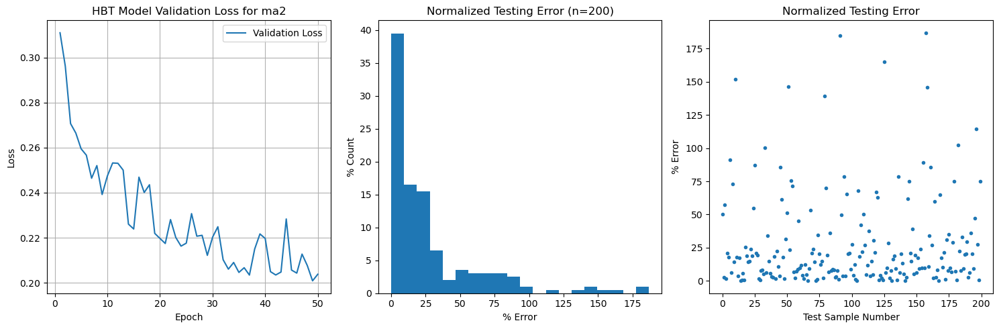

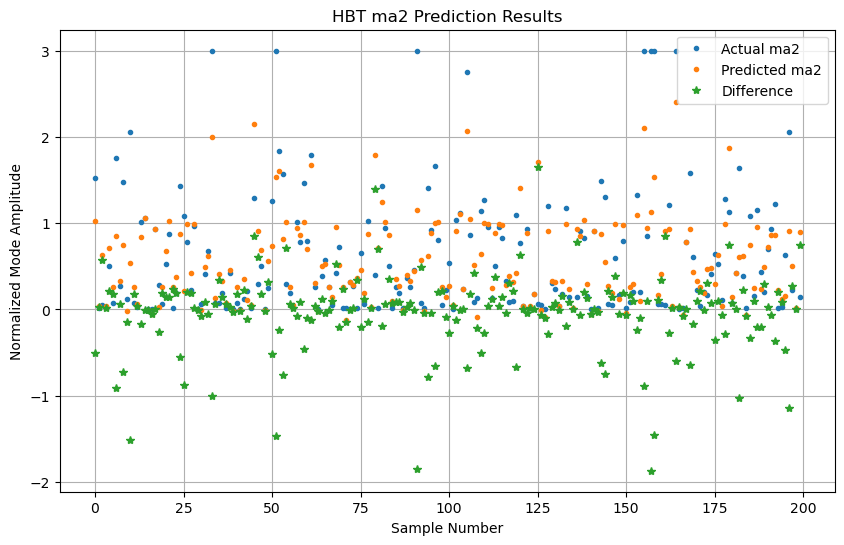

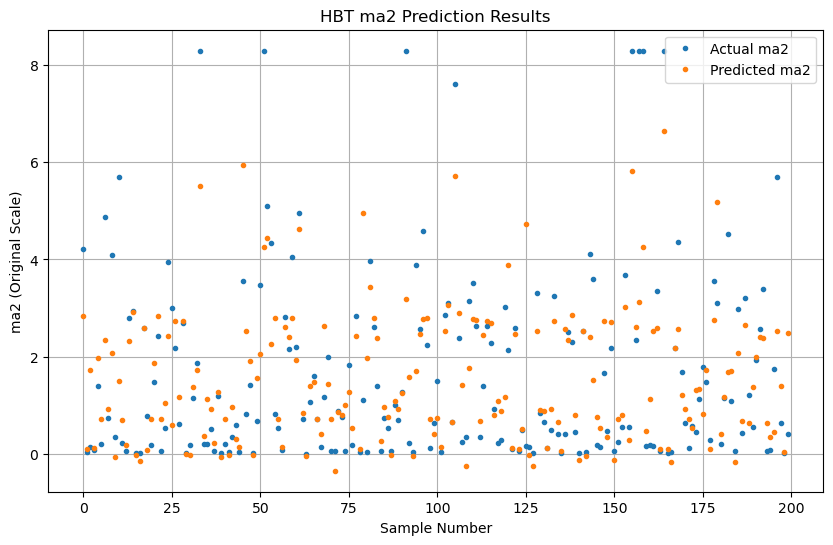

Maximum actual mode amplitude (normalized): 3.00
Maximum predicted mode amplitude (normalized): 2.40
Mean absolute percentage error: 27.53%


In [11]:
# Evaluate the model on test data
predictions = Model.predict(testing_inputs)

# Calculate prediction errors
prediction_errors = np.abs(testing_labels - predictions[:, 0]) * 100

# Create visualization plots
fig, axes = plt.subplots(figsize=(15, 5), ncols=3, nrows=1)

# Plot 1: Training History
axes[0].plot(range(1, len(history.history['val_loss']) + 1), 
             history.history['val_loss'], 
             label='Validation Loss')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].set_title(f'HBT Model Validation Loss for {selected_data_type}')
axes[0].legend()
axes[0].grid(True)

# Plot 2: Error Distribution
weights = np.ones_like(prediction_errors) / len(prediction_errors) * 100
axes[1].hist(prediction_errors, 20, weights=weights)
axes[1].set_xlabel('% Error')
axes[1].set_ylabel('% Count')
axes[1].set_title('Normalized Testing Error (n=200)')

# Plot 3: Error by Sample
axes[2].plot(prediction_errors, '.')
axes[2].set_xlabel('Test Sample Number')
axes[2].set_ylabel('% Error')
axes[2].set_title('Normalized Testing Error')
plt.tight_layout()
plt.show()

# Plot 4: Actual vs Predicted Values
plt.figure(figsize=(10, 6))
plt.plot(testing_labels, '.', label=f'Actual {selected_data_type}')
plt.plot(predictions[:, 0], '.', label=f'Predicted {selected_data_type}')
plt.plot(-(testing_labels - predictions[:, 0]), '*', label='Difference')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'HBT {selected_data_type} Prediction Results')
plt.legend()
plt.grid(True)
plt.show()

# Plot original scale predictions
plt.figure(figsize=(10, 6))
plt.plot(testing_labels * ma_norm, '.', label=f'Actual {selected_data_type}')
plt.plot(predictions[:, 0] * ma_norm, '.', label=f'Predicted {selected_data_type}')
plt.xlabel('Sample Number')
plt.ylabel(f'{selected_data_type} (Original Scale)')
plt.title(f'HBT {selected_data_type} Prediction Results')
plt.legend()
plt.grid(True)
plt.show()

print(f"Maximum actual mode amplitude (normalized): {np.max(np.abs(testing_labels)):.2f}")
print(f"Maximum predicted mode amplitude (normalized): {np.max(np.abs(predictions[:, 0])):.2f}")
print(f"Mean absolute percentage error: {np.mean(prediction_errors):.2f}%")

2.764687013626099
Shot 119671: Camera frames=800, HBT frames=800, Time frames=800
Shape of reserved_shot_cut_2d: (800, 32, 32)
Shape of camera_data: (800, 32, 32)
Input data shape: (800, 32, 32, 1)
Model output shape: (None, 1)


Predictions shape: (800,)


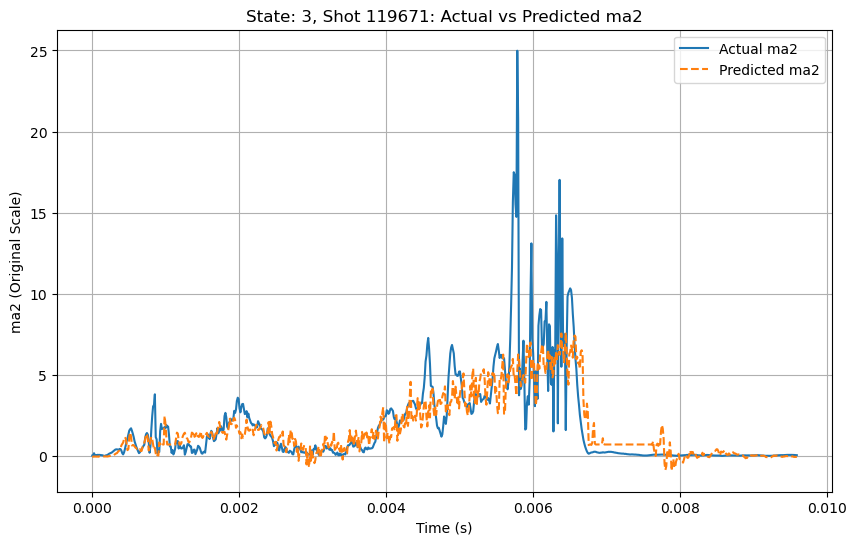

Shot 119671 - Mean absolute percentage error: 32.98%
Shot 119671 - Max actual ma2: 24.98
Shot 119671 - Max predicted ma2: 7.62


In [12]:
print(ma_norm)
def plot_RESERVED_SHOT_predictions(shot, shot_list, cut_training_data_2d, reserved_shot_cut_2d, hbt_dataType, hbt_time_data, model, ma_norm):
    """Plot actual vs predicted Mode 2 amplitude for the reserved shot."""
    if reserved_shot_cut_2d is None:
        print(f"No data available for reserved shot {shot}. No plot generated.")
        return
    
    shot_idx = shot_list.index(shot)
    camera_data = reserved_shot_cut_2d
    hbt_data = hbt_dataType[shot_idx][:, 0]
    time_data = hbt_time_data[shot_idx]

    print(f"Shot {shot}: Camera frames={len(camera_data)}, HBT frames={len(hbt_data)}, Time frames={len(time_data)}")
    print(f"Shape of reserved_shot_cut_2d: {reserved_shot_cut_2d.shape}")
    print(f"Shape of camera_data: {np.array(camera_data).shape}")

    if len(camera_data) == 0:
        print(f"No camera data for shot {shot}. No plot generated.")
        return
    
    if len(camera_data) != len(hbt_data):
        print(f"Warning: Camera data ({len(camera_data)} frames) does not match HBT data ({len(hbt_data)} frames)")

    input_data = np.array(camera_data).reshape(-1, 32, 32, 1)
    print(f"Input data shape: {input_data.shape}")
    print(f"Model output shape: {model.output_shape}")

    predictions = []
    batch_size = 100
    for i in range(0, len(input_data), batch_size):
        batch = input_data[i:i+batch_size]
        batch_pred = model.predict(batch, verbose=0)[:, 0] * ma_norm
        predictions.extend(batch_pred)
    predictions = np.array(predictions)
    print(f"Predictions shape: {predictions.shape}")

    # Rest of the plotting code...
    
    # Plot actual vs predicted using time data
    plt.figure(figsize=(10, 6))
    plt.plot(time_data, hbt_data, label=f'Actual {selected_data_type}')
    plt.plot(time_data, predictions, '--', label=f'Predicted {selected_data_type}')
    plt.xlabel('Time (s)')  # Assuming time is in seconds; adjust if needed
    plt.ylabel(f'{selected_data_type} (Original Scale)')
    plt.title(f'State: {state}, Shot {shot}: Actual vs Predicted {selected_data_type}')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Print metrics
    prediction_errors = np.abs(hbt_data - predictions) / ma_norm * 100
    print(f"Shot {shot} - Mean absolute percentage error: {np.mean(prediction_errors):.2f}%")
    print(f"Shot {shot} - Max actual {selected_data_type}: {np.max(np.abs(hbt_data)):.2f}")
    print(f"Shot {shot} - Max predicted {selected_data_type}: {np.max(np.abs(predictions)):.2f}")

    return predictions

reserved_predictions = plot_RESERVED_SHOT_predictions(
    RESERVED_SHOT, shot_list, cut_training_data_2D, reserved_shot_cut_2d, hbt_dataType, hbt_time_data, william_model, ma_norm
)

In [13]:
# Save true ma2 data, predictions, and time data for reserved shot
time_data = hbt_time_data[shot_list.index(RESERVED_SHOT)]

print(f"Untrimmed: Saving results for state {state}, shot {RESERVED_SHOT}")
print(f"True data defined: {'hbt_dataType' in locals()}, {'shot_list' in locals()}, {'RESERVED_SHOT' in locals()}")
print(f"Predictions defined: {'predictions' in locals()}, shape: {reserved_predictions.shape if 'predictions' in locals() else 'N/A'}")
print(f"Time data defined: {'hbt_time_data' in locals()}, shape: {hbt_time_data[shot_list.index(RESERVED_SHOT)].shape if 'hbt_time_data' in locals() else 'N/A'}")
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_true.npy', hbt_dataType[shot_list.index(RESERVED_SHOT)][:, 0])
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_pred.npy', reserved_predictions)
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_time.npy', time_data)
print("Done")

Untrimmed: Saving results for state 3, shot 119671
True data defined: True, True, True
Predictions defined: True, shape: (800,)
Time data defined: True, shape: (800,)
Done
